In [1]:
# read the data
import matplotlib.pyplot as plt
import numpy as np
#import pandas as pd 
import matplotlib
import sys     
import os
import glob
import mne
from mne.preprocessing import ICA
from scipy import stats
import seaborn as sns
import pandas as pd
#%matplotlib qt
sys.path.append(os.path.abspath('..'))
from utils import identify_bad_channels,remove_epochs_with_bad_mmn_channels, Average_in_trials_in_time_window,remove_or_interpolate_epochs_with_n_bad_chn
from stats_utils import extract_mmn_latencies,align_and_standardize_evokeds,extract_peak_amplitude,extract_mean_amplitudes,snap_times_to_evoked
from visualization import plot_erps
sys.path.append(os.path.abspath('..'))
from notifmmn import erputils

from scipy.stats import ttest_ind, ttest_rel
from statsmodels.stats.multitest import multipletests


In [2]:
print(mne.__version__)
print()

1.7.0



In [3]:
def collect_subject_stats_with_ttest(path, paired=True, correction='bonferroni'):
    """
    Load all subject files and:
      - Compute per-condition means/stds (PA, PL, TWMA)
      - Perform BN vs SN t-tests for PA and PL per subject/measure
      - Apply multiple-comparison correction (Bonferroni or FDR) separately per measure & metric

    Args:
        path (str): Folder containing CSV files.
        paired (bool): If True, use paired t-test (ttest_rel), else independent (ttest_ind).
        correction (str): 'bonferroni' or 'fdr_bh' for Benjamini–Hochberg.

    Returns:
        pd.DataFrame: Summary results with corrected p-values.
    """
    files = glob.glob(os.path.join(path, "*.csv"))
    file_map = {}

    # === Group files by (subject, measure) ===
    for file in files:
        fname = os.path.basename(file).replace(".csv", "")
        parts = fname.split("_")
        sub_id = parts[0]
        cond = parts[1]
        measure = parts[2].lower()
        case = parts[3] if len(parts) > 3 else None
        file_map.setdefault((sub_id, measure), {})[cond] = file

    results = []

    # === Process each subject & measure ===
    for (sub_id, measure), cond_files in file_map.items():
        if not all(k in cond_files for k in ["BN", "SN"]):
            continue  # skip incomplete pairs

        # Load condition data
        df_bn = pd.read_csv(cond_files["BN"])
        df_sn = pd.read_csv(cond_files["SN"])

        # Choose t-test type
        t_func = ttest_rel if paired else ttest_ind
        

        # Perform tests (BN vs SN)
        # Align BN vs SN for PA
        pa_aligned = pd.concat([df_bn["PA"], df_sn["PA"]], axis=1, join="inner").dropna()
        pa_t, pa_p = t_func(pa_aligned.iloc[:,0], pa_aligned.iloc[:,1])
        # Align BN vs SN for PL
        pl_aligned = pd.concat([df_bn["PL"], df_sn["PL"]], axis=1, join="inner").dropna()
        pl_t, pl_p = t_func(pl_aligned.iloc[:,0], pl_aligned.iloc[:,1])

        # Align BN vs SN for TWMA 
        twma_aligned = pd.concat([df_bn["TWMA"], df_sn["TWMA"]], axis=1, join="inner").dropna()
        twma_t, twma_p = t_func(twma_aligned.iloc[:,0], twma_aligned.iloc[:,1])
        # Store per-condition stats + t-test results
        results.append({
            "sub_id": sub_id,
            "measure": measure,
            "BN_PA_mean": df_bn["PA"].mean(),
            "BN_PA_std": df_bn["PA"].std(),
            "SN_PA_mean": df_sn["PA"].mean(),
            "SN_PA_std": df_sn["PA"].std(),
            "BN_PL_mean": df_bn["PL"].mean(),
            "BN_PL_std": df_bn["PL"].std(),
            "SN_PL_mean": df_sn["PL"].mean(),
            "SN_PL_std": df_sn["PL"].std(),
            "BN_TWMA_mean" : df_bn['TWMA'].mean(),
            "BN_TWMA_std" : df_bn['TWMA'].std(),
            "SN_TWMA_mean" : df_sn['TWMA'].mean(),
            "SN_TWMA_std" : df_sn['TWMA'].std(),
            "SN_FAL_mean" : df_sn['FAL_0.25'].mean(),
            "SN_FAL_std" : df_sn['FAL_0.25'].std(),
            "BN_FAL_mean" : df_bn['FAL_0.25'].mean(),
            "BN_FAL_std" : df_bn['FAL_0.25'].std(),
            "PA_tstat": pa_t,
            "PA_pval": pa_p,
            "PL_tstat": pl_t,
            "PL_pval": pl_p,
            "TWMA_tstat": twma_t,
            "TWMA_pval": twma_p,
        })

    results_df = pd.DataFrame(results)

    # === Apply multiple comparison correction separately per measure ===
    results_df["PA_pval_corrected"] = np.nan
    results_df["PL_pval_corrected"] = np.nan
    results_df["TWMA_pval_corrected"] = np.nan
    
    results_df["TWMA_significant"] = False
    results_df["PA_significant"] = False
    results_df["PL_significant"] = False

    for measure, group in results_df.groupby("measure"):
        pvals = group[["PA_pval", "PL_pval",'TWMA_pval']].iloc[0].values
        # Bonferroni: multiply by number of tests = 2
        pvals_corr = np.minimum(pvals * 2, 1.0)

        # Store back
        results_df.loc[group.index, "PA_pval_corrected"] = pvals_corr[0]
        results_df.loc[group.index, "PL_pval_corrected"] = pvals_corr[1]
        results_df.loc[group.index, "TWMA_pval_corrected"] = pvals_corr[2]

        # Significance with α = 0.05
        results_df.loc[group.index, "PA_significant"] = pvals_corr[0] < 0.05
        results_df.loc[group.index, "PL_significant"] = pvals_corr[1] < 0.05
        results_df.loc[group.index, "TWMA_significant"] = pvals_corr[2] < 0.05
    return results_df



path =  r"E:\ecf-exp2-notif-mmn\data\Processed\SME_scores"
score_df = collect_subject_stats_with_ttest(path)
score_df

c:\Users\Prakash\anaconda3\envs\EEG_analysis\Lib\site-packages\scipy\stats\_stats_py.py:1087: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
c:\Users\Prakash\anaconda3\envs\EEG_analysis\Lib\site-packages\scipy\stats\_stats_py.py:1087: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
c:\Users\Prakash\anaconda3\envs\EEG_analysis\Lib\site-packages\scipy\stats\_stats_py.py:1087: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
c:\Users\Prakash\anaconda3\envs\EEG_analysis\Lib\site-packages\scipy\stats\_stats_py.py:1087: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
c:\Users\Prakash\anaconda3\envs\EEG_analysis\Lib\site-packages\scipy\stats\_stats_py.py:1087: RuntimeWarning: divide by zero

,sub_id,measure,BN_PA_mean,BN_PA_std,SN_PA_mean,SN_PA_std,BN_PL_mean,BN_PL_std,SN_PL_mean,SN_PL_std,...,PL_tstat,PL_pval,TWMA_tstat,TWMA_pval,PA_pval_corrected,PL_pval_corrected,TWMA_pval_corrected,TWMA_significant,PA_significant,PL_significant
0,sub-sd011,n1dev,-3.776598,0.646648,-6.654657,1.075007,0.244627,0.019953,0.224125,0.010922,...,20.517448,3.191577e-68,36.516981,4.662106e-143,2.005438e-197,6.383154e-68,9.324211e-143,True,True,True
1,sub-sd011,n1lpp,2.526976,1.754247,1.763984,1.752255,0.324289,0.023016,0.364835,0.009720,...,-27.710769,1.320853e-82,-3.667061,2.716982e-04,6.733519e-11,2.641706e-82,5.433964e-04,True,True,True
2,sub-sd011,n1mmn,-4.134004,0.792619,-3.738444,1.139663,0.074258,0.024218,0.028008,0.018732,...,34.556636,4.067195e-133,1.252588,2.109424e-01,6.314834e-10,8.134390e-133,4.218848e-01,False,True,True
3,sub-sd011,n1noveltyp2,-0.264377,0.870198,-0.331359,1.161970,0.179707,0.015580,0.173427,0.013556,...,4.895412,1.886868e-06,42.257364,5.686795e-167,6.215052e-01,3.773736e-06,1.137359e-166,True,False,True
4,sub-sd011,n1noveltyp2fig2,-0.439267,0.876590,-0.658831,1.223875,0.165452,0.001953,0.160142,0.003877,...,8.021677,2.364423e-10,-26.795244,1.158965e-98,1.564830e-03,4.728847e-10,2.317930e-98,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,sub-sd067,n1noveltyp2parieto,0.484390,1.133920,2.705097,1.102545,0.208182,0.008412,0.173834,0.014911,...,15.703969,2.212660e-21,5.833560,9.765226e-09,2.627454e-01,6.399830e-02,5.394910e-121,True,False,False
546,sub-sd067,n1noveltyp2parietodelayedlpp,1.439427,1.070749,2.823809,1.106814,0.336523,0.006666,0.322493,0.009613,...,7.768341,1.498774e-10,20.426592,7.525979e-68,4.154798e-95,3.634063e-09,1.988674e-21,True,True,True
547,sub-sd067,n1stdp2,4.110164,0.420696,4.193486,0.497296,0.068078,0.004216,0.060680,0.002914,...,32.341304,1.507296e-124,-28.897184,1.258216e-108,2.186898e-218,3.733179e-138,1.864704e-176,True,True,True
548,sub-sd067,n1,-2.701920,0.438793,-4.343615,0.433019,0.210258,0.002469,0.248641,0.001230,...,-324.788105,0.000000e+00,10.712709,3.041901e-24,0.000000e+00,1.847876e-234,8.301132e-163,True,True,True


In [4]:
score_df['measure'].unique()

array(['n1dev', 'n1lpp', 'n1mmn', 'n1noveltyp2', 'n1noveltyp2fig2',
       'n1noveltyp2parieto', 'n1noveltyp2parietodelayedlpp', 'n1stdp2',
       'n1', 'p2'], dtype=object)

In [5]:
participant_info = pd.read_excel(f'E:/ecf-exp2-notif-mmn/data/Processed/Participant_details.xlsx')
participant_info['participant_id'] = participant_info['participant_id'].apply(lambda x: 'sub-' +str(x))

participant_info.head() 

,participant_id,age,is_controlled_block,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay
0,sub-sd011,30,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617
1,sub-sd012,25,N,M,PG_acd,SN,BT,NaN,No bad channel,Whoop_doop,0.036576
2,sub-sd013,25,N,M,PG_acd,SN,BT,NaN,TP10 noisy channel interpolated and further r...,Hello_inMoto,0.008617
3,sub-sd014,28,N,M,PG_acd,SN,BT,NaN,bad electrode = None Bad subject only very few...,droplet,0.034830
4,sub-sd015,31,N,M,PG_acd,SN,BT,NaN,bad electrode = None,realme_fun,0.006780


In [6]:
score_df = score_df.merge(participant_info, left_on="sub_id", right_on="participant_id")
score_df = score_df.dropna(axis=1, how='all')
score_df.head()

,sub_id,measure,BN_PA_mean,BN_PA_std,SN_PA_mean,SN_PA_std,BN_PL_mean,BN_PL_std,SN_PL_mean,SN_PL_std,...,age,is_controlled_block,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay
0,sub-sd011,n1dev,-3.776598,0.646648,-6.654657,1.075007,0.244627,0.019953,0.224125,0.010922,...,30,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617
1,sub-sd011,n1lpp,2.526976,1.754247,1.763984,1.752255,0.324289,0.023016,0.364835,0.009720,...,30,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617
2,sub-sd011,n1mmn,-4.134004,0.792619,-3.738444,1.139663,0.074258,0.024218,0.028008,0.018732,...,30,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617
3,sub-sd011,n1noveltyp2,-0.264377,0.870198,-0.331359,1.161970,0.179707,0.015580,0.173427,0.013556,...,30,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617
4,sub-sd011,n1noveltyp2fig2,-0.439267,0.876590,-0.658831,1.223875,0.165452,0.001953,0.160142,0.003877,...,30,N,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617


In [7]:
data_folder = r"D:\Work_data\Notification_evoked_response\Data_at_IITD/bids_data\phenotype"
mppus= pd.read_csv(os.path.join(data_folder,"mppus_responses.tsv"),sep = '\t')
mppus['MPPUS_score'] = mppus.iloc[:, 1:].sum(axis=1)
sas = pd.read_csv(os.path.join(data_folder,"sas_responses.tsv"),sep = '\t')

sas['SAS_score'] = sas.iloc[:, 1:].sum(axis=1)
other = pd.read_csv(os.path.join(data_folder,"other_responses.tsv"),sep = '\t')

sas = sas[sas['participant_id'].str.contains("sd0")]
sas['participant_id'] = sas['participant_id'].apply(lambda x: "sub-"+x)

score_df= score_df.merge(sas[['participant_id', 'SAS_score']],left_on='sub_id',right_on='participant_id',how='left')
score_df.head()

,sub_id,measure,BN_PA_mean,BN_PA_std,SN_PA_mean,SN_PA_std,BN_PL_mean,BN_PL_std,SN_PL_mean,SN_PL_std,...,gender,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,participant_id_y,SAS_score
0,sub-sd011,n1dev,-3.776598,0.646648,-6.654657,1.075007,0.244627,0.019953,0.224125,0.010922,...,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN
1,sub-sd011,n1lpp,2.526976,1.754247,1.763984,1.752255,0.324289,0.023016,0.364835,0.009720,...,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN
2,sub-sd011,n1mmn,-4.134004,0.792619,-3.738444,1.139663,0.074258,0.024218,0.028008,0.018732,...,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN
3,sub-sd011,n1noveltyp2,-0.264377,0.870198,-0.331359,1.161970,0.179707,0.015580,0.173427,0.013556,...,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN
4,sub-sd011,n1noveltyp2fig2,-0.439267,0.876590,-0.658831,1.223875,0.165452,0.001953,0.160142,0.003877,...,M,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN


In [8]:
score_df.columns

Index(['sub_id', 'measure', 'BN_PA_mean', 'BN_PA_std', 'SN_PA_mean',
       'SN_PA_std', 'BN_PL_mean', 'BN_PL_std', 'SN_PL_mean', 'SN_PL_std',
       'BN_TWMA_mean', 'BN_TWMA_std', 'SN_TWMA_mean', 'SN_TWMA_std',
       'SN_FAL_mean', 'SN_FAL_std', 'BN_FAL_mean', 'BN_FAL_std', 'PA_tstat',
       'PA_pval', 'PL_tstat', 'PL_pval', 'TWMA_tstat', 'TWMA_pval',
       'PA_pval_corrected', 'PL_pval_corrected', 'TWMA_pval_corrected',
       'TWMA_significant', 'PA_significant', 'PL_significant',
       'participant_id_x', 'age ', 'is_controlled_block', 'gender',
       'profession', 'b1_deviant', 'b2_deviant', 'b3_deviant', 'comments',
       'SN_tone', 'Tone_delay', 'participant_id_y', 'SAS_score'],
      dtype='object')

In [9]:
score_df.to_csv("score_df.csv")

# Subject Selection

## N1 Peak

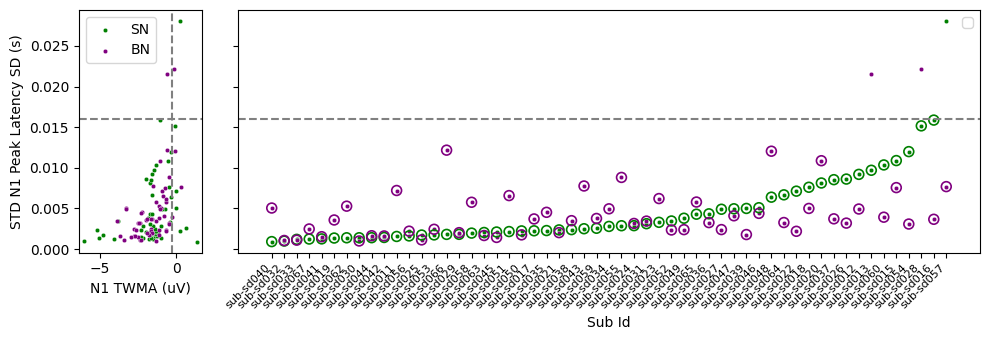

In [10]:
n1_pl_sem_thresh = 0.016
n1_twma_mean_thresh = -0.25

# Filter DEV case only
STD_subjects = score_df[score_df['measure'] == "n1"].copy()

# Order subjects by SN's PL_std
subject_order = (STD_subjects.sort_values("SN_PL_std")["sub_id"].tolist())

# Make categorical to enforce order
STD_subjects["sub_id"] = pd.Categorical(STD_subjects["sub_id"],categories=subject_order,ordered=True)
STD_subjects = STD_subjects.sort_values("sub_id")

# Subset of passed subjects
n1_passed_SN_subjects = STD_subjects[STD_subjects["SN_PL_std"] < n1_pl_sem_thresh].copy()
n1_passed_BN_subjects = STD_subjects[STD_subjects["BN_PL_std"] < n1_pl_sem_thresh].copy()
# --- Create figure ---
f, axes = plt.subplots(1, 2, figsize=(10, 3.5), tight_layout=True, width_ratios=[1, 6], sharey=True)

# Left panel: TWMA vs PL_std
sns.scatterplot(data=STD_subjects,x="SN_TWMA_mean",y="SN_PL_std",s=10,ax=axes[0],color='green')
sns.scatterplot(data=STD_subjects,x="BN_TWMA_mean",y="BN_PL_std",s=10,ax=axes[0],color='purple')
                #hue="condition",palette= {"BN": "purple", "SN": "green"}, s=10,ax=axes[0])
axes[0].set_ylabel("STD N1 Peak Latency SD (s)")
axes[0].set_xlabel("N1 TWMA (uV)")
axes[0].axvline(n1_twma_mean_thresh, c="gray", ls="--")
axes[0].axhline(n1_pl_sem_thresh, c="gray", ls="--")

axes[0].legend(["SN", "BN"], title="", loc="best")

# Right panel: PL_std by subject (sorted)
sns.scatterplot(data=STD_subjects,x="sub_id", y="SN_PL_std",color='green',s=10, ax=axes[1])
sns.scatterplot(data=STD_subjects,x="sub_id", y="BN_PL_std",color='purple',s=10, ax=axes[1])

# Apply subject order
# Overlay hollow markers for passed subjects
axes[1].scatter(n1_passed_SN_subjects["sub_id"], n1_passed_SN_subjects["SN_PL_std"],facecolors="none", edgecolors='green',s=50, marker="o", linewidth=1.2,label=None)
axes[1].scatter(n1_passed_BN_subjects["sub_id"], n1_passed_BN_subjects["BN_PL_std"],facecolors="none", edgecolors='purple',s=50, marker="o", linewidth=1.2,label=None)


axes[1].set_xticks(range(len(subject_order)))
axes[1].set_xticklabels(subject_order, rotation=45, fontsize=8,ha='right')



axes[1].axhline(n1_pl_sem_thresh, c="gray", ls="--")
axes[1].set_ylabel("N1 PL_std (s)")
axes[1].set_xlabel("Sub Id")
# Fix legend duplicates
handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(handles[:2], labels[:2], loc="best")

plt.tight_layout()
plt.show()

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1702271308.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc="best")


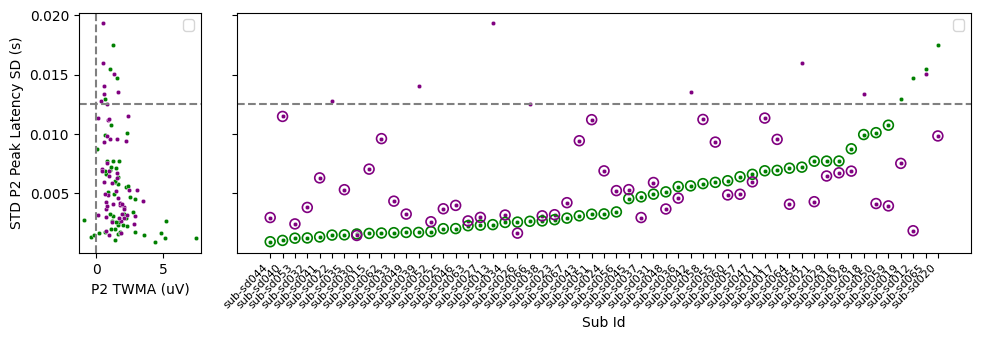

In [11]:
p2_pl_sem_thresh = 0.0125  ## for backup data 0.0125 giving signifacance results 
p2_twma_mean_thresh = -0

# Filter DEV case only
STD_subjects = score_df[score_df['measure'] == "n1stdp2"].copy()

# Order subjects by SN's PL_std
subject_order = (STD_subjects.sort_values("SN_PL_std")["sub_id"].tolist())

# Make categorical to enforce order
STD_subjects["sub_id"] = pd.Categorical(STD_subjects["sub_id"],categories=subject_order,ordered=True)
STD_subjects = STD_subjects.sort_values("sub_id")

# Subset of passed subjects
p2_passed_SN_subjects = STD_subjects[STD_subjects["SN_PL_std"] < p2_pl_sem_thresh].copy()
p2_passed_BN_subjects = STD_subjects[STD_subjects["BN_PL_std"] < p2_pl_sem_thresh].copy()

# --- Create figure ---
f, axes = plt.subplots(1, 2, figsize=(10, 3.5), tight_layout=True, width_ratios=[1, 6], sharey=True)

# Left panel: TWMA vs PL_std
sns.scatterplot(data=STD_subjects,x="SN_TWMA_mean",y="SN_PL_std",s=10,ax=axes[0],color='green')
sns.scatterplot(data=STD_subjects,x="BN_TWMA_mean",y="BN_PL_std",s=10,ax=axes[0],color='purple')
                #hue="condition",palette= {"BN": "purple", "SN": "green"}, s=10,ax=axes[0])
axes[0].set_ylabel("STD P2 Peak Latency SD (s)")
axes[0].set_xlabel("P2 TWMA (uV)")
axes[0].axvline(p2_twma_mean_thresh, c="gray", ls="--")
axes[0].axhline(p2_pl_sem_thresh, c="gray", ls="--")
axes[0].legend(loc="best")

# Right panel: PL_std by subject (sorted)
sns.scatterplot(data=STD_subjects,x="sub_id", y="SN_PL_std",color='green',s=10, ax=axes[1])
sns.scatterplot(data=STD_subjects,x="sub_id", y="BN_PL_std",color='purple',s=10, ax=axes[1])

# Apply subject order
# Overlay hollow markers for passed subjects
axes[1].scatter(p2_passed_SN_subjects["sub_id"], p2_passed_SN_subjects["SN_PL_std"],facecolors="none", edgecolors='green',s=50, marker="o", linewidth=1.2,label=None)
axes[1].scatter(p2_passed_BN_subjects["sub_id"], p2_passed_BN_subjects["BN_PL_std"],facecolors="none", edgecolors='purple',s=50, marker="o", linewidth=1.2,label=None)


axes[1].set_xticks(range(len(subject_order)))
axes[1].set_xticklabels(subject_order, rotation=45, fontsize=8,ha='right')



axes[1].axhline(p2_pl_sem_thresh, c="gray", ls="--")
axes[1].set_ylabel("P2 PL_std (s)")
axes[1].set_xlabel("Sub Id")
# Fix legend duplicates
handles, labels = axes[1].get_legend_handles_labels()
axes[1].legend(handles[:2], labels[:2], loc="best")

plt.tight_layout()
plt.show()

## P2 peak

In [12]:
# subject that have p2_pl_sem_thresh  


# --- For N1 measure ---
valid_n1 = (
    score_df.query("measure == 'n1'")
    .assign(both_ok=lambda d: (d['BN_PL_std'] < n1_pl_sem_thresh) & (d['SN_PL_std'] < n1_pl_sem_thresh))
    .set_index('sub_id')['both_ok']
)

# --- For P2 measure ---
valid_p2 = (
    score_df.query("measure == 'n1stdp2'")
    .assign(both_ok=lambda d: (d['BN_PL_std'] < p2_pl_sem_thresh) & (d['SN_PL_std'] < p2_pl_sem_thresh))
    .set_index('sub_id')['both_ok']
)

# --- Subjects that pass both N1 and P2 thresholds ---
valid_subs = valid_n1[valid_n1].index.intersection(valid_p2[valid_p2].index)

# --- Filter score_df to include only those valid subjects ---
filtered_df = score_df[score_df['sub_id'].isin(valid_subs)]

print(f"Number of valid subjects: {len(filtered_df['sub_id'].unique())}")


Number of valid subjects: 42


In [13]:
filtered_df['sub_id'].unique()

array(['sub-sd011', 'sub-sd015', 'sub-sd016', 'sub-sd017', 'sub-sd021',
       'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd027',
       'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033',
       'sub-sd034', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038',
       'sub-sd040', 'sub-sd041', 'sub-sd043', 'sub-sd044', 'sub-sd045',
       'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd050',
       'sub-sd051', 'sub-sd052', 'sub-sd053', 'sub-sd055', 'sub-sd056',
       'sub-sd058', 'sub-sd059', 'sub-sd060', 'sub-sd062', 'sub-sd063',
       'sub-sd064', 'sub-sd067'], dtype=object)

In [14]:
#filtered_df.to_csv("filtered_df.csv")

In [15]:
df = filtered_df[filtered_df['measure'] == "n1"].copy()

In [16]:
import pandas as pd

# Total participants
N = len(df)

# Age statistics
age_mean = df['age '].mean()
age_sd = df['age '].std()
age_min = df['age '].min()
age_max = df['age '].max()

# Gender counts
gender_counts = df['gender'].value_counts()

# Profession counts
prof_counts = df['profession'].value_counts()

# Build table rows
rows = []

# Gender
for gender in ['M', 'F']:
    n = gender_counts.get(gender, 0)
    rows.append([
        'Gender',
        'Male' if gender == 'M' else 'Female',
        f'{n} ({100*n/N:.1f}%)'
    ])

# Profession / Education
prof_map = {
    'UG_acd': 'Undergraduate students',
    'PG_acd': 'Postgraduate students',
    'non_acd': 'Non-academic staff'
}

for prof in ['UG_acd', 'PG_acd', 'non_acd']:
    n = prof_counts.get(prof, 0)
    rows.append([
        'Education / Occupation',
        prof_map[prof],
        f'{n} ({100*n/N:.1f}%)'
    ])

# Age statistics
rows.append([
    'Age (years)',
    'Mean ± SD',
    f'{age_mean:.1f} ± {age_sd:.1f}'
])

rows.append([
    'Age (years)',
    'Range',
    f'{age_min}–{age_max}'
])

# Create dataframe
demo_table = pd.DataFrame(
    rows,
    columns=['Characteristic', 'Category', 'Value']
)

print(f"\nDemographic characteristics of participants included in the final analysis (N = {N})\n")
print(demo_table.to_string(index=False))


Demographic characteristics of participants included in the final analysis (N = 42)

        Characteristic               Category      Value
                Gender                   Male 30 (71.4%)
                Gender                 Female 12 (28.6%)
Education / Occupation Undergraduate students 20 (47.6%)
Education / Occupation  Postgraduate students 11 (26.2%)
Education / Occupation     Non-academic staff 11 (26.2%)
           Age (years)              Mean ± SD 25.3 ± 5.6
           Age (years)                  Range      18–48


## Group HSU and LSU column

In [17]:
low_sub_D  =['sd012', 'sd014', 'sd017', 'sd019', 'sd021', 'sd023', 'sd027', 'sd032', 'sd043', 'sd044', 'sd046', 'sd052', 'sd053', 'sd061', 'sd064']
low_sub_D = ["sub-"+sub for sub in low_sub_D ]
avg_sub_D = ['sd011', 'sd013', 'sd015', 'sd016', 'sd020', 'sd022', 'sd024', 'sd025', 'sd026', 'sd028', 'sd030', 'sd031', 'sd034', 'sd036', 'sd040', 'sd045', 'sd047', 'sd048', 'sd049', 'sd051', 'sd055', 'sd057', 'sd058', 'sd060', 'sd063', 'sd066', 'sd065', 'sd067']
avg_sub_D = ["sub-"+sub for sub in avg_sub_D]
high_sub_D = ['sd018', 'sd029', 'sd033', 'sd035', 'sd037', 'sd038', 'sd039', 'sd041', 'sd042', 'sd050', 'sd054', 'sd056', 'sd059', 'sd062']
high_sub_D  = ["sub-"+sub for sub in high_sub_D  ]

In [18]:
len(high_sub_D)

14

In [19]:
# low_sub_D = ['sub-sd011', 'sub-sd012', 'sub-sd014', 'sub-sd017', 'sub-sd019', 'sub-sd021', 'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd027', 'sub-sd031', 'sub-sd032', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd048', 'sub-sd052', 'sub-sd053', 'sub-sd057', 'sub-sd060', 'sub-sd061', 'sub-sd063', 'sub-sd064']
# avg_sub_D = ['sub-sd013', 'sub-sd018', 'sub-sd020', 'sub-sd026', 'sub-sd043', 'sub-sd047', 'sub-sd055', 'sub-sd058', 'sub-sd066', 'sub-sd065', 'sub-sd067']
# high_sub_D= ['sub-sd015', 'sub-sd016', 'sub-sd022', 'sub-sd028', 'sub-sd029', 'sub-sd030', 'sub-sd033', 'sub-sd034', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd039', 'sub-sd040', 'sub-sd041', 'sub-sd042', 'sub-sd049', 'sub-sd050', 'sub-sd051', 'sub-sd054', 'sub-sd056', 'sub-sd059', 'sub-sd062']

In [20]:


filtered_df['group'] = np.select([filtered_df['sub_id'].isin(low_sub_D), filtered_df['sub_id'].isin(avg_sub_D),
                                      filtered_df['sub_id'].isin(high_sub_D)],['LSU','ASU','HSU'],default='unknown')
len(filtered_df[filtered_df['group']=='LSU'])
low_sub = filtered_df[filtered_df['group']=='LSU']['sub_id'].unique()
high_sub = filtered_df[filtered_df['group']=='HSU']['sub_id'].unique()
avg_sub = filtered_df[filtered_df['group']=='ASU']['sub_id'].unique()
print(len(low_sub), len(high_sub),len(avg_sub))

11 10 21


C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\3769831899.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['group'] = np.select([filtered_df['sub_id'].isin(low_sub_D), filtered_df['sub_id'].isin(avg_sub_D),


In [21]:
print(len(low_sub), len(high_sub))

11 10


In [22]:

def plot_bn_vs_sn(df, metric="PL", title="BN vs SN",stat_test = "t-test",u_id = 'sub_id',col_id = "sub_id",
                   highlight_sig=False,highlight_sig_col=None, ax=None,default_color= 'green',box_location= ( 0.05, 0.8)):
    """
    Scatter plot of BN vs SN metric with error bars and x=y line.

    Parameters
    ----------
    df : pd.DataFrame
        Data with subject, BN/SN means and stds, optionally 'significant'.
    metric : str
        "PL" or "PA".
    title : str
        Title of the plot.
    highlight_sig : bool
        If True and 'significant' column exists, significant subjects darker.
    ax : matplotlib.axes.Axes, optional
        If given, plot inside this subplot. Otherwise create new figure.
    """
    # Create axis if not passed
    if ax is None:
        fig, ax = plt.subplots(figsize=(7, 7))
    
    x = df[f"BN_{metric}_mean"]
    y = df[f"SN_{metric}_mean"]
    xerr = df[f"BN_{metric}_std"]
    yerr = df[f"SN_{metric}_std"]
    print(f'BN stats ({metric})\n mean : {x.mean()} std : {x.std()}')
    print(f'SN stats({metric}) \n mean : {y.mean()} std : {y.std()};std sum {yerr.std()}')
    
    # Assign distinct colors per subject
    # ----- Handle color assignment -----
    if col_id is not None:
        # Assign distinct colors per category
        palette = sns.color_palette("Set2", n_colors=df[col_id].nunique())
        subj_to_color = dict(zip(df[col_id].unique(), palette))
    else:
        # No column specified → single fallback color or per-row random color
        default_color = default_color 
        subj_to_color = default_color
    # Plot each subject
    for _, row in df.iterrows():
        print(row)
        if highlight_sig:
            alpha = .8 if row[highlight_sig_col] else 0.3
        else:
            alpha = 0.7
        # choose color depending on col_id
        if col_id is not None:
            color = subj_to_color[row[col_id]]
        else:
            color = default_color

        ax.errorbar(
            row[f"BN_{metric}_mean"], row[f"SN_{metric}_mean"],
            xerr=row[f"BN_{metric}_std"], yerr=row[f"SN_{metric}_std"],
            fmt="o", color=color,
            ecolor=color,
            elinewidth=1.5, capsize=3, alpha=alpha,
        )
    # Statistical test: t-test or Wilcoxon
    print(len(x.dropna()), len (x.dropna()))
    if stat_test == "t-test":
        try: 
            stat, pval = ttest_rel(x.dropna(), y.dropna())
        except:
            stat, pval = ttest_ind(x.dropna(), y.dropna())
        test_label = f"t = {stat:.2f}\np = {pval:.3f}"
    
    elif stat_test == "wilcoxon":
        stat, pval = wilcoxon(x.dropna(), y.dropna())
        test_label = f"w = {stat:.2f}\np = {pval:.3f}"
    else:
        raise ValueError(f"Invalid stat_test '{stat_test}'. Use 't-test' or 'wilcoxon'.")
    print(f'{metric} : {test_label}')
    # Add test result to the plot
    ax.text(
        box_location[0], box_location[1],
        test_label,
        transform=ax.transAxes,
        ha="left", va="bottom",
        fontsize=18, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )
    # Reference line
    lims = [min(x.min(), y.min())*0.9, max(x.max(), y.max())*1.1]
    ax.plot(lims, lims, "k--", alpha=0.8, label="x = y")
    
    # Labels
    label = {
        "PA_mean": "PA ($\\mu V$)",
        "PA_std":  "PA ($\\mu V$)",
        "PL_mean": "PL (ms)",
        "PL_std":  "PL (ms)",
        "FAL_mean": "FAL (ms)",
        "TWMA_mean": "TWMA ($\\mu V$)",
        
    }
    ax.set_xlabel(f"BN {label[f'{metric}_mean']}")
    ax.set_ylabel(f"SN {label[f'{metric}_mean']}")
    #ax.set_title(f"{title}, {label[f'{metric}_mean']}")

    
    ax.axis("equal")

    # Only show if function made the figure
    if ax is None:
        plt.tight_layout()
        plt.show()


In [23]:
filtered_df[(filtered_df['measure'] == 'p2') ]['SN_PL_mean'].mean() - filtered_df[(filtered_df['measure'] == 'n1') ]['SN_PL_mean'].mean()

np.float64(-0.1759938365983933)

In [24]:
filtered_df

,sub_id,measure,BN_PA_mean,BN_PA_std,SN_PA_mean,SN_PA_std,BN_PL_mean,BN_PL_std,SN_PL_mean,SN_PL_std,...,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,participant_id_y,SAS_score,group
0,sub-sd011,n1dev,-3.776598,0.646648,-6.654657,1.075007,0.244627,0.019953,0.224125,0.010922,...,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU
1,sub-sd011,n1lpp,2.526976,1.754247,1.763984,1.752255,0.324289,0.023016,0.364835,0.009720,...,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU
2,sub-sd011,n1mmn,-4.134004,0.792619,-3.738444,1.139663,0.074258,0.024218,0.028008,0.018732,...,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU
3,sub-sd011,n1noveltyp2,-0.264377,0.870198,-0.331359,1.161970,0.179707,0.015580,0.173427,0.013556,...,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU
4,sub-sd011,n1noveltyp2fig2,-0.439267,0.876590,-0.658831,1.223875,0.165452,0.001953,0.160142,0.003877,...,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,sub-sd067,n1noveltyp2parieto,0.484390,1.133920,2.705097,1.102545,0.208182,0.008412,0.173834,0.014911,...,UG_acd,CN,SN,BT,"bad electrode = CP5, Fp2, C1",Whoop_doop,0.036576,NaN,NaN,ASU
546,sub-sd067,n1noveltyp2parietodelayedlpp,1.439427,1.070749,2.823809,1.106814,0.336523,0.006666,0.322493,0.009613,...,UG_acd,CN,SN,BT,"bad electrode = CP5, Fp2, C1",Whoop_doop,0.036576,NaN,NaN,ASU
547,sub-sd067,n1stdp2,4.110164,0.420696,4.193486,0.497296,0.068078,0.004216,0.060680,0.002914,...,UG_acd,CN,SN,BT,"bad electrode = CP5, Fp2, C1",Whoop_doop,0.036576,NaN,NaN,ASU
548,sub-sd067,n1,-2.701920,0.438793,-4.343615,0.433019,0.210258,0.002469,0.248641,0.001230,...,UG_acd,CN,SN,BT,"bad electrode = CP5, Fp2, C1",Whoop_doop,0.036576,NaN,NaN,ASU


In [25]:


# Filter for mmn
mmn_filtered_df = filtered_df[(filtered_df['measure'] == 'n1mmn') ] # remove the subject with vibration & (filtered_df['SN_PL_mean'] <0.4 )

mmn_filtered_df.head()

,sub_id,measure,BN_PA_mean,BN_PA_std,SN_PA_mean,SN_PA_std,BN_PL_mean,BN_PL_std,SN_PL_mean,SN_PL_std,...,profession,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,participant_id_y,SAS_score,group
2,sub-sd011,n1mmn,-4.134004,0.792619,-3.738444,1.139663,0.074258,0.024218,0.028008,0.018732,...,PG_acd,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU
32,sub-sd015,n1mmn,-2.374648,0.872615,-1.291215,0.902627,0.037717,0.012631,0.049234,0.017950,...,PG_acd,SN,BT,NaN,bad electrode = None,realme_fun,0.006780,NaN,NaN,ASU
42,sub-sd016,n1mmn,-4.263930,0.862598,-7.003926,0.890247,0.030851,0.010099,0.009888,0.008160,...,PG_acd,SN,BT,NaN,NaN,Whoop_doop,0.036576,NaN,NaN,ASU
52,sub-sd017,n1mmn,-1.989663,0.979853,-4.138813,1.028117,0.062355,0.015664,0.019434,0.026147,...,PG_acd,SN,BT,NaN,NaN,spaceline,0.006485,NaN,NaN,LSU
92,sub-sd021,n1mmn,-3.253909,0.756655,-3.348324,0.654350,0.057973,0.006269,0.018712,0.013452,...,PG_acd,SN,BT,NaN,NaN,voyar,0.006689,NaN,NaN,LSU


# SN vs BN MMN latency and amplitude 

In [26]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel, wilcoxon

def get_stats_dict(filtered_df, measure, metric):
    # Filter by the given measure
    df_measure = filtered_df[filtered_df['measure'] == measure]

    # Columns for signal (SN) and baseline (BN)
    sn_mean_col = f"SN_{metric}_mean"
    bn_mean_col = f"BN_{metric}_mean"
    sn_std_col = f"SN_{metric}_std"
    bn_std_col = f"BN_{metric}_std"
    
    # Extract and align paired values (drop NaNs in either column)
    paired_means = df_measure[[sn_mean_col, bn_mean_col]].dropna()
    sn_means = paired_means[sn_mean_col]
    bn_means = paired_means[bn_mean_col]

    paired_stds = df_measure[[sn_std_col, bn_std_col]].dropna()
    sn_stds = paired_stds[sn_std_col]
    bn_stds = paired_stds[bn_std_col]

    # Compute statistics (only if enough samples exist)
    if len(sn_means) > 1:
        t_stat, t_p_val = ttest_rel(sn_means, bn_means)
        w_stat, w_p_val = wilcoxon(sn_means, bn_means)
    else:
        t_stat = t_p_val = w_stat = w_p_val = np.nan

    return {
        "measure": measure,
        "metric": metric,
        "SN_mean": float(np.mean(sn_means)) if not sn_means.empty else np.nan,
        "BN_mean": float(np.mean(bn_means)) if not bn_means.empty else np.nan,
        "SN_std": float(np.mean(sn_stds)) if not sn_stds.empty else np.nan,
        "BN_std": float(np.mean(bn_stds)) if not bn_stds.empty else np.nan,
        "t-test": t_stat,
        "t_p_val": t_p_val,
        "wilcoxon": w_stat,
        "w_p_val": w_p_val,
    }


def build_stats_df(filtered_df):
    # Identify all unique measures and metrics in the DataFrame
    measures = filtered_df['measure'].unique()
    metrics = set(col.split('_')[1] for col in filtered_df.columns if 'SN_' in col and '_mean' in col)

    # Collect all results
    results = []
    for measure in measures:
        for metric in metrics:
            try:
                result = get_stats_dict(filtered_df, measure, metric)
                results.append(result)
            except KeyError:
                # Skip if metric columns are missing for the measure
                continue

    # Convert list of dicts to DataFrame
    return pd.DataFrame(results)

# Usage example
stats_df = build_stats_df(filtered_df)
stats_df


,measure,metric,SN_mean,BN_mean,SN_std,BN_std,t-test,t_p_val,wilcoxon,w_p_val
0,n1dev,FAL,0.241515,0.211735,0.004573,0.005266,2.886825,0.006184,188.0,0.000685
1,n1dev,PL,0.252375,0.228236,0.004647,0.006807,2.529365,0.015367,266.0,0.019601
2,n1dev,PA,-5.948144,-4.394878,0.958564,0.880227,-4.049078,0.000223,165.0,0.000194
3,n1dev,TWMA,-2.803615,-2.176458,0.408803,0.392847,-1.719662,0.093036,267.0,0.020300
4,n1lpp,FAL,0.374323,0.361701,0.020744,0.025199,1.887689,0.066160,302.0,0.062002
5,n1lpp,PL,0.355026,0.347109,0.018053,0.017431,1.365110,0.179663,331.0,0.134570
6,n1lpp,PA,2.648690,1.043691,1.502842,1.486101,2.220251,0.031989,269.0,0.021762
7,n1lpp,TWMA,-0.099173,0.089452,0.550390,0.550070,-0.733132,0.467649,369.0,0.308625
8,n1mmn,FAL,0.039818,0.044398,0.013010,0.015700,-0.921753,0.362050,366.0,0.291127
9,n1mmn,PL,0.027745,0.037616,0.010929,0.010882,-3.156891,0.002988,233.0,0.005549


In [27]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel, wilcoxon
from statsmodels.stats.multitest import multipletests


def get_stats_dict(filtered_df, measure, metric):
    # Filter by the given measure
    df_measure = filtered_df[filtered_df['measure'] == measure]

    # Columns for signal (SN) and baseline (BN)
    sn_mean_col = f"SN_{metric}_mean"
    bn_mean_col = f"BN_{metric}_mean"
    sn_std_col = f"SN_{metric}_std"
    bn_std_col = f"BN_{metric}_std"

    # Extract and align paired values (drop NaNs in either column)
    paired_means = df_measure[[sn_mean_col, bn_mean_col]].dropna()
    sn_means = paired_means[sn_mean_col]
    bn_means = paired_means[bn_mean_col]

    paired_stds = df_measure[[sn_std_col, bn_std_col]].dropna()
    sn_stds = paired_stds[sn_std_col]
    bn_stds = paired_stds[bn_std_col]

    # Compute statistics (only if enough samples exist)
    if len(sn_means) > 1:
        t_stat, t_p_val = ttest_rel(sn_means, bn_means)
        w_stat, w_p_val = wilcoxon(sn_means, bn_means)
    else:
        t_stat = t_p_val = w_stat = w_p_val = np.nan

    return {
        "measure": measure,
        "metric": metric,
        "n_pairs": int(len(sn_means)),
        "SN_mean": float(np.mean(sn_means)) if not sn_means.empty else np.nan,
        "BN_mean": float(np.mean(bn_means)) if not bn_means.empty else np.nan,
        "SN_std": float(np.mean(sn_stds)) if not sn_stds.empty else np.nan,
        "BN_std": float(np.mean(bn_stds)) if not bn_stds.empty else np.nan,
        "t-test": t_stat,
        "t_p_val": t_p_val,
        "wilcoxon": w_stat,
        "w_p_val": w_p_val,
    }


def _apply_correction(df, p_col, corrected_col, reject_col, method, alpha):
    """Correct the p-values in `p_col` across all rows of `df` (one family of tests).

    NaN p-values (e.g. too few samples) are passed through untouched and are
    excluded from the comparison count, so they don't inflate the correction.
    """
    df[corrected_col] = np.nan
    df[reject_col] = pd.NA

    valid = df[p_col].notna()
    pvals = df.loc[valid, p_col].to_numpy()
    if pvals.size == 0:
        return df

    reject, p_corr, _, _ = multipletests(pvals, alpha=alpha, method=method)
    df.loc[valid, corrected_col] = p_corr
    df.loc[valid, reject_col] = reject  # True == significant after correction
    return df


def build_stats_df(filtered_df, correction_method="bonferroni",
                   alpha=0.05, group_cols=None):
    """
    Parameters
    ----------
    correction_method : str or None
        Any method accepted by statsmodels' multipletests, e.g.
        'bonferroni', 'holm', 'fdr_bh' (Benjamini-Hochberg), 'sidak'.
        Pass None to skip correction entirely.
    alpha : float
        Family-wise (or FDR) error rate used for the significance flags.
    group_cols : list[str] or None
        Columns defining each correction "family". None corrects across every
        test at once (the most conservative). e.g. ['metric'] corrects within
        each metric separately. Choose this to match how you frame your
        hypotheses — it materially changes the corrected p-values.

    Added columns
    -------------
    t_p_corrected / w_p_corrected : corrected p-values
    t_significant / w_significant : bool, significant at `alpha` after correction
    """
    # Identify all unique measures and metrics in the DataFrame
    measures = filtered_df['measure'].unique()
    metrics = set(col.split('_')[1] for col in filtered_df.columns
                  if 'SN_' in col and '_mean' in col)

    # Collect all per-test results first (correction needs the whole family)
    results = []
    for measure in measures:
        for metric in metrics:
            try:
                results.append(get_stats_dict(filtered_df, measure, metric))
            except KeyError:
                # Skip if metric columns are missing for the measure
                continue

    stats_df = pd.DataFrame(results)
    if stats_df.empty or correction_method is None:
        return stats_df

    def correct_group(g):
        g = _apply_correction(g, "t_p_val", "t_p_corrected",
                              "t_significant", correction_method, alpha)
        g = _apply_correction(g, "w_p_val", "w_p_corrected",
                              "w_significant", correction_method, alpha)
        return g

    if group_cols:
        parts = [correct_group(g.copy()) for _, g in stats_df.groupby(group_cols)]
        stats_df = pd.concat(parts).sort_index()
    else:
        stats_df = correct_group(stats_df)

    return stats_df


# Usage example
# Correct across every test at once (Bonferroni):
#stats_df = build_stats_df(filtered_df)

# Or correct within each metric separately, using Benjamini-Hochberg FDR:
stats_df = build_stats_df(filtered_df, correction_method="fdr_bh", group_cols=["metric"])
stats_df

,measure,metric,n_pairs,SN_mean,BN_mean,SN_std,BN_std,t-test,t_p_val,wilcoxon,w_p_val,t_p_corrected,t_significant,w_p_corrected,w_significant
0,n1dev,FAL,42,0.241515,0.211735,0.004573,0.005266,2.886825,0.006184,188.0,0.000685,0.050115,False,0.003605,True
1,n1dev,PL,42,0.252375,0.228236,0.004647,0.006807,2.529365,0.015367,266.0,0.019601,0.045623,True,0.040601,True
2,n1dev,PA,42,-5.948144,-4.394878,0.958564,0.880227,-4.049078,0.000223,165.0,0.000194,0.000803,True,0.000646,True
3,n1dev,TWMA,42,-2.803615,-2.176458,0.408803,0.392847,-1.719662,0.093036,267.0,0.020300,0.186071,False,0.058279,False
4,n1lpp,FAL,42,0.374323,0.361701,0.020744,0.025199,1.887689,0.066160,302.0,0.062002,0.110266,False,0.124004,False
5,n1lpp,PL,42,0.355026,0.347109,0.018053,0.017431,1.365110,0.179663,331.0,0.134570,0.224579,False,0.185336,False
6,n1lpp,PA,42,2.648690,1.043691,1.502842,1.486101,2.220251,0.031989,269.0,0.021762,0.063978,False,0.054404,False
7,n1lpp,TWMA,42,-0.099173,0.089452,0.550390,0.550070,-0.733132,0.467649,369.0,0.308625,0.657298,False,0.440892,False
8,n1mmn,FAL,42,0.039818,0.044398,0.013010,0.015700,-0.921753,0.362050,366.0,0.291127,0.505370,False,0.415896,False
9,n1mmn,PL,42,0.027745,0.037616,0.010929,0.010882,-3.156891,0.002988,233.0,0.005549,0.029879,True,0.039978,True


Shapiro-Wilk test (Peak latency): ShapiroResult(statistic=np.float64(0.9594930147709589), pvalue=np.float64(0.1416361177017964))
D’Agostino and Pearson’s test (Peak latency): NormaltestResult(statistic=np.float64(2.506838701169471), pvalue=np.float64(0.285526809509209))


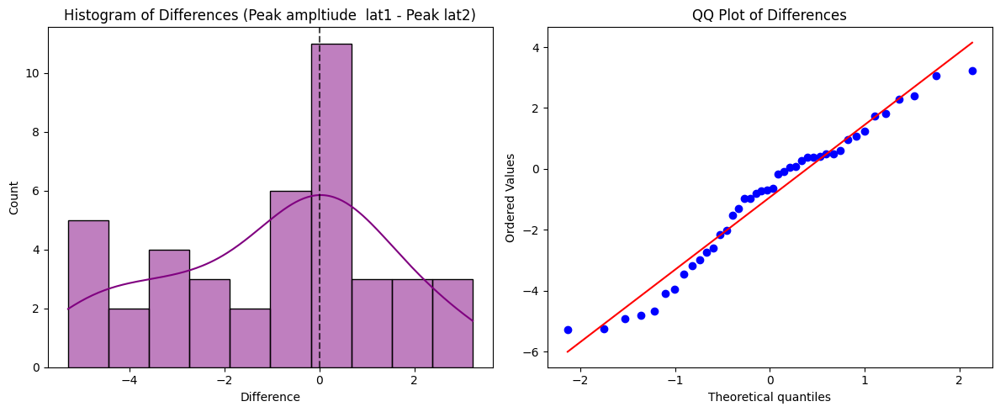

Shapiro-Wilk test (Area latency ): ShapiroResult(statistic=np.float64(0.8930746529972073), pvalue=np.float64(0.0008990889952615829))
D’Agostino and Pearson’s test (Area latency ): NormaltestResult(statistic=np.float64(21.052858660434946), pvalue=np.float64(2.681821250370653e-05))


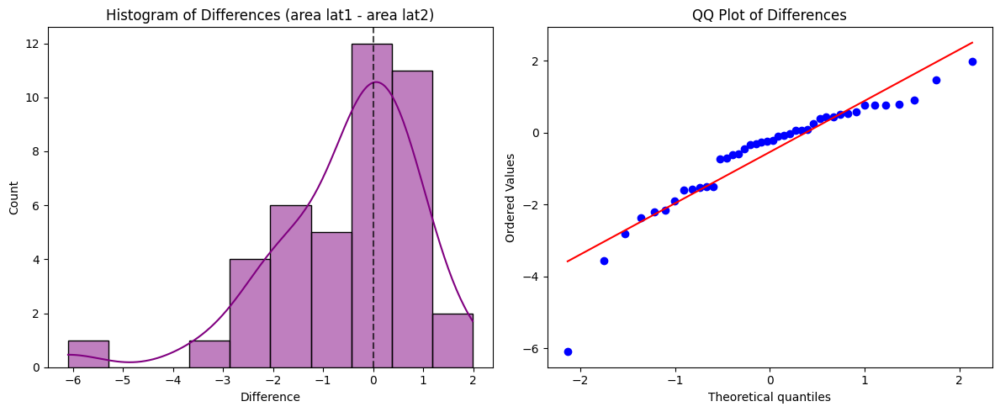

In [28]:
from scipy.stats import shapiro, normaltest, probplot
from scipy.stats import wilcoxon,ttest_ind,ttest_rel
# Compute difference
diff = mmn_filtered_df['SN_PA_mean'] - mmn_filtered_df['BN_PA_mean']
# === Normality tests ===
print("Shapiro-Wilk test (Peak latency):", stats.shapiro(diff))
print("D’Agostino and Pearson’s test (Peak latency):",normaltest(diff))
# === Plot side by side ===
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Histogram
sns.histplot(diff, kde=True, bins=10, color="purple", ax=axes[0])
axes[0].axvline(0, color="black", linestyle="--", alpha=0.7)
axes[0].set_title("Histogram of Differences (Peak ampltiude  lat1 - Peak lat2)")
axes[0].set_xlabel("Difference")
axes[0].set_ylabel("Count")

# QQ plot
stats.probplot(diff, dist="norm", plot=axes[1])
axes[1].set_title("QQ Plot of Differences")

plt.tight_layout()
plt.show()

# Compute difference
diff = mmn_filtered_df['SN_TWMA_mean'] - mmn_filtered_df['BN_TWMA_mean']
# === Normality tests ===
print("Shapiro-Wilk test (Area latency ):", stats.shapiro(diff))
print("D’Agostino and Pearson’s test (Area latency ):",normaltest(diff))
# === Plot side by side ===
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Histogram
sns.histplot(diff, kde=True, bins=10, color="purple", ax=axes[0])
axes[0].axvline(0, color="black", linestyle="--", alpha=0.7)
axes[0].set_title("Histogram of Differences (area lat1 - area lat2)")
axes[0].set_xlabel("Difference")
axes[0].set_ylabel("Count")

# QQ plot
stats.probplot(diff, dist="norm", plot=axes[1])
axes[1].set_title("QQ Plot of Differences")

plt.tight_layout()
plt.show()

BN stats (PL)
 mean : 0.03761553070652866 std : 0.017459393812184917
SN stats(PL) 
 mean : 0.02774473479758847 std : 0.013306081899245146;std sum 0.007302896000564298
sub_id                                                         sub-sd011
measure                                                            n1mmn
BN_PA_mean                                                     -4.134004
BN_PA_std                                                       0.792619
SN_PA_mean                                                     -3.738444
SN_PA_std                                                       1.139663
BN_PL_mean                                                      0.074258
BN_PL_std                                                       0.024218
SN_PL_mean                                                      0.028008
SN_PL_std                                                       0.018732
BN_TWMA_mean                                                   -0.662618
BN_TWMA_std                   

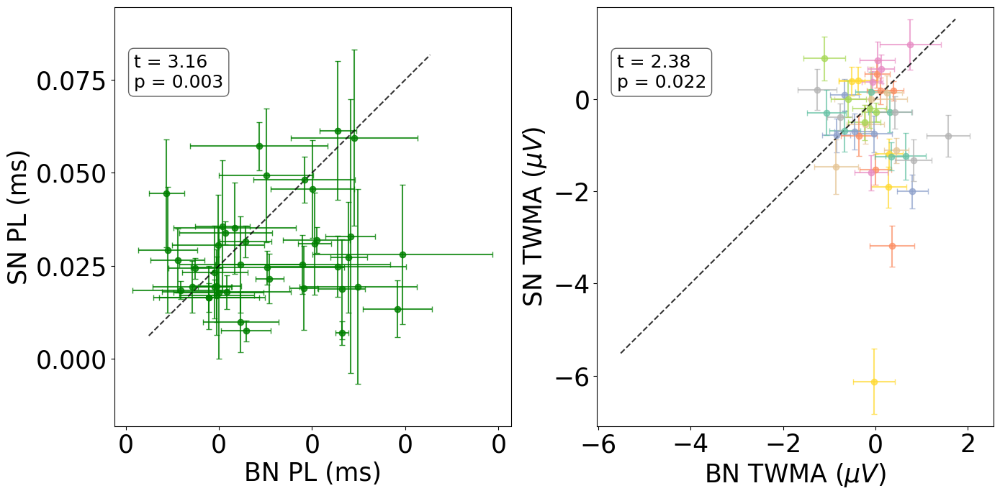

In [29]:
import matplotlib.ticker as ticker
plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })
fig, axes = plt.subplots(1, 2, figsize=(14, 7))


plot_bn_vs_sn(mmn_filtered_df, metric="PL", ax=axes[0],title="",col_id=None,
              stat_test ="t-test" ,highlight_sig=True,highlight_sig_col ="PL_significant" )
plot_bn_vs_sn(mmn_filtered_df, metric="TWMA",  ax=axes[1],stat_test ="t-test" )

for ax in axes:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

##

BN stats (TWMA)
 mean : -0.05725088196465489 std : 0.5823509790589775
SN stats(TWMA) 
 mean : -0.5977091324829542 std : 1.2457124151604202;std sum 0.11020794837001342
sub_id                                                         sub-sd011
measure                                                            n1mmn
BN_PA_mean                                                     -4.134004
BN_PA_std                                                       0.792619
SN_PA_mean                                                     -3.738444
SN_PA_std                                                       1.139663
BN_PL_mean                                                      0.074258
BN_PL_std                                                       0.024218
SN_PL_mean                                                      0.028008
SN_PL_std                                                       0.018732
BN_TWMA_mean                                                   -0.662618
BN_TWMA_std                   

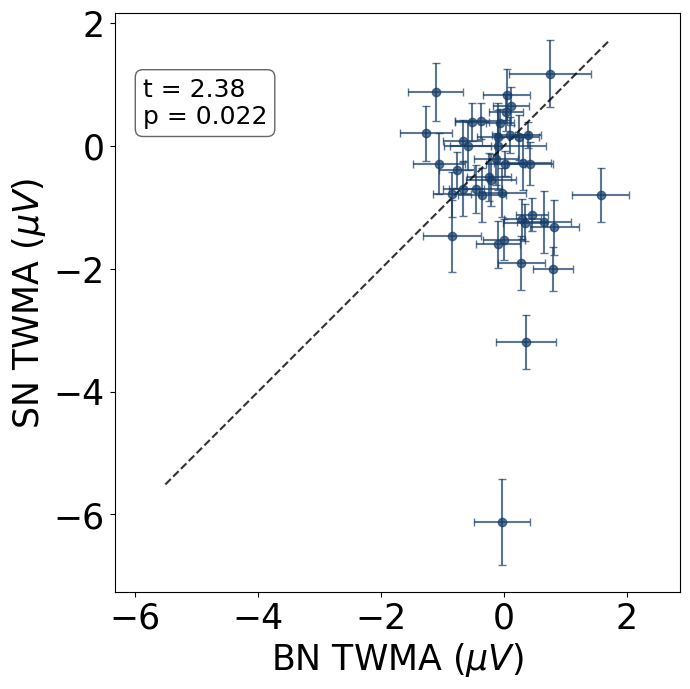

In [30]:
import matplotlib.ticker as ticker
plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })
fig, axes = plt.subplots(1, 1, figsize=(7, 7))


plot_bn_vs_sn(mmn_filtered_df, metric="TWMA", ax=axes,title="",stat_test ="t-test" ,col_id=None,default_color="#163D69",)
#plot_bn_vs_sn(mmn_filtered_df, metric="TWMA",  ax=axes[1],stat_test ="t-test" )

axes.xaxis.set_major_formatter('{x:.0f}')
axes.xaxis.set_major_locator(ticker.MaxNLocator(5))
axes.yaxis.set_major_locator(ticker.MaxNLocator(5))
axes.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

## Latency

Shapiro-Wilk test (Peak latency): ShapiroResult(statistic=np.float64(0.9723323649764959), pvalue=np.float64(0.3941939613375265))
D’Agostino and Pearson’s test (Peak latency): NormaltestResult(statistic=np.float64(1.8799843182957248), pvalue=np.float64(0.3906308982256267))


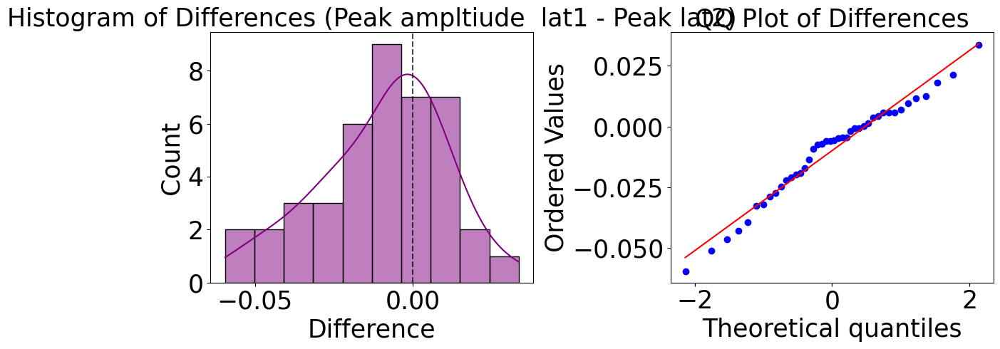

Shapiro-Wilk test (Area latency ): ShapiroResult(statistic=np.float64(0.9688109815356539), pvalue=np.float64(0.30109179061510316))
D’Agostino and Pearson’s test (Area latency ): NormaltestResult(statistic=np.float64(1.6631724103102992), pvalue=np.float64(0.4353581709659494))


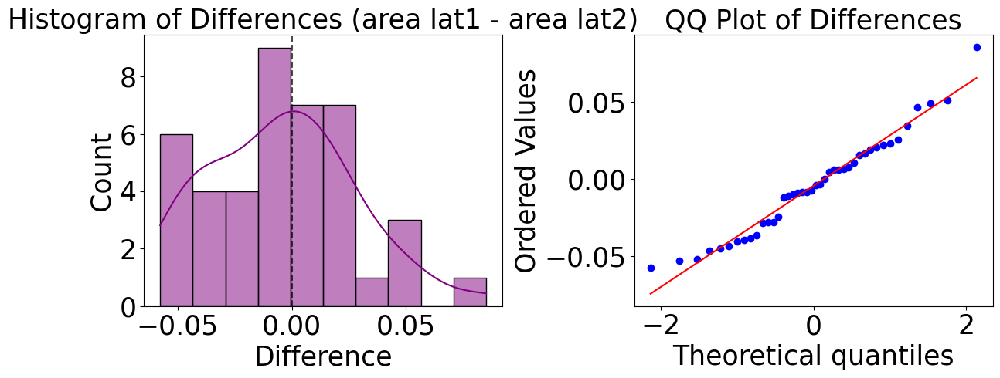

In [31]:
from scipy.stats import normaltest
# Compute difference
diff = mmn_filtered_df['SN_PL_mean'] - mmn_filtered_df['BN_PL_mean']
# === Normality tests ===
print("Shapiro-Wilk test (Peak latency):", stats.shapiro(diff))
print("D’Agostino and Pearson’s test (Peak latency):",normaltest(diff))
# === Plot side by side ===
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Histogram
sns.histplot(diff, kde=True, bins=10, color="purple", ax=axes[0])
axes[0].axvline(0, color="black", linestyle="--", alpha=0.7)
axes[0].set_title("Histogram of Differences (Peak ampltiude  lat1 - Peak lat2)")
axes[0].set_xlabel("Difference")
axes[0].set_ylabel("Count")

# QQ plot
stats.probplot(diff, dist="norm", plot=axes[1])
axes[1].set_title("QQ Plot of Differences")

plt.tight_layout()
plt.show()

# Compute difference
diff = mmn_filtered_df['SN_FAL_mean'] - mmn_filtered_df['BN_FAL_mean']
# === Normality tests ===
print("Shapiro-Wilk test (Area latency ):", stats.shapiro(diff))
print("D’Agostino and Pearson’s test (Area latency ):",normaltest(diff))
# === Plot side by side ===
fig, axes = plt.subplots(1, 2, figsize=(12,5))

# Histogram
sns.histplot(diff, kde=True, bins=10, color="purple", ax=axes[0])
axes[0].axvline(0, color="black", linestyle="--", alpha=0.7)
axes[0].set_title("Histogram of Differences (area lat1 - area lat2)")
axes[0].set_xlabel("Difference")
axes[0].set_ylabel("Count")

# QQ plot
stats.probplot(diff, dist="norm", plot=axes[1])
axes[1].set_title("QQ Plot of Differences")

plt.tight_layout()
plt.show()

BN stats (FAL)
 mean : 44.39751244101132 std : 17.004111263459187
SN stats(FAL) 
 mean : 39.81756955892178 std : 24.255748051501275;std sum 10.002324353250744
sub_id                 sub-sd011sub-sd011sub-sd011sub-sd011sub-sd011s...
measure                n1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn...
BN_PA_mean                                                  -4134.004331
BN_PA_std                                                     792.618794
SN_PA_mean                                                  -3738.443967
SN_PA_std                                                    1139.662641
BN_PL_mean                                                     74.257663
BN_PL_std                                                      24.218355
SN_PL_mean                                                     28.008409
SN_PL_std                                                      18.731586
BN_TWMA_mean                                                 -662.618355
BN_TWMA_std                           

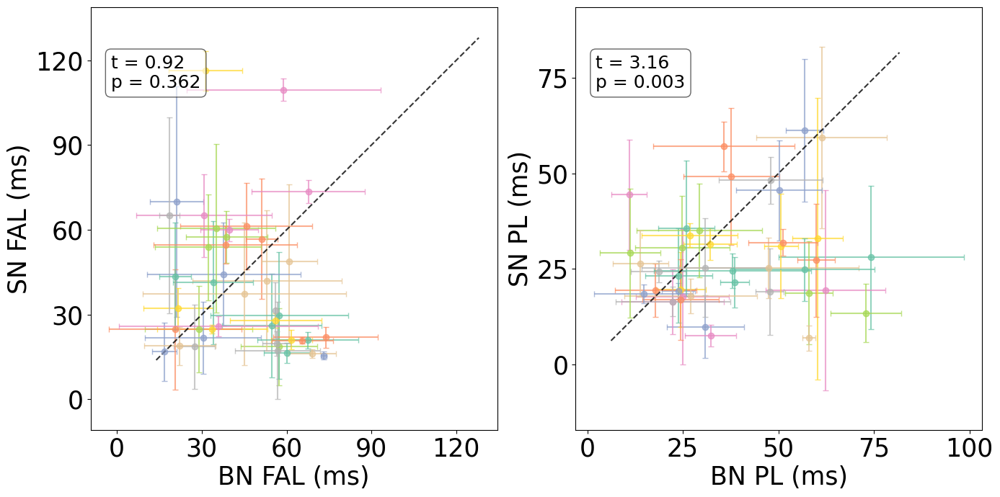

In [32]:

fig, axes = plt.subplots(1, 2, figsize=(14, 7))

plot_bn_vs_sn(mmn_filtered_df*1000, metric="FAL",ax=axes[0])
plot_bn_vs_sn(mmn_filtered_df*1000, metric="PL", ax=axes[1])


for ax in axes:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

BN stats (PL)
 mean : 37.61553070652866 std : 17.459393812184917
SN stats(PL) 
 mean : 27.744734797588475 std : 13.306081899245147;std sum 7.302896000564298
sub_id                 sub-sd011sub-sd011sub-sd011sub-sd011sub-sd011s...
measure                n1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn...
BN_PA_mean                                                  -4134.004331
BN_PA_std                                                     792.618794
SN_PA_mean                                                  -3738.443967
SN_PA_std                                                    1139.662641
BN_PL_mean                                                     74.257663
BN_PL_std                                                      24.218355
SN_PL_mean                                                     28.008409
SN_PL_std                                                      18.731586
BN_TWMA_mean                                                 -662.618355
BN_TWMA_std                             

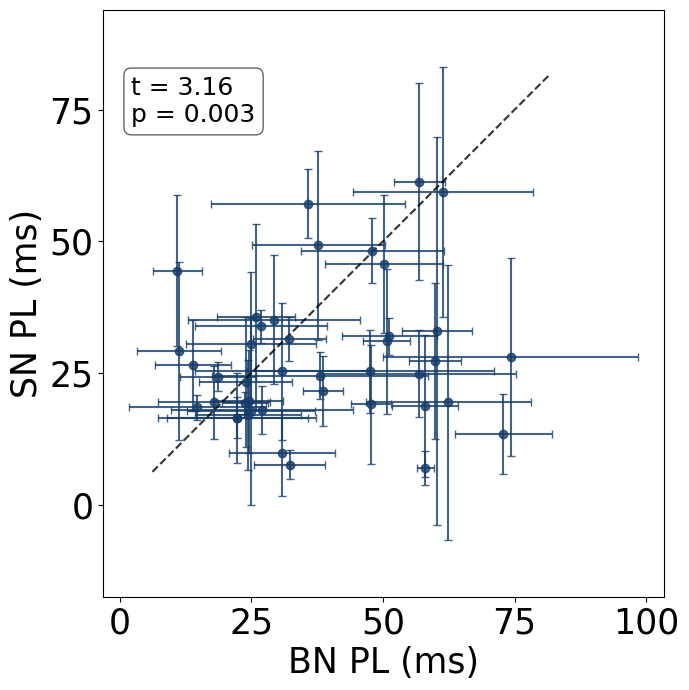

In [33]:
fig, axes = plt.subplots(1, 1, figsize=(7, 7))

plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })
plot_bn_vs_sn(df = mmn_filtered_df*1000, metric="PL", ax=axes,highlight_sig=True,highlight_sig_col="PL_significant",col_id=None,default_color="#163D69")

axes.xaxis.set_major_formatter('{x:.0f}')
axes.xaxis.set_major_locator(ticker.MaxNLocator(5))
axes.yaxis.set_major_locator(ticker.MaxNLocator(5))
axes.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

# Tone Jitter 

In [34]:

tones = sorted(filtered_df["SN_tone"].dropna().unique())
tone_map = {
    "Whoop_doop": "SN1",
    "droplet": "SN2",
    "realme_fun": "SN3",
    "iphone_note": "SN4",
    "oneplustune": "SN5",
    "voyar": "SN6",
    "oneplus_meet": "SN7",
    "oneplus_blissful": "SN8",
    "realme": "SN9",
    "encounter_vivo": "SN10",
    "vibration": "SN11",
    "oppo": "SN12",
    "oppo_joy": "SN13",
    "_andes_vivo": "SN15",
    "skyline_samsung": "SN16",
    "spaceline": "SN18",
    "Hello_inMoto": "SN19",
}

filtered_df["SN_code"] = filtered_df["SN_tone"].map(tone_map)
filtered_df.head()

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2463073270.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["SN_code"] = filtered_df["SN_tone"].map(tone_map)


,sub_id,measure,BN_PA_mean,BN_PA_std,SN_PA_mean,SN_PA_std,BN_PL_mean,BN_PL_std,SN_PL_mean,SN_PL_std,...,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,participant_id_y,SAS_score,group,SN_code
0,sub-sd011,n1dev,-3.776598,0.646648,-6.654657,1.075007,0.244627,0.019953,0.224125,0.010922,...,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU,SN19
1,sub-sd011,n1lpp,2.526976,1.754247,1.763984,1.752255,0.324289,0.023016,0.364835,0.009720,...,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU,SN19
2,sub-sd011,n1mmn,-4.134004,0.792619,-3.738444,1.139663,0.074258,0.024218,0.028008,0.018732,...,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU,SN19
3,sub-sd011,n1noveltyp2,-0.264377,0.870198,-0.331359,1.161970,0.179707,0.015580,0.173427,0.013556,...,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU,SN19
4,sub-sd011,n1noveltyp2fig2,-0.439267,0.876590,-0.658831,1.223875,0.165452,0.001953,0.160142,0.003877,...,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU,SN19


In [35]:
tones

['Hello_inMoto',
 'Whoop_doop',
 '_andes_vivo',
 'droplet',
 'encounter_vivo',
 'iphone_note',
 'oneplus_blissful',
 'oneplus_meet',
 'oneplustune',
 'oppo',
 'oppo_joy',
 'realme',
 'realme_fun',
 'skyline_samsung',
 'spaceline',
 'vibration',
 'voyar']

## n1 latency jitter

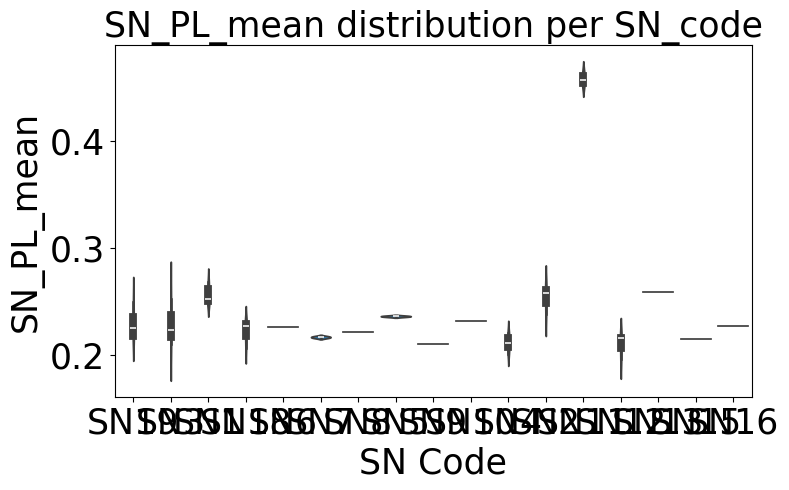

In [36]:
 
n1_df= filtered_df[filtered_df['measure'] == "n1"].copy()
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.violinplot(
    data=n1_df,
    x="SN_code",
    y="SN_PL_mean",
    inner="box"   # shows median + IQR inside the violin
)

plt.xlabel("SN Code")
plt.ylabel("SN_PL_mean")
plt.title("SN_PL_mean distribution per SN_code")
plt.tight_layout()
plt.show()


C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\3818091896.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=plot_df,
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\3818091896.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


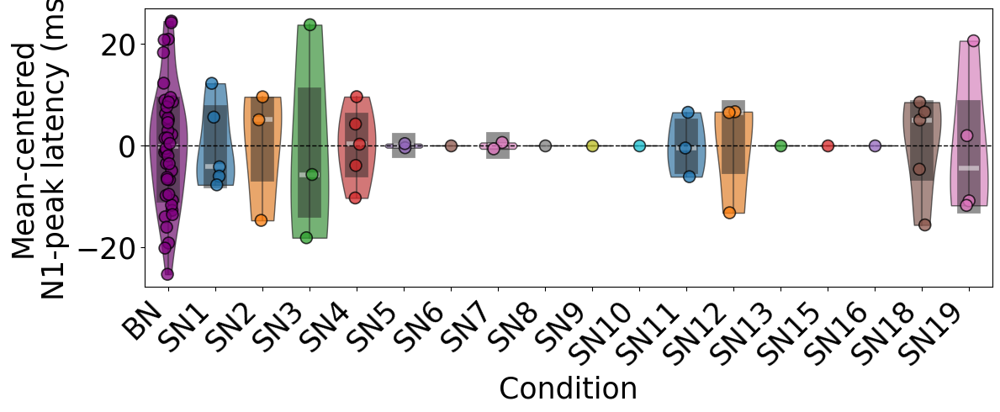

In [37]:
import pandas as pd

# SN data

sn_long = n1_df[["SN_code", "SN_PL_mean"]].copy()
sn_long.columns = ["group", "value"]

# BN data (single group)
bn_long = n1_df[["BN_PL_mean"]].copy()
bn_long["group"] = "BN"
bn_long = bn_long.rename(columns={"BN_PL_mean": "value"})

# combine
plot_df = pd.concat([sn_long, bn_long], ignore_index=True)
plot_df["value"] = plot_df["value"]*1000
# subtract mean within each group
plot_df["value_centered"] = (
    plot_df["value"]
    - plot_df.groupby("group")["value"].transform("mean")
)

# order: SN1, SN2, ..., BN
sn_order = sorted(
    n1_df["SN_code"].dropna().unique(),
    key=lambda x: int(x.replace("SN", ""))
)
order = ["BN"] + sn_order  
# generate distinct colors for SN
sn_palette = sns.color_palette("tab10", n_colors=len(sn_order))

# append purple for BN
palette =  ["purple"]+sn_palette 
plt.figure(figsize=(12, 5))

# violin
sns.violinplot(data=plot_df,
    x="group", y="value_centered",order=order,palette=palette,inner='box', linewidth=1, cut=0,alpha = .7,
    inner_kws=dict(box_width=20, whis_width=1.5, alpha=0.5),)

sns.stripplot(
    data=plot_df, x="group",
    y="value_centered",
    order=order, palette=palette , dodge=False,jitter=True,size=10,linewidth=1.2,edgecolor='black',alpha=0.75,)

plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.xlabel("Condition")
plt.ylabel("Mean-centered\n N1-peak latency (ms)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()



In [38]:
n1_df["SN_tone"].unique()

array(['Hello_inMoto', 'realme_fun', 'Whoop_doop', 'spaceline', 'voyar',
       'oneplus_meet', 'oneplus_blissful', 'oneplustune', 'realme',
       'encounter_vivo', 'iphone_note', 'droplet', 'vibration', 'oppo',
       'oppo_joy', '_andes_vivo', 'skyline_samsung'], dtype=object)

In [39]:
"""BN beep.wav
CN control_tone.wav
SN1 SD012_SD016_SD036_SD038_SD051_SD67_Whoop_doop.wav
SN2 SD014_SD032_SD044_SD055_MI_droplets.wav
SN3 SD015_SD022_SD023_SD041_Realme_fun.wav
SN4 SD019_SD028_SD031_SD035_SD043_SD045_SD052_SD065_ipone_note.wav
SN5 SD020_SD027_SD033_oneplustune.wav
SN6 SD021_voyar.wav
SN7 SD024_SD049_oneplus_meet.wav
SN8 SD025_oneplus_blissful.wav
SN9 SD029_realme.wav
SN10 SD030_SD042_encounter_vivo.wav
SN11 SD034_SD050_SD059_vibration.wav
SD037_SD053_SD062_oppo.wav has header error, using pydub to fix it...
SN12 SD037_SD053_SD062_oppo.wav
SN13 SD039_SD040_oppo_joy.wav
SN14 SD057_jai_shree_shyam.wav
SN15 SD058_andes_vivo.wav
SN16 SD060_skyline_samsung.wav
SN17 SD066_chime_moto.wav
SN18 sub004_SD017_SD026_SD046_SD047_SD054__SD063_spaceline.wav
SN19 sub011_SD013_SD018_SD048_SD056_Sd061_SD064_Hello_inMoto.wav"""

'BN beep.wav\nCN control_tone.wav\nSN1 SD012_SD016_SD036_SD038_SD051_SD67_Whoop_doop.wav\nSN2 SD014_SD032_SD044_SD055_MI_droplets.wav\nSN3 SD015_SD022_SD023_SD041_Realme_fun.wav\nSN4 SD019_SD028_SD031_SD035_SD043_SD045_SD052_SD065_ipone_note.wav\nSN5 SD020_SD027_SD033_oneplustune.wav\nSN6 SD021_voyar.wav\nSN7 SD024_SD049_oneplus_meet.wav\nSN8 SD025_oneplus_blissful.wav\nSN9 SD029_realme.wav\nSN10 SD030_SD042_encounter_vivo.wav\nSN11 SD034_SD050_SD059_vibration.wav\nSD037_SD053_SD062_oppo.wav has header error, using pydub to fix it...\nSN12 SD037_SD053_SD062_oppo.wav\nSN13 SD039_SD040_oppo_joy.wav\nSN14 SD057_jai_shree_shyam.wav\nSN15 SD058_andes_vivo.wav\nSN16 SD060_skyline_samsung.wav\nSN17 SD066_chime_moto.wav\nSN18 sub004_SD017_SD026_SD046_SD047_SD054__SD063_spaceline.wav\nSN19 sub011_SD013_SD018_SD048_SD056_Sd061_SD064_Hello_inMoto.wav'

BN stats (PL)
 mean : 0.03702764380851925 std : 0.016571353322854827
SN stats(PL) 
 mean : 0.02684130765462151 std : 0.013717793486030827;std sum 0.008821392921363228
sub_id                 sub-sd017
measure                    n1mmn
BN_PA_mean             -1.989663
BN_PA_std               0.979853
SN_PA_mean             -4.138813
SN_PA_std               1.028117
BN_PL_mean              0.062355
BN_PL_std               0.015664
SN_PL_mean              0.019434
SN_PL_std               0.026147
BN_TWMA_mean            0.044206
BN_TWMA_std             0.382395
SN_TWMA_mean            0.832728
SN_TWMA_std             0.416001
SN_FAL_mean             0.109578
SN_FAL_std              0.003877
BN_FAL_mean             0.058977
BN_FAL_std              0.034227
PA_tstat               33.133638
PA_pval                      0.0
PL_tstat               11.024532
PL_pval                      0.0
TWMA_tstat            -30.630332
TWMA_pval                    0.0
PA_pval_corrected            0.0
PL_pval_

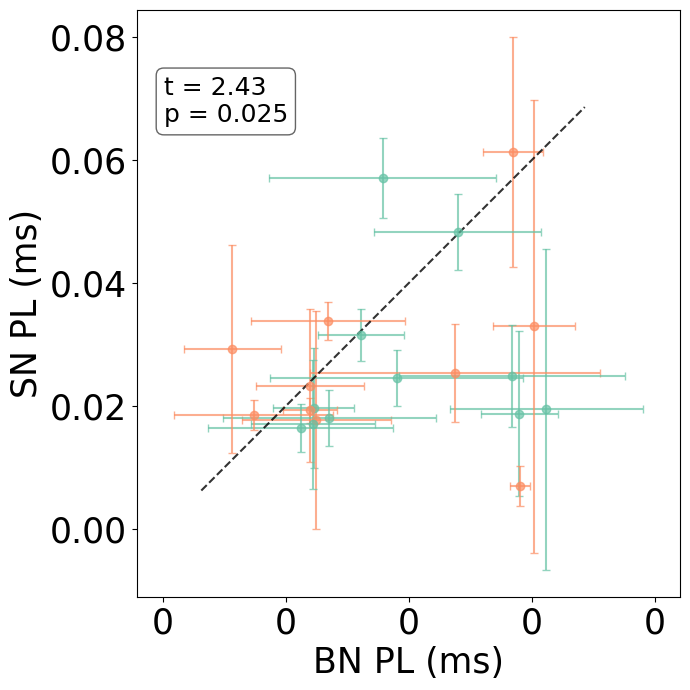

In [40]:
fig, axes = plt.subplots(1, 1, figsize=(7, 7))

plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })
plot_bn_vs_sn(df = mmn_filtered_df[ ~mmn_filtered_df['group'].isin( ['ASU'])], metric="PL", ax=axes,col_id= "group")

axes.xaxis.set_major_formatter('{x:.0f}')
axes.xaxis.set_major_locator(ticker.MaxNLocator(5))
axes.yaxis.set_major_locator(ticker.MaxNLocator(5))
axes.patch.set_alpha(0)
fig.patch.set_alpha(0)

plt.tight_layout()
plt.show()

## P1 latency 

In [41]:
filtered_df['measure'].unique()

array(['n1dev', 'n1lpp', 'n1mmn', 'n1noveltyp2', 'n1noveltyp2fig2',
       'n1noveltyp2parieto', 'n1noveltyp2parietodelayedlpp', 'n1stdp2',
       'n1', 'p2'], dtype=object)

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4256575923.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=plot_df,
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4256575923.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


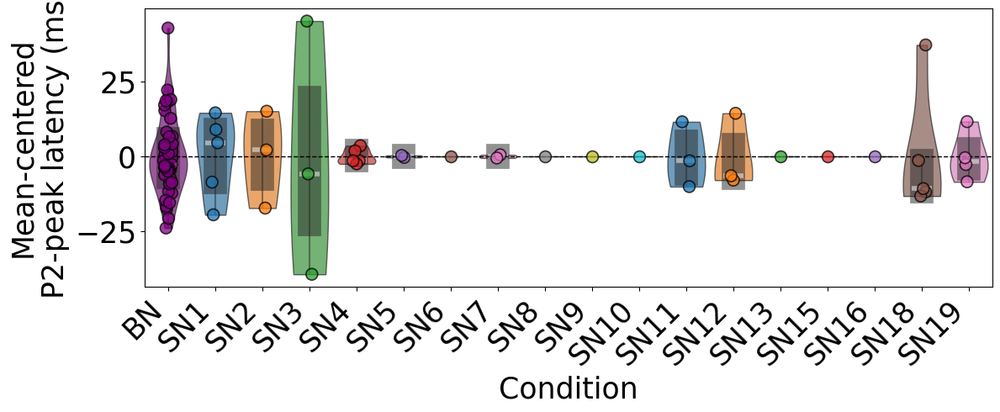

In [42]:
import pandas as pd

# SN data
p2_df= filtered_df[filtered_df['measure'] == "p2"].copy()
sn_long = p2_df[["SN_code", "SN_PL_mean"]].copy()
sn_long.columns = ["group", "value"]

# BN data (single group)
bn_long = p2_df[["BN_PL_mean"]].copy()
bn_long["group"] = "BN"
bn_long = bn_long.rename(columns={"BN_PL_mean": "value"})

# combine
plot_df = pd.concat([sn_long, bn_long], ignore_index=True)
plot_df["value"] = plot_df["value"]*1000
# subtract mean within each group
plot_df["value_centered"] = (
    plot_df["value"]
    - plot_df.groupby("group")["value"].transform("mean")
)

# order: Sp2, SN2, ..., BN
sn_order = sorted(
    p2_df["SN_code"].dropna().unique(),
    key=lambda x: int(x.replace("SN", ""))
)
order = ["BN"] + sn_order  
# generate distinct colors for SN
sn_palette = sns.color_palette("tab10", n_colors=len(sn_order))

# append purple for BN
palette =  ["purple"]+sn_palette 
plt.figure(figsize=(12, 5))

# violin
sns.violinplot(data=plot_df,
    x="group", y="value_centered",order=order,palette=palette,inner='box', linewidth=1, cut=0,alpha = .7,
    inner_kws=dict(box_width=20, whis_width=1.5, alpha=0.5),)

sns.stripplot(
    data=plot_df, x="group",
    y="value_centered",
    order=order, palette=palette , dodge=False,jitter=True,size=10,linewidth=1.2,edgecolor='black',alpha=0.75,)

plt.axhline(0, color="black", linestyle="--", linewidth=1)
plt.xlabel("Condition")
plt.ylabel("Mean-centered\n P2-peak latency (ms)")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()



# SN VS BN P3a and LPP

BN stats (TWMA)
 mean : 0.15238480222738554 std : 0.38971469467294284
SN stats(TWMA) 
 mean : 0.0638329175695896 std : 0.28396807071839053;std sum 0.07742901124717341
sub_id                                                         sub-sd011
measure                                                  n1noveltyp2fig2
BN_PA_mean                                                     -0.439267
BN_PA_std                                                        0.87659
SN_PA_mean                                                     -0.658831
SN_PA_std                                                       1.223875
BN_PL_mean                                                      0.165452
BN_PL_std                                                       0.001953
SN_PL_mean                                                      0.160142
SN_PL_std                                                       0.003877
BN_TWMA_mean                                                   -0.219761
BN_TWMA_std                   

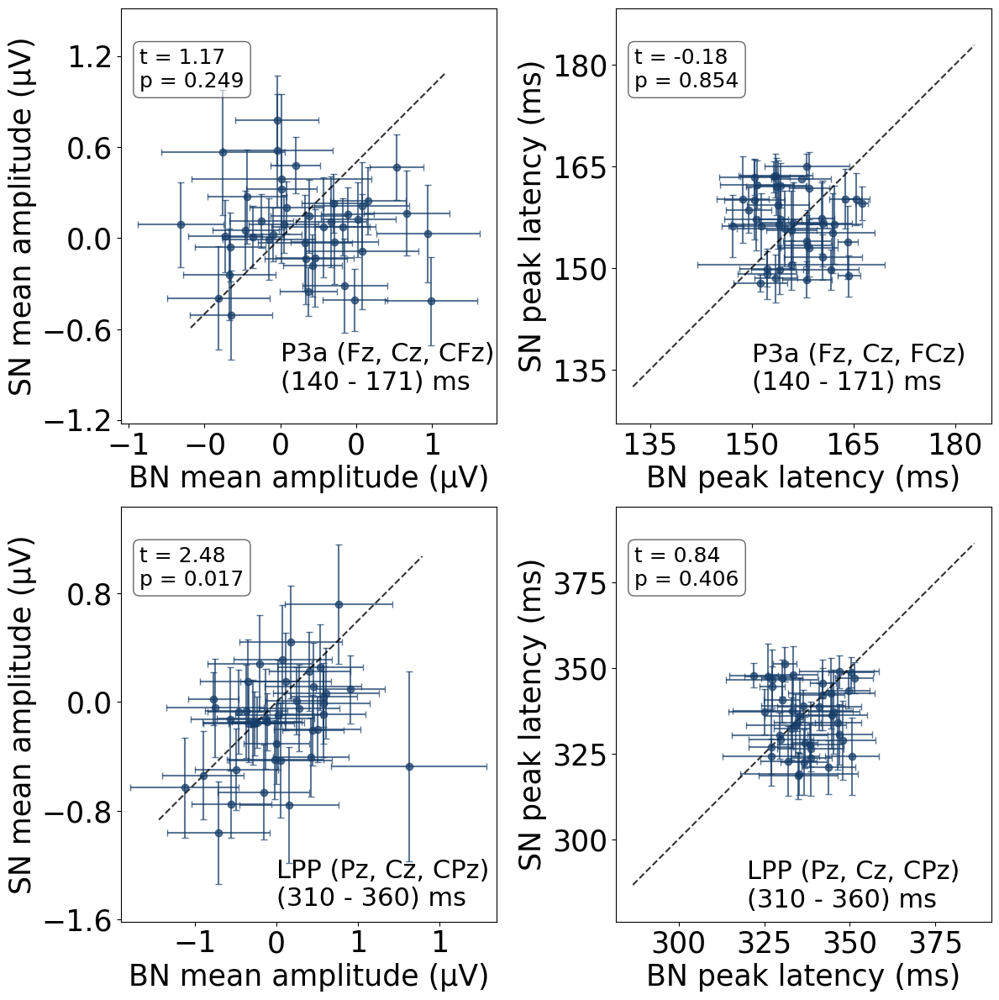

In [43]:
# Filter for p3a =  n1noveltyp2fig2	
p3a_filtered_df = filtered_df[(filtered_df['measure'] == 'n1noveltyp2fig2') ] # remove the subject with vibration & (filtered_df['SN_PL_mean'] <0.4 )
# Filter for lpp =  n1noveltyp2fig2	
lpp_filtered_df = filtered_df[(filtered_df['measure'] == 'n1noveltyp2parietodelayedlpp') ] # remove the subject with vibration & (filtered_df['SN_PL_mean'] <0.4 )



fig, axes = plt.subplots(2, 2, figsize=(12, 12))

plot_bn_vs_sn(p3a_filtered_df, metric="TWMA",ax=axes[0,0],col_id=None,default_color="#163D69",)
plot_bn_vs_sn(p3a_filtered_df*1000, metric="PL", ax=axes[0,1],col_id=None,default_color="#163D69",)


plot_bn_vs_sn(lpp_filtered_df, metric="TWMA",ax=axes[1,0],col_id=None,default_color="#163D69",)
plot_bn_vs_sn(lpp_filtered_df*1000, metric="PL", ax=axes[1,1],col_id=None,default_color="#163D69",)

axes[0,0].set_xlabel("BN mean amplitude (µV)")
axes[0,0].set_ylabel("SN mean amplitude (µV)")
axes[0,0].text(0.0,-1,"P3a (Fz, Cz, CFz)\n(140 - 171) ms",fontsize =22)
axes[0,1].set_xlabel("BN peak latency (ms)")
axes[0,1].set_ylabel("SN peak latency (ms)")
axes[0,1].text(150,132,"P3a (Fz, Cz, FCz)\n(140 - 171) ms",fontsize =22)

axes[1,0].set_xlabel("BN mean amplitude (µV)")
axes[1,0].set_ylabel("SN mean amplitude (µV)")
axes[1,0].text(0.0,-1.5,"LPP (Pz, Cz, CPz)\n(310 - 360) ms",fontsize =22)
axes[1,1].set_xlabel("BN peak latency (ms)")
axes[1,1].set_ylabel("SN peak latency (ms)")
axes[1,1].text(320,280,"LPP (Pz, Cz, CPz)\n(310 - 360) ms",fontsize =22)
fig.patch.set_alpha(0)
for ax in axes.flat:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.patch.set_alpha(0)
plt.tight_layout()
plt.show()

### SAS vs pl


In [44]:
fig, ax = plt.subplots(1,2, figsize=(12, 6))
ax[0].errorbar(p3a_filtered_df['SAS_score'], p3a_filtered_df['SN_PL_mean'],yerr= p3a_filtered_df['SN_PL_std'],c= 'g',fmt="o",)
ax[0].errorbar(p3a_filtered_df['SAS_score'], p3a_filtered_df['BN_PL_mean'],yerr= p3a_filtered_df['BN_PL_std'],c= 'purple',fmt="o",)
ax[0].set_xlabel("SAS")
ax[0].set_ylabel("PL (sec)")
ax[1].errorbar(p3a_filtered_df['SAS_score'], p3a_filtered_df['SN_TWMA_mean'],yerr= p3a_filtered_df['SN_TWMA_std'],c= 'g',fmt="o",)
ax[1].errorbar(p3a_filtered_df['SAS_score'], p3a_filtered_df['BN_TWMA_mean'],yerr= p3a_filtered_df['BN_TWMA_std'],c= 'purple',fmt="o",)
ax[1].set_xlabel("SAS")
ax[1].set_ylabel("TWMA (micro volt)")
ax[1].text(150,1, "SN", c = 'g',fontsize = 18)
ax[1].text(150,.8,"BN",c = 'purple',fontsize = 18)
ax[1].text(120,1.2,"P3a (140,171 ms)" ,fontsize = 18)
plt.tight_layout()

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2199907886.py:13: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


ValueError: Image size of 577376x5393 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1200x600 with 2 Axes>

In [45]:
from scipy.stats import pearsonr

"""
print("P3a PL SN :  ",pearsonr(p3a_filtered_df['SAS_score'], p3a_filtered_df['SN_PL_mean']))
print("P3a PL  BN :",pearsonr(p3a_filtered_df['SAS_score'], p3a_filtered_df['BN_PL_mean'],))
print("P3a TWMA  SN :",pearsonr(p3a_filtered_df['SAS_score'], p3a_filtered_df['SN_TWMA_mean']))
print("P3a TWMA  BN : ", pearsonr(p3a_filtered_df['SAS_score'], p3a_filtered_df['BN_TWMA_mean']))

print("lpp PL SN :  ",pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['SN_PL_mean'],))
print("lpp PL  BN :",pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['BN_PL_mean'],))
print("lpp TWMA  SN :",pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['SN_TWMA_mean']))
print("lpp TWMA  BN : ", pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['BN_TWMA_mean']))
"""

'\nprint("P3a PL SN :  ",pearsonr(p3a_filtered_df[\'SAS_score\'], p3a_filtered_df[\'SN_PL_mean\']))\nprint("P3a PL  BN :",pearsonr(p3a_filtered_df[\'SAS_score\'], p3a_filtered_df[\'BN_PL_mean\'],))\nprint("P3a TWMA  SN :",pearsonr(p3a_filtered_df[\'SAS_score\'], p3a_filtered_df[\'SN_TWMA_mean\']))\nprint("P3a TWMA  BN : ", pearsonr(p3a_filtered_df[\'SAS_score\'], p3a_filtered_df[\'BN_TWMA_mean\']))\n\nprint("lpp PL SN :  ",pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'SN_PL_mean\'],))\nprint("lpp PL  BN :",pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'BN_PL_mean\'],))\nprint("lpp TWMA  SN :",pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'SN_TWMA_mean\']))\nprint("lpp TWMA  BN : ", pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'BN_TWMA_mean\']))\n'

In [46]:
"""
print("lpp PL SN :  ",pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['SN_PL_mean'],))
print("lpp PL  BN :",pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['BN_PL_mean'],))
print("lpp TWMA  SN :",pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['SN_TWMA_mean']))
print("lpp TWMA  BN : ", pearsonr(lpp_filtered_df['SAS_score'], lpp_filtered_df['BN_TWMA_mean']))
"""

'\nprint("lpp PL SN :  ",pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'SN_PL_mean\'],))\nprint("lpp PL  BN :",pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'BN_PL_mean\'],))\nprint("lpp TWMA  SN :",pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'SN_TWMA_mean\']))\nprint("lpp TWMA  BN : ", pearsonr(lpp_filtered_df[\'SAS_score\'], lpp_filtered_df[\'BN_TWMA_mean\']))\n'

In [47]:
fig, ax = plt.subplots(1,2, figsize=(12, 6))
ax[0].errorbar(lpp_filtered_df['SAS_score'], lpp_filtered_df['SN_PL_mean'],yerr= lpp_filtered_df['SN_PL_std'],c= 'g',fmt="o",)
ax[0].errorbar(lpp_filtered_df['SAS_score'], lpp_filtered_df['BN_PL_mean'],yerr= lpp_filtered_df['BN_PL_std'],c= 'purple',fmt="o",)
ax[0].set_xlabel("SAS")
ax[0].set_ylabel("PL (sec)")
ax[1].errorbar(lpp_filtered_df['SAS_score'], lpp_filtered_df['SN_TWMA_mean'],yerr= lpp_filtered_df['SN_TWMA_std'],c= 'g',fmt="o",)
ax[1].errorbar(lpp_filtered_df['SAS_score'], lpp_filtered_df['BN_TWMA_mean'],yerr= lpp_filtered_df['BN_TWMA_std'],c= 'purple',fmt="o",)
ax[1].set_xlabel("SAS")
ax[1].set_ylabel("TWMA (micro volt)")
ax[1].text(150,2, "SN", c = 'g',fontsize = 18)
ax[1].text(150,1.5,"BN",c = 'purple',fontsize = 18)

ax[1].text(120,1,"LPP (Pz, CPz, Cz) \n(310,360 ms)" ,fontsize = 18)
plt.tight_layout()


C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\3445905046.py:14: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


ValueError: Image size of 577376x8753 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1200x600 with 2 Axes>

# MMN of subjects having N1 and P2 peak for both SN and BN 

In [48]:
import os
import glob
import pandas as pd

# Path where your csv files are stored
path = r"E:\ecf-exp2-notif-mmn\data\Processed\SME_scores"

# Grab all CSV files
files = glob.glob(os.path.join(path, "*.csv"))

# Initialize dicts
SN_N1_SME = {}
SN_MMN_SME = {}
BN_N1_SME = {}
BN_MMN_SME = {}
SN_P2_SME = {}
BN_P2_SME = {}
# Loop through files
for file in files:
    # Extract parts from filename
    fname = os.path.basename(file)  # e.g. sub-sd011_BN_n1.csv
    parts = fname.replace(".csv", "").split("_")  
    # -> ["sub-sd011", "BN", "n1"]

    sub_id = parts[0].replace("sub-", "")  # sd011
    cond = parts[1]                        # BN or SN
    measure = parts[2].lower()             # n1 or mmn

    # Load csv
    df = pd.read_csv(file)

    # Compute stats
    PA_mean = df["PA"].mean()
    PA_std  = df["PA"].std()
    PL_mean = df["PL"].mean()
    PL_std  = df["PL"].std()

    result = {
        "PA_mean": PA_mean,
        "PA_std": PA_std,
        "PL_mean": PL_mean,
        "PL_std": PL_std,
    }

    # Save into correct dict
    if cond == "SN" and measure == "n1":
        SN_N1_SME[sub_id] = result
    elif cond == "SN" and measure == "n1mmn":
        SN_MMN_SME[sub_id] = result
    elif cond == "BN" and measure == "n1":
        BN_N1_SME[sub_id] = result
    elif cond == "BN" and measure == "n1mmn":
        BN_MMN_SME[sub_id] = result
    elif cond == "SN" and measure == "p2":
        SN_P2_SME[sub_id] = result
    elif cond == "BN" and measure == "p2":
        BN_P2_SME[sub_id] = result
    


print("SN_N1_SME:", list(SN_N1_SME.keys())[:5])
print("SN_MMN_SME:", list(SN_P2_SME.keys())[:5])
print("BN_N1_SME:", list(BN_N1_SME.keys())[:5])
print("BN_MMN_SME:", list(BN_P2_SME.keys())[:5])

SN_N1_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']
SN_MMN_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']
BN_N1_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']
BN_MMN_SME: ['sd011', 'sd012', 'sd013', 'sd015', 'sd016']


# Grand MMN ERP

In [49]:
SN_devi_eps_evoked_dict  = {}
BN_std_eps_evoked_dict  = {}
BN_devi_eps_evoked_dict = {}
SN_std_eps_evoked_dict = {}
time_len ={}
epoch_folder = r"E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched"
for sub in os.listdir(epoch_folder ):
    if (sub=="CAR"):
        continue
    print(sub)
    epochs = mne.read_epochs(os.path.join(epoch_folder,sub), preload=True)
    print("BN STD : ", len(epochs['S14']),"SN STD : ", len(epochs['S24']) )
    # sn_N1_time = SN_N1_SME[sub[-13:-8]]['PL_mean']-SN_N1_SME[sub[-13:-8]]['PL_std']
    # bn_N1_time = BN_N1_SME[sub[-13:-8]]['PL_mean']-BN_N1_SME[sub[-13:-8]]['PL_std']  
    sn_N1_time= score_df[(score_df['sub_id']==sub[:-8])& (score_df['measure']=='n1')]['SN_PL_mean'].iloc[0]
    bn_N1_time = score_df[(score_df['sub_id']==sub[:-8])& (score_df['measure']=='n1')]['BN_PL_mean'].iloc[0]
    # sn_P2_time = SN_P2_SME[sub[-13:-8]]['PL_mean']+SN_P2_SME[sub[-13:-8]]['PL_std']
    # bn_P2_time = BN_P2_SME[sub[-13:-8]]['PL_mean']+BN_P2_SME[sub[-13:-8]]['PL_std']
    # sn_time_win = (0, sn_P2_time - sn_N1_time)  
    # bn_time_win = (0, bn_P2_time - bn_N1_time)
    print(sn_N1_time,bn_N1_time)
    epochs_times = epochs.times
    # find nearest index
    nearest_bn_N1_time= epochs_times[np.argmin(np.abs(epochs_times - bn_N1_time))]
    nearest_sn_N1_time= epochs_times[np.argmin(np.abs(epochs_times - sn_N1_time))]

    sn_epochs = epochs['S15','S24'].copy().shift_time(-nearest_sn_N1_time)  # shift time backward by 100 ms
    bn_epochs = epochs['S14','S25'].copy().shift_time(-nearest_bn_N1_time)
    
    SN_devi_eps = sn_epochs['S15'].average()
    BN_std_eps = bn_epochs['S14'].average()
    BN_devi_eps = bn_epochs['S25'].average()
    SN_std_eps = sn_epochs['S24'].average() 
    tmin = max(SN_devi_eps.times[0],BN_std_eps.times[0],
               BN_devi_eps.times[0],SN_std_eps.times[0])
    tmax = min(SN_devi_eps.times[-1],BN_std_eps.times[-1],
               BN_devi_eps.times[-1],SN_std_eps.times[-1],)
    SN_devi_eps_evoked_dict[sub[:-8]] = SN_devi_eps.copy().crop(tmin, tmax)
    BN_devi_eps_evoked_dict[sub[:-8]] = BN_devi_eps.copy().crop(tmin, tmax)
    SN_std_eps_evoked_dict[sub[:-8]] = SN_std_eps.copy().crop(tmin, tmax)
    BN_std_eps_evoked_dict[sub[:-8]] = BN_std_eps.copy().crop(tmin, tmax)
    time_len[sub[:-8]] = (tmin,tmax)
   

sub-sd011-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd011-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1291 matching events found
No baseline correction applied
0 projection items activated
BN STD :  373 SN STD :  708
0.21876953125 0.19850390625
sub-sd012-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd012-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1519 matching events found
No baseline correction applied
0 projection items activated
BN STD :  667 SN STD :  606
0.27197265625 0.2384140625
sub-sd013-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd013-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices availabl

In [50]:
tmin, tmax

(np.float64(-0.51171875), np.float64(0.65234375))

In [51]:
len(BN_std_eps_evoked_dict)

55

In [52]:
print(sn_N1_time,bn_N1_time)

0.248640625 0.2102578125


Need more than one channel to make topography for eeg. Disabling interactivity.


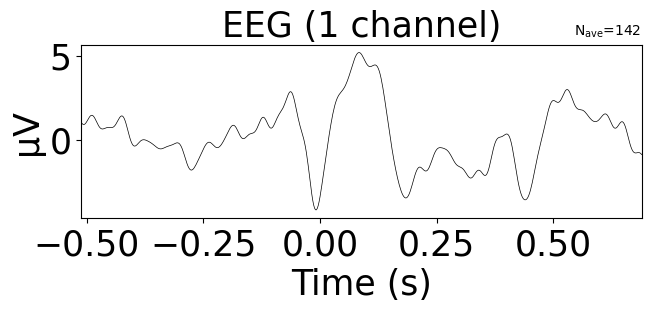

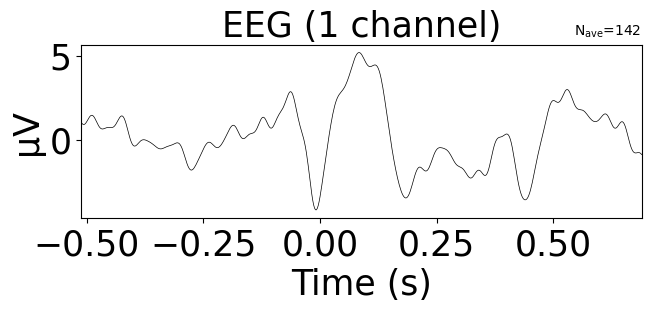

In [53]:
BN_devi_eps.plot(picks= ["Cz"])

N1 (N1 STD time align)
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


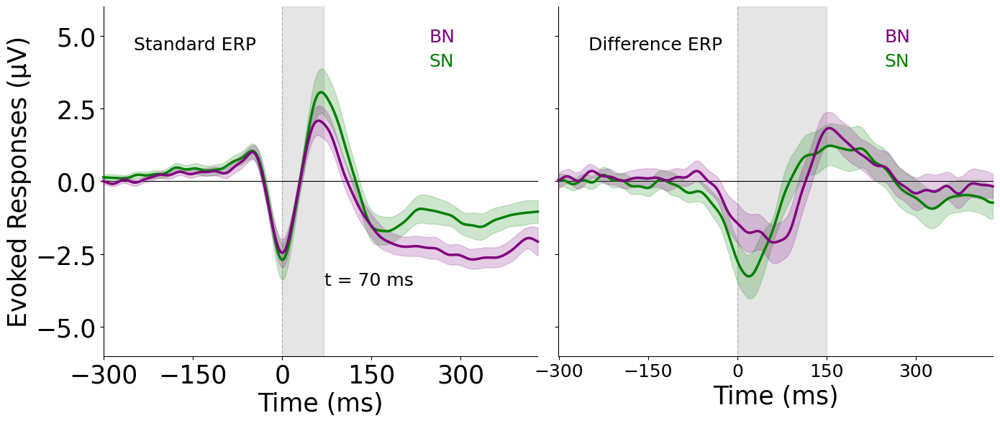

In [54]:
mmn_subject = list(mmn_filtered_df.sub_id.unique())
sn_STD_N1_aligned_SN_MMN_evokeds_dict_all = {sub1:mne.combine_evoked([SN_devi_eps_evoked_dict[sub1], SN_std_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(SN_devi_eps_evoked_dict,SN_std_eps_evoked_dict)
    if sub1==sub2 and sub1 in mmn_subject }  
beep_STD_N1_aligned_BN_MMN_evokeds_dict_all = {sub1:mne.combine_evoked([BN_devi_eps_evoked_dict[sub1], BN_std_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(BN_devi_eps_evoked_dict,BN_std_eps_evoked_dict)
    if sub1==sub2 and sub1 in mmn_subject} 

stylesdict ={
             'SN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
text_labels = [
            (0.90, "BN",'purple'),
            (0.83, f"SN",'green'),
            ] 
time_range=(-.300,.4300)
print('N1 (N1 STD time align)')
fig, axs = plt.subplots(1,2, figsize=(14,6), dpi=100,sharey=True,sharex=True)

N1_evokeds = { 
           'SN':[ SN_std_eps_evoked_dict[sub] for sub in  SN_std_eps_evoked_dict if sub in mmn_subject] ,
           'BN':[BN_std_eps_evoked_dict[sub] for sub in  BN_std_eps_evoked_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 

# for sn_evok in  N1_evokeds['SN']:

#     axs[0].plot(sn_evok.times*1000, sn_evok.copy().get_data(picks=["Cz","Fz",'FCz']).mean(0) *1e+6,alpha= 0.2,c = 'g',lw= 1)

# for sn_evok in  N1_evokeds['BN']:

#     axs[0].plot(sn_evok.times*1000, sn_evok.copy().get_data(picks=["Cz","Fz",'FCz']).mean(0) *1e+6,alpha= 0.2,c = 'purple',lw= 1)



plot_erps(N1_evokeds, picks=['Fz',"FCz", 'Cz'],
       stylesdict=stylesdict,axs = axs[0],
                                   text_labels=text_labels,title=f"",time_range=time_range)
vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
axs[0].axvspan(0 , vline_time, color='gray', alpha=0.2)
# Add label under the vline
axs[0].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)
axs[0].text(-250,5,"Standard ERP", ha='left', va='top', fontsize=18, color='black')


MMN_evokeds = { 
           'SN':sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.values() ,
           'BN':beep_STD_N1_aligned_BN_MMN_evokeds_dict_all.values()  ,
                      } 
plot_erps(MMN_evokeds, picks=['Fz',"FCz", 'Cz'],axs=axs[1],
                                   stylesdict=stylesdict,ylim=(-6,6),ylabel='',
                                   text_labels=text_labels,title=f"",time_range=time_range)    

evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 



axs[1].axvspan(0 , 150, color='gray', alpha=0.2)
axs[1].text(-250,5,"Difference ERP", ha='left', va='top', fontsize=18, color='black')

fig.patch.set_alpha(0)     # Make entire figure background transparent
     # Make axes background transparent
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))

In [55]:
print(mmn_subject)

['sub-sd011', 'sub-sd015', 'sub-sd016', 'sub-sd017', 'sub-sd021', 'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd027', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033', 'sub-sd034', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd040', 'sub-sd041', 'sub-sd043', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd050', 'sub-sd051', 'sub-sd052', 'sub-sd053', 'sub-sd055', 'sub-sd056', 'sub-sd058', 'sub-sd059', 'sub-sd060', 'sub-sd062', 'sub-sd063', 'sub-sd064', 'sub-sd067']


#### at Pz, CpZ, Cz

N1 (N1 STD time align)
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


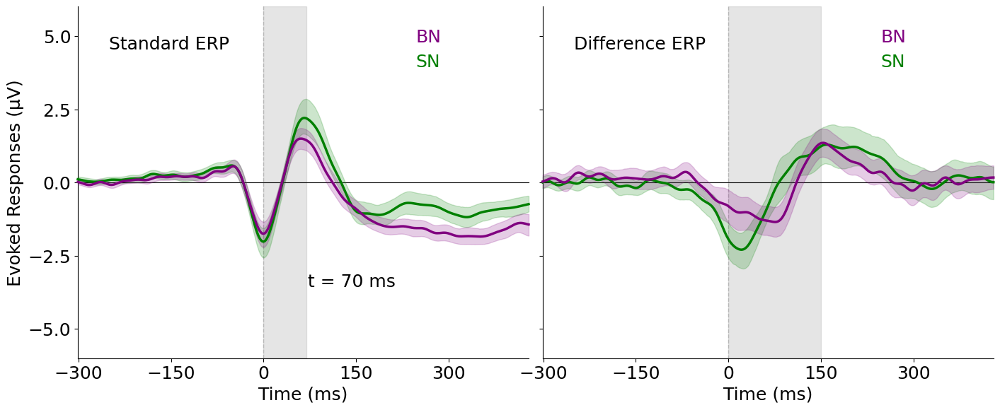

In [56]:
mmn_subject = list(mmn_filtered_df.sub_id.unique())
sn_STD_N1_aligned_SN_MMN_evokeds_dict_all = {sub1:mne.combine_evoked([SN_devi_eps_evoked_dict[sub1], SN_std_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(SN_devi_eps_evoked_dict,SN_std_eps_evoked_dict)
    if sub1==sub2 and sub1 in mmn_subject }  
beep_STD_N1_aligned_BN_MMN_evokeds_dict_all = {sub1:mne.combine_evoked([BN_devi_eps_evoked_dict[sub1], BN_std_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(BN_devi_eps_evoked_dict,BN_std_eps_evoked_dict)
    if sub1==sub2 and sub1 in mmn_subject} 

stylesdict ={
             'SN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
text_labels = [
            (0.90, "BN",'purple'),
            (0.83, f"SN",'green'),
            ] 
time_range=(-.300,.4300)
print('N1 (N1 STD time align)')
fig, axs = plt.subplots(1,2, figsize=(14,6), dpi=100,sharey=True,sharex=True)

N1_evokeds = { 
           'SN':[ SN_std_eps_evoked_dict[sub] for sub in  SN_std_eps_evoked_dict if sub in mmn_subject] ,
           'BN':[BN_std_eps_evoked_dict[sub] for sub in  BN_std_eps_evoked_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 

# for sn_evok in  N1_evokeds['SN']:

#     axs[0].plot(sn_evok.times*1000, sn_evok.copy().get_data(picks=["Cz","Fz",'FCz']).mean(0) *1e+6,alpha= 0.2,c = 'g',lw= 1)

# for sn_evok in  N1_evokeds['BN']:

#     axs[0].plot(sn_evok.times*1000, sn_evok.copy().get_data(picks=["Cz","Fz",'FCz']).mean(0) *1e+6,alpha= 0.2,c = 'purple',lw= 1)



plot_erps(N1_evokeds, picks=['Pz',"CPz", 'Cz'],
       stylesdict=stylesdict,axs = axs[0],
                                   text_labels=text_labels,title=f"",time_range=time_range)
vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
axs[0].axvspan(0 , vline_time, color='gray', alpha=0.2)
# Add label under the vline
axs[0].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)
axs[0].text(-250,5,"Standard ERP", ha='left', va='top', fontsize=18, color='black')


MMN_evokeds = { 
           'SN':sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.values() ,
           'BN':beep_STD_N1_aligned_BN_MMN_evokeds_dict_all.values()  ,
                      } 
plot_erps(MMN_evokeds, picks=['Pz',"CPz", 'Cz'],axs=axs[1],
                                   stylesdict=stylesdict,ylim=(-6,6),ylabel='',
                                   text_labels=text_labels,title=f"",time_range=time_range)    

evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 



axs[1].axvspan(0 , 150, color='gray', alpha=0.2)
axs[1].text(-250,5,"Difference ERP", ha='left', va='top', fontsize=18, color='black')

fig.patch.set_alpha(0)     # Make entire figure background transparent
     # Make axes background transparent
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))

In [57]:
MMN_evokeds

{'SN': dict_values([<Evoked | 'S15 - S24' (average, N=61.207741935483874), -0.5 – 0.68164 s, baseline -0.300781 – 0 s, 64 ch, ~381 kB>, <Evoked | 'S15 - S24' (average, N=120.46674445740958), -0.51172 – 0.65625 s, baseline -0.300781 – 0 s, 64 ch, ~378 kB>, <Evoked | 'S15 - S24' (average, N=121.08077360637088), -0.53125 – 0.63867 s, baseline -0.300781 – 0 s, 64 ch, ~378 kB>, <Evoked | 'S15 - S24' (average, N=101.74965986394558), -0.52344 – 0.67188 s, baseline -0.300781 – 0 s, 64 ch, ~385 kB>, <Evoked | 'S15 - S24' (average, N=108.70609756097562), -0.52734 – 0.66797 s, baseline -0.300781 – 0 s, 64 ch, ~385 kB>, <Evoked | 'S15 - S24' (average, N=83.78079710144928), -0.54297 – 0.64844 s, baseline -0.300781 – 0 s, 64 ch, ~384 kB>, <Evoked | 'S15 - S24' (average, N=102.89345314505776), -0.50586 – 0.68359 s, baseline -0.300781 – 0 s, 64 ch, ~383 kB>, <Evoked | 'S15 - S24' (average, N=120.17709563164108), -0.51758 – 0.67773 s, baseline -0.300781 – 0 s, 64 ch, ~385 kB>, <Evoked | 'S15 - S24' (av

In [58]:
len(sn_STD_N1_aligned_SN_MMN_evokeds_dict_all)

42

In [59]:
len(sn_STD_N1_aligned_SN_MMN_evokeds_dict_all)

42

Identifying common channels ...


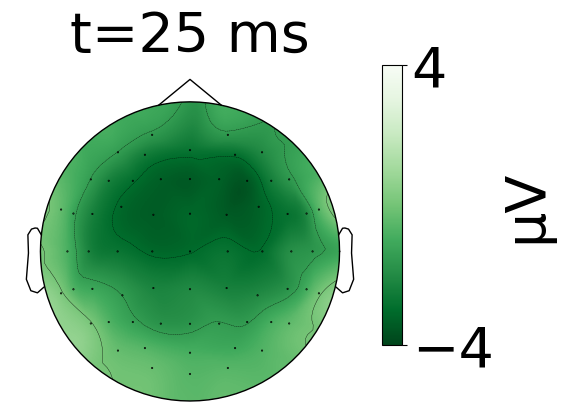

Identifying common channels ...


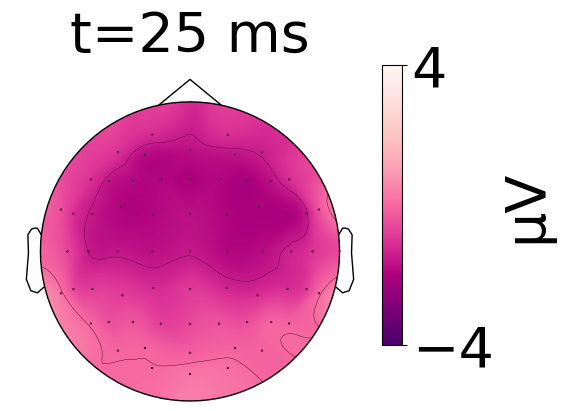

In [60]:
# TOPO MAP with all electrodes 

# TOPO MAP with all electrodes 
import matplotlib.pyplot as plt
import matplotlib as mpl
# Define time points
time_points = [0.025]

# Set the color scale range
vlim = (-4, 4)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None
time_range=(-.200,.350)
evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["SN"]).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='Greens_r',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15, 0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Greens_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40)  # Adjust fontsize here
cbar.set_ticks([-4, 4])
# Add row labels
#fig.text(0.0001, 0.5, 'PS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["BN"]).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='RdPu_r',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15,  0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdPu_r']  # Choose a colormap (like 'RdBu_r')

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40)  # Adjust fontsize here
cbar.set_ticks([-4, 4])

# Add row labels
#fig.text(0.0001, 0.5, 'NPS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()

Identifying common channels ...


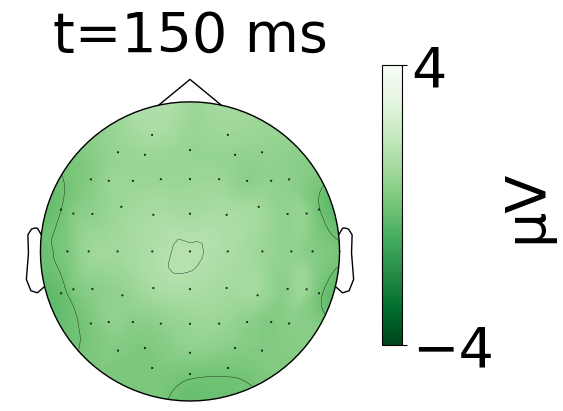

Identifying common channels ...


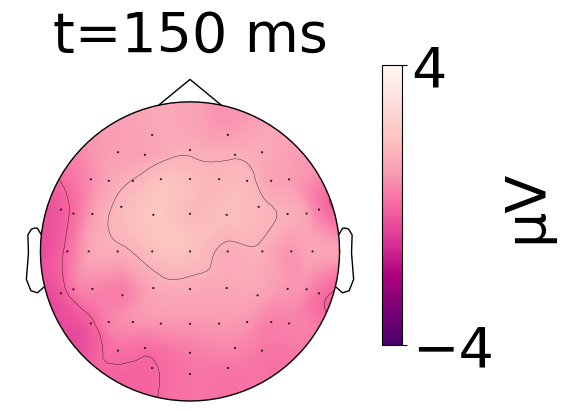

In [61]:
# TOPO MAP with all electrodes 

# TOPO MAP with all electrodes 
import matplotlib.pyplot as plt
import matplotlib as mpl
# Define time points
time_points = [0.150]

# Set the color scale range
vlim = (-4, 4)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None
time_range=(-.200,.350)
evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["SN"]).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='Greens_r',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15, 0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Greens_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40)  # Adjust fontsize here
cbar.set_ticks([-4, 4])
# Add row labels
#fig.text(0.0001, 0.5, 'PS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["BN"]).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='RdPu_r',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15,  0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdPu_r']  # Choose a colormap (like 'RdBu_r')

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40)  # Adjust fontsize here
cbar.set_ticks([-4, 4])

# Add row labels
#fig.text(0.0001, 0.5, 'NPS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()

## Stats Amplitude 

In [62]:
mmn_filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42 entries, 2 to 542
Data columns (total 44 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   sub_id               42 non-null     object 
 1   measure              42 non-null     object 
 2   BN_PA_mean           42 non-null     float64
 3   BN_PA_std            42 non-null     float64
 4   SN_PA_mean           42 non-null     float64
 5   SN_PA_std            42 non-null     float64
 6   BN_PL_mean           42 non-null     float64
 7   BN_PL_std            42 non-null     float64
 8   SN_PL_mean           42 non-null     float64
 9   SN_PL_std            42 non-null     float64
 10  BN_TWMA_mean         42 non-null     float64
 11  BN_TWMA_std          42 non-null     float64
 12  SN_TWMA_mean         42 non-null     float64
 13  SN_TWMA_std          42 non-null     float64
 14  SN_FAL_mean          42 non-null     float64
 15  SN_FAL_std           42 non-null     float64
 

In [63]:

def extract_mmn_amplitudes(case1_dict, case2_dict, time_window=(100, 250), channels=None):
    """Extract mean MMN amplitudes within the specified time window for each subject."""
    # Ensure both dictionaries have the same subjects
    common_subjects = sorted(set(case1_dict.keys()) & set(case2_dict.keys()))
    
    amplitudes_case1 = []
    amplitudes_case2 = []
    
    for subject in common_subjects:
        # Extract MMN data for the time window
        case1_data = case1_dict[subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000)
        case2_data = case2_dict[subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000)
        
        # Get mean amplitude for specific channels or all channels
        if channels:
            case1_amp = np.mean(case1_data.get_data(picks=channels), axis=1)
            case2_amp = np.mean(case2_data.get_data(picks=channels), axis=1)
        else:
            case1_amp = np.mean(case1_data.get_data(), axis=1)
            case2_amp = np.mean(case2_data.get_data(), axis=1)
        
        amplitudes_case1.append(case1_amp)
        amplitudes_case2.append(case2_amp)
    
    return np.array(amplitudes_case1), np.array(amplitudes_case2), common_subjects

 Mean  Amplitude : t_stat [310.] with , p_value [0.07778239]
 Peak Amplitude : t_stat 282.0 with , p_value 0.0336073353764732


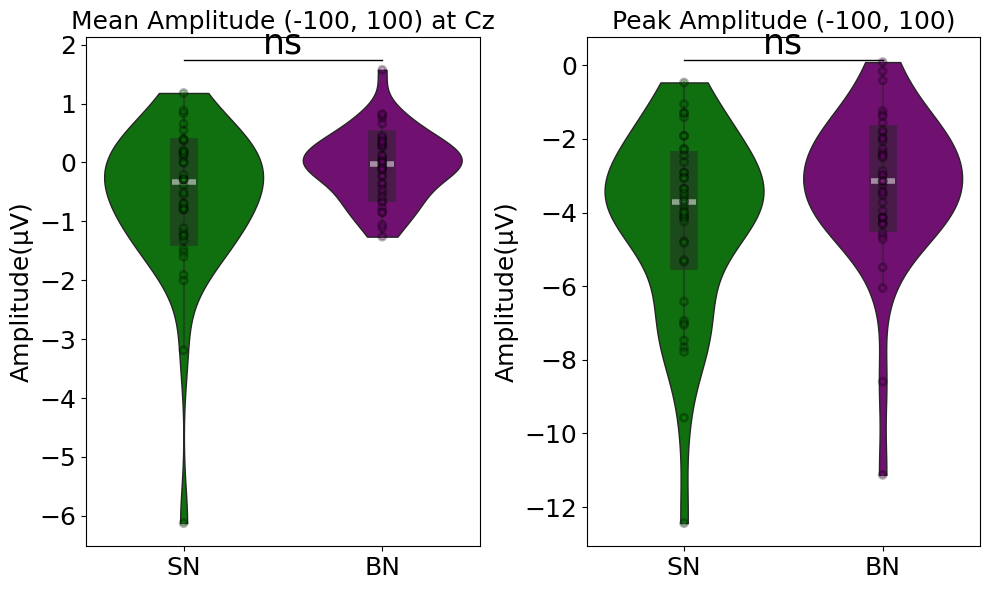

In [64]:
from scipy import stats
import seaborn as sns
from scipy.stats import wilcoxon,ttest_ind,ttest_rel
df_type = "Amplitude"
label=("SN", "BN")
time_window = (-100,100)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels

def df_convert(case1_amps, case2_amps, label=("Case1", "Case2"), title='', df_type = "Amplitude"):
    n_subjects, n_channels = case1_amps.shape
    data = pd.DataFrame({
        df_type: np.concatenate([case1_amps.flatten(), case2_amps.flatten()]),
        'Case': np.repeat([label[0], label[1]], n_subjects * n_channels),

    })
    
    return data
# # Extract amplitudes

PN_amps =  mmn_filtered_df['SN_TWMA_mean'].to_numpy().reshape(-1,1)
BN_amps = mmn_filtered_df['BN_TWMA_mean'].to_numpy().reshape(-1,1)

#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df = df_convert(PN_amps, BN_amps,label=("SN", "BN") ,df_type = df_type)
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)

sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = wilcoxon(PN_amps, BN_amps)
star_label =  '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])
 


SN_amps_peak  =  mmn_filtered_df['SN_PA_mean'].to_numpy()
BN_amps_peak = mmn_filtered_df['BN_PA_mean'].to_numpy()
# Fraction area plot 
df=df_convert(SN_amps_peak.reshape(-1, 1), BN_amps_peak.reshape(-1, 1),label=("SN", "BN") ,df_type = df_type)

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = wilcoxon(SN_amps_peak, BN_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')

ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

In [65]:
PN_amps.shape

(42, 1)

In [66]:
mmn_filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42 entries, 2 to 542
Data columns (total 44 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   sub_id               42 non-null     object 
 1   measure              42 non-null     object 
 2   BN_PA_mean           42 non-null     float64
 3   BN_PA_std            42 non-null     float64
 4   SN_PA_mean           42 non-null     float64
 5   SN_PA_std            42 non-null     float64
 6   BN_PL_mean           42 non-null     float64
 7   BN_PL_std            42 non-null     float64
 8   SN_PL_mean           42 non-null     float64
 9   SN_PL_std            42 non-null     float64
 10  BN_TWMA_mean         42 non-null     float64
 11  BN_TWMA_std          42 non-null     float64
 12  SN_TWMA_mean         42 non-null     float64
 13  SN_TWMA_std          42 non-null     float64
 14  SN_FAL_mean          42 non-null     float64
 15  SN_FAL_std           42 non-null     float64
 

## Stats Latency 


Peak latency ;- t_stat [-3.15689087] with , p_value [0.00298785]
Fractional area (50 %) latency ;- t_stat [366.] with , p_value [0.29112721]


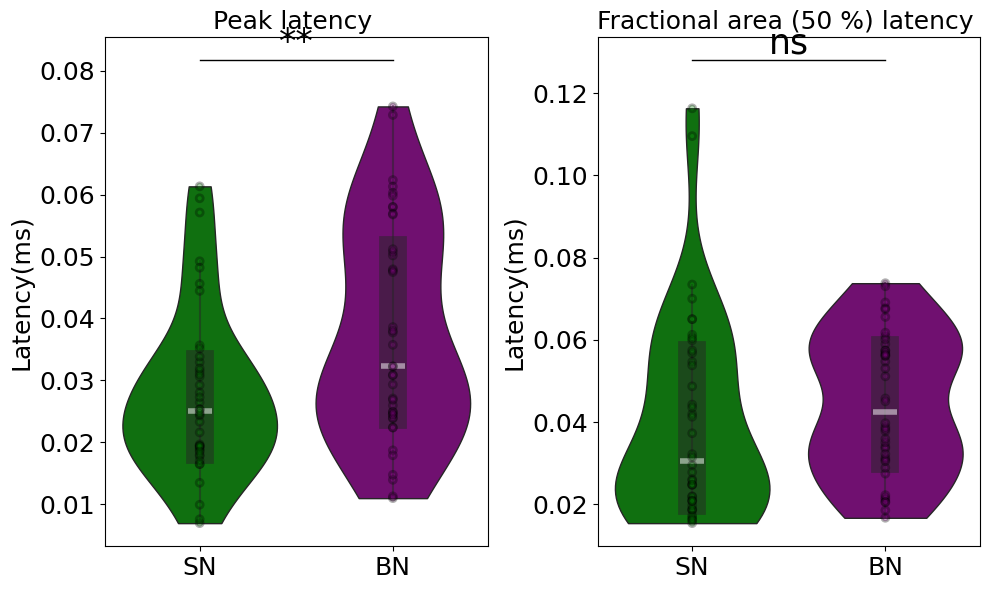

In [67]:
# Extract Latency    
df_type = "Latency"
label=("SN", "BN")
 # ms - typical MMN window

# Set up the plot
SN_PL_ = mmn_filtered_df['SN_PL_mean'].to_numpy().reshape(-1,1)
BN_PL_ = mmn_filtered_df['BN_PL_mean'].to_numpy().reshape(-1,1)
df = df_convert(SN_PL_,BN_PL_ ,label=("SN", "BN"),df_type = df_type)


df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'), 
#             capprops=dict(color='black'),  
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = ttest_rel(SN_PL_,BN_PL_)
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency ", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])



# Fraction area plot 
SN_area_lat = mmn_filtered_df['SN_FAL_mean'].to_numpy().reshape(-1,1)
BN_area_lat = mmn_filtered_df['BN_FAL_mean'].to_numpy().reshape(-1,1)
df = df_convert(SN_area_lat, BN_area_lat,label=("SN", "BN"),df_type = df_type)
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = wilcoxon(SN_area_lat,BN_area_lat)
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label =  '****' if p_value <= 1e-4 else '***' if p_value <= 1e-3 else '**' if p_value <= 1e-2 else '*' if p_value <= 5e-2 else 'ns'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

## Combined Figure 3 MMN


combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


BN stats (TWMA)
 mean : -0.05725088196465489 std : 0.5823509790589775
SN stats(TWMA) 
 mean : -0.5977091324829542 std : 1.2457124151604202;std sum 0.11020794837001342
sub_id                                                         sub-sd011
measure                                                            n1mmn
BN_PA_mean                                                     -4.134004
BN_PA_std                                                       0.792619
SN_PA_mean                                                     -3.738444
SN_PA_std                                                       1.139663
BN_PL_mean                                                      0.074258
BN_PL_std                                                       0.024218
SN_PL_mean                                                      0.028008
SN_PL_std                                                       0.018732
BN_TWMA_mean                                                   -0.662618
BN_TWMA_std                   

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2229880563.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


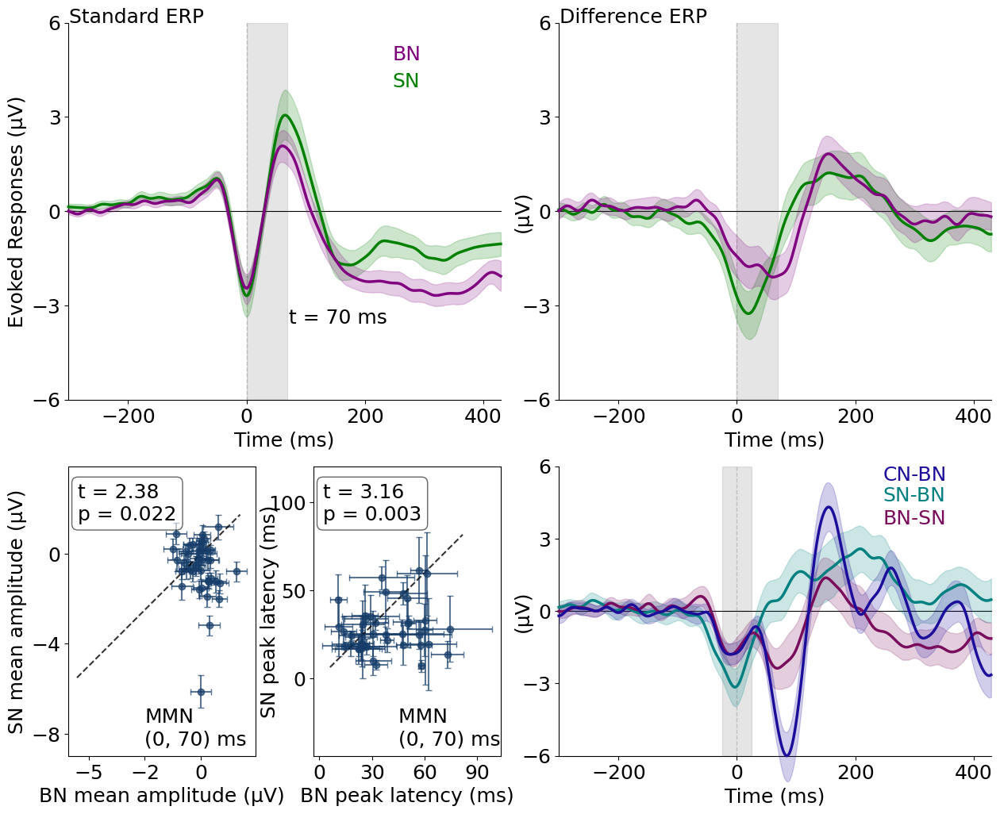

In [68]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.gridspec import GridSpec
import numpy as np

# -----------------------------
# CONFIG
# -----------------------------
stylesdict = {
    'SN': {"linewidth": 2.5, "linestyle": 'solid', "color": 'green'},
    'BN': {"linewidth": 2.5, "linestyle": 'solid', "color": 'purple'},
}

text_labels = [
    (0.90, "BN", 'purple'),
    (0.83, "SN", 'green'),
]

time_range = (-0.300, 0.430)

# -----------------------------
# CREATE FIGURE & GRID
# -----------------------------
fig = plt.figure(figsize=(15, 12), dpi=100)

# -----------------------------
# AXES
# -----------------------------

gs = GridSpec(nrows=2, ncols=8,figure=fig,height_ratios=[1.3, 1.],hspace=0.20,wspace=0.9)

# -----------------------------
# AXES
# -----------------------------
# Top row: 2 big ERPs (3 columns each)
ax_erp_top_1 = fig.add_subplot(gs[0, 0:4])
ax_erp_top_2 = fig.add_subplot(gs[0, 4:8], sharey=ax_erp_top_1)

# Bottom row: 3 equal panels (2 columns each)
ax_scatter_1 = fig.add_subplot(gs[1, 0:2])
ax_scatter_2 = fig.add_subplot(gs[1, 2:4])
ax_erp_bottom = fig.add_subplot(gs[1, 4:8], sharey=ax_erp_top_1)

# ==========================================================
# TOP ROW — ERP PLOTS
# ==========================================================
plot_erps(N1_evokeds,picks=['Fz', 'FCz', 'Cz'],axs=ax_erp_top_1,stylesdict=stylesdict,text_labels=text_labels,time_range=time_range)
ax_erp_top_1.text(-300, 6, "Standard ERP", fontsize=18)

plot_erps(MMN_evokeds,picks=['Fz', 'FCz', 'Cz'],axs=ax_erp_top_2,stylesdict=stylesdict,text_labels=None,time_range=time_range,ylabel="")
ax_erp_top_2.text(-300, 6, "Difference ERP", fontsize=18)
vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000


ax_erp_top_1.text(vline_time+2, ax_erp_top_1.get_ylim()[1] -0.75 * np.diff(ax_erp_top_1.get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)
ax_erp_top_2.axvspan(0 , vline_time, color='gray', alpha=0.2)
ax_erp_top_1.axvspan(0 , vline_time, color='gray', alpha=0.2)
# ==========================================================
# BOTTOM LEFT — SCATTER (TWMA)
# ==========================================================
plot_bn_vs_sn( mmn_filtered_df,metric="TWMA",ax=ax_scatter_1,stat_test="t-test",col_id=None,default_color="#163D69")

# ==========================================================
# BOTTOM MIDDLE — SCATTER (PL)
# ==========================================================
plot_bn_vs_sn(df=mmn_filtered_df * 1000,metric="PL", ax=ax_scatter_2,
    default_color="#163D69",col_id=None,)

# ==========================================================
# BOTTOM RIGHT — ERP WITH TIMING
# ==========================================================
import pickle

with open("cn_sn_plot_data.pkl", "rb") as f:
    plot_data = pickle.load(f)

MMN_evokeds_loaded = {
    "SN": plot_data["SN_evokeds"],
    "BN": plot_data["BN_evokeds"],
    "CN" : plot_data['CN_evokeds']
}

text_labels_loaded = plot_data["text_labels"]
time_range_loaded = plot_data["time_range"]
stylesdict_loaded = plot_data["stylesdict"]
plot_erps(
    MMN_evokeds_loaded,
    picks=['Fz', 'FCz', 'Cz'],
    axs=ax_erp_bottom,                 # 👈 bottom-right axis
    stylesdict=stylesdict_loaded,
    ylim=(-6, 6),
    text_labels=text_labels_loaded,
    time_range=(-0.300, 0.430)
)


vline_time = score_df.loc[
    score_df['measure'] == 'n1stdp2', 'SN_PL_mean'
].mean() * 1000

ax_erp_bottom.axvspan(-25, 25, color='gray', alpha=0.2)
# ax_erp_bottom.text(
#     vline_time + 2,
#     ax_erp_bottom.get_ylim()[1] - 0.75 * np.diff(ax_erp_bottom.get_ylim()),
#     f"t = {vline_time:.0f} ms",
#     fontsize=16
# )
# ax_erp_top_1.set_ylabel("Amplitude (µV)")

# for ax in [ax_erp_top_2, ax_erp_bottom]:
#     ax.set_ylabel("")
#     ax.tick_params(axis="y", labelleft=False)
for ax in [ax_erp_top_2, ax_erp_bottom]:
    ax.set_ylabel("(µV)",labelpad=-10)
    #ax.tick_params(axis="y", labelleft=False)
ax_scatter_2.set_ylabel("SN peak latency (ms)",labelpad=-10)
ax_scatter_2.set_xlabel("BN peak latency (ms)",)
ax_scatter_1.set_ylabel("SN mean amplitude (µV)")
ax_scatter_1.set_xlabel("BN mean amplitude (µV)")
ax_scatter_1.text(-2.5,-8.5,"MMN\n(0, 70) ms",fontsize = 18)
ax_scatter_2.text(45, -38,"MMN \n(0, 70) ms", fontsize =18 )
# ==========================================================
# GLOBAL FORMATTING
# ==========================================================
for ax in fig.axes:
    if ax.has_data():
        ax.xaxis.set_major_formatter('{x:.0f}')
        ax.xaxis.set_major_locator(ticker.MaxNLocator(4))
        ax.yaxis.set_major_locator(ticker.MaxNLocator(4))
        ax.patch.set_alpha(0)
ax_scatter_1.xaxis.set_major_locator(ticker.MaxNLocator(4))
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()


combining channels using "mean"
combining channels using "mean"
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
combining channels using "mean"
combining channels using "mean"
BN stats (TWMA)
 mean : -0.05725088196465489 std : 0.5823509790589775
SN stats(TWMA) 
 mean : -0.5977091324829542 std : 1.2457124151604202;std sum 0.11020794837001342
sub_id                                                         sub-sd011
measure                                                            n1mmn
BN_PA_mean                                                     -4.134004
BN_PA_std                                                       0.792619
SN_PA_mean                                                     -3.738444
SN_PA_std                                                       1.139663
BN_PL_mean                                                      0.074258
BN_PL_std                                                       0.

e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


sub_id                 sub-sd015sub-sd015sub-sd015sub-sd015sub-sd015s...
measure                n1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn1mmnn...
BN_PA_mean                                                  -2374.648029
BN_PA_std                                                     872.614721
SN_PA_mean                                                   -1291.21538
SN_PA_std                                                     902.626544
BN_PL_mean                                                      37.71658
BN_PL_std                                                      12.630793
SN_PL_mean                                                     49.234375
SN_PL_std                                                      17.949554
BN_TWMA_mean                                                  397.974001
BN_TWMA_std                                                   214.402652
SN_TWMA_mean                                                  180.467235
SN_TWMA_std                                        

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\3710132083.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


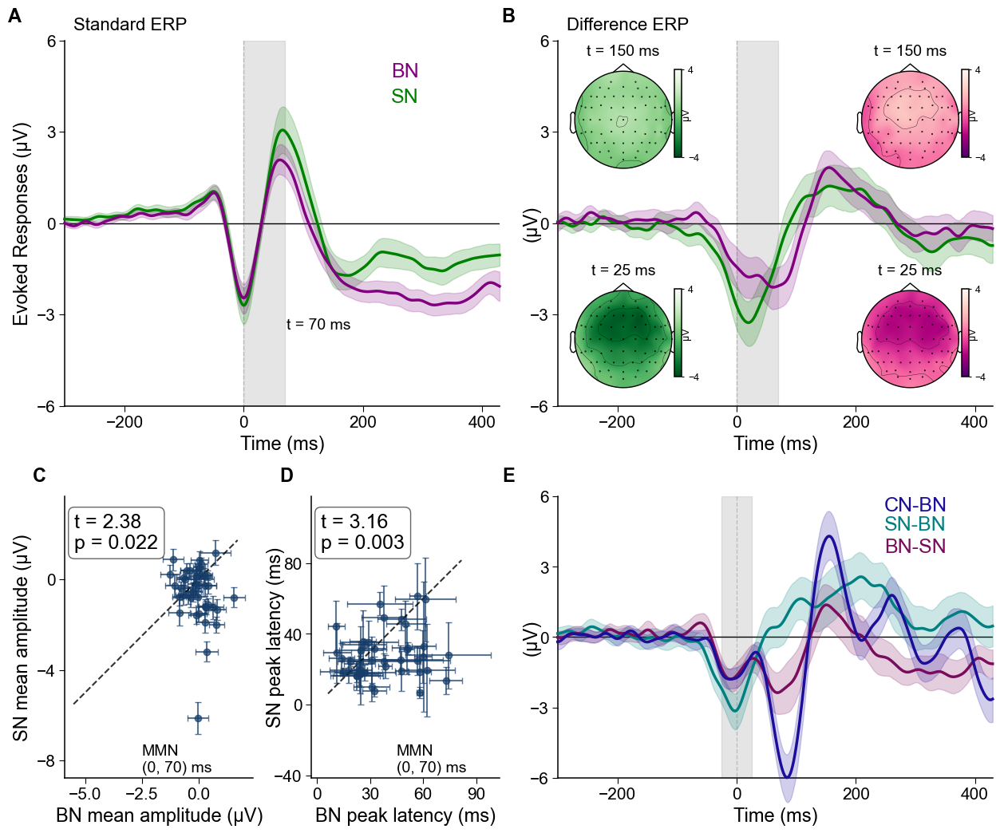

In [69]:
"""
Publication-quality MMN figure — PDF-safe colorbars.

FIX (PNG was fine, PDF was broken):
  The topomap colorbars used mpl_toolkits.axes_grid1.inset_axes, whose
  draw-time anchored locator mis-resolves under fig.tight_layout() +
  bbox_inches='tight' in the vector (PDF) backend. Result: colorbars dropped
  from panel B and scattered into panel C as stray green/purple slivers.
  They now use the native ax.inset_axes([x, y, w, h]), which tracks the parent
  head in BOTH PNG and PDF. (Verified by rendering the PDF.)

DEPENDENCIES (used verbatim): plot_erps, plot_bn_vs_sn, N1_evokeds,
  MMN_evokeds, score_df, mmn_filtered_df, and cn_sn_plot_data.pkl.
"""

import pickle

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import mne
from matplotlib.gridspec import GridSpec

# =========================================================================
# 1. GLOBAL STYLE — single source of truth for typography
# =========================================================================
FS_PANEL = 17   # panel letters (A, B, ...)
FS_TITLE = 16   # in-panel titles ("Standard ERP" ...)
FS_LABEL = 17   # axis labels
FS_TICK  = 15   # tick labels
FS_ANNOT = 14   # in-plot annotations ("MMN (0,70) ms", "t = 70 ms")
FS_TOPO  = 14   # topomap titles

plt.rcParams.update({
    "font.family":         "sans-serif",
    "font.sans-serif":     ["Arial", "Helvetica", "DejaVu Sans"],
    "font.size":           FS_TICK,
    "axes.labelsize":      FS_LABEL,
    "axes.titlesize":      FS_TITLE,
    "xtick.labelsize":     FS_TICK,
    "ytick.labelsize":     FS_TICK,
    "axes.linewidth":      1.1,
    "axes.spines.top":     False,
    "axes.spines.right":   False,
    "xtick.direction":     "out",
    "ytick.direction":     "out",
    "savefig.dpi":         300,
    "savefig.bbox":        "tight",
    "savefig.transparent": True,
})


def add_panel_label(ax, letter, x=-0.10, y=1.04):
    """Bold panel letter in axes-fraction coords (independent of data range)."""
    ax.text(x, y, letter, transform=ax.transAxes,
            fontsize=FS_PANEL, fontweight="bold", va="bottom", ha="right")


def add_topo_colorbar_close(ax_topo, cmap, vlim, ticks=None, label="µV"):
    """Colorbar attached to a topomap head.

    Uses the NATIVE ax.inset_axes (a true child axes in fixed axes-fraction
    coords) instead of mpl_toolkits.axes_grid1.inset_axes. The native version
    tracks the parent head identically in PNG and PDF; the axes_grid1 version
    mis-positioned in the PDF backend under tight_layout/bbox='tight'.
    """
    cax = ax_topo.inset_axes([0.94, 0.10, 0.06, 0.80])   # [x, y, w, h]
    norm = mpl.colors.Normalize(*vlim)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cb = ax_topo.figure.colorbar(sm, cax=cax)
    cb.set_label(label, fontsize=9, labelpad=-16)
    cb.ax.tick_params(labelsize=9, length=2)
    if ticks is not None:
        cb.set_ticks(ticks)
    cax.set_facecolor("none")
    return cb


def style_topo(ax):
    """Strip the stray coordinate ticks/frame MNE leaves on inset topomaps."""
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.patch.set_alpha(0)
    ax.set_facecolor("none")


def draw_topo(evokeds_list, t, ax, cmap, vlim, title):
    """Grand-average topomap + clean styling + matched colorbar, in one call."""
    mne.grand_average(evokeds_list).plot_topomap(
        times=[t], axes=ax, vlim=vlim, cmap=cmap, colorbar=False, show=False,
    )
    ax.set_title(title, fontsize=FS_TOPO, pad=2)
    style_topo(ax)
    add_topo_colorbar_close(ax, cmap=cmap, vlim=vlim, ticks=list(vlim))


# =========================================================================
# 2. CONFIG
# =========================================================================
stylesdict = {
    "SN": {"linewidth": 2.5, "linestyle": "solid", "color": "green"},
    "BN": {"linewidth": 2.5, "linestyle": "solid", "color": "purple"},
}
text_labels = [(0.90, "BN", "purple"), (0.83, "SN", "green")]
time_range  = (-0.300, 0.430)

# =========================================================================
# 3. FIGURE & GRID
# =========================================================================
fig = plt.figure(figsize=(15, 12), dpi=100)
gs = GridSpec(nrows=2, ncols=8, figure=fig,
              height_ratios=[1.3, 1.0], hspace=0.28, wspace=0.9)

ax_erp_top_1  = fig.add_subplot(gs[0, 0:4])
ax_erp_top_2  = fig.add_subplot(gs[0, 4:8], sharey=ax_erp_top_1)
ax_scatter_1  = fig.add_subplot(gs[1, 0:2])
ax_scatter_2  = fig.add_subplot(gs[1, 2:4])
ax_erp_bottom = fig.add_subplot(gs[1, 4:8], sharey=ax_erp_top_1)

# =========================================================================
# 4. TOP-LEFT — STANDARD ERP
# =========================================================================
plot_erps(N1_evokeds, picks=["Fz", "FCz", "Cz"], axs=ax_erp_top_1,
          stylesdict=stylesdict, text_labels=text_labels, time_range=time_range)
ax_erp_top_1.text(0.02, 1.02, "Standard ERP", transform=ax_erp_top_1.transAxes,
                  fontsize=FS_TITLE, va="bottom")

# =========================================================================
# 5. TOP-RIGHT — DIFFERENCE ERP + TOPO INSETS
# =========================================================================
topo_time_range = (-0.200, 0.350)
evokeds_subset = {
    cond: [evk.copy().crop(tmin=topo_time_range[0], tmax=topo_time_range[1])
           for evk in MMN_evokeds[cond]]
    for cond in MMN_evokeds
}

vlim = (-4, 4)
t_early, t_late = 0.025, 0.150

# --- Topomap placement: one in each corner of panel B -------------------
# >>> TWEAK: x, y = lower-left corner of each topo; W, H = its size.
W, H = 0.3, 0.3
M    = 0.04                # right-edge margin so the colorbar/µV label fits

RECT_TOPLEFT     = [0.0,         0.95 - H, W, H]   # SN, t = 150 ms
RECT_BOTTOMLEFT  = [0.0,         0.05,     W, H]   # SN, t =  25 ms
RECT_TOPRIGHT    = [1.0 - W - M, 0.95 - H, W, H]   # BN, t = 150 ms
RECT_BOTTOMRIGHT = [1.0 - W - M, 0.05,     W, H]   # BN, t =  25 ms

ax_sn150 = ax_erp_top_2.inset_axes(RECT_TOPLEFT)
ax_sn025 = ax_erp_top_2.inset_axes(RECT_BOTTOMLEFT)
ax_bn150 = ax_erp_top_2.inset_axes(RECT_TOPRIGHT)
ax_bn025 = ax_erp_top_2.inset_axes(RECT_BOTTOMRIGHT)

draw_topo(evokeds_subset["SN"], t_late,  ax_sn150, "Greens_r", vlim, "t = 150 ms")
draw_topo(evokeds_subset["SN"], t_early, ax_sn025, "Greens_r", vlim, "t = 25 ms")
draw_topo(evokeds_subset["BN"], t_late,  ax_bn150, "RdPu_r",   vlim, "t = 150 ms")
draw_topo(evokeds_subset["BN"], t_early, ax_bn025, "RdPu_r",   vlim, "t = 25 ms")

plot_erps(MMN_evokeds, picks=["Fz", "FCz", "Cz"], axs=ax_erp_top_2,
          stylesdict=stylesdict, text_labels=None, time_range=time_range, ylabel="")
ax_erp_top_2.text(0.02, 1.02, "Difference ERP", transform=ax_erp_top_2.transAxes,
                  fontsize=FS_TITLE, va="bottom")

# shaded MMN window + t-marker
vline_time = score_df[score_df["measure"] == "n1stdp2"]["SN_PL_mean"].mean() * 1000
ax_erp_top_1.text(
    vline_time + 2,
    ax_erp_top_1.get_ylim()[1] - 0.75 * np.diff(ax_erp_top_1.get_ylim()),
    f"t = {vline_time:.0f} ms", ha="left", va="top",
    fontsize=FS_ANNOT, color="black",
)
for ax in (ax_erp_top_1, ax_erp_top_2):
    ax.axvspan(0, vline_time, color="gray", alpha=0.2)

# =========================================================================
# 6. BOTTOM-LEFT / MIDDLE — SCATTERS
# =========================================================================
plot_bn_vs_sn(mmn_filtered_df, metric="TWMA", ax=ax_scatter_1,
              stat_test="t-test", col_id=None, default_color="#163D69")
plot_bn_vs_sn(df=mmn_filtered_df * 1000, metric="PL", ax=ax_scatter_2,
              default_color="#163D69", col_id=None)

# =========================================================================
# 7. BOTTOM-RIGHT — CN / SN / BN ERP
# =========================================================================
with open("cn_sn_plot_data.pkl", "rb") as f:
    plot_data = pickle.load(f)

MMN_evokeds_loaded = {
    "SN": plot_data["SN_evokeds"],
    "BN": plot_data["BN_evokeds"],
    "CN": plot_data["CN_evokeds"],
}
plot_erps(MMN_evokeds_loaded, picks=["Fz", "FCz", "Cz"], axs=ax_erp_bottom,
          stylesdict=plot_data["stylesdict"], ylim=(-6, 6),
          text_labels=plot_data["text_labels"], time_range=(-0.300, 0.430))
ax_erp_bottom.axvspan(-25, 25, color="gray", alpha=0.2)

# =========================================================================
# 8. AXIS LABELS & ANNOTATIONS
# =========================================================================
for ax in (ax_erp_top_2, ax_erp_bottom):
    ax.set_ylabel("(µV)", labelpad=-10)

ax_scatter_1.set_xlabel("BN mean amplitude (µV)")
ax_scatter_1.set_ylabel("SN mean amplitude (µV)")
ax_scatter_2.set_xlabel("BN peak latency (ms)")
ax_scatter_2.set_ylabel("SN peak latency (ms)", labelpad=-10)

ax_scatter_1.text(-2.5, -8.5, "MMN\n(0, 70) ms", fontsize=FS_ANNOT)
ax_scatter_2.text(45, -38, "MMN\n(0, 70) ms", fontsize=FS_ANNOT)

# =========================================================================
# 9. PANEL LETTERS
# =========================================================================
add_panel_label(ax_erp_top_1,  "A")
add_panel_label(ax_erp_top_2,  "B")
add_panel_label(ax_scatter_1,  "C")
add_panel_label(ax_scatter_2,  "D")
add_panel_label(ax_erp_bottom, "E")

# =========================================================================
# 10. TICK FORMATTING
# =========================================================================
ERP_XLIM   = (-300, 430)
ERP_XTICKS = [-200, 0, 200, 400]
ERP_YLIM   = (-6, 6)
ERP_YTICKS = [-6, -3, 0, 3, 6]

for ax in (ax_erp_top_1, ax_erp_top_2, ax_erp_bottom):
    ax.set_xlim(ERP_XLIM)
    ax.set_ylim(ERP_YLIM)
    ax.set_xticks(ERP_XTICKS)
    ax.set_yticks(ERP_YTICKS)
    ax.xaxis.set_major_formatter("{x:.0f}")
    ax.yaxis.set_major_formatter("{x:.0f}")
    ax.set_xlabel("Time (ms)")
    ax.axhline(0, color="black", linewidth=1.0, zorder=1.5)
    ax.tick_params(axis="both", labelbottom=True, labelleft=True,
                   length=5, labelsize=FS_TICK)
    ax.xaxis.label.set_size(FS_LABEL)
    ax.yaxis.label.set_size(FS_LABEL)
    ax.patch.set_alpha(0)

for ax in (ax_scatter_1, ax_scatter_2):
    ax.xaxis.set_major_locator(ticker.MaxNLocator(4))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(4))
    ax.tick_params(length=5, labelsize=FS_TICK)
    ax.xaxis.label.set_size(FS_LABEL)
    ax.yaxis.label.set_size(FS_LABEL)
    ax.patch.set_alpha(0)

fig.patch.set_alpha(0)
fig.tight_layout()

# =========================================================================
# 11. EXPORT
# =========================================================================
fig.savefig("Figure_3.pdf")           # vector — now renders colorbars correctly
fig.savefig("Figure_3.png", dpi=300)  # raster preview
plt.show()

## Cluster permulation test 


In [70]:
import mne
import numpy as np
import matplotlib.pyplot as plt

def plot_mmn_cluster(evokeds_cls1, evokeds_cls2,labelc1= 'SN',labelc2 = "BN", picks=["Cz","Fz","FCz"], alpha=0.05,tail = 0,thres = 2.5 ,stat_fn = None):

    # 1) Extract channel-averaged time series
    cls1 = np.array([evk.copy().get_data(picks=picks).mean(0) for evk in evokeds_cls1])
    cls2 = np.array([evk.copy().get_data(picks=picks).mean(0) for evk in evokeds_cls2])

    print("Shapes:", cls1.shape, cls2.shape)

    # 2) Simple 1D permutation cluster test
    t_vals, clusters, p_vals, h0 = mne.stats.permutation_cluster_test(
        [cls1, cls2],
        out_type="mask",
        n_permutations=10000,
        tail=tail,
        seed=111,threshold = thres,
        stat_fun= stat_fn,
    )
    print( clusters,p_vals)
    times = evokeds_cls1[0].times

    # 3) Plot
    fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(10, 8), sharex=True)

    # PANEL 1: ERPs
    ax0.axvline(0, linestyle="--", color="black")
    ax0.plot(times, cls1.mean(0), label=labelc1,color ="green" )
    ax0.plot(times, cls2.mean(0), label=labelc2,color = "purple")
    ax0.set_ylabel("uV")
    ax0.legend()

    # PANEL 2: Difference
    ax1.axvline(0, linestyle="--", color="black")
    ax1.plot(times, cls1.mean(0) - cls2.mean(0))
    ax1.axhline(0, linestyle="--", color="black")
    ax1.set_ylabel("Difference")

    # PANEL 3: T-values + clusters
    ax2.axvline(0, linestyle="--", color="black")
    h = None

    for i, c in enumerate(clusters):
        cluster = c[0]

        # Handle boolean mask (new MNE)
        if isinstance(cluster, np.ndarray):
            if cluster.any():
                t_start = times[cluster][0]
                t_end   = times[cluster][-1]

        # Handle slice (old MNE)
        elif isinstance(cluster, slice):
            t_start = times[cluster.start]
            t_end   = times[cluster.stop - 1]

        else:
            continue

        # plot significant vs non-significant
        if p_vals[i] <= alpha:
            h = ax2.axvspan(t_start, t_end, color='red', alpha=0.4)
        else:
            ax2.axvspan(t_start, t_end, color='gray', alpha=0.2)

    # t-values
    ax2.plot(times, t_vals, 'b')
    if h is not None:
        ax2.legend([h], ["cluster p < {}".format(alpha)])

    ax2.set_xlabel("time (s)")
    ax2.set_ylabel("t-values")
    ax2.set_title("Cluster Permutation Test")

    plt.tight_layout()
    #plt.show()
    return fig, (ax0, ax1, ax2)


Shapes: (42, 360) (42, 360)
stat_fun(H1): min=6.397012409232898e-06 max=11.005243403015388
Running initial clustering …
Found 8 clusters


  0%|          | Permuting : 0/9999 [00:00<?,       ?it/s]

[(slice(7, 14, None),), (slice(24, 35, None),), (slice(62, 83, None),), (slice(101, 179, None),), (slice(185, 217, None),), (slice(226, 242, None),), (slice(314, 338, None),), (slice(353, 360, None),)] [0.9991 0.9185 0.9139 0.0733 0.2526 0.9768 0.9167 0.9996]


(<Figure size 1000x800 with 3 Axes>,
 (<Axes: ylabel='uV'>,
  <Axes: ylabel='Difference'>,
  <Axes: title={'center': 'Cluster Permutation Test'}, xlabel='time (s)', ylabel='t-values'>))

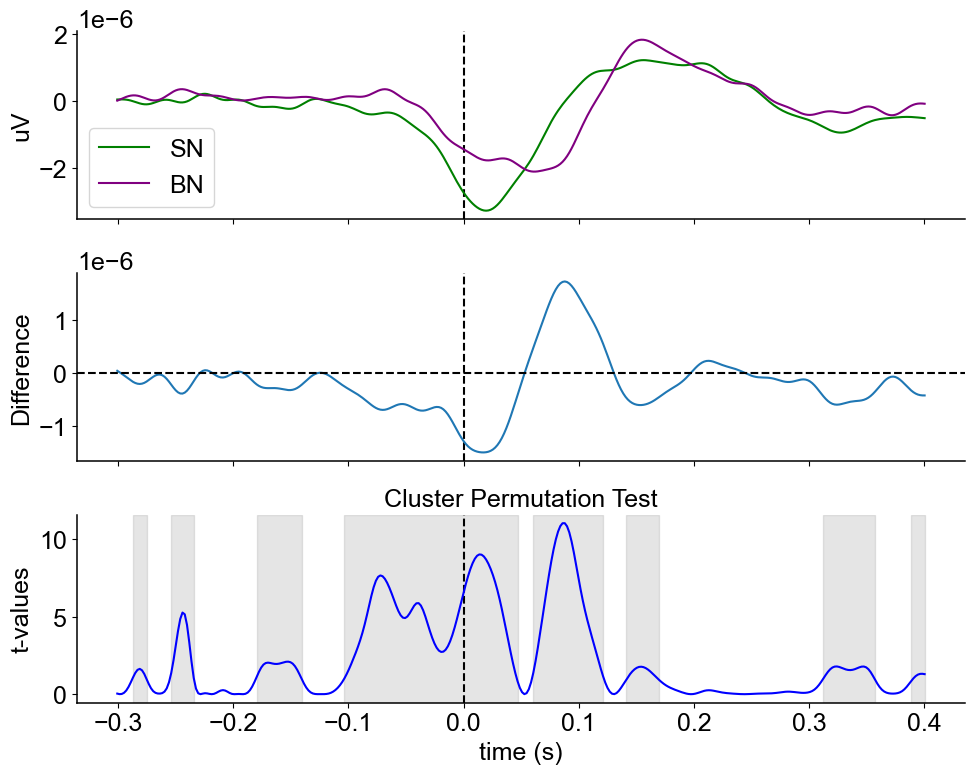

In [71]:
time_range= (-.300, .400)
evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 
plot_mmn_cluster(
    evokeds_subset['SN'],
    evokeds_subset['BN'],
    picks=['Cz','Fz','FCz'],tail=1,thres=.8
)



Shapes: (42, 360) (42, 360)
stat_fun(H1): min=1.1994881134061153e-06 max=8.890105048816704
Running initial clustering …
Found 7 clusters


  0%|          | Permuting : 0/9999 [00:00<?,       ?it/s]

[(slice(8, 15, None),), (slice(24, 35, None),), (slice(44, 50, None),), (slice(61, 83, None),), (slice(100, 179, None),), (slice(185, 217, None),), (slice(254, 293, None),)] [0.9982 0.9405 0.9994 0.9138 0.1399 0.3202 0.7367]


(<Figure size 1000x800 with 3 Axes>,
 (<Axes: ylabel='uV'>,
  <Axes: ylabel='Difference'>,
  <Axes: title={'center': 'Cluster Permutation Test'}, xlabel='time (s)', ylabel='t-values'>))

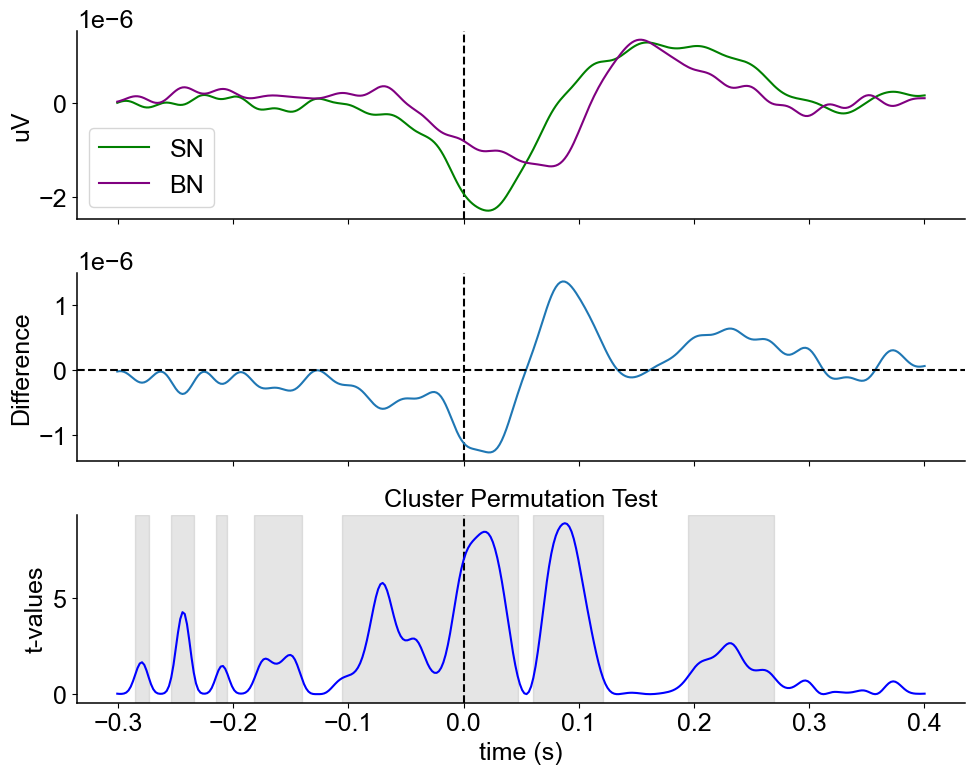

In [72]:
time_range= (-.300, .400)
evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 
plot_mmn_cluster(
    evokeds_subset['SN'],
    evokeds_subset['BN'],
    picks=['Cz','Pz','CPz'],tail=1,thres=.8
)

In [73]:
evokeds_subset["SN"][0].times[314], evokeds_subset["SN"][0].times[338]

(np.float64(0.3125), np.float64(0.359375))

# Reviewers based ERP analysis 

## Male vs Female

In [74]:
male_sub = mmn_filtered_df[mmn_filtered_df['gender']=='M']['sub_id'].unique()
female_sub = mmn_filtered_df[mmn_filtered_df['gender']=='F']['sub_id'].unique()

print(len(male_sub), len(female_sub))
gender_groups = {
    'male sub': list(male_sub),
    'female sub': list(female_sub),
}
gender_groups


gender_groups_SN_MMN_evokes = {key: [] for key in gender_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in gender_groups.items():
        if sub in subject_list:
            gender_groups_SN_MMN_evokes[group_name].append(evoked)
            break 


gender_groups_BN_MMN_evokes = {key: [] for key in gender_groups}

# Assign evokeds to the appropriate group
for sub, evoked in beep_STD_N1_aligned_BN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in gender_groups.items():
        if sub in subject_list:
            gender_groups_BN_MMN_evokes[group_name].append(evoked)
            break

gender_groups_SN_devi_evokes = {key: [] for key in gender_groups}

# Assign evokeds to the appropriate group
for sub, evoked in SN_devi_eps_evoked_dict.items():
    for group_name, subject_list in gender_groups.items():
        if sub in subject_list:
            gender_groups_SN_devi_evokes[group_name].append(evoked)
            break


gender_groups_BN_devi_evokes = {key: [] for key in gender_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_devi_eps_evoked_dict.items():
    for group_name, subject_list in gender_groups.items():
        if sub in subject_list:
            gender_groups_BN_devi_evokes[group_name].append(evoked)
            break

30 12


combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


BN stats (TWMA)
 mean : -0.0033678313284144037 std : 0.7684777662170754
SN stats(TWMA) 
 mean : -1.094846158234976 std : 1.9202144693702101;std sum 0.1042087638851571
sub_id                            sub-sd032
measure                               n1mmn
BN_PA_mean                       -11.125809
BN_PA_std                          1.180082
SN_PA_mean                       -12.434435
SN_PA_std                          1.272169
BN_PL_mean                          0.03221
BN_PL_std                           0.00694
SN_PL_mean                         0.031488
SN_PL_std                          0.004225
BN_TWMA_mean                      -0.028257
BN_TWMA_std                        0.456056
SN_TWMA_mean                      -6.124881
SN_TWMA_std                         0.70678
SN_FAL_mean                        0.024746
SN_FAL_std                         0.001496
BN_FAL_mean                        0.033621
BN_FAL_std                         0.019517
PA_tstat                           16.701

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\3125846169.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


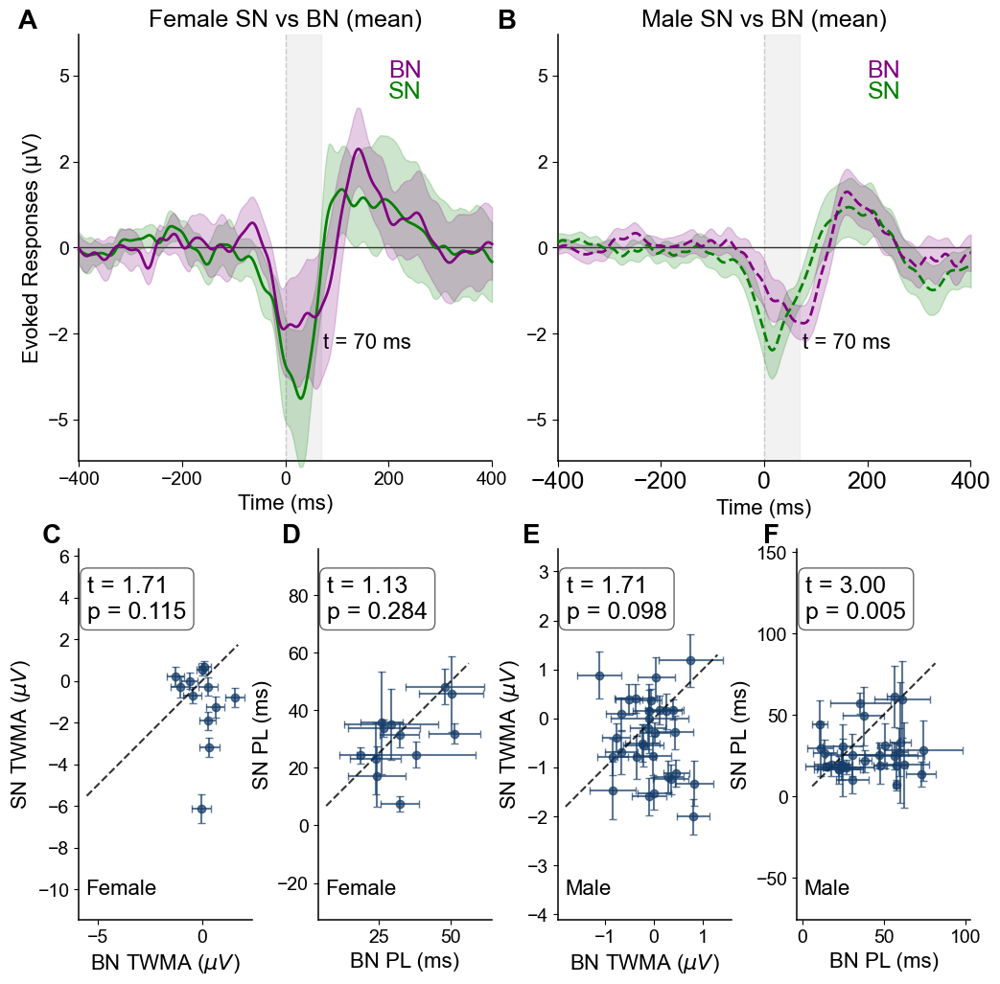

In [75]:


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.gridspec import GridSpec

from visualization import plot_erps   # plot_bn_vs_sn assumed importable too

# =========================================================================
# STYLE
# =========================================================================
FS_PANEL = 20   # panel letters
FS_TITLE = 18   # panel titles
FS_LABEL = 16   # axis labels
FS_TICK  = 14   # tick labels
FS_ANNOT = 16   # in-panel notes (Female / Male / t = 70 ms)

plt.rcParams.update({
    "font.family":         "sans-serif",
    "font.sans-serif":     ["Arial", "Helvetica", "DejaVu Sans"],
    "font.size":           FS_TICK,
    "axes.labelsize":      FS_LABEL,
    "axes.titlesize":      FS_TITLE,
    "xtick.labelsize":     FS_TICK,
    "ytick.labelsize":     FS_TICK,
    "axes.linewidth":      1.1,
    "axes.spines.top":     False,
    "axes.spines.right":   False,
    "savefig.dpi":         300,
    "savefig.bbox":        "tight",
    "savefig.transparent": True,
})


def add_panel_label(ax, letter, x=-0.10, y=1.):
    ax.text(x, y, letter, transform=ax.transAxes, fontsize=FS_PANEL,
            fontweight="bold", va="bottom", ha="right")


# =========================================================================
# FIGURE & GRID  (top: 2 wide ERPs; bottom: 4 scatters)
# =========================================================================
fig = plt.figure(figsize=(12, 12), dpi=100)
gs = GridSpec(2, 4, figure=fig, height_ratios=[1.15, 1.0],
              hspace=0.22, wspace=0.38)

ax_erp_F = fig.add_subplot(gs[0, 0:2])
ax_erp_M = fig.add_subplot(gs[0, 2:4], sharey=ax_erp_F)
ax_s0 = fig.add_subplot(gs[1, 0])   # Female amplitude
ax_s1 = fig.add_subplot(gs[1, 1])   # Female latency
ax_s2 = fig.add_subplot(gs[1, 2])   # Male amplitude
ax_s3 = fig.add_subplot(gs[1, 3])   # Male latency

time_range = (-0.400, 0.400)
erp_text_labels = [(0.85, "SN", "green"), (0.90, "BN", "purple")]

# =========================================================================
# TOP ROW — ERPs  (Female = solid, Male = dashed)
# =========================================================================
styles_solid = {"SN": {"linewidth": 2, "linestyle": "solid", "color": "green"},
                "BN": {"linewidth": 2, "linestyle": "solid", "color": "purple"}}
styles_dash  = {"SN": {"linewidth": 2, "linestyle": "--", "color": "green"},
                "BN": {"linewidth": 2, "linestyle": "--", "color": "purple"}}


def annotate_erp(ax):
    ax.axvspan(0, vline_time, color="silver", alpha=0.2)
    ax.axhline(0, color="black", lw=1.0, alpha=0.8, zorder=1.5)
    ax.text(vline_time + 4,
            ax.get_ylim()[0] + 0.30 * np.diff(ax.get_ylim()),
            f"t = {vline_time:.0f} ms", ha="left", va="top",
            fontsize=FS_ANNOT, color="black")


plot_erps({"SN": gender_groups_SN_MMN_evokes["female sub"],          # >>> DATA
           "BN": gender_groups_BN_MMN_evokes["female sub"]},
          picks=["Fz", "FCz", "Cz"], axs=ax_erp_F, stylesdict=styles_solid,
          ylabel="Evoked Responses (µV)", text_labels=erp_text_labels,
          title="Female SN vs BN", time_range=time_range)
annotate_erp(ax_erp_F)

plot_erps({"SN": gender_groups_SN_MMN_evokes["male sub"],            # >>> DATA
           "BN": gender_groups_BN_MMN_evokes["male sub"]},
          picks=["Fz", "FCz", "Cz"], axs=ax_erp_M, stylesdict=styles_dash,
          ylabel="", text_labels=erp_text_labels,
          title="Male SN vs BN", time_range=time_range)
annotate_erp(ax_erp_M)

# consistent ERP axes
for ax in (ax_erp_F, ax_erp_M):
    ax.set_xlim(-400, 400)
    ax.set_xticks([-400, -200, 0, 200, 400])
    ax.set_xlabel("Time (ms)")
    ax.xaxis.set_major_formatter("{x:.0f}")
    ax.yaxis.set_major_formatter("{x:.0f}")
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.tick_params(labelbottom=True, labelleft=True, length=4)
    ax.patch.set_alpha(0)

# =========================================================================
# BOTTOM ROW — SCATTERS  (labels CORRECTED: Female, Female, Male, Male)
# =========================================================================
female_df = mmn_filtered_df[mmn_filtered_df["sub_id"].isin(female_sub)]   # >>> DATA
male_df   = mmn_filtered_df[mmn_filtered_df["sub_id"].isin(male_sub)]

plot_bn_vs_sn(female_df, metric="TWMA", ax=ax_s0,
              stat_test="t-test", col_id=None, default_color="#163D69")
plot_bn_vs_sn(female_df * 1000, metric="PL", ax=ax_s1,
              default_color="#163D69", col_id=None)
plot_bn_vs_sn(male_df, metric="TWMA", ax=ax_s2,
              stat_test="t-test", col_id=None, default_color="#163D69")
plot_bn_vs_sn(male_df * 1000, metric="PL", ax=ax_s3,
              default_color="#163D69", col_id=None)

# gender labels in a fixed corner (axes-fraction, so they never miss the data)
for ax, lbl in [(ax_s0, "Female"), (ax_s1, "Female"),
                (ax_s2, "Male"), (ax_s3, "Male")]:
    ax.text(0.04, 0.11, lbl, transform=ax.transAxes, ha="left", va="top",
            fontsize=FS_ANNOT, color="black")
    ax.tick_params(labelsize=FS_TICK)

# =========================================================================
# PANEL LETTERS
# =========================================================================
for ax, letter in [(ax_erp_F, "A"), (ax_erp_M, "B"),
                   (ax_s0, "C"), (ax_s1, "D"), (ax_s2, "E"), (ax_s3, "F")]:
    add_panel_label(ax, letter)

# =========================================================================
# EXPORT
# =========================================================================
fig.patch.set_alpha(0)
for ax in fig.axes:
    ax.patch.set_alpha(0)


plt.tight_layout()
plt.show()

In [76]:
mmn_filtered_df['profession'].unique()

array(['PG_acd', 'UG_acd', 'non_acd'], dtype=object)

## Student vs Non Student

In [77]:
student_sub = mmn_filtered_df[mmn_filtered_df['profession']!='non_acd']['sub_id'].unique()
staff_sub = mmn_filtered_df[mmn_filtered_df['profession']=='non_acd']['sub_id'].unique()

print(len(student_sub), len(staff_sub))
profession_groups = {
    'student sub': list(student_sub),
    'staff sub': list(staff_sub),
}
profession_groups


profession_groups_SN_MMN_evokes = {key: [] for key in profession_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in profession_groups.items():
        if sub in subject_list:
            profession_groups_SN_MMN_evokes[group_name].append(evoked)
            break 


profession_groups_BN_MMN_evokes = {key: [] for key in profession_groups}

# Assign evokeds to the appropriate group
for sub, evoked in beep_STD_N1_aligned_BN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in profession_groups.items():
        if sub in subject_list:
            profession_groups_BN_MMN_evokes[group_name].append(evoked)
            break

profession_groups_SN_devi_evokes = {key: [] for key in profession_groups}

# Assign evokeds to the appropriate group
for sub, evoked in SN_devi_eps_evoked_dict.items():
    for group_name, subject_list in profession_groups.items():
        if sub in subject_list:
            profession_groups_SN_devi_evokes[group_name].append(evoked)
            break


profession_groups_BN_devi_evokes = {key: [] for key in profession_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_devi_eps_evoked_dict.items():
    for group_name, subject_list in profession_groups.items():
        if sub in subject_list:
            profession_groups_BN_devi_evokes[group_name].append(evoked)
            break

31 11


combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


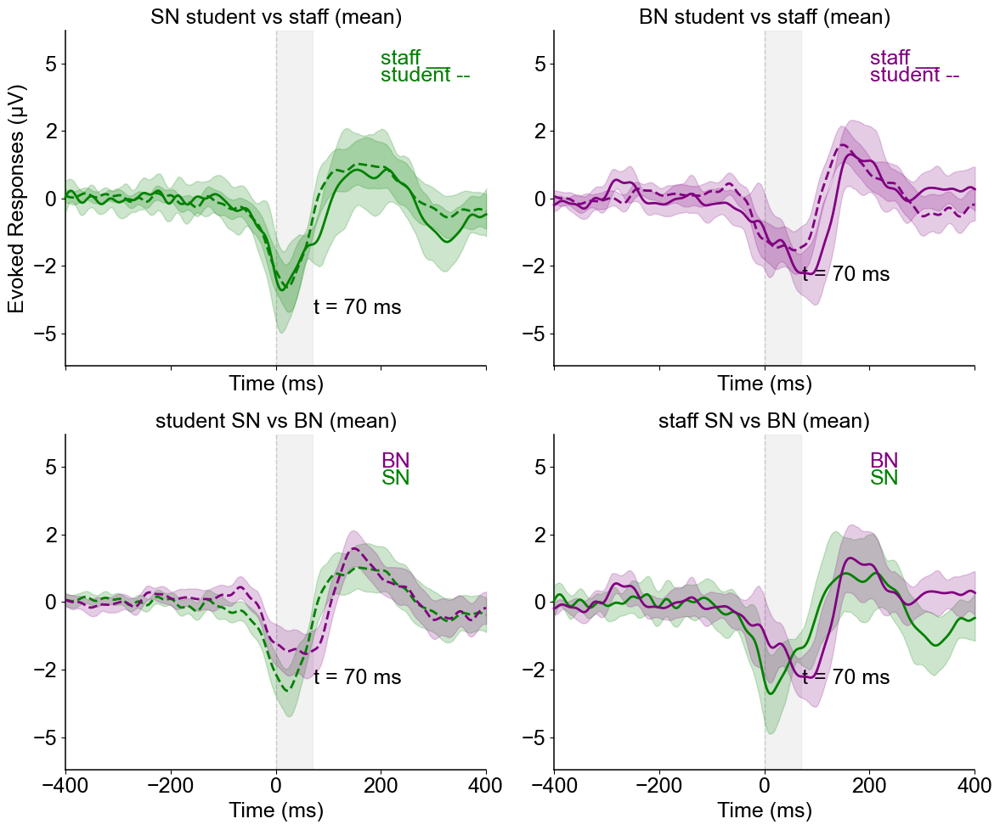

In [78]:
stylesdict ={"student sub": {"linewidth": 2,"linestyle":'--','color' : 'green'}, 
             'staff sub' : {"linewidth": 2,"linestyle":'solid','color' : 'green'},
            }

from visualization import plot_erps
text_labels = [
    (0.85, "student --",'green'),
    (0.90, f"staff __",'green'),
]
# Example profession with subplots
fig, axs = plt.subplots(2,2, figsize=(12,10), dpi=100,sharex=True)
time_range = (-.400,.400)
plot_erps(profession_groups_SN_MMN_evokes, picks=['Fz',"FCz", 'Cz'],
       stylesdict=stylesdict,axs = axs[0,0],ci = True,
                                   text_labels=text_labels,title=f"SN student vs staff",time_range=time_range)


vline_time = score_df[(score_df['sub_id'].isin(mmn_filtered_df['sub_id']))&(score_df['measure']=='n1stdp2')]['SN_PL_mean'].mean()*1000
axs[0,0].axvspan(0 , vline_time, color='silver', alpha=0.2)
axs[0,0].text(
    vline_time+2, axs[0,0].get_ylim()[0] + 0.20 * np.diff(axs[0,0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)
stylesdict ={"student sub": {"linewidth": 2,"linestyle":'--','color' : 'purple'},  'staff sub' : {"linewidth": 2,"linestyle":'solid','color' : 'purple'},}

text_labels = [(0.85, "student --",'purple'),(0.90, f"staff __",'purple'),]
plot_erps( profession_groups_BN_MMN_evokes, picks=['Fz',"FCz", 'Cz'],axs=axs[0,1],stylesdict=stylesdict,ylabel='',text_labels=text_labels, title=f"BN student vs staff",time_range=time_range)   

axs[0,1].axvspan(0 , vline_time, color='silver', alpha=0.2)
# Add label under the vline
axs[0,1].text(vline_time+2, axs[0,1].get_ylim()[0] + 0.30 * np.diff(axs[0,1].get_ylim()), f"t = {vline_time:.0f} ms", ha='left', va='top', fontsize=18, color='black' )


stylesdict ={"SN": {"linewidth": 2,"linestyle":'--','color' : 'green'},  'BN' : {"linewidth": 2,"linestyle":'--','color' : 'purple'},}
text_labels = [(0.85, "SN",'green'),(0.90, f"BN",'purple'),]
plot_erps( {"SN": profession_groups_SN_MMN_evokes['student sub'],"BN": profession_groups_BN_MMN_evokes['student sub']}, 
          picks=['Fz',"FCz", 'Cz'],axs=axs[1,0],stylesdict=stylesdict,ylabel='',text_labels=text_labels, title=f"student SN vs BN",time_range=time_range)   

axs[1,0].axvspan(0 , vline_time, color='silver', alpha=0.2)
# Add label under the vline
axs[1,0].text(vline_time+2, axs[1,0].get_ylim()[0] + 0.30 * np.diff(axs[1,0].get_ylim()), f"t = {vline_time:.0f} ms", ha='left', va='top', fontsize=18, color='black' )
# Make sure there's enough room below the plot


stylesdict ={"SN": {"linewidth": 2,"linestyle":'solid','color' : 'green'},  'BN' : {"linewidth": 2,"linestyle":'solid','color' : 'purple'},}
text_labels = [(0.85, "SN",'green'),(0.90, f"BN",'purple'),]
plot_erps( {"SN": profession_groups_SN_MMN_evokes['staff sub'],"BN": profession_groups_BN_MMN_evokes['staff sub']}, 
          picks=['Fz',"FCz", 'Cz'],axs=axs[1,1],stylesdict=stylesdict,ylabel='',text_labels=text_labels, title=f"staff SN vs BN",time_range=time_range)   

axs[1,1].axvspan(0 , vline_time, color='silver', alpha=0.2)
# Add label under the vline
axs[1,1].text(vline_time+2, axs[1,1].get_ylim()[0] + 0.30 * np.diff(axs[1,1].get_ylim()), f"t = {vline_time:.0f} ms", ha='left', va='top', fontsize=18, color='black' )
for ax in axs.flatten():
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.yaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
fig.patch.set_alpha(0)     # Make entire figure background transparent
plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
BN stats (TWMA)
 mean : -0.07407021026995597 std : 0.6017519329797457
SN stats(TWMA) 
 mean : -0.6324960713012684 std : 1.3205370422702567;std sum 0.12210736499817117
sub_id                                                         sub-sd011
measure                                                            n1mmn
BN_PA_mean                                                     -4.134004
BN_PA_std                                                       0.792619
SN_PA_mean                                                     -3.738444
SN_PA_std                                                       1.139663
BN_PL_mean                                                      0.074258
BN_PL_std                                                       0.024218
SN_PL_mean                                                      0.028008
SN_PL_std                                       

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2876242320.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


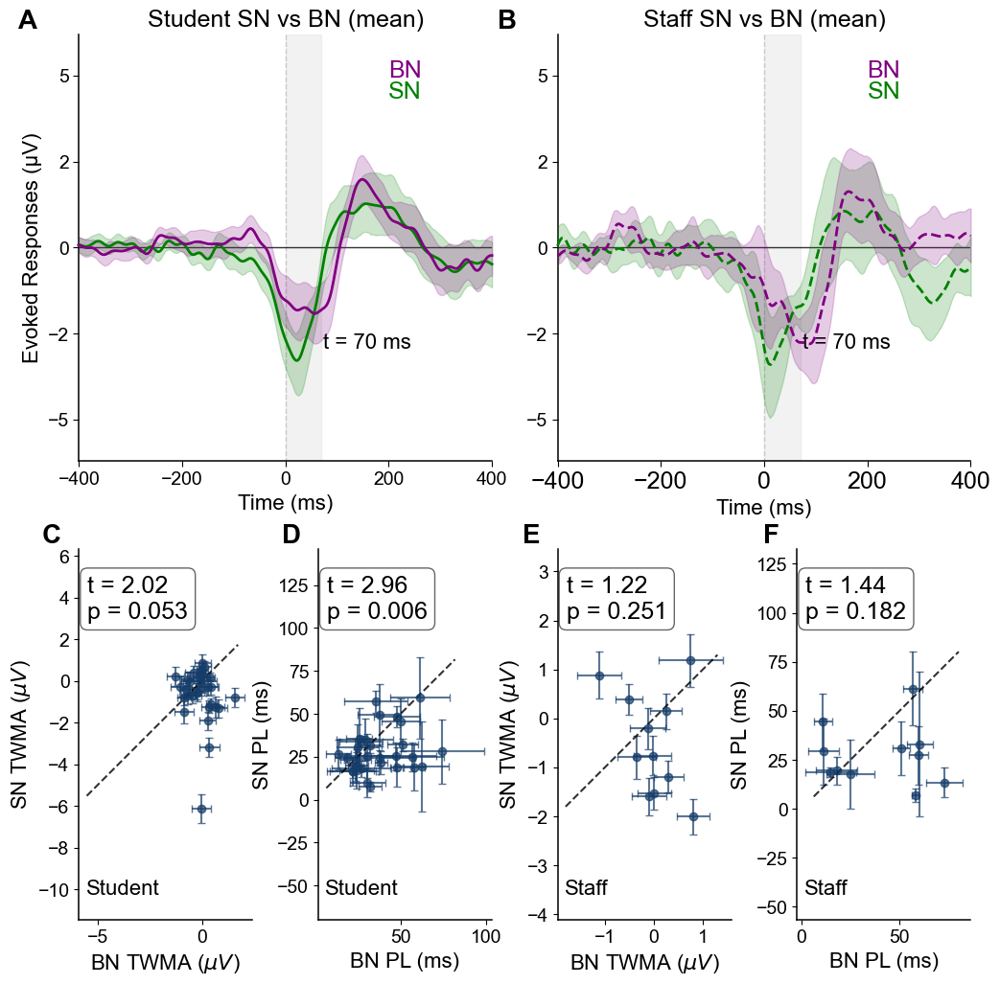

In [79]:


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.gridspec import GridSpec

from visualization import plot_erps   # plot_bn_vs_sn assumed importable too

# =========================================================================
# STYLE
# =========================================================================
FS_PANEL = 20   # panel letters
FS_TITLE = 18   # panel titles
FS_LABEL = 16   # axis labels
FS_TICK  = 14   # tick labels
FS_ANNOT = 16   # in-panel notes (student / staff / t = 70 ms)

plt.rcParams.update({
    "font.family":         "sans-serif",
    "font.sans-serif":     ["Arial", "Helvetica", "DejaVu Sans"],
    "font.size":           FS_TICK,
    "axes.labelsize":      FS_LABEL,
    "axes.titlesize":      FS_TITLE,
    "xtick.labelsize":     FS_TICK,
    "ytick.labelsize":     FS_TICK,
    "axes.linewidth":      1.1,
    "axes.spines.top":     False,
    "axes.spines.right":   False,
    "savefig.dpi":         300,
    "savefig.bbox":        "tight",
    "savefig.transparent": True,
})


def add_panel_label(ax, letter, x=-0.10, y=1.):
    ax.text(x, y, letter, transform=ax.transAxes, fontsize=FS_PANEL,
            fontweight="bold", va="bottom", ha="right")


# =========================================================================
# FIGURE & GRID  (top: 2 wide ERPs; bottom: 4 scatters)
# =========================================================================
fig = plt.figure(figsize=(12, 12), dpi=100)
gs = GridSpec(2, 4, figure=fig, height_ratios=[1.15, 1.0],
              hspace=0.22, wspace=0.38)

ax_erp_F = fig.add_subplot(gs[0, 0:2])
ax_erp_M = fig.add_subplot(gs[0, 2:4], sharey=ax_erp_F)
ax_s0 = fig.add_subplot(gs[1, 0])   # student amplitude
ax_s1 = fig.add_subplot(gs[1, 1])   # student latency
ax_s2 = fig.add_subplot(gs[1, 2])   # staff amplitude
ax_s3 = fig.add_subplot(gs[1, 3])   # staff latency

time_range = (-0.400, 0.400)
erp_text_labels = [(0.85, "SN", "green"), (0.90, "BN", "purple")]

# =========================================================================
# TOP ROW — ERPs  (student = solid, staff = dashed)
# =========================================================================
styles_solid = {"SN": {"linewidth": 2, "linestyle": "solid", "color": "green"},
                "BN": {"linewidth": 2, "linestyle": "solid", "color": "purple"}}
styles_dash  = {"SN": {"linewidth": 2, "linestyle": "--", "color": "green"},
                "BN": {"linewidth": 2, "linestyle": "--", "color": "purple"}}


def annotate_erp(ax):
    ax.axvspan(0, vline_time, color="silver", alpha=0.2)
    ax.axhline(0, color="black", lw=1.0, alpha=0.8, zorder=1.5)
    ax.text(vline_time + 4,
            ax.get_ylim()[0] + 0.30 * np.diff(ax.get_ylim()),
            f"t = {vline_time:.0f} ms", ha="left", va="top",
            fontsize=FS_ANNOT, color="black")


plot_erps({"SN": profession_groups_SN_MMN_evokes["student sub"],          # >>> DATA
           "BN": profession_groups_BN_MMN_evokes["student sub"]},
          picks=["Fz", "FCz", "Cz"], axs=ax_erp_F, stylesdict=styles_solid,
          ylabel="Evoked Responses (µV)", text_labels=erp_text_labels,
          title="Student SN vs BN", time_range=time_range)
annotate_erp(ax_erp_F)

plot_erps({"SN": profession_groups_SN_MMN_evokes["staff sub"],            # >>> DATA
           "BN": profession_groups_BN_MMN_evokes["staff sub"]},
          picks=["Fz", "FCz", "Cz"], axs=ax_erp_M, stylesdict=styles_dash,
          ylabel="", text_labels=erp_text_labels,
          title="Staff SN vs BN", time_range=time_range)
annotate_erp(ax_erp_M)

# consistent ERP axes
for ax in (ax_erp_F, ax_erp_M):
    ax.set_xlim(-400, 400)
    ax.set_xticks([-400, -200, 0, 200, 400])
    ax.set_xlabel("Time (ms)")
    ax.xaxis.set_major_formatter("{x:.0f}")
    ax.yaxis.set_major_formatter("{x:.0f}")
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.tick_params(labelbottom=True, labelleft=True, length=4)
    ax.patch.set_alpha(0)

# =========================================================================
# BOTTOM ROW — SCATTERS  (labels CORRECTED: student, student, staff, staff)
# =========================================================================
student_df = mmn_filtered_df[mmn_filtered_df["sub_id"].isin(student_sub)]   # >>> DATA
staff_df   = mmn_filtered_df[mmn_filtered_df["sub_id"].isin(staff_sub)]

plot_bn_vs_sn(student_df, metric="TWMA", ax=ax_s0,
              stat_test="t-test", col_id=None, default_color="#163D69")
plot_bn_vs_sn(student_df * 1000, metric="PL", ax=ax_s1,
              default_color="#163D69", col_id=None)
plot_bn_vs_sn(staff_df, metric="TWMA", ax=ax_s2,
              stat_test="t-test", col_id=None, default_color="#163D69")
plot_bn_vs_sn(staff_df * 1000, metric="PL", ax=ax_s3,
              default_color="#163D69", col_id=None)

# profession labels in a fixed corner (axes-fraction, so they never miss the data)
for ax, lbl in [(ax_s0, "Student"), (ax_s1, "Student"),
                (ax_s2, "Staff"), (ax_s3, "Staff")]:
    ax.text(0.04, 0.11, lbl, transform=ax.transAxes, ha="left", va="top",
            fontsize=FS_ANNOT, color="black")
    ax.tick_params(labelsize=FS_TICK)

# =========================================================================
# PANEL LETTERS
# =========================================================================
for ax, letter in [(ax_erp_F, "A"), (ax_erp_M, "B"),
                   (ax_s0, "C"), (ax_s1, "D"), (ax_s2, "E"), (ax_s3, "F")]:
    add_panel_label(ax, letter)

# =========================================================================
# EXPORT
# =========================================================================
fig.patch.set_alpha(0)
for ax in fig.axes:
    ax.patch.set_alpha(0)


plt.tight_layout()
plt.show()

## SN2, SN6 and SN 10 comparision 

In [80]:
mmn_filtered_df['SN_tone'].unique()
"""SN2 = "SD014_SD032_SD044_SD055_MI_droplets.wav"

SN6 =  "SD021_voyar.wav"
SN10 = "SD030_SD042_encounter_vivo.wav"
"""

'SN2 = "SD014_SD032_SD044_SD055_MI_droplets.wav"\n\nSN6 =  "SD021_voyar.wav"\nSN10 = "SD030_SD042_encounter_vivo.wav"\n'

In [81]:
SN2 = "droplet"

SN6 =  "voyar"
SN10 = "encounter_vivo"
sn2_sub = mmn_filtered_df[mmn_filtered_df['SN_tone']==SN2]['sub_id'].unique()
sn6_sub = mmn_filtered_df[mmn_filtered_df['SN_tone']==SN6 ]['sub_id'].unique()
sn10_sub = mmn_filtered_df[mmn_filtered_df['SN_tone']==SN10]['sub_id'].unique()

print(len(sn2_sub), len(sn6_sub),len(sn10_sub))
tone_groups = {
    'sn2 sub': list(sn2_sub),
    'sn6 sub': list(sn6_sub),
    'sn10 sub': list(sn10_sub),

}



tone_groups_SN_MMN_evokes = {key: [] for key in tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in tone_groups.items():
        if sub in subject_list:
            tone_groups_SN_MMN_evokes[group_name].append(evoked)
            break 


tone_groups_BN_MMN_evokes = {key: [] for key in tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in beep_STD_N1_aligned_BN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in tone_groups.items():
        if sub in subject_list:
            tone_groups_BN_MMN_evokes[group_name].append(evoked)
            break

tone_groups_SN_devi_evokes = {key: [] for key in tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in SN_devi_eps_evoked_dict.items():
    for group_name, subject_list in tone_groups.items():
        if sub in subject_list:
            tone_groups_SN_devi_evokes[group_name].append(evoked)
            break


tone_groups_BN_devi_evokes = {key: [] for key in tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_devi_eps_evoked_dict.items():
    for group_name, subject_list in tone_groups.items():
        if sub in subject_list:
            tone_groups_BN_devi_evokes[group_name].append(evoked)
            break


3 1 1


combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


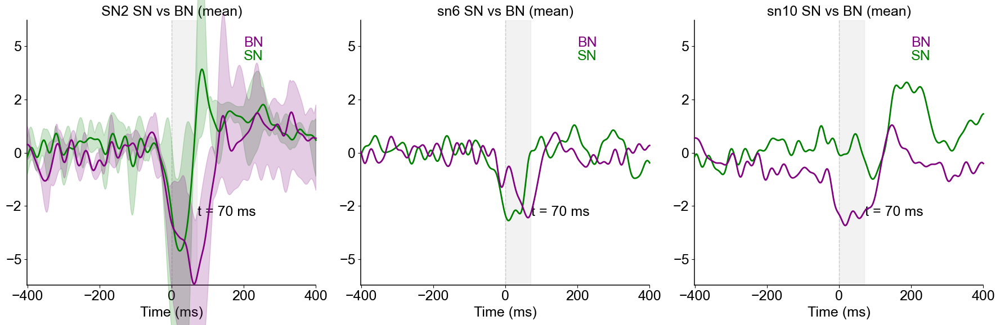

In [82]:

from visualization import plot_erps

# Example tone with subplots
fig, axs = plt.subplots(1,3, figsize=(18,6), dpi=100,sharex=True)
time_range = (-.400,.400)


stylesdict ={"SN": {"linewidth": 2,"linestyle":'solid','color' : 'green'},  'BN' : {"linewidth": 2,"linestyle":'solid','color' : 'purple'},}
text_labels = [(0.85, "SN",'green'),(0.90, f"BN",'purple'),]
plot_erps( {"SN": tone_groups_SN_MMN_evokes['sn2 sub'],"BN": tone_groups_BN_MMN_evokes['sn2 sub']}, 
          picks=['Fz',"FCz", 'Cz'],axs=axs[0],stylesdict=stylesdict,ylabel='',text_labels=text_labels, title=f"SN2 SN vs BN",time_range=time_range)   

axs[0].axvspan(0 , vline_time, color='silver', alpha=0.2)
# Add label under the vline
axs[0].text(vline_time+2, axs[0].get_ylim()[0] + 0.30 * np.diff(axs[0].get_ylim()), f"t = {vline_time:.0f} ms", ha='left', va='top', fontsize=18, color='black' )
# Make sure there's enough room below the plot

plot_erps( {"SN": tone_groups_SN_MMN_evokes['sn6 sub'],"BN": tone_groups_BN_MMN_evokes['sn6 sub']}, 
          picks=['Fz',"FCz", 'Cz'],axs=axs[1],stylesdict=stylesdict,ylabel='',text_labels=text_labels, title=f"sn6 SN vs BN",time_range=time_range)   

axs[1].axvspan(0 , vline_time, color='silver', alpha=0.2)
axs[1].text(vline_time+2, axs[1].get_ylim()[0] + 0.30 * np.diff(axs[1].get_ylim()), f"t = {vline_time:.0f} ms", ha='left', va='top', fontsize=18, color='black' )

plot_erps( {"SN": tone_groups_SN_MMN_evokes['sn10 sub'],"BN": tone_groups_BN_MMN_evokes['sn10 sub']}, 
          picks=['Fz',"FCz", 'Cz'],axs=axs[2],stylesdict=stylesdict,ylabel='',text_labels=text_labels, title=f"sn10 SN vs BN",time_range=time_range)   

axs[2].axvspan(0 , vline_time, color='silver', alpha=0.2)
axs[2].text(vline_time+2, axs[2].get_ylim()[0] + 0.30 * np.diff(axs[2].get_ylim()), f"t = {vline_time:.0f} ms", ha='left', va='top', fontsize=18, color='black' )

# Add label under the vline
for ax in axs.flatten():
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.yaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
fig.patch.set_alpha(0)     # Make entire figure background transparent
plt.tight_layout()
plt.show()

# Within Block analysis 

# HSU and LSU group

In [83]:
"""low_sub_D  =['sd012', 'sd014', 'sd017', 'sd019', 'sd021', 'sd023', 'sd027', 'sd032', 'sd043', 'sd044', 'sd046', 'sd052', 'sd053', 'sd061', 'sd064']
low_sub_D = ["sub-"+sub for sub in low_sub_D ]
avg_sub_D = ['sd011', 'sd013', 'sd015', 'sd016', 'sd020', 'sd022', 'sd024', 'sd025', 'sd026', 'sd028', 'sd030', 'sd031', 'sd034', 'sd036', 'sd040', 'sd045', 'sd047', 'sd048', 'sd049', 'sd051', 'sd055', 'sd057', 'sd058', 'sd060', 'sd063', 'sd066', 'sd065', 'sd067']
avg_sub_D = ["sub-"+sub for sub in avg_sub_D]
high_sub_D = ['sd018', 'sd029', 'sd033', 'sd035', 'sd037', 'sd038', 'sd039', 'sd041', 'sd042', 'sd050', 'sd054', 'sd056', 'sd059', 'sd062']
high_sub_D  = ["sub-"+sub for sub in high_sub_D  ]"""

'low_sub_D  =[\'sd012\', \'sd014\', \'sd017\', \'sd019\', \'sd021\', \'sd023\', \'sd027\', \'sd032\', \'sd043\', \'sd044\', \'sd046\', \'sd052\', \'sd053\', \'sd061\', \'sd064\']\nlow_sub_D = ["sub-"+sub for sub in low_sub_D ]\navg_sub_D = [\'sd011\', \'sd013\', \'sd015\', \'sd016\', \'sd020\', \'sd022\', \'sd024\', \'sd025\', \'sd026\', \'sd028\', \'sd030\', \'sd031\', \'sd034\', \'sd036\', \'sd040\', \'sd045\', \'sd047\', \'sd048\', \'sd049\', \'sd051\', \'sd055\', \'sd057\', \'sd058\', \'sd060\', \'sd063\', \'sd066\', \'sd065\', \'sd067\']\navg_sub_D = ["sub-"+sub for sub in avg_sub_D]\nhigh_sub_D = [\'sd018\', \'sd029\', \'sd033\', \'sd035\', \'sd037\', \'sd038\', \'sd039\', \'sd041\', \'sd042\', \'sd050\', \'sd054\', \'sd056\', \'sd059\', \'sd062\']\nhigh_sub_D  = ["sub-"+sub for sub in high_sub_D  ]'

In [84]:
len(mmn_filtered_df[mmn_filtered_df['group']=='low'])
low_sub = mmn_filtered_df[mmn_filtered_df['group']=='LSU']['sub_id'].unique()
high_sub = mmn_filtered_df[mmn_filtered_df['group']=='HSU']['sub_id'].unique()
avg_sub = mmn_filtered_df[mmn_filtered_df['group']=='ASU']['sub_id'].unique()
print(len(low_sub), len(high_sub),len(avg_sub))

11 10 21


In [85]:
mmn_filtered_df['sub_id'].unique()

array(['sub-sd011', 'sub-sd015', 'sub-sd016', 'sub-sd017', 'sub-sd021',
       'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd027',
       'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033',
       'sub-sd034', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038',
       'sub-sd040', 'sub-sd041', 'sub-sd043', 'sub-sd044', 'sub-sd045',
       'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd050',
       'sub-sd051', 'sub-sd052', 'sub-sd053', 'sub-sd055', 'sub-sd056',
       'sub-sd058', 'sub-sd059', 'sub-sd060', 'sub-sd062', 'sub-sd063',
       'sub-sd064', 'sub-sd067'], dtype=object)

In [86]:
low_sub

array(['sub-sd017', 'sub-sd021', 'sub-sd023', 'sub-sd027', 'sub-sd032',
       'sub-sd043', 'sub-sd044', 'sub-sd046', 'sub-sd052', 'sub-sd053',
       'sub-sd064'], dtype=object)

In [87]:
usage_groups = {
    'low sub': list(low_sub),
    'high sub': list(high_sub),
    'avg sub' : list(avg_sub)
}
usage_groups


{'low sub': ['sub-sd017',
  'sub-sd021',
  'sub-sd023',
  'sub-sd027',
  'sub-sd032',
  'sub-sd043',
  'sub-sd044',
  'sub-sd046',
  'sub-sd052',
  'sub-sd053',
  'sub-sd064'],
 'high sub': ['sub-sd029',
  'sub-sd033',
  'sub-sd035',
  'sub-sd037',
  'sub-sd038',
  'sub-sd041',
  'sub-sd050',
  'sub-sd056',
  'sub-sd059',
  'sub-sd062'],
 'avg sub': ['sub-sd011',
  'sub-sd015',
  'sub-sd016',
  'sub-sd024',
  'sub-sd025',
  'sub-sd026',
  'sub-sd030',
  'sub-sd031',
  'sub-sd034',
  'sub-sd036',
  'sub-sd040',
  'sub-sd045',
  'sub-sd047',
  'sub-sd048',
  'sub-sd049',
  'sub-sd051',
  'sub-sd055',
  'sub-sd058',
  'sub-sd060',
  'sub-sd063',
  'sub-sd067']}

In [88]:

usage_groups_SN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_SN_MMN_evokes[group_name].append(evoked)
            break 


usage_groups_BN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in beep_STD_N1_aligned_BN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_BN_MMN_evokes[group_name].append(evoked)
            break

usage_groups_SN_devi_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in SN_devi_eps_evoked_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_SN_devi_evokes[group_name].append(evoked)
            break

# usage_groups_PN_std_evokes = {key: [] for key in usage_groups}

# # Assign evokeds to the appropriate group
# for sub, evoked in PN_sta_eps_evoked_dict.items():
#     for group_name, subject_list in usage_groups.items():
#         if sub in subject_list:
#            usage_groups_PN_std_evokes[group_name].append(evoked)
#            break

usage_groups_BN_devi_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_devi_eps_evoked_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_BN_devi_evokes[group_name].append(evoked)
            break

In [89]:
len(usage_groups_SN_MMN_evokes['avg sub'])

21

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:41: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


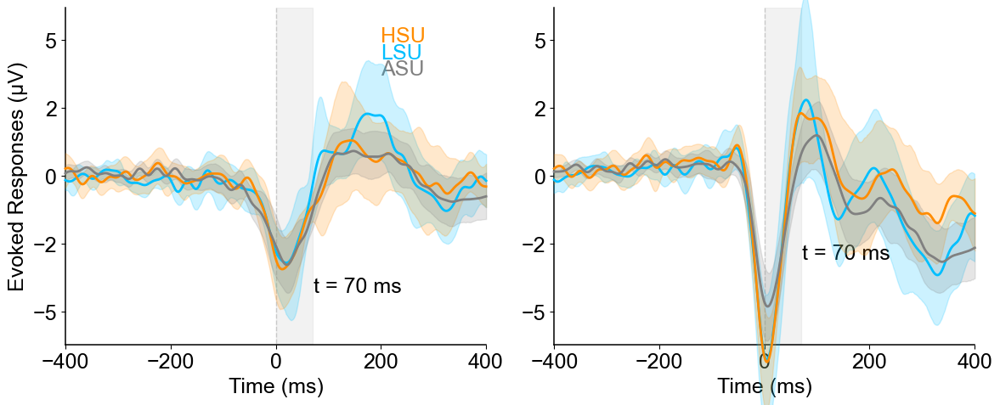

In [90]:
stylesdict ={"low sub": {"linewidth": 2,"linestyle":'solid','color' : 'deepskyblue'}, 
             'high sub' : {"linewidth": 2,"linestyle":'solid','color' : 'darkorange'},
             'avg sub' : {"linewidth": 2,"linestyle":'solid','color' : 'grey'},

             }

from visualization import plot_erps
text_labels = [
    (0.85, "LSU",'deepskyblue'),
    (0.90, f"HSU",'darkorange'),
    (0.80, f"ASU",'grey'),

]
# Example usage with subplots
fig, axs = plt.subplots(1,2, figsize=(12,5), dpi=100,sharex=True)
time_range = (-.400,.400)
plot_erps(usage_groups_SN_MMN_evokes, picks=['Fz',"FCz", 'Cz'],
       stylesdict=stylesdict,axs = axs[0],ci = True,
                                   text_labels=text_labels,title=f"",time_range=time_range)


vline_time = score_df[(score_df['sub_id'].isin(mmn_filtered_df['sub_id']))&(score_df['measure']=='n1stdp2')]['SN_PL_mean'].mean()*1000
axs[0].axvspan(0 , vline_time, color='silver', alpha=0.2)
axs[0].text(
    vline_time+2, axs[0].get_ylim()[0] + 0.20 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)

plot_erps( usage_groups_SN_devi_evokes, picks=['Fz'],axs=axs[1],
                                   stylesdict=stylesdict,ylabel='',
                                   title=f"",time_range=time_range)   

axs[1].axvspan(0 , vline_time, color='silver', alpha=0.2)
# Add label under the vline
axs[1].text(
    vline_time+2, axs[1].get_ylim()[0] + 0.30 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)
# Make sure there's enough room below the plot
#axs[1].set_ylim(ax.get_ylim()[0] - 0.1 * np.diff(ax.get_ylim()), ax.get_ylim()[1])
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.yaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
fig.patch.set_alpha(0)     # Make entire figure background transparent
plt.tight_layout()
plt.show()


combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


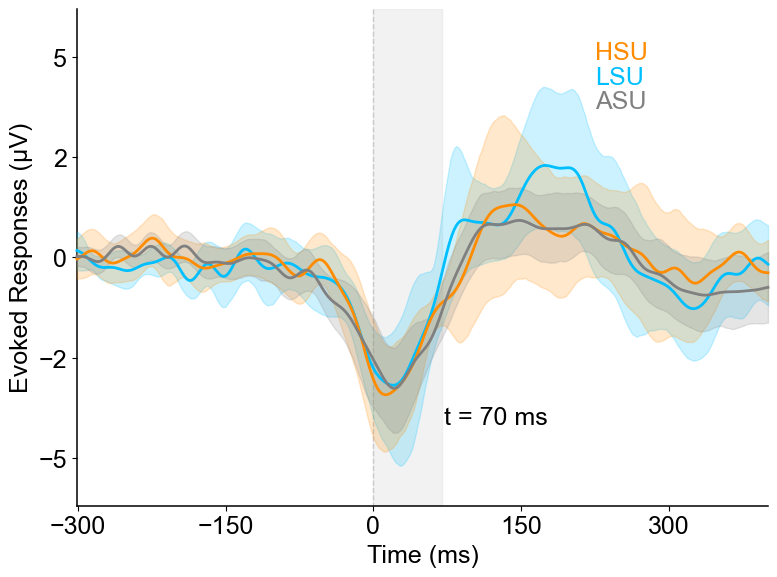

In [91]:
fig, axs = plt.subplots(1,1, figsize=(8,6), dpi=100,sharex=True)
time_range = (-.300,.400)
plot_erps(usage_groups_SN_MMN_evokes, picks=['Fz',"FCz", 'Cz'],
       stylesdict=stylesdict,axs = axs,ci = True,
                                   text_labels=text_labels,title=f"",time_range=time_range)


vline_time =score_df[(score_df['sub_id'].isin(mmn_filtered_df['sub_id']))&(score_df['measure']=='n1stdp2')]['SN_PL_mean'].mean()*1000
axs.axvspan(0 , vline_time, color='silver', alpha=0.2)
axs.text(
    vline_time+2, axs.get_ylim()[0] + 0.20 * np.diff(axs.get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)

axs.xaxis.set_major_formatter('{x:.0f}')
axs.yaxis.set_major_formatter('{x:.0f}')
axs.xaxis.set_major_locator(ticker.MaxNLocator(5))
axs.yaxis.set_major_locator(ticker.MaxNLocator(5))
fig.patch.set_alpha(0)     # Make entire figure background transparent
plt.tight_layout()
plt.show()

Identifying common channels ...


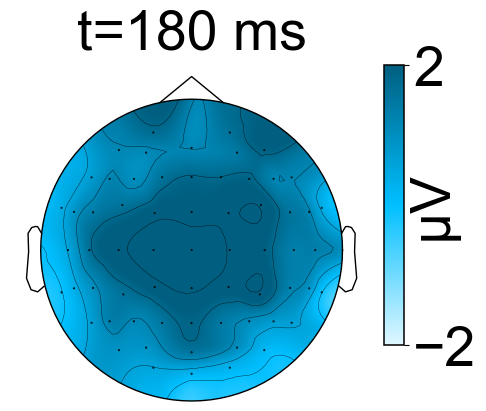

Identifying common channels ...


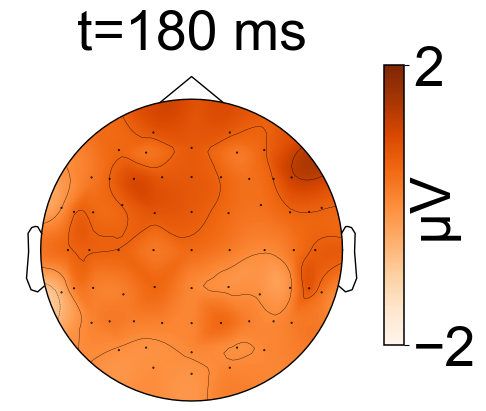

In [92]:
import matplotlib.colors as mcolors
# Define time points
time_points = [0.18]

# Set the color scale range
vlim = (-2,2)  # Adjust based on your data

colors = ['#e0f7ff' ,'#00bfff', '#005f80',]  # dark-> DeepSkyBlue -> light 
cmap_blue = mcolors.LinearSegmentedColormap.from_list("deep_sky_blue", colors)
# Create a grid of subplots
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None
time_range=(-.200,.350)
evokeds_subset = {}
for cond in usage_groups_SN_MMN_evokes:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in usage_groups_SN_MMN_evokes[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['low sub']).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap=cmap_blue ,
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15, 0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Greens']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap_blue )
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40,labelpad = -50)  # Adjust fontsize here
cbar.set_ticks([-2,2])
# Add row labels
#fig.text(0.0001, 0.5, 'PS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()




fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['high sub']).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='Oranges',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15,  0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Oranges']  # Choose a colormap (like 'RdBu_r')

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40,labelpad = -50)  # Adjust fontsize here
cbar.set_ticks([-2,2])

# Add row labels
#fig.text(0.0001, 0.5, 'NPS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()

##  Emotion: Emotional Deviant − Neutral Deviant '

 Issue with the Alignment of the N1

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


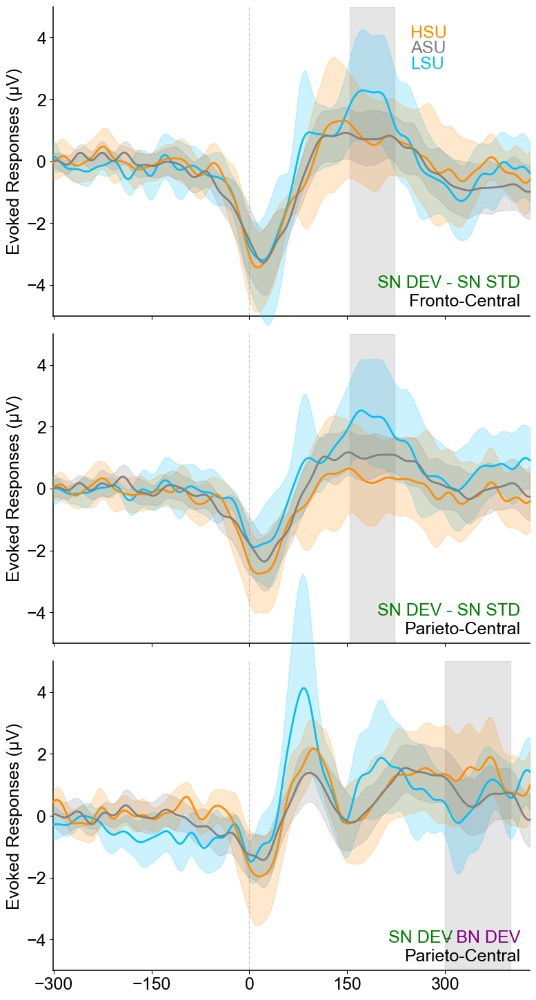

In [93]:

sn_STD_N1_aligned_SN_LPP_evokeds_dict_all = {sub1:mne.combine_evoked([SN_devi_eps_evoked_dict[sub1], BN_devi_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(SN_devi_eps_evoked_dict,BN_devi_eps_evoked_dict)
    if sub1==sub2 and sub1 in mmn_subject }  

usage_groups_SN_LPP_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_STD_N1_aligned_SN_LPP_evokeds_dict_all.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_SN_LPP_evokes[group_name].append(evoked)
            break 

fig, axs = plt.subplots(3,1, figsize=(8,15), dpi=100,sharex=True,sharey= True)
time_range = (-.300,.4300)
text_labels = [(0.80, "LSU",'deepskyblue'),(0.90, f"HSU",'darkorange'),(0.85, f"ASU",'grey'),]

plot_erps(usage_groups_SN_MMN_evokes, picks=['Fz',"FCz","Cz"],
       stylesdict=stylesdict,axs = axs[0],ylim=(-5,5),ci= .95,
                                   text_labels=text_labels,title=f'',time_range=time_range)
axs[0].text(.980, .08, f"SN DEV - SN STD", ha='right', va='bottom', fontsize=18, color='green',transform=axs[0].transAxes)
axs[0].text(.980, .020, f"Fronto-Central", ha='right', va='bottom', fontsize=18, color='black',transform=axs[0].transAxes)
vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
axs[0].axvspan( 154.296875, 222.65625, color='gray', alpha=0.2)
axs[0].set_xlabel("")



plot_erps(usage_groups_SN_MMN_evokes, picks=[ 'Pz','CPz',"Cz"],
       stylesdict=stylesdict,axs = axs[1],ylim=(-5,5),ci= .95,title=f'',time_range=time_range)
axs[1].text(.980, .080, f"SN DEV - SN STD",ha='right', va='bottom', fontsize=18, color='green',transform=axs[1].transAxes)
axs[1].text(.980, .020, f"Parieto-Central",ha='right', va='bottom', fontsize=18, color='black',transform=axs[1].transAxes)
vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
axs[1].axvspan( 154.296875, 222.65625, color='gray', alpha=0.2)
axs[1].set_xlabel("")



plot_erps(usage_groups_SN_LPP_evokes, picks=[ 'Pz','CPz',"Cz"],
       stylesdict=stylesdict,axs = axs[2],ylim=(-5,5),ci= .90,title=f'',time_range=time_range)
axs[2].text(.980, .080, f"SN DEV              ", ha='right', va='bottom', fontsize=18, color='green',transform=axs[2].transAxes)
axs[2].text(.980, .080, f"        - BN DEV", ha='right', va='bottom', fontsize=18, color='purple',transform=axs[2].transAxes)
axs[2].text(.980, .020, f"Parieto-Central",ha='right', va='bottom', fontsize=18, color='black',transform=axs[2].transAxes)
axs[2].axvspan( 300, 400, color='gray', alpha=0.2)
axs[2].set_xlabel("")
# axs[2].annotate("LPP \n(~360 ms)",xy=(360, 2),       # tip on the peak
#                 xytext=(430, 4),    # text further to the right
#                 arrowprops=dict(arrowstyle="->", color="black", lw=2),fontsize=16,ha="right",va= 'top',transform=axs[2].transAxes)

fig.patch.set_alpha(0)     # Make entire figure background transparent
     # Make axes background transparent
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))


Shapes: (11, 360) (10, 360)
stat_fun(H1): min=7.948720599011057e-06 max=3.4342825032042072
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/9999 [00:00<?,       ?it/s]

[(slice(237, 261, None),), (slice(354, 355, None),)] [0.4683 0.932 ]


Text(-0.3, 2e-06, " LSU vs HSU (SN dev- SN STD) ('Cz','Pz','CPz')")

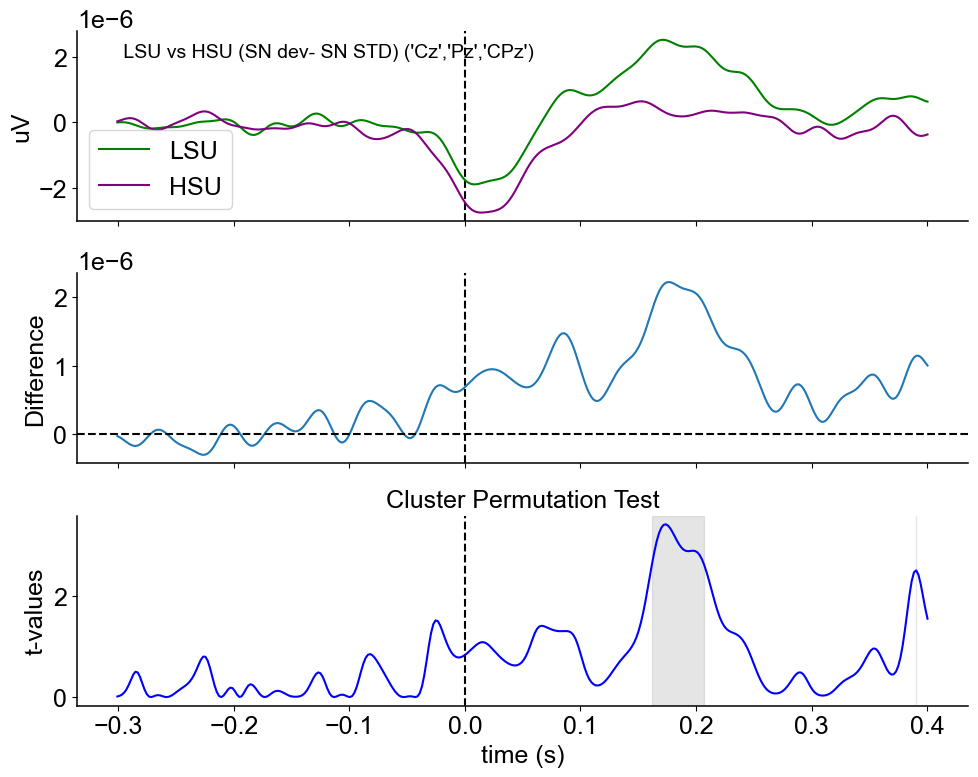

In [94]:
time_range= (-.300, .400)
evokeds_subset = {}
for cond in usage_groups_SN_MMN_evokes:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in usage_groups_SN_MMN_evokes[cond]]
        evokeds_subset[cond]  =evoked_crop 
from scipy.stats import ttest_ind
import numpy as np

def indep_t(X, Y):
    tvals, _ = ttest_ind(X, Y, axis=0, equal_var=False)
    return tvals

fig, ax = plot_mmn_cluster(
    evokeds_subset["low sub"],
    evokeds_subset["high sub"],labelc1="LSU", labelc2="HSU", 
    picks=['Cz','Pz','CPz'],tail=1,
)
ax[0].text(-.30,2*1e-6," LSU vs HSU (SN dev- SN STD) ('Cz','Pz','CPz')")

In [95]:
evokeds_subset["low sub"][0].times[237], evokeds_subset["low sub"][0].times[261]#, 333

(np.float64(0.162109375), np.float64(0.208984375))

Shapes: (11, 360) (10, 360)
stat_fun(H1): min=1.9522694050418503e-05 max=7.922982484272399
Running initial clustering …
Found 8 clusters


  0%|          | Permuting : 0/9999 [00:00<?,       ?it/s]

[(slice(5, 6, None),), (slice(38, 41, None),), (slice(51, 65, None),), (slice(69, 78, None),), (slice(94, 108, None),), (slice(120, 135, None),), (slice(213, 229, None),), (slice(292, 347, None),)] [0.9699 0.9577 0.6105 0.847  0.615  0.6807 0.6066 0.1154]


Text(-0.3, 2e-06, ' LSU vs HSU (SN dev- BN DEV LPP)')

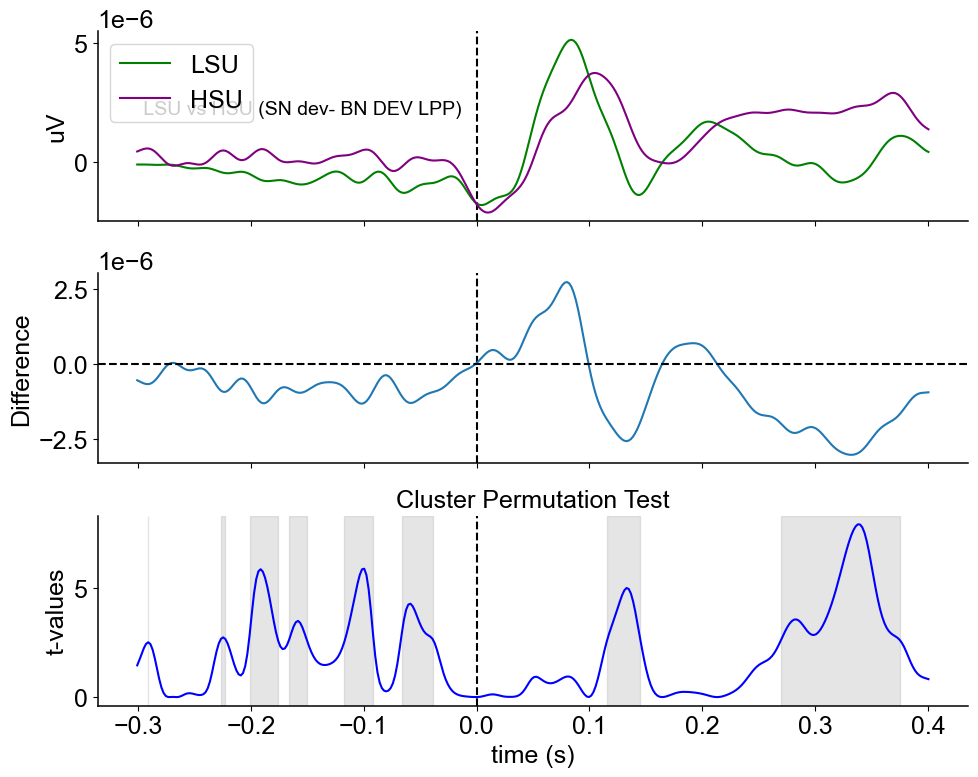

In [96]:
time_range= (-.300, .400)
evokeds_subset = {}
for cond in usage_groups_SN_LPP_evokes:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in usage_groups_SN_LPP_evokes[cond]]
        evokeds_subset[cond]  =evoked_crop 
from scipy.stats import ttest_ind
import numpy as np

def indep_t(X, Y):
    tvals, _ = ttest_ind(X, Y, axis=0, equal_var=False)
    return tvals

fig, ax = plot_mmn_cluster(
    evokeds_subset["low sub"],
    evokeds_subset["high sub"],labelc1="LSU",labelc2="HSU",
    picks=['Cz','Fz','FCz'],tail=1,
)
ax[0].text(-.30,2*1e-6," LSU vs HSU (SN dev- BN DEV LPP)")

In [97]:
evokeds_subset["low sub"][0].times[292], evokeds_subset["low sub"][0].times[347]#,/ 292, 347

(np.float64(0.26953125), np.float64(0.376953125))

In [98]:
(235*512, 265* 512) 
evokeds_subset["avg sub"][0].times[244],evokeds_subset["avg sub"][0].times[258]  

(np.float64(0.17578125), np.float64(0.203125))

In [99]:
# # load the data
# from scipy.stats import mannwhitneyu
# from statannotations.Annotator import Annotator
# from statsmodels.formula.api import ols
# from statsmodels.stats.anova import anova_lm
# from statsmodels.stats.multicomp import pairwise_tukeyhsd
# scores = dict(n1=dict(sn={}, bn={}), mmn=dict(sn={}, bn={}))
# for sub in os.listdir(epoch_folder ):
#     if (sub=="CAR") or (sub[:-8] not in list(mmn_filtered_df['sub_id'])):
#         continue
#     print(sub)
#     epochs = mne.read_epochs(os.path.join(epoch_folder,sub), preload=True)
#     sn_N1_time= score_df[(score_df['sub_id']==sub[:-8])& (score_df['measure']=='n1')]['SN_PL_mean'].iloc[0]
#     print(sn_N1_time,bn_N1_time)
#     epochs_times = epochs.times
#     # find nearest index
#     nearest_sn_N1_time= epochs_times[np.argmin(np.abs(epochs_times - sn_N1_time))]

#     sn_epochs = epochs['S15','S24'].copy().shift_time(-nearest_sn_N1_time)  # shift time backward by 100 ms
#     print("BN STD : ", len(epochs['S14']),"SN STD : ", len(epochs['S24']) )
#     #scores['mmn']['bn'][sub], _, f_bn = erputils.get_erp_sem([_epochs['S25'], _epochs['S14']], n_iterations=50, window=(0.19, 0.33), picks=['Fz', 'FCz', 'Cz'], latency_fractions=[0.25, 0.5, 0.75])
#     scores['mmn']['sn'][sub], _, f_sn = erputils.get_erp_sem([sn_epochs['S15'], sn_epochs['S24']], n_iterations=500, window=(0.154296875, 0.22265625), 
#                                                              picks=['Pz', 'CPz', 'Cz'], latency_fractions=[0.25, 0.5, 0.75],extrema =1)
#     f_sn.get_axes()[0].set_title(f'{sub} SN MMN', y=0.9, loc='right')



# scores_ = pd.concat(
#     {e: pd.concat(
#         {t: pd.concat(scores[e][t]) for t in ['sn']}
#     ) for e in ['mmn']},
#     names=['erp', 'kind', 'subject', 'iteration']
# )   
# scores_
# mean_scores = scores_.groupby(['erp', 'kind', 'subject']).mean()
# sem_scores = scores_.groupby(['erp', 'kind', 'subject']).std()
# sem_scores.head()

# mean_scores_ = (mean_scores.reset_index().rename(columns={"subject": "sub_id"}).drop(columns=["erp", "kind"]))
# mean_scores_['sub_id'] = mean_scores_['sub_id'].apply(lambda x: x[:-8])
# mean_scores_ = mean_scores_.merge(mmn_filtered_df[["sub_id",'group',"SAS_score"]], how='inner')
# from scipy.stats import mannwhitneyu

# print(mannwhitneyu(mean_scores_[mean_scores_['group']=='LSU']["TWMA"],mean_scores_[mean_scores_['group']=='HSU']["TWMA"],alternative='greater'))
# print(ttest_ind(mean_scores_[mean_scores_['group']=='LSU']["TWMA"],mean_scores_[mean_scores_['group']=='HSU']["TWMA"]))
# plotdf = mean_scores_[mean_scores_['group'].isin(['LSU','HSU'])]

# model_pl = ols("TWMA ~ C(group)", data=plotdf).fit()
# anova_table_pl = anova_lm(model_pl, typ=2)
# print(anova_table_pl)

In [100]:
t_stat, p_two = 1.8263198620582244,0.0835584139970424
if t_stat > 0:
    p_greater = p_two / 2
else:
    p_greater = 1 - p_two / 2
print(p_greater)

0.0417792069985212


## Beep HSU and LSU

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


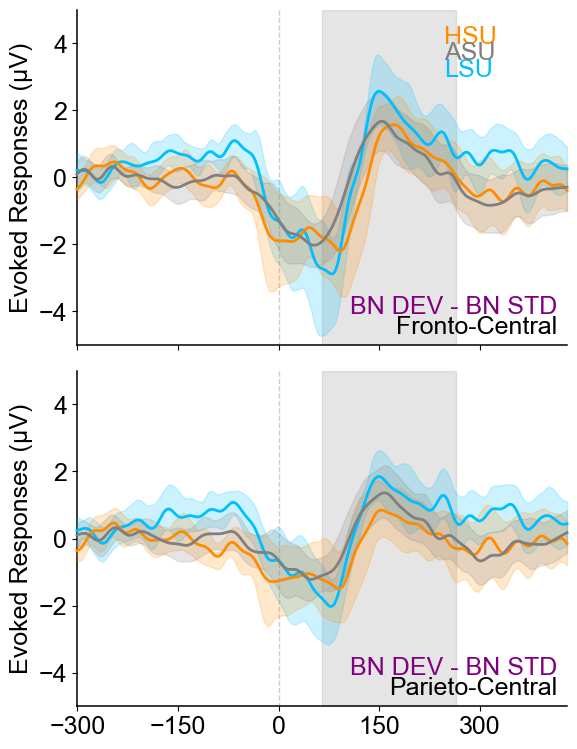

In [101]:
# Assign evokeds to the appropriate group
# for sub, evoked in sn_STD_N1_aligned_SN_LPP_evokeds_dict_all.items():
#     for group_name, subject_list in usage_groups.items():
#         if sub in subject_list:
#             usage_groups_SN_LPP_evokes[group_name].append(evoked)
#             break 

fig, axs = plt.subplots(2,1, figsize=(6,8), dpi=100,sharex=True,sharey= True)
time_range = (-.300,.4300)
text_labels = [(0.80, "LSU",'deepskyblue'),(0.90, f"HSU",'darkorange'),(0.85, f"ASU",'grey'),]

plot_erps(usage_groups_BN_MMN_evokes, picks=['Fz',"FCz","Cz"],
       stylesdict=stylesdict,axs = axs[0],ylim=(-5,5),ci= .95,
                                   text_labels=text_labels,title=f'',time_range=time_range)
axs[0].text(.980, .08, f"BN DEV - BN STD", ha='right', va='bottom', fontsize=18, color='purple',transform=axs[0].transAxes)
axs[0].text(.980, .020, f"Fronto-Central", ha='right', va='bottom', fontsize=18, color='black',transform=axs[0].transAxes)
vline_time =score_df[score_df['measure']=='n1stdp2']['BN_PL_mean'].mean()*1000
axs[0].axvspan( vline_time,vline_time+200, color='gray', alpha=0.2)
axs[0].set_xlabel("")



plot_erps(usage_groups_BN_MMN_evokes, picks=[ 'Pz','CPz',"Cz"],
       stylesdict=stylesdict,axs = axs[1],ylim=(-5,5),ci= .95,title=f'',time_range=time_range)
axs[1].text(.980, .080, f"BN DEV - BN STD",ha='right', va='bottom', fontsize=18, color='purple',transform=axs[1].transAxes)
axs[1].text(.980, .020, f"Parieto-Central",ha='right', va='bottom', fontsize=18, color='black',transform=axs[1].transAxes)
vline_time =score_df[score_df['measure']=='n1stdp2']['BN_PL_mean'].mean()*1000
axs[1].axvspan( vline_time,vline_time+200, color='gray', alpha=0.2)
axs[1].set_xlabel("")





fig.patch.set_alpha(0)     # Make entire figure background transparent
     # Make axes background transparent
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))


In [102]:
mne.channels.get_builtin_montages()

['standard_1005',
 'standard_1020',
 'standard_alphabetic',
 'standard_postfixed',
 'standard_prefixed',
 'standard_primed',
 'biosemi16',
 'biosemi32',
 'biosemi64',
 'biosemi128',
 'biosemi160',
 'biosemi256',
 'easycap-M1',
 'easycap-M10',
 'easycap-M43',
 'EGI_256',
 'GSN-HydroCel-32',
 'GSN-HydroCel-64_1.0',
 'GSN-HydroCel-65_1.0',
 'GSN-HydroCel-128',
 'GSN-HydroCel-129',
 'GSN-HydroCel-256',
 'GSN-HydroCel-257',
 'mgh60',
 'mgh70',
 'artinis-octamon',
 'artinis-brite23',
 'brainproducts-RNP-BA-128']

Identifying common channels ...


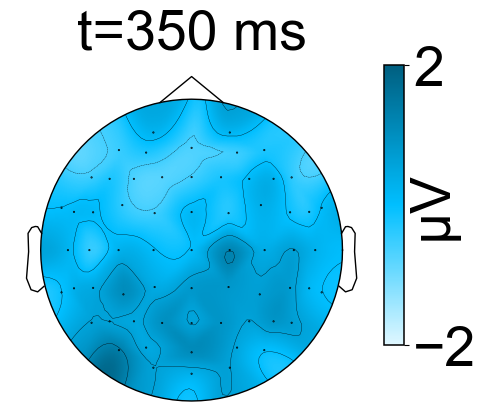

Identifying common channels ...


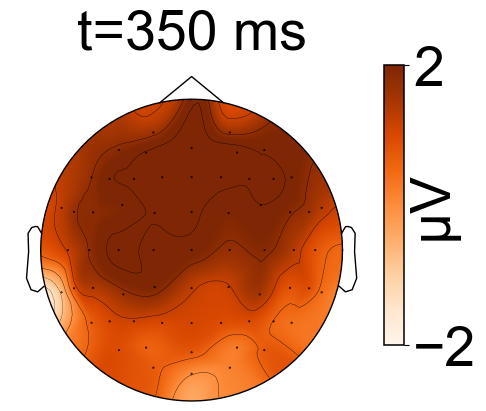

In [103]:
import matplotlib.colors as mcolors
# Define time points
time_points = [0.350]

# Set the color scale range
vlim = (-2,2)  # Adjust based on your data

colors = ['#e0f7ff' ,'#00bfff', '#005f80',]  # dark-> DeepSkyBlue -> light 
cmap_blue = mcolors.LinearSegmentedColormap.from_list("deep_sky_blue", colors)
# Create a grid of subplots
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None
time_range=(-.200,.350)
evokeds_subset = {}
for cond in usage_groups_SN_LPP_evokes:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in usage_groups_SN_LPP_evokes[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['low sub']).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap=cmap_blue ,
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15, 0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Greens']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap_blue )
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40,labelpad = -50)  # Adjust fontsize here
cbar.set_ticks([-2,2])
# Add row labels
#fig.text(0.0001, 0.5, 'PS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()




fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['high sub']).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='Oranges',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15,  0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Oranges']  # Choose a colormap (like 'RdBu_r')

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40,labelpad = -50)  # Adjust fontsize here
cbar.set_ticks([-2,2])

# Add row labels
#fig.text(0.0001, 0.5, 'NPS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()

Identifying common channels ...


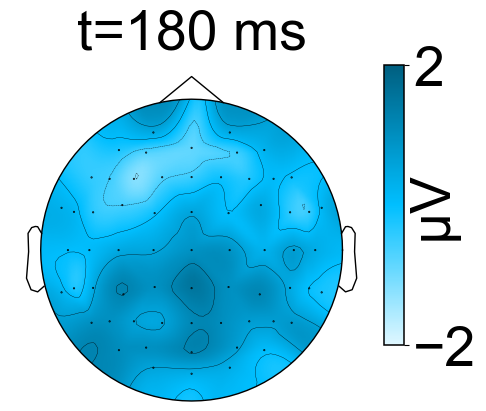

Identifying common channels ...


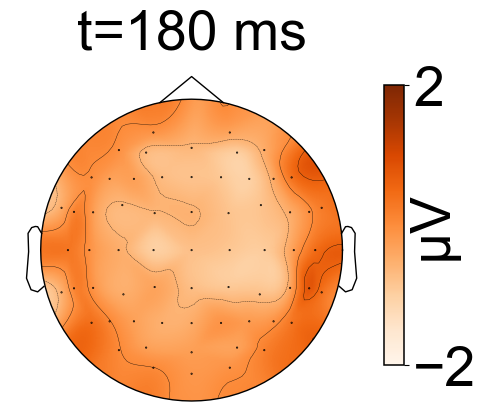

In [104]:
import matplotlib.colors as mcolors
# Define time points
time_points = [0.18]

# Set the color scale range
vlim = ( -2,2)  # Adjust based on your data

colors = ['#e0f7ff' ,'#00bfff', '#005f80',]  # dark-> DeepSkyBlue -> light 
cmap_blue = mcolors.LinearSegmentedColormap.from_list("deep_sky_blue", colors)
# Create a grid of subplots
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None
time_range=(-.200,.350)
evokeds_subset = {}
for cond in usage_groups_SN_devi_evokes:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in usage_groups_SN_devi_evokes[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['low sub']).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap=cmap_blue ,
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15, 0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Greens']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap_blue )
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40,labelpad=-50)  # Adjust fontsize here
cbar.set_ticks([-2,2])
# Add row labels
#fig.text(0.0001, 0.5, 'PS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()




fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['high sub']).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='Oranges',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.10,  0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Oranges']  # Choose a colormap (like 'RdBu_r')

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40,labelpad=-50)  # Adjust fontsize here
cbar.set_ticks([-2,2])

# Add row labels
#fig.text(0.0001, 0.5, 'NPS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()

In [105]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

def plot_group_violin(df, 
        metric='SN_PL_mean',                   # column to plot
        group_col='group',                     # grouping column
        groups=('HSU', 'LSU'),                # two groups to compare
        ylabel=None,                           # axis label (auto if None)
        palette=('darkorange', 'deepskyblue'), # colors for the 2 groups
        ax=None,                               # allow user to pass ax
        figsize=(6,6)                          # only used if ax=None
    ):
    """
    Creates a violin + strip plot for any metric column compared across 2 groups.
    Also performs a t-test and adds significance stars.

    Parameters
    ----------
    df : pandas.DataFrame
    metric : str, default 'SN_PL_mean'
        Column name to plot on y-axis
    group_col : str, default 'group'
        Column containing group labels
    groups : tuple, default ('high','low')
        The two group names to compare statistically
    ylabel : str or None
        y-axis label (auto-generated if None)
    palette : tuple of 2 colors
    ax : matplotlib Axes or None
        If None, a new figure is created and returned
    figsize : tuple, only used if ax=None
    """

    # --- Set up Axes ---
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
        return_fig = True
    else:
        return_fig = False

    # --- Violin plot ---
    sns.violinplot(
        data=df, x=group_col, y=metric, hue=group_col,
        palette=palette, inner='box', linewidth=1, cut=0,
        inner_kws=dict(box_width=20, whis_width=1.5, alpha=0.5),
        ax=ax
    )

    # --- Strip plot ---
    sns.stripplot(
        data=df, x=group_col, y=metric, hue=group_col,
        palette=palette, size=5, alpha=0.35, linewidth=1.2,
        edgecolor='black', dodge=False, ax=ax
    )

    # Remove duplicate legends
    ax.legend([], [], frameon=False)

    # --- Statistical test ---
    g1, g2 = groups
    data1 = df[df[group_col] == g1][metric]
    data2 = df[df[group_col] == g2][metric]
    
    t_stat, p_value = stats.ttest_ind(data1.dropna(), data2.dropna())
    print(f"{metric}: t = {t_stat:.3f}, p = {p_value:.4g}")

    # --- Significance bar ---
    y_max = df[metric].max() * 1.1
    ax.plot([0, 1], [y_max, y_max], lw=1, color='black')

    star_label = (
        '****' if p_value <= 1e-4 else
        '***'  if p_value <= 1e-3 else
        '**'   if p_value <= 1e-2 else
        '*'    if p_value <= 5e-2 else
        'ns'
    )
    ax.text(0.5, y_max, star_label, ha='center', va='bottom', fontsize=22)

    # --- Labels ---
    if ylabel is None:
        ylabel = metric.replace('_', ' ')
    ax.set_ylabel(ylabel)
    ax.set_xlabel("")

    if return_fig:
        return fig, ax


In [106]:
p2_df =  filtered_df[(filtered_df['measure'] == 'n1mmn') ]

p2_df

,sub_id,measure,BN_PA_mean,BN_PA_std,SN_PA_mean,SN_PA_std,BN_PL_mean,BN_PL_std,SN_PL_mean,SN_PL_std,...,b1_deviant,b2_deviant,b3_deviant,comments,SN_tone,Tone_delay,participant_id_y,SAS_score,group,SN_code
2,sub-sd011,n1mmn,-4.134004,0.792619,-3.738444,1.139663,0.074258,0.024218,0.028008,0.018732,...,SN,BT,NaN,FT10 noisy channel interpolated and further r...,Hello_inMoto,0.008617,NaN,NaN,ASU,SN19
32,sub-sd015,n1mmn,-2.374648,0.872615,-1.291215,0.902627,0.037717,0.012631,0.049234,0.017950,...,SN,BT,NaN,bad electrode = None,realme_fun,0.006780,NaN,NaN,ASU,SN3
42,sub-sd016,n1mmn,-4.263930,0.862598,-7.003926,0.890247,0.030851,0.010099,0.009888,0.008160,...,SN,BT,NaN,NaN,Whoop_doop,0.036576,NaN,NaN,ASU,SN1
52,sub-sd017,n1mmn,-1.989663,0.979853,-4.138813,1.028117,0.062355,0.015664,0.019434,0.026147,...,SN,BT,NaN,NaN,spaceline,0.006485,NaN,NaN,LSU,SN18
92,sub-sd021,n1mmn,-3.253909,0.756655,-3.348324,0.654350,0.057973,0.006269,0.018712,0.013452,...,SN,BT,NaN,NaN,voyar,0.006689,NaN,NaN,LSU,SN6
112,sub-sd023,n1mmn,-3.418441,1.301994,-2.922643,1.224198,0.024503,0.006565,0.019636,0.009760,...,SN,BT,NaN,NaN,realme_fun,0.006780,NaN,NaN,LSU,SN3
122,sub-sd024,n1mmn,-2.991516,1.097827,-3.679547,1.230848,0.061311,0.017084,0.059410,0.023729,...,SN,BT,NaN,bad electrode = FT9,oneplus_meet,0.011837,NaN,NaN,ASU,SN7
132,sub-sd025,n1mmn,-4.549897,0.822462,-4.135966,0.859483,0.047726,0.003742,0.019031,0.011302,...,SN,BT,NaN,,oneplus_blissful,0.007211,NaN,NaN,ASU,SN8
142,sub-sd026,n1mmn,-1.242325,1.140511,-3.830480,1.066310,0.038597,0.003726,0.021574,0.006601,...,SN,BT,NaN,NaN,spaceline,0.006485,NaN,NaN,ASU,SN18
152,sub-sd027,n1mmn,0.086834,0.739904,-2.910166,0.799926,0.035727,0.018459,0.057113,0.006526,...,SN,BT,NaN,NaN,oneplustune,0.031429,NaN,NaN,LSU,SN5


In [107]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind, mannwhitneyu

def get_group_comparison_stats(filtered_df, measure, condition, metric):
    """
    Compare HSU vs LSU for a given measure, condition (SN/BN), and metric.

    Returns group stats and between-group test results.
    """
    # Define column names dynamically
    mean_col = f"{condition}_{metric}_mean"
    std_col = f"{condition}_{metric}_std"

    # Extract data for both groups
    df_hsu = filtered_df[(filtered_df['group'] == "HSU") & (filtered_df['measure'] == measure)]
    df_lsu = filtered_df[(filtered_df['group'] == "LSU") & (filtered_df['measure'] == measure)]

    hsu_means = df_hsu[mean_col].dropna()
    lsu_means = df_lsu[mean_col].dropna()

    hsu_stds = df_hsu[std_col].dropna()
    lsu_stds = df_lsu[std_col].dropna()

    # Perform group comparison if there are enough samples
    if len(hsu_means) > 1 and len(lsu_means) > 1:
        t_stat, t_p_val = ttest_ind(hsu_means, lsu_means, equal_var=False,alternative='less')
        m_stat, m_p_val = mannwhitneyu(hsu_means, lsu_means, alternative='less')
    else:
        t_stat = t_p_val = m_stat = m_p_val = np.nan

    return {
        "measure": measure,
        "condition": condition,
        "metric": metric,
        "HSU_mean": float(np.mean(hsu_means)) if not hsu_means.empty else np.nan,
        "LSU_mean": float(np.mean(lsu_means)) if not lsu_means.empty else np.nan,
        "HSU_std": float(np.mean(hsu_stds)) if not hsu_stds.empty else np.nan,
        "LSU_std": float(np.mean(lsu_stds)) if not lsu_stds.empty else np.nan,
        "t-test": t_stat,
        "t_p_val": t_p_val,
        "wilcoxon": m_stat,
        "w_p_val": m_p_val,
    }
def build_group_comparison_df(filtered_df,conditions = ["SN", "BN"]):
    
    measures = filtered_df['measure'].unique()
    metrics = set(col.split('_')[1] for col in filtered_df.columns if 'SN_' in col and '_mean' in col)

    results = []
    for measure in measures:
        for condition in conditions:
            for metric in metrics:
                try:
                    result = get_group_comparison_stats(filtered_df, measure, condition, metric)
                    results.append(result)
                except KeyError:
                    continue


                    

    return pd.DataFrame(results)


In [108]:
group_stats_df = build_group_comparison_df(filtered_df,conditions=["SN"])
group_stats_df


,measure,condition,metric,HSU_mean,LSU_mean,HSU_std,LSU_std,t-test,t_p_val,wilcoxon,w_p_val
0,n1dev,SN,FAL,0.266185,0.221244,0.001786,0.002715,1.301498,0.887730,49.0,0.349268
1,n1dev,SN,PL,0.273818,0.235582,0.003242,0.004032,1.201688,0.870509,52.0,0.430129
2,n1dev,SN,PA,-6.895015,-6.347358,0.930561,0.962127,-0.314317,0.378523,45.0,0.251757
3,n1dev,SN,TWMA,-2.817120,-4.116754,0.377348,0.460834,0.922875,0.815415,60.0,0.650732
4,n1lpp,SN,FAL,0.362146,0.376361,0.023523,0.019105,-1.696694,0.053059,29.0,0.036275
5,n1lpp,SN,PL,0.349791,0.362957,0.014528,0.016514,-1.808640,0.044745,34.0,0.074430
6,n1lpp,SN,PA,3.087361,2.462395,1.379526,1.521463,0.585432,0.717148,63.0,0.725264
7,n1lpp,SN,TWMA,0.330077,-0.011315,0.525193,0.571390,1.057795,0.847421,73.0,0.903667
8,n1mmn,SN,FAL,0.044227,0.038569,0.011373,0.009731,0.432918,0.664901,56.0,0.542061
9,n1mmn,SN,PL,0.026832,0.026850,0.012130,0.008910,-0.003009,0.498816,60.0,0.650732


In [109]:
group_stats_df[group_stats_df["measure"]=="n1noveltyp2"]

,measure,condition,metric,HSU_mean,LSU_mean,HSU_std,LSU_std,t-test,t_p_val,wilcoxon,w_p_val
12,n1noveltyp2,SN,FAL,0.206016,0.189811,0.014521,0.013003,2.327711,0.984417,88.0,0.990838
13,n1noveltyp2,SN,PL,0.191960,0.186968,0.012017,0.013660,0.915471,0.812814,62.0,0.701297
14,n1noveltyp2,SN,PA,2.121755,3.251970,1.038803,1.143672,-0.906522,0.188063,47.0,0.298703
15,n1noveltyp2,SN,TWMA,-0.224618,0.523078,0.360275,0.415168,-2.614666,0.008530,24.0,0.015867


In [110]:
 import pandas as pd
import numpy as np
from scipy.stats import ttest_ind, mannwhitneyu
from statsmodels.stats.multitest import multipletests


def get_group_comparison_stats(filtered_df, measure, condition, metric):
    """
    Compare HSU vs LSU for a given measure, condition (SN/BN), and metric.

    Returns group stats and between-group test results (raw p-values).
    """
    # Define column names dynamically
    mean_col = f"{condition}_{metric}_mean"
    std_col = f"{condition}_{metric}_std"

    # Extract data for both groups
    df_hsu = filtered_df[(filtered_df['group'] == "HSU") & (filtered_df['measure'] == measure)]
    df_lsu = filtered_df[(filtered_df['group'] == "LSU") & (filtered_df['measure'] == measure)]

    hsu_means = df_hsu[mean_col].dropna()
    lsu_means = df_lsu[mean_col].dropna()

    hsu_stds = df_hsu[std_col].dropna()
    lsu_stds = df_lsu[std_col].dropna()

    # Perform group comparison if there are enough samples
    if len(hsu_means) > 1 and len(lsu_means) > 1:
        t_stat, t_p_val = ttest_ind(hsu_means, lsu_means, equal_var=False, alternative='less')
        m_stat, m_p_val = mannwhitneyu(hsu_means, lsu_means, alternative='less')
    else:
        t_stat = t_p_val = m_stat = m_p_val = np.nan

    return {
        "measure": measure,
        "condition": condition,
        "metric": metric,
        "n_hsu": int(len(hsu_means)),
        "n_lsu": int(len(lsu_means)),
        "HSU_mean": float(np.mean(hsu_means)) if not hsu_means.empty else np.nan,
        "LSU_mean": float(np.mean(lsu_means)) if not lsu_means.empty else np.nan,
        "HSU_std": float(np.mean(hsu_stds)) if not hsu_stds.empty else np.nan,
        "LSU_std": float(np.mean(lsu_stds)) if not lsu_stds.empty else np.nan,
        "t-test": t_stat,
        "t_p_val": t_p_val,
        "wilcoxon": m_stat,   # Mann-Whitney U statistic (key kept for compatibility)
        "w_p_val": m_p_val,
    }


def _apply_correction(df, p_col, corrected_col, reject_col, method, alpha):
    """Correct the p-values in `p_col` across all rows of `df` (one family of tests).

    NaN p-values (too few samples) are passed through untouched and excluded
    from the comparison count so they don't inflate the correction.
    """
    df[corrected_col] = np.nan
    df[reject_col] = pd.NA

    valid = df[p_col].notna()
    pvals = df.loc[valid, p_col].to_numpy()
    if pvals.size == 0:
        return df

    reject, p_corr, _, _ = multipletests(pvals, alpha=alpha, method=method)
    df.loc[valid, corrected_col] = p_corr
    df.loc[valid, reject_col] = reject  # True == significant after correction
    return df


def build_group_comparison_df(filtered_df, conditions=["SN", "BN"],
                              correction_method="bonferroni", alpha=0.05,
                              group_cols=["measure"]):
    """
    Parameters
    ----------
    correction_method : str or None
        'bonferroni', 'holm', 'fdr_bh', 'sidak', ... (statsmodels methods).
        None skips correction.
    alpha : float
        Error rate used for the significance flags.
    group_cols : list[str] or None
        Columns defining each correction family. Default ['measure'] corrects
        within each measure (family = the condition x metric tests of that
        measure). Use ['measure', 'condition'] to correct within each
        measure+condition instead, or None to correct across everything at once.

    Added columns
    -------------
    t_p_corrected / w_p_corrected : corrected p-values
    t_significant / w_significant : bool, significant at `alpha` after correction
    """
    measures = filtered_df['measure'].unique()
    metrics = set(col.split('_')[1] for col in filtered_df.columns
                  if 'SN_' in col and '_mean' in col)

    # Collect all per-test results first (correction needs the whole family)
    results = []
    for measure in measures:
        for condition in conditions:
            for metric in metrics:
                try:
                    result = get_group_comparison_stats(filtered_df, measure, condition, metric)
                    results.append(result)
                except KeyError:
                    continue

    stats_df = pd.DataFrame(results)
    if stats_df.empty or correction_method is None:
        return stats_df

    def correct_group(g):
        g = _apply_correction(g, "t_p_val", "t_p_corrected",
                              "t_significant", correction_method, alpha)
        g = _apply_correction(g, "w_p_val", "w_p_corrected",
                              "w_significant", correction_method, alpha)
        return g

    if group_cols:
        parts = [correct_group(g.copy()) for _, g in stats_df.groupby(group_cols)]
        stats_df = pd.concat(parts).sort_index()
    else:
        stats_df = correct_group(stats_df)

    return stats_df


# Usage example
# Correct within each measure (default):
#group_stats_df = build_group_comparison_df(filtered_df)

# Or correct within each measure + condition separately:
group_stats_df = build_group_comparison_df(filtered_df, group_cols=["measure"],conditions=["SN"])
group_stats_df

,measure,condition,metric,n_hsu,n_lsu,HSU_mean,LSU_mean,HSU_std,LSU_std,t-test,t_p_val,wilcoxon,w_p_val,t_p_corrected,t_significant,w_p_corrected,w_significant
0,n1dev,SN,FAL,10,11,0.266185,0.221244,0.001786,0.002715,1.301498,0.887730,49.0,0.349268,1.000000,False,1.000000,False
1,n1dev,SN,PL,10,11,0.273818,0.235582,0.003242,0.004032,1.201688,0.870509,52.0,0.430129,1.000000,False,1.000000,False
2,n1dev,SN,PA,10,11,-6.895015,-6.347358,0.930561,0.962127,-0.314317,0.378523,45.0,0.251757,1.000000,False,1.000000,False
3,n1dev,SN,TWMA,10,11,-2.817120,-4.116754,0.377348,0.460834,0.922875,0.815415,60.0,0.650732,1.000000,False,1.000000,False
4,n1lpp,SN,FAL,10,11,0.362146,0.376361,0.023523,0.019105,-1.696694,0.053059,29.0,0.036275,0.212237,False,0.145099,False
5,n1lpp,SN,PL,10,11,0.349791,0.362957,0.014528,0.016514,-1.808640,0.044745,34.0,0.074430,0.178980,False,0.297722,False
6,n1lpp,SN,PA,10,11,3.087361,2.462395,1.379526,1.521463,0.585432,0.717148,63.0,0.725264,1.000000,False,1.000000,False
7,n1lpp,SN,TWMA,10,11,0.330077,-0.011315,0.525193,0.571390,1.057795,0.847421,73.0,0.903667,1.000000,False,1.000000,False
8,n1mmn,SN,FAL,10,11,0.044227,0.038569,0.011373,0.009731,0.432918,0.664901,56.0,0.542061,1.000000,False,1.000000,False
9,n1mmn,SN,PL,10,11,0.026832,0.026850,0.012130,0.008910,-0.003009,0.498816,60.0,0.650732,1.000000,False,1.000000,False


In [111]:
multipletests([0.0085,0.037], alpha=0.05, method="fdr_bh")

(array([ True,  True]),
 array([0.017, 0.037]),
 np.float64(0.025320565519103666),
 0.025)

## Ordinary Least Squares (OLS) regression function

In [112]:
len(filtered_df[filtered_df['measure'] =="n1noveltyp2"]['sub_id'].unique())


42

In [113]:
novelp3_filtered_df = filtered_df[filtered_df['measure'] =="n1noveltyp2" ]
novelp3_filtered_df = novelp3_filtered_df[novelp3_filtered_df['group'].isin(['LSU','HSU'])]


C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\896258034.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plotdf[['SN_PL_mean','SN_PL_std'] ]= plotdf[['SN_PL_mean','SN_PL_std']]*1000


ANCOVA PL p = 0.18077003905095446
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

LSU vs. HSU: Custom statistical test, P_val:1.808e-01


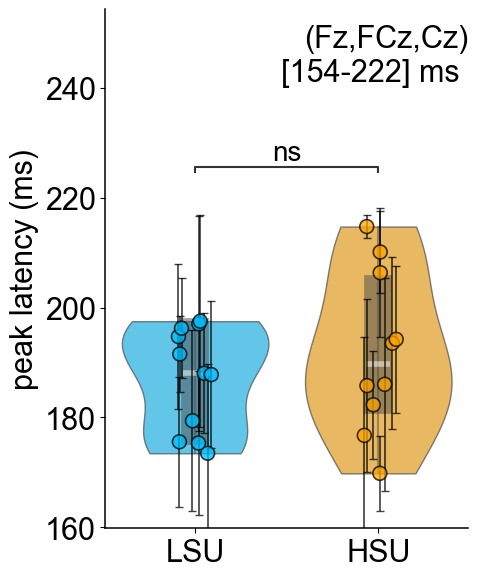

In [114]:
from statannotations.Annotator import Annotator
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
plotdf = novelp3_filtered_df[['sub_id','SN_PL_mean','SN_PL_std','group','SAS_score']]
plotdf[['SN_PL_mean','SN_PL_std'] ]= plotdf[['SN_PL_mean','SN_PL_std']]*1000
model_pl = ols("SN_PL_mean ~ C(group) ", data=plotdf).fit()
anova_table_pl = anova_lm(model_pl, typ=2)

p_value_pl = anova_table_pl.loc["C(group)", "PR(>F)"] /2
print("ANCOVA PL p =", p_value_pl)
import matplotlib.pyplot as plt
import seaborn as sns
#(µV)
fig ,ax = plt.subplots(1,1, figsize=(5,6),)
# Draw stripplot with hue
palette = {"ASU" : "grey", "LSU": "deepskyblue", "HSU": "orange"}
sns.stripplot(data=plotdf,x='group', y='SN_PL_mean',hue='group',palette=palette , dodge=False,jitter=True,size=10,linewidth=1.2,edgecolor='black',alpha=0.75,ax = ax,)
sns.violinplot(data=plotdf,x='group',y='SN_PL_mean',hue='group', inner='box', linewidth=1, cut=0,alpha = .7,palette=palette ,
    inner_kws=dict(box_width=20, whis_width=1.5, alpha=0.5),ax=ax)
# Unique groups in order
groups = plotdf['group'].unique()
upper = plotdf["SN_PL_mean"].max() + plotdf["SN_PL_std"].max() + 20
ax.set_ylim(plotdf["SN_PL_mean"].min() - 10, upper)
# Loop through each group and match scatterpoints to error bars
for gi, g in enumerate(groups):
    group_data = plotdf[plotdf['group'] == g]
    # Each hue/category produces its own scatter collection
    collection = ax.collections[gi]
    # Get x,y coordinates of the plotted points
    offsets = collection.get_offsets()
    # Loop through points and rows simultaneously
    for (x, y), (_, row) in zip(offsets, group_data.iterrows()):
        ax.errorbar(x,y,yerr=row['SN_PL_std'], fmt='none',ecolor='black',elinewidth=1.2,capsize=3,alpha=0.75)
# ==== PAIR TO ANNOTATE ====
pairs = [("LSU", "HSU")]

annot = Annotator(ax, pairs, data=plotdf, x='group', y='SN_PL_mean')
annot.configure(test=None,text_format='star',loc='inside',fontsize=20,           # bigger star
    line_offset=10,line_height=0.01,           # move bracket downwards (closer)
    )

# ====== SET YOUR OWN P-VALUE ======
annot.set_pvalues([p_value_pl])   # pass a list
annot.annotate()
ax.text(1, .850, f"(Fz,FCz,Cz)\n[154-222] ms ",ha='right', va='bottom', fontsize=22, color='black',transform=ax.transAxes)
ax.set_ylabel("peak latency (ms)",fontsize=22)
ax.set_xlabel("")
fig.patch.set_alpha(0)     
ax.patch.set_alpha(0)   
ax.tick_params(labelsize=22) 
ax.yaxis.set_major_locator(ticker.MaxNLocator(6))
plt.tight_layout()
plt.show()

ANCOVA PL p = 0.008867154823202647
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

LSU vs. HSU: Custom statistical test, P_val:8.867e-03


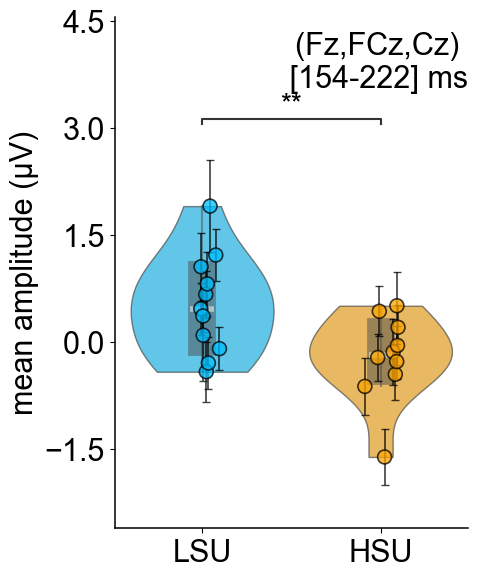

In [115]:
from statannotations.Annotator import Annotator
plotdf = novelp3_filtered_df[['sub_id','SN_TWMA_mean','SN_TWMA_std','group','SAS_score']]
plotdf = plotdf[plotdf['group'].isin(['LSU','HSU'])]
model_twma = ols("SN_TWMA_mean ~ C(group)", data=plotdf).fit()
anova_table_twma =  anova_lm(model_twma, typ=2)

p_value_twma = anova_table_twma.loc["C(group)", "PR(>F)"]/2
print("ANCOVA PL p =", p_value_twma)
import matplotlib.pyplot as plt
import seaborn as sns
#(µV)
fig ,ax = plt.subplots(1,1, figsize=(5,6),)
# Draw stripplot with hue
palette = {"ASU" : "grey", "LSU": "deepskyblue", "HSU": "orange"}
sns.stripplot(data=plotdf,x='group', y='SN_TWMA_mean',hue='group',palette=palette , dodge=False,jitter=True,size=10,linewidth=1.2,edgecolor='black',alpha=0.75,ax = ax,)
sns.violinplot(data=plotdf,x='group',y='SN_TWMA_mean',hue='group', inner='box', linewidth=1, cut=0,alpha = .7,palette=palette ,
    inner_kws=dict(box_width=20, whis_width=1.5, alpha=0.5),ax=ax)
# Unique groups in order
groups = plotdf['group'].unique()
upper = plotdf["SN_TWMA_mean"].max() + plotdf["SN_TWMA_std"].max() + 2
ax.set_ylim(plotdf["SN_TWMA_mean"].min() - 1, upper)
# Loop through each group and match scatterpoints to error bars
for gi, g in enumerate(groups):
    group_data = plotdf[plotdf['group'] == g]
    # Each hue/category produces its own scatter collection
    collection = ax.collections[gi]
    # Get x,y coordinates of the plotted points
    offsets = collection.get_offsets()
    # Loop through points and rows simultaneously
    for (x, y), (_, row) in zip(offsets, group_data.iterrows()):
        ax.errorbar(x,y,yerr=row['SN_TWMA_std'], fmt='none',ecolor='black',elinewidth=1.2,capsize=3,alpha=0.75)
# ==== PAIR TO ANNOTATE ====
pairs = [("LSU", "HSU")]

annot = Annotator(ax, pairs, data=plotdf, x='group', y='SN_TWMA_mean')
annot.configure(test=None,text_format='star',loc='inside',fontsize=20,           # bigger star
    line_offset=10,line_height=0.01,           # move bracket downwards (closer)
    )

# ====== SET YOUR OWN P-VALUE ======
annot.set_pvalues([p_value_twma])   # pass a list
annot.annotate()
ax.text(1, .850, f"(Fz,FCz,Cz) \n [154-222] ms",ha='right', va='bottom', fontsize=22, color='black',transform=ax.transAxes)

ax.set_ylabel("mean amplitude (µV)",fontsize =22)
ax.set_xlabel("")
fig.patch.set_alpha(0)     
ax.patch.set_alpha(0)   
ax.tick_params(labelsize=22) 
ax.yaxis.set_major_locator(ticker.MaxNLocator(6))
plt.tight_layout()
plt.show()

In [116]:
model_twma 

In [117]:
p_value_twma

np.float64(0.008867154823202647)

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

LSU vs. HSU: Custom statistical test, P_val:8.867e-03


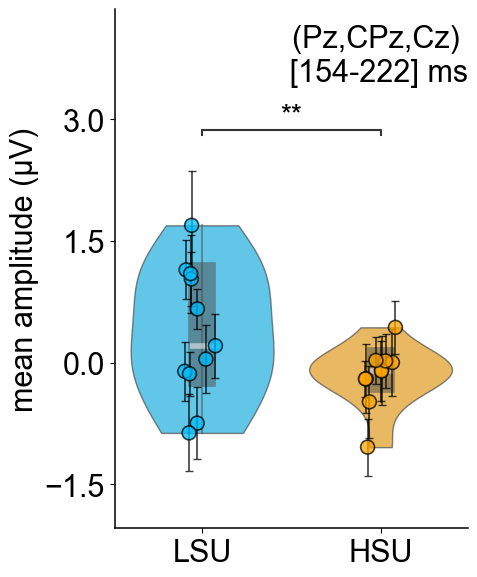

In [118]:
from statannotations.Annotator import Annotator
novelp3_pari_filtered_df = filtered_df[filtered_df['measure'] =="n1noveltyp2parieto" ]
novelp3_pari_filtered_df= novelp3_pari_filtered_df[novelp3_pari_filtered_df['group'].isin(['LSU','HSU'])]

plotdf = novelp3_pari_filtered_df[['sub_id','SN_TWMA_mean','SN_TWMA_std','group','SAS_score']]

# model_twma = ols("SN_TWMA_mean ~ C(group)+SAS_score", data=plotdf).fit()
# anova_table_twma =  anova_lm(model_twma, typ=1)

# p_value_twma = anova_table_twma.loc["C(group)", "PR(>F)"]/2
# print("ANCOVA PL p =", p_value_twma,anova_table_twma)
import matplotlib.pyplot as plt
import seaborn as sns
#(µV)
fig ,ax = plt.subplots(1,1, figsize=(5,6),)
# Draw stripplot with hue
palette = {"ASU" : "grey", "LSU": "deepskyblue", "HSU": "orange"}
sns.stripplot(data=plotdf,x='group', y='SN_TWMA_mean',hue='group',palette=palette , dodge=False,jitter=True,size=10,linewidth=1.2,edgecolor='black',alpha=0.75,ax = ax,)
sns.violinplot(data=plotdf,x='group',y='SN_TWMA_mean',hue='group', inner='box', linewidth=1, cut=0,alpha = .7,palette=palette ,
    inner_kws=dict(box_width=20, whis_width=1.5, alpha=0.5),ax=ax)
# Unique groups in order
groups = plotdf['group'].unique()
upper = plotdf["SN_TWMA_mean"].max() + plotdf["SN_TWMA_std"].max() + 2
ax.set_ylim(plotdf["SN_TWMA_mean"].min() - 1, upper)
# Loop through each group and match scatterpoints to error bars
for gi, g in enumerate(groups):
    group_data = plotdf[plotdf['group'] == g]
    # Each hue/category produces its own scatter collection
    collection = ax.collections[gi]
    # Get x,y coordinates of the plotted points
    offsets = collection.get_offsets()
    # Loop through points and rows simultaneously
    for (x, y), (_, row) in zip(offsets, group_data.iterrows()):
        ax.errorbar(x,y,yerr=row['SN_TWMA_std'], fmt='none',ecolor='black',elinewidth=1.2,capsize=3,alpha=0.75)
# ==== PAIR TO ANNOTATE ====
pairs = [("LSU", "HSU")]

annot = Annotator(ax, pairs, data=plotdf, x='group', y='SN_TWMA_mean')
annot.configure(test=None,text_format='star',loc='inside',fontsize=20,           # bigger star
    line_offset=10,line_height=0.01,           # move bracket downwards (closer)
    )

# ====== SET YOUR OWN P-VALUE ======
annot.set_pvalues([p_value_twma])   # pass a list
annot.annotate()
ax.text(1, .850, f"(Pz,CPz,Cz) \n [154-222] ms",ha='right', va='bottom', fontsize=22, color='black',transform=ax.transAxes)

ax.set_ylabel("mean amplitude (µV)",fontsize =22)
ax.set_xlabel("")
fig.patch.set_alpha(0)     
ax.patch.set_alpha(0)  
ax.tick_params(labelsize=22)   
ax.yaxis.set_major_locator(ticker.MaxNLocator(6))
plt.tight_layout()
plt.show()
# Step 2: Fit Factorial ANOVA
# model = ols("SN_TWMA_mean ~ C(group)+SAS_score", data=novelp3_filtered_df[['sub_id','SN_TWMA_mean','group','SAS_score']] ).fit()
# anova_table = anova_lm(model, typ=2)
# print("\n✅ Factorial ANOVA Results:\n")
# print(anova_table)

In [119]:
filtered_df['measure'].unique()

array(['n1dev', 'n1lpp', 'n1mmn', 'n1noveltyp2', 'n1noveltyp2fig2',
       'n1noveltyp2parieto', 'n1noveltyp2parietodelayedlpp', 'n1stdp2',
       'n1', 'p2'], dtype=object)

ANCOVA PL p = 0.1570823873480088
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

LSU vs. HSU: Custom statistical test, P_val:1.571e-01


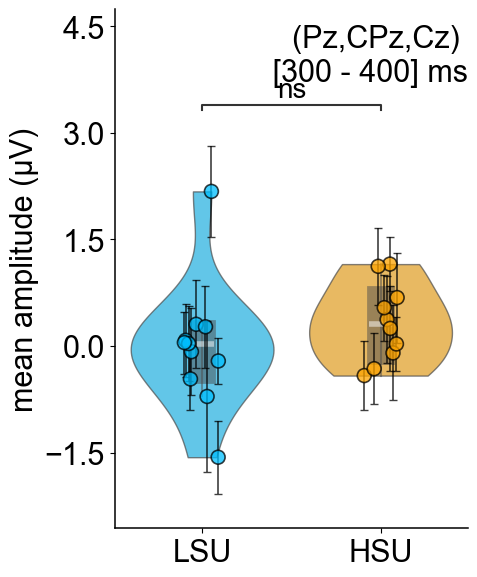

In [120]:
from statannotations.Annotator import Annotator
novelp3_pari_filtered_df = filtered_df[filtered_df['measure'] =="n1lpp" ]
novelp3_pari_filtered_df= novelp3_pari_filtered_df[novelp3_pari_filtered_df['group'].isin(['LSU','HSU'])]

plotdf = novelp3_pari_filtered_df[['sub_id','SN_TWMA_mean','SN_TWMA_std','group','SAS_score']]

model_twma = ols("SN_TWMA_mean ~ C(group)", data=plotdf).fit()
anova_table_twma =  anova_lm(model_twma, typ=2)

p_value_twma = anova_table_twma.loc["C(group)", "PR(>F)"]/2
print("ANCOVA PL p =", p_value_twma)
import matplotlib.pyplot as plt
import seaborn as sns
#(µV)
fig ,ax = plt.subplots(1,1, figsize=(5,6),)
# Draw stripplot with hue
palette = {"ASU" : "grey", "LSU": "deepskyblue", "HSU": "orange"}
sns.stripplot(data=plotdf,x='group', y='SN_TWMA_mean',hue='group',palette=palette , dodge=False,jitter=True,size=10,linewidth=1.2,edgecolor='black',alpha=0.75,ax = ax,)
sns.violinplot(data=plotdf,x='group',y='SN_TWMA_mean',hue='group', inner='box', linewidth=1, cut=0,alpha = .7,palette=palette ,
    inner_kws=dict(box_width=20, whis_width=1.5, alpha=0.5),ax=ax)
# Unique groups in order
groups = plotdf['group'].unique()
upper = plotdf["SN_TWMA_mean"].max() + plotdf["SN_TWMA_std"].max() + 1.5
ax.set_ylim(plotdf["SN_TWMA_mean"].min() - 1, upper)
# Loop through each group and match scatterpoints to error bars
for gi, g in enumerate(groups):
    group_data = plotdf[plotdf['group'] == g]
    # Each hue/category produces its own scatter collection
    collection = ax.collections[gi]
    # Get x,y coordinates of the plotted points
    offsets = collection.get_offsets()
    # Loop through points and rows simultaneously
    for (x, y), (_, row) in zip(offsets, group_data.iterrows()):
        ax.errorbar(x,y,yerr=row['SN_TWMA_std'], fmt='none',ecolor='black',elinewidth=1.2,capsize=3,alpha=0.75)
# ==== PAIR TO ANNOTATE ====
pairs = [("LSU", "HSU")]

annot = Annotator(ax, pairs, data=plotdf, x='group', y='SN_TWMA_mean')
annot.configure(test=None,text_format='star',loc='inside',fontsize=20,           # bigger star
    line_offset=10,line_height=0.01,           # move bracket downwards (closer)
    )

# ====== SET YOUR OWN P-VALUE ======
annot.set_pvalues([p_value_twma])   # pass a list
annot.annotate()
ax.text(1, .850, f"(Pz,CPz,Cz) \n [300 - 400] ms",ha='right', va='bottom', fontsize=22, color='black',transform=ax.transAxes)

ax.set_ylabel("mean amplitude (µV)",fontsize =22)
ax.set_xlabel("")
fig.patch.set_alpha(0)     
ax.patch.set_alpha(0)  
ax.tick_params(labelsize=22)  
ax.yaxis.set_major_locator(ticker.MaxNLocator(6))
plt.tight_layout()
plt.show()

## Combined Figure 4 ; HSU vs LSU

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
Identifying common channels ...


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Identifying common channels ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Identifying common channels ...
Identifying common channels ...
ANCOVA H Plots TWMA p = -2.614665558877312 0.00852992364129476
ANCOVA I Plots  PL p = 0.9154709721013666 0.8128141481064388
ANCOVA J plots  p = -1.9126942469128443 0.037893902059826456
ANCOVA K plots  p = 1.057795042637786 0.8474209476865512


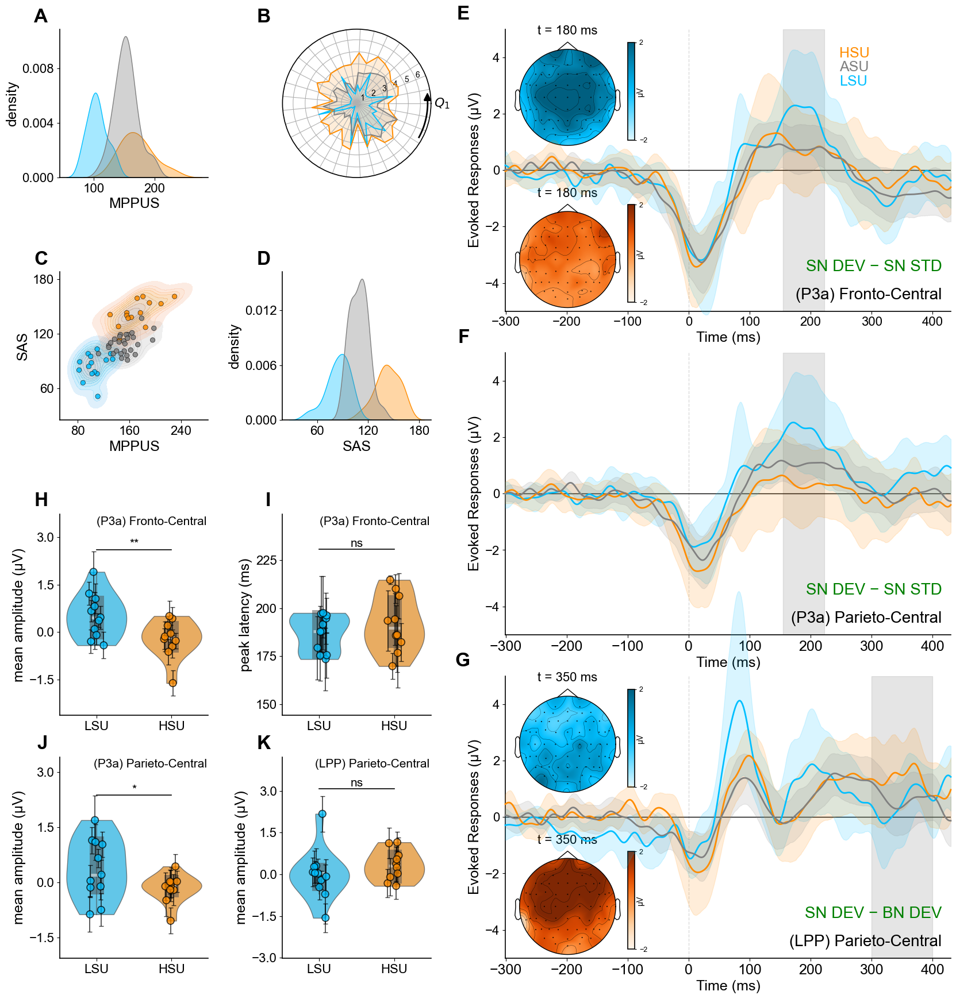

In [121]:
"""
FIGURE 4 — combined, publication-ready.

This revision (on top of your working version):
  * Topomaps in E and G enlarged (0.26 x 0.40 vs 0.20 x 0.30).
  * ERP column broadened (width ratio 1.5 -> 2.1, figure 18->20 in wide).
  * Larger, consistent fonts throughout for readability.
  * BUG FIX panel I: peak latency was multiplied by 1000 twice (data prep
    *1000 AND scale=1000) -> axis read 180000-225000. Now scaled once.

Panels:
  A MPPUS KDE   B radar   C SAS-vs-MPPUS   D SAS KDE
  E ERP Fronto-Central (+topos)  F ERP Parieto-Central  G ERP Parieto (+topos)
  H/I/J/K violin comparisons (LSU vs HSU)

Reviewer fixes retained: panel letters, one shared group legend, significance
key, axis labels with units.
"""

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch
import seaborn as sns
import mne
from scipy import stats
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# =========================================================================
# 0. STYLE — single source of truth (fonts bumped for readability)
# =========================================================================
FS_PANEL = 24   # panel letters
FS_LABEL = 18   # axis labels
FS_TICK  = 16   # tick labels
FS_TITLE = 16   # small panel titles
FS_ANNOT = 15   # in-panel notes (region / time window)
FS_ERP_NOTE = 20  # ERP contrast/region labels ("SN DEV - BN DEV", etc.)
FS_STAR  = 15   # significance stars
FS_TOPO  = 16   # topomap titles

GROUP_COLORS = {"HSU": "darkorange", "ASU": "grey", "LSU": "deepskyblue"}
CMAP_LOW  = mcolors.LinearSegmentedColormap.from_list(  # LSU topo (blue)
    "deep_sky_blue", ["#e0f7ff", "#00bfff", "#005f80"])
CMAP_HIGH = "Oranges"                                   # HSU topo (orange)

plt.rcParams.update({
    "font.family":         "sans-serif",
    "font.sans-serif":     ["Arial", "Helvetica", "DejaVu Sans"],
    "font.size":           FS_TICK,
    "axes.labelsize":      FS_LABEL,
    "axes.titlesize":      FS_TITLE,
    "xtick.labelsize":     FS_TICK,
    "ytick.labelsize":     FS_TICK,
    "axes.linewidth":      1.2,
    "axes.spines.top":     False,
    "axes.spines.right":   False,
    "savefig.dpi":         300,
    "savefig.bbox":        "tight",
    "savefig.transparent": True,
})


def add_panel_label(ax, letter, x=-0.08, y=1.02):
    ax.text(x, y, letter, transform=ax.transAxes, fontsize=FS_PANEL,
            fontweight="bold", va="bottom", ha="right")


# =========================================================================
# 1. PANEL BUILDERS
# =========================================================================
def draw_kde_diag(ax, df, var, hue_col, palette):
    """Distribution panel (A: MPPUS, D: SAS)."""
    sns.kdeplot(data=df, x=var, hue=hue_col, fill=True, alpha=0.35,
                common_norm=True, palette=palette, legend=False, ax=ax)
    ax.set_xlabel(var)
    ax.set_ylabel("density")
    ax.yaxis.set_major_locator(ticker.MaxNLocator(3))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(3))


def draw_scatter_kde(ax, df, xvar, yvar, hue_col, palette):
    """Bivariate panel (C: SAS vs MPPUS)."""
    sns.kdeplot(data=df, x=xvar, y=yvar, hue=hue_col, fill=True, alpha=0.25,
                common_norm=False, palette=palette, legend=False, ax=ax)
    sns.scatterplot(data=df, x=xvar, y=yvar, hue=hue_col, palette=palette,
                    edgecolor="black", alpha=0.85, legend=False, ax=ax)
    ax.set_xlabel(xvar)
    ax.set_ylabel(yvar)
    ax.yaxis.set_major_locator(ticker.MaxNLocator(3))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(3))


def draw_radar(ax, sas, sas_columns, cluster_col, clusters, colors):
    """Radar of SAS items (B). ax must be polar."""
    N = len(sas_columns)
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]
    for cluster, color in zip(clusters, colors):
        means = sas[sas[cluster_col] == cluster][sas_columns].mean().tolist()
        means += means[:1]
        ax.plot(angles, means, linewidth=1.4, color=color)
        ax.fill(angles, means, alpha=0.15, color=color)
    ax.set_xticks(angles[:-1])
    labels = [""] * N
    labels[0] = r"$Q_1$"
    ax.set_xticklabels(labels, size=FS_TICK)
    ax.set_yticks([1, 2, 3, 4, 5, 6])
    ax.set_yticklabels(["1", "2", "3", "4", "5", "6"], color="black", size=10)
    thetas = np.linspace(-0.5, 0.1, 100)
    r = ax.get_rmax() * 1.1
    ax.plot(thetas, [r] * 100, color="black", lw=2)
    ax.plot(thetas[-1], r, marker="^", color="black", ms=9)


def add_erp_topos(ax, evokeds_low, evokeds_high, t, vlim=(-2, 2)):
    """Two ENLARGED topomaps (LSU blue, HSU orange) in an ERP panel corner."""
    # >>> TWEAK: [x, y, w, h] in axes fraction. Raise w/h to grow the heads.
    cfg = [(evokeds_low,  CMAP_LOW,  [0.01, 0.58, 0.26, 0.40]),
           (evokeds_high, CMAP_HIGH, [0.01, 0.005, 0.26, 0.40])]
    for evks, cmap, rect in cfg:
        iax = ax.inset_axes(rect)
        mne.grand_average(evks).copy().plot_topomap(
            times=[t], axes=iax, vlim=vlim, cmap=cmap,
            colorbar=False, show=False)
        iax.set_title(f"t = {t * 1000:.0f} ms", fontsize=FS_TOPO, pad=1)
        iax.set_xticks([]); iax.set_yticks([])
        for s in iax.spines.values():
            s.set_visible(False)
        cax = iax.inset_axes([1.02, 0.05, 0.06, 0.9])
        sm = mpl.cm.ScalarMappable(mpl.colors.Normalize(*vlim), cmap=cmap)
        sm.set_array([])
        cb = ax.figure.colorbar(sm, cax=cax, ticks=list(vlim))
        cb.set_label("µV", fontsize=10, labelpad=-14)
        cb.ax.tick_params(labelsize=9, length=2)


def draw_erp(ax, evokeds, picks, plot_erps, stylesdict, time_range,
             span, region_label, contrast_label, contrast_color,
             text_labels=None, ci=0.95,ci_alpha = 0.20):
    """One ERP panel (E, F, G)."""
    plot_erps(evokeds, picks=picks, stylesdict=stylesdict, axs=ax,
              ylim=(-5, 5), ci=ci, text_labels=text_labels, title="",
              time_range=time_range,ci_alpha=ci_alpha)
    ax.axhline(0, color="black", linewidth=1.0, zorder=1.5)
    if span is not None:
        ax.axvspan(span[0], span[1], color="gray", alpha=0.2)
    ax.text(0.98, 0.13, contrast_label, transform=ax.transAxes,
            ha="right", va="bottom", fontsize=FS_ERP_NOTE, color=contrast_color)
    ax.text(0.98, 0.03, region_label, transform=ax.transAxes,
            ha="right", va="bottom", fontsize=FS_ERP_NOTE, color="black")
    ax.set_ylabel("Evoked Responses (µV)")


def draw_violin(ax, df, metric, ylabel, note, p_value,
                groups=("LSU", "HSU"), std_col=None, scale=1.0):
    """One violin+strip comparison with significance bracket (H, I, J, K)."""
    palette = {g: GROUP_COLORS[g] for g in groups}
    d = df.copy()
    cols = [metric] + ([std_col] if std_col else [])
    if scale != 1.0:
        d[cols] = d[cols] * scale

    sns.stripplot(data=d, x="group", y=metric, hue="group", palette=palette,
                  dodge=False, jitter=True, size=9, linewidth=1.2,
                  edgecolor="black", alpha=0.75, legend=False, ax=ax)
    sns.violinplot(data=d, x="group", y=metric, hue="group", palette=palette,
                   inner="box", linewidth=1, cut=0, alpha=0.7, legend=False,
                   inner_kws=dict(box_width=18, whis_width=1.5, alpha=0.5),
                   ax=ax)

    if std_col:
        for gi, g in enumerate(groups):
            gdata = d[d["group"] == g]
            offsets = ax.collections[gi].get_offsets()
            for (x, y), (_, row) in zip(offsets, gdata.iterrows()):
                ax.errorbar(x, y, yerr=row[std_col], fmt="none", ecolor="black",
                            elinewidth=1.2, capsize=3, alpha=0.75)

    star = ("***" if p_value <= 1e-3 else "**" if p_value <= 1e-2
            else "*" if p_value <= 5e-2 else "ns")
    pad = (d[std_col].max() if std_col else 0)
    y_max = d[metric].max() + pad*0.5 + 0.5 * (d[metric].std() or 1)
    ax.plot([0, 1], [y_max, y_max], lw=1.2, color="black")
    ax.text(0.5, y_max, star, ha="center", va="bottom", fontsize=FS_STAR)
    ax.set_ylim(d[metric].min() - pad - 0.5 * (d[metric].std() or 1),
                y_max + 1.5 * (d[metric].std() or 1))

    ax.text(0.99, .99, note, transform=ax.transAxes, ha='right', va="top",
            fontsize=FS_ANNOT, color="black")
    ax.set_ylabel(ylabel)
    ax.set_xlabel("")
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))


# =========================================================================
# 2. FIGURE & GRID  (ERP column broadened)
# =========================================================================
fig = plt.figure(figsize=(20, 21), dpi=100)
gs = GridSpec(12, 3, figure=fig, width_ratios=[1, 1, 3],             
              hspace=1.05, wspace=0.30)   # >>> TWEAK wspace: column gap

ax_A = fig.add_subplot(gs[0:3,  0])
ax_B = fig.add_subplot(gs[0:3,  1], polar=True)
ax_C = fig.add_subplot(gs[3:6,  0])
ax_D = fig.add_subplot(gs[3:6,  1])
ax_H = fig.add_subplot(gs[6:9,  0])
ax_I = fig.add_subplot(gs[6:9,  1])
ax_J = fig.add_subplot(gs[9:12, 0])
ax_K = fig.add_subplot(gs[9:12, 1])
ax_E = fig.add_subplot(gs[0:4,  2])
ax_F = fig.add_subplot(gs[4:8,  2])
ax_G = fig.add_subplot(gs[8:12, 2])

# Square the cluster panels and top-align them so the A / B / E letters line up.
for ax in (ax_A, ax_C, ax_D):
    ax.set_box_aspect(1)       # force a square shape
    ax.set_anchor("N")         # sit at the top of the grid cell
ax_B.set_anchor("N")           # radar is already circular; just top-align it

# =========================================================================
# 3. BUILD EACH PANEL   ( >>> DATA: your objects )
# =========================================================================
# --- A, C, D : cluster distributions (rebuilt from your pairplot) ----------
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import (KMeans, AgglomerativeClustering, DBSCAN,
                             SpectralClustering)
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture

sas_columns = [f'Q{i}' for i in range(1, 34)]
X_df = sas[sas_columns]
X_fixed = X_df.fillna(X_df.median()).values
X_scaled = StandardScaler().fit_transform(X_fixed)

clusterings = {
    "KMeans": KMeans(n_clusters=3, random_state=42),
    "GMM": GaussianMixture(n_components=3, random_state=42),
    "Agglomerative": AgglomerativeClustering(n_clusters=3),
    "Spectral": SpectralClustering(n_clusters=3, affinity='nearest_neighbors',
                                   random_state=42, n_neighbors=10),
}
for name, model in clusterings.items():
    if name == "GMM":
        sas[f"{name}_Cluster"] = model.fit_predict(X_scaled)
    else:
        sas[f"{name}_Cluster"] = model.fit(X_scaled).fit_predict(X_scaled)

cluster_df = pd.DataFrame({                                 # >>> DATA
    "MPPUS": mppus["MPPUS_score"],
    "SAS":   sas["SAS_score"],
    "group": sas["Spectral_Cluster"].map({0: "HSU", 1: "ASU", 2: "LSU"}),
})
draw_kde_diag(ax_A, cluster_df, "MPPUS", "group", GROUP_COLORS)
draw_scatter_kde(ax_C, cluster_df, "MPPUS", "SAS", "group", GROUP_COLORS)
draw_kde_diag(ax_D, cluster_df, "SAS", "group", GROUP_COLORS)

# --- B : radar -------------------------------------------------------------
draw_radar(ax_B, sas, sas_columns, "GMM_Cluster",          # >>> DATA
           clusters=sorted(c for c in sas["GMM_Cluster"].unique() if c != -1),
           colors=["deepskyblue", "darkorange", "grey"])

# --- E, F, G : ERPs --------------------------------------------------------
time_range = (-0.300, 0.430)
erp_text_labels = [(0.90, "HSU", "darkorange"),
                   (0.85, "ASU", "grey"),
                   (0.80, "LSU", "deepskyblue")]

draw_erp(ax_E, usage_groups_SN_MMN_evokes, ["Fz", "FCz", "Cz"], plot_erps,   # >>> DATA
         stylesdict, time_range, span=(154.3, 222.7),ci_alpha = 0.15,
         region_label="(P3a) Fronto-Central", contrast_label="SN DEV − SN STD",
         contrast_color="green", text_labels=erp_text_labels)

topo_tr = (-0.200, 0.350)
evokeds_subset = {c: [e.copy().crop(tmin=topo_tr[0], tmax=topo_tr[1])
                      for e in usage_groups_SN_MMN_evokes[c]]
                  for c in usage_groups_SN_MMN_evokes}
add_erp_topos(ax_E, evokeds_subset["low sub"],             # >>> DATA
              evokeds_subset["high sub"], t=0.180)

draw_erp(ax_F, usage_groups_SN_MMN_evokes, ["Pz", "CPz", "Cz"], plot_erps,
         stylesdict, time_range, span=(154.3, 222.7),ci_alpha = 0.15,
         region_label="(P3a) Parieto-Central", contrast_label="SN DEV − SN STD",
         contrast_color="green")

draw_erp(ax_G, usage_groups_SN_LPP_evokes, ["Pz", "CPz", "Cz"], plot_erps,
         stylesdict, time_range, span=(300, 400), ci=0.90,ci_alpha = 0.15,
         region_label="(LPP) Parieto-Central", contrast_label="SN DEV − BN DEV",
         contrast_color="green")

evokeds_subset_g = {c: [e.copy().crop(tmin=topo_tr[0], tmax=topo_tr[1])
                        for e in usage_groups_SN_LPP_evokes[c]]
                    for c in usage_groups_SN_LPP_evokes}
add_erp_topos(ax_G, evokeds_subset_g["low sub"],
              evokeds_subset_g["high sub"], t=0.350)
ax_G.set_xlabel("Time (ms)")          # only the bottom ERP keeps the x-label

# --- H, I, J, K : violins --------------------------------------------------
df_H_amp_fz = novelp3_filtered_df[['sub_id', 'SN_TWMA_mean', 'SN_TWMA_std',
                                   'group', 'SAS_score']]
df_H_amp_fz = df_H_amp_fz[df_H_amp_fz['group'].isin(['LSU', 'HSU'])]

hsu_means  =  df_H_amp_fz[df_H_amp_fz["group"]== "HSU"]['SN_TWMA_mean']
lsu_means = df_H_amp_fz[df_H_amp_fz["group"]== "LSU"]['SN_TWMA_mean']
t_stat, t_p_val = ttest_ind(hsu_means, lsu_means, equal_var=False,alternative='less') 
print("ANCOVA H Plots TWMA p =",t_stat, t_p_val)
draw_violin(ax_H, df_H_amp_fz, "SN_TWMA_mean", "mean amplitude (µV)",         # >>> DATA
            "(P3a) Fronto-Central", p_value=t_p_val, std_col="SN_TWMA_std")

df_I_lat_fz = novelp3_filtered_df[['sub_id', 'SN_PL_mean', 'SN_PL_std',
                                   'group', 'SAS_score']].copy()
df_I_lat_fz[['SN_PL_mean', 'SN_PL_std']] = df_I_lat_fz[['SN_PL_mean',
                                                        'SN_PL_std']] * 1000
df_I_lat_fz = df_I_lat_fz[df_I_lat_fz['group'].isin(['LSU', 'HSU'])]
# FIX: data already in ms above, so NO extra scale here (was double-scaled).
hsu_means  =  df_I_lat_fz[df_I_lat_fz["group"]== "HSU"]['SN_PL_mean']
lsu_means = df_I_lat_fz[df_I_lat_fz["group"]== "LSU"]['SN_PL_mean']
t_stat, t_p_val = ttest_ind(hsu_means, lsu_means, equal_var=False,alternative='less') 
print("ANCOVA I Plots  PL p =",t_stat, t_p_val)
draw_violin(ax_I, df_I_lat_fz, "SN_PL_mean", "peak latency (ms)",             # >>> DATA
            "(P3a) Fronto-Central", p_value= t_p_val, std_col="SN_PL_std")

novelp3_pari_filtered_df = filtered_df[filtered_df['measure'] == "n1noveltyp2parieto"]
novelp3_pari_filtered_df = novelp3_pari_filtered_df[novelp3_pari_filtered_df['group'].isin(['LSU', 'HSU'])]
df_J_amp_pz = novelp3_pari_filtered_df[['sub_id', 'SN_TWMA_mean', 'SN_TWMA_std',
                                        'group', 'SAS_score']]
hsu_means  =  df_J_amp_pz [df_J_amp_pz ["group"]== "HSU"]['SN_TWMA_mean']
lsu_means = df_J_amp_pz [df_J_amp_pz ["group"]== "LSU"]['SN_TWMA_mean']
t_stat, t_p_val = ttest_ind(hsu_means, lsu_means, equal_var=False,alternative='less') 
print("ANCOVA J plots  p =", t_stat, t_p_val)
draw_violin(ax_J, df_J_amp_pz, "SN_TWMA_mean", "mean amplitude (µV)",         # >>> DATA
            "(P3a) Parieto-Central", p_value=t_p_val , std_col="SN_TWMA_std")

novelp3_lpp_df = filtered_df[filtered_df['measure'] == "n1lpp"]
novelp3_lpp_df = novelp3_lpp_df[novelp3_lpp_df['group'].isin(['LSU', 'HSU'])]
df_K_amp_pz = novelp3_lpp_df[['sub_id', 'SN_TWMA_mean', 'SN_TWMA_std',
                              'group', 'SAS_score']]

hsu_means  =  df_K_amp_pz [df_K_amp_pz ["group"]== "HSU"]['SN_TWMA_mean']
lsu_means = df_K_amp_pz[df_K_amp_pz["group"]== "LSU"]['SN_TWMA_mean']
t_stat, t_p_val = ttest_ind(hsu_means, lsu_means, equal_var=False,alternative='less') 

print("ANCOVA K plots  p =",t_stat, t_p_val)
draw_violin(ax_K, df_K_amp_pz, "SN_TWMA_mean", "mean amplitude (µV)",         # >>> DATA
            "(LPP) Parieto-Central", p_value=t_p_val , std_col="SN_TWMA_std")

# =========================================================================
# 4. PANEL LETTERS
# =========================================================================
for ax, letter in [(ax_A, "A"), (ax_B, "B"), (ax_C, "C"), (ax_D, "D"),
                   (ax_E, "E"), (ax_F, "F"), (ax_G, "G"), (ax_H, "H"),
                   (ax_I, "I"), (ax_J, "J"), (ax_K, "K")]:
    add_panel_label(ax, letter)

# =========================================================================
# 5. (Top group legend and bottom significance key removed per request.
#     Group colors are labeled inside panel E; significance shown as stars.)
# =========================================================================

# =========================================================================
# 6. EXPORT
# =========================================================================
fig.patch.set_alpha(0)
for ax in fig.axes:
    ax.patch.set_alpha(0)

fig.savefig("Figure_4.pdf")            # vector for submission
fig.savefig("Figure_4.png", dpi=300)   # raster preview
plt.show()

In [122]:
print(mmn_subject)

['sub-sd011', 'sub-sd015', 'sub-sd016', 'sub-sd017', 'sub-sd021', 'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd027', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033', 'sub-sd034', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd040', 'sub-sd041', 'sub-sd043', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd050', 'sub-sd051', 'sub-sd052', 'sub-sd053', 'sub-sd055', 'sub-sd056', 'sub-sd058', 'sub-sd059', 'sub-sd060', 'sub-sd062', 'sub-sd063', 'sub-sd064', 'sub-sd067']


In [123]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

print("\n🔍 Clustering Evaluation:")

for name, labels in clusterings.items():
    sil = silhouette_score(X_scaled, sas[f"{name}_Cluster"])
    ch = calinski_harabasz_score(X_scaled, sas[f"{name}_Cluster"])
    db = davies_bouldin_score(X_scaled, sas[f"{name}_Cluster"])

    # Cluster sizes
    unique, counts = np.unique(sas[f"{name}_Cluster"], return_counts=True)
    cluster_sizes = dict(zip(unique, counts))

    print(f"\n{name}:")
    print(f"  Silhouette Score:         {sil:.3f}")
    print(f"  Calinski-Harabasz Score:  {ch:.1f}")
    print(f"  Davies-Bouldin Score:     {db:.3f}")
    print(f"  Cluster Sizes:            {cluster_sizes}")


🔍 Clustering Evaluation:

KMeans:
  Silhouette Score:         0.095
  Calinski-Harabasz Score:  8.1
  Davies-Bouldin Score:     2.023
  Cluster Sizes:            {np.int32(0): np.int64(4), np.int32(1): np.int64(24), np.int32(2): np.int64(29)}

GMM:
  Silhouette Score:         0.095
  Calinski-Harabasz Score:  8.1
  Davies-Bouldin Score:     2.023
  Cluster Sizes:            {np.int64(0): np.int64(4), np.int64(1): np.int64(24), np.int64(2): np.int64(29)}

Agglomerative:
  Silhouette Score:         0.090
  Calinski-Harabasz Score:  8.9
  Davies-Bouldin Score:     2.362
  Cluster Sizes:            {np.int64(0): np.int64(17), np.int64(1): np.int64(25), np.int64(2): np.int64(15)}

Spectral:
  Silhouette Score:         0.094
  Calinski-Harabasz Score:  9.2
  Davies-Bouldin Score:     2.358
  Cluster Sizes:            {np.int32(0): np.int64(14), np.int32(1): np.int64(28), np.int32(2): np.int64(15)}


In [124]:
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score
)
import numpy as np

print("\n🔍 Clustering Evaluation (Clusters 0 and 2 only):")

for name in clusterings.keys():

    labels = sas[f"{name}_Cluster"]

    # Keep only clusters 0 and 2
    mask = labels.isin([0, 2])

    X_subset = X_scaled[mask]
    labels_subset = labels[mask]

    sil = silhouette_score(X_subset, labels_subset)
    ch = calinski_harabasz_score(X_subset, labels_subset)
    db = davies_bouldin_score(X_subset, labels_subset)

    unique, counts = np.unique(labels_subset, return_counts=True)
    cluster_sizes = dict(zip(unique, counts))

    print(f"\n{name}:")
    print(f"  Silhouette Score:         {sil:.3f}")
    print(f"  Calinski-Harabasz Score:  {ch:.1f}")
    print(f"  Davies-Bouldin Score:     {db:.3f}")
    print(f"  Cluster Sizes:            {cluster_sizes}")


🔍 Clustering Evaluation (Clusters 0 and 2 only):

KMeans:
  Silhouette Score:         0.109
  Calinski-Harabasz Score:  3.2
  Davies-Bouldin Score:     1.844
  Cluster Sizes:            {np.int32(0): np.int64(4), np.int32(2): np.int64(29)}

GMM:
  Silhouette Score:         0.109
  Calinski-Harabasz Score:  3.2
  Davies-Bouldin Score:     1.844
  Cluster Sizes:            {np.int64(0): np.int64(4), np.int64(2): np.int64(29)}

Agglomerative:
  Silhouette Score:         0.256
  Calinski-Harabasz Score:  14.8
  Davies-Bouldin Score:     1.385
  Cluster Sizes:            {np.int64(0): np.int64(17), np.int64(2): np.int64(15)}

Spectral:
  Silhouette Score:         0.306
  Calinski-Harabasz Score:  17.1
  Davies-Bouldin Score:     1.232
  Cluster Sizes:            {np.int32(0): np.int64(14), np.int32(2): np.int64(15)}


In [125]:
df_J_amp_pz['group'].unique()

array(['LSU', 'HSU'], dtype=object)

## Compute the EPR metrix using ERPs only 

 Mean  Amplitude : t_stat [-0.10123159] with , p_value [0.92042728]
 Peak Amplitude : t_stat -0.13871171254450135 with , p_value 0.8911376163851334


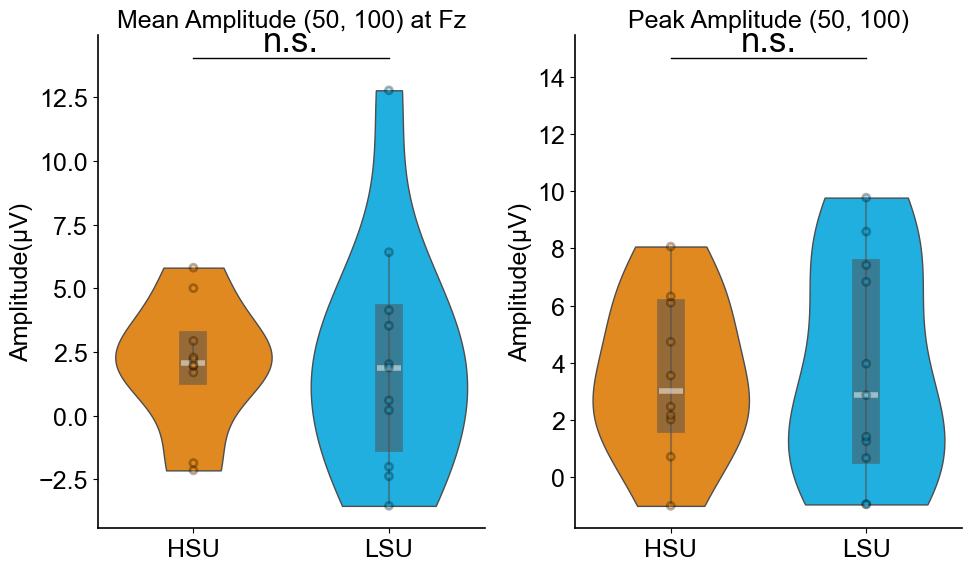

In [126]:
usage_groups_sn_aligned_sn = {key: dict() for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in  SN_devi_eps_evoked_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_sn[group_name][sub] = evoked
            break

usage_groups_sn_aligned_sn
df_type = "Amplitude"
label=("HSU", "LSU")
time_window = ( 50,100)  # MMN typically 100-250ms
channels = [ 'Fz']  # Common MMN channels


# # Assign evokeds to the appropriate group
# for sub, evoked in usage_groups_SN_MMN_evokes.items():
#     for group_name, subject_list in usage_groups.items():
        
#             usage_groups_sn_aligned_sn[group_name][sub] = evoked

HSU_amps_peak = np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['high sub'],polarity="positive",
                                                     time_window = ( .10,.250),channels=["Fz",'Cz',"FCz"]).values()))
LSU_amps_peak =np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['low sub'],polarity="positive",
                                                     time_window = ( .10,.2500),channels=["Fz",'Cz',"FCz"]).values()))

usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}

HSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['high sub']])
LSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['low sub']])

#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_mean.flatten()*1e+6, LSU_amps_mean.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_mean.shape[0], LSU_amps_mean.shape[0]]),

    })
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(HSU_amps_mean, LSU_amps_mean)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_peak.flatten()*1e+6, LSU_amps_peak.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_peak.shape[0], LSU_amps_peak.shape[0]]),

    })

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
 
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_ind(HSU_amps_peak, LSU_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

 Mean  Amplitude : t_stat [-0.39818206] with , p_value [0.69493479]
 Peak Amplitude : t_stat -0.3928586933634035 with , p_value 0.6987967089577949


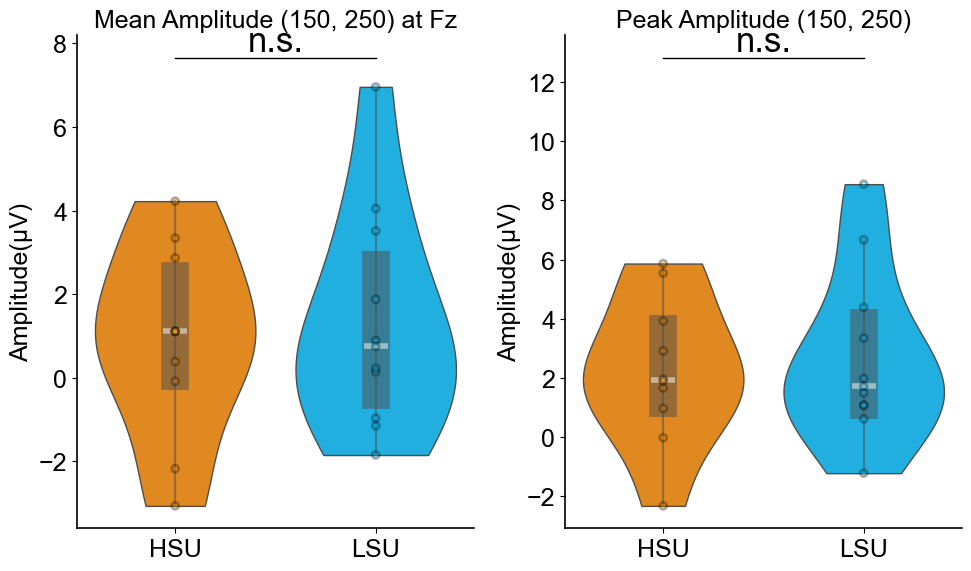

In [127]:
usage_groups_sn_aligned_sn = {key: dict() for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in   sn_STD_N1_aligned_SN_MMN_evokeds_dict_all.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_sn[group_name][sub] = evoked
            break

usage_groups_sn_aligned_sn
df_type = "Amplitude"
label=("HSU", "LSU")
time_window = ( 150,250)  # MMN typically 100-250ms
channels = [ 'Fz']  # Common MMN channels


# # Assign evokeds to the appropriate group
# for sub, evoked in usage_groups_SN_MMN_evokes.items():
#     for group_name, subject_list in usage_groups.items():
        
#             usage_groups_sn_aligned_sn[group_name][sub] = evoked

HSU_amps_peak = np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['high sub'],polarity="positive",
                                                     time_window = ( .150,.250),channels=["Fz"]).values()))
LSU_amps_peak =np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['low sub'],polarity="positive",
                                                     time_window = ( .150,.2500),channels=["Fz"]).values()))


HSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['high sub']])
LSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['low sub']])

#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_mean.flatten()*1e+6, LSU_amps_mean.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_mean.shape[0], LSU_amps_mean.shape[0]]),

    })
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(HSU_amps_mean, LSU_amps_mean)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_peak.flatten()*1e+6, LSU_amps_peak.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_peak.shape[0], LSU_amps_peak.shape[0]]),

    })

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
 
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_ind(HSU_amps_peak, LSU_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

# Adaptation

In [128]:

BN_std_quar_evoke_dict  = {}

SN_std_quar_evoke_dict = {}
time_len ={}
epoch_folder = r"E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched"
for sub in os.listdir(epoch_folder ):
    if (sub=="CAR"):
        continue
    print(sub)
    epochs = mne.read_epochs(os.path.join(epoch_folder,sub), preload=True)
    print("BN STD : ", len(epochs['S14']),"SN STD : ", len(epochs['S24']) )
    sn_N1_time= score_df[(score_df['sub_id']==sub[:-8])& (score_df['measure']=='n1')]['SN_PL_mean'].iloc[0]
    bn_N1_time = score_df[(score_df['sub_id']==sub[:-8])& (score_df['measure']=='n1')]['BN_PL_mean'].iloc[0]

    print(sn_N1_time,bn_N1_time)
    epochs_times = epochs.times
    # find nearest index
    nearest_bn_N1_time= epochs_times[np.argmin(np.abs(epochs_times - bn_N1_time))]
    nearest_sn_N1_time= epochs_times[np.argmin(np.abs(epochs_times - sn_N1_time))]

    sn_epochs = epochs['S24'].copy().shift_time(-nearest_sn_N1_time)  # shift time backward by 250 ms
    bn_epochs = epochs['S14'].copy().shift_time(-nearest_bn_N1_time)
    n_bn_epochs = len(bn_epochs)
    q_bn = n_bn_epochs // 4
    n_sn_epochs = len(sn_epochs)
    q_sn = n_sn_epochs // 4
    SN_std_quar_evoke_dict[sub[:-8]] = {}
    BN_std_quar_evoke_dict[sub[:-8]] = {}
    for i in range(4):
        quarter_epochs_bn = bn_epochs[i*q_bn:(i+1)*q_bn]
        quarter_epochs_sn = sn_epochs[i*q_sn:(i+1)*q_sn]
        BN_std_eps = quarter_epochs_bn['S14'].average()
        SN_std_eps = quarter_epochs_sn['S24'].average() 
        SN_std_quar_evoke_dict[sub[:-8]]['Q'+str(i+1)] = SN_std_eps.copy()
        BN_std_quar_evoke_dict[sub[:-8]]['Q'+str(i+1)] = BN_std_eps.copy()
    # SN_std_quar_evoke_dict[sub[:-8]] = {}
    # BN_std_quar_evoke_dict[sub[:-8]] = {}

    # SN_std_quar_evoke_dict[sub[:-8]]['Q1'] = sn_epochs[:25].average()
    # BN_std_quar_evoke_dict[sub[:-8]]['Q1'] = bn_epochs[:25].average()
    # SN_std_quar_evoke_dict[sub[:-8]]['Q4'] = sn_epochs[-25:].average()
    # BN_std_quar_evoke_dict[sub[:-8]]['Q4'] = bn_epochs[-25:].average()
    

sub-sd011-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd011-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1291 matching events found
No baseline correction applied
0 projection items activated
BN STD :  373 SN STD :  708
0.21876953125 0.19850390625
sub-sd012-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd012-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1519 matching events found
No baseline correction applied
0 projection items activated
BN STD :  667 SN STD :  606
0.27197265625 0.2384140625
sub-sd013-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd013-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices availabl

N1 (N1 STD time align)
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


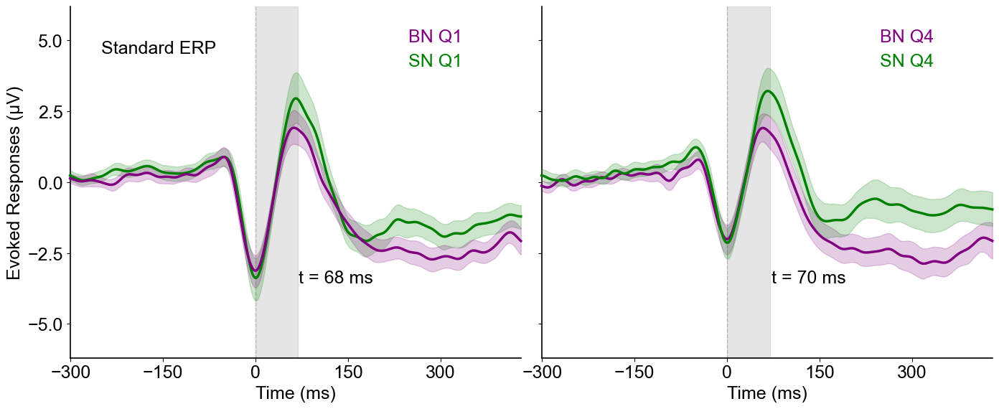

In [129]:
SN_std_quar_evoke_dict

mmn_subject = list(mmn_filtered_df.sub_id.unique())


stylesdict ={
             'SN Q1': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN Q1": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
text_labels = [
            (0.90, "BN Q1",'purple'),
            (0.83, f"SN Q1",'green'),
            ] 
time_range=(-.300,.4300)
print('N1 (N1 STD time align)')
fig, axs = plt.subplots(1,2, figsize=(14,6), dpi=100,sharey=True,sharex=True)

N1_evokeds_sn_bn_q1 = { 
           'SN Q1':[SN_std_quar_evoke_dict[sub]["Q1"] for sub in  SN_std_quar_evoke_dict if sub in mmn_subject] ,
           'BN Q1':[BN_std_quar_evoke_dict[sub]["Q1"] for sub in  BN_std_quar_evoke_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q1:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q1[cond]]
        evokeds_subset[cond]  =evoked_crop 

plot_erps(N1_evokeds_sn_bn_q1, picks=['Fz',"Cz",'FCz'],
       stylesdict=stylesdict,axs = axs[0],
                                   text_labels=text_labels,title=f"",time_range=time_range)
vline_time =68 # score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
axs[0].axvspan(0 , vline_time, color='gray', alpha=0.2)
# Add label under the vline
axs[0].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)
axs[0].text(-250,5,"Standard ERP", ha='left', va='top', fontsize=18, color='black')

stylesdict ={
             'SN Q4': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN Q4": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
text_labels = [
            (0.90, f"BN Q4",'purple'),
            (0.83, "SN Q4",'green'),
            ] 
N1_evokeds_sn_bn_q4 = { 
           'BN Q4':[ BN_std_quar_evoke_dict[sub]["Q4"] for sub in  BN_std_quar_evoke_dict if sub in mmn_subject] ,
           'SN Q4':[SN_std_quar_evoke_dict[sub]["Q4"] for sub in  SN_std_quar_evoke_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q4:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q4[cond]]
        evokeds_subset[cond]  =evoked_crop 
plot_erps(N1_evokeds_sn_bn_q4, picks=['Fz',"Cz",'FCz'],
       stylesdict=stylesdict,axs = axs[1],ylabel="",
                                   text_labels=text_labels,title=f"",time_range=time_range)
vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
# Add label under the vline
axs[1].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)

axs[1].axvspan(0 , vline_time, color='gray', alpha=0.2)

fig.patch.set_alpha(0)     # Make entire figure background transparent
     # Make axes background transparent
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))

In [130]:

target_time = 0.068  # 40 ms


# time_as_index returns a list, we take the first element (the start of the "slice")
BN_peak={"Q1":[], "Q4":[]}
Q1_peak = []
Q4_peak = []
for sub in  BN_std_quar_evoke_dict:
    if sub in mmn_subject:
        evoke = BN_std_quar_evoke_dict[sub]["Q1"].copy()
        time_index = evoke.time_as_index([target_time])
        
        peak = np.mean(evoke.get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
        Q1_peak.append(peak)

        evoke = BN_std_quar_evoke_dict[sub]["Q4"].copy()
        time_index = evoke.time_as_index([target_time])
        
        peak = np.mean(evoke.get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
        Q4_peak.append(peak)
BN_peak['Q1'] = Q1_peak
BN_peak['Q4'] = Q4_peak



# 2. Get the index of the closest time point in the evoked data
# time_as_index returns a list, we take the first element (the start of the "slice")
SN_peak={"Q1":[], "Q4":[]}
Q1_peak = []
Q4_peak = []
for sub in  SN_std_quar_evoke_dict:
    if sub in mmn_subject:
        evoke = SN_std_quar_evoke_dict[sub]["Q1"].copy()
        time_index = evoke.time_as_index([target_time])
        
        peak = np.mean(evoke.get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
        Q1_peak.append(peak)

        evoke = SN_std_quar_evoke_dict[sub]["Q4"].copy()
        time_index = evoke.time_as_index([target_time])
        
        peak = np.mean(evoke.get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
        Q4_peak.append(peak)
SN_peak['Q1'] = Q1_peak
SN_peak['Q4'] = Q4_peak

In [131]:
np.mean(SN_peak['Q1']) - np.mean(BN_peak['Q1'])

np.float64(1.0646217671465183e-06)

In [132]:
np.mean(SN_peak['Q4']) - np.mean(BN_peak['Q4'])
print("subjects peak then difference")
print("SN (Q1 - Q4)=  ", np.mean(SN_peak['Q1']) - np.mean(SN_peak['Q4']))
print("BN (Q1 - Q4)=  ",np.mean(BN_peak['Q1']) - np.mean(BN_peak['Q4']))


subjects peak then difference
SN (Q1 - Q4)=   -2.6361120893004334e-07
BN (Q1 - Q4)=   7.996179510993226e-08


In [133]:
N1_evokeds_sn_bn_q4 = { 
           'BN Q4':[ BN_std_quar_evoke_dict[sub]["Q4"] for sub in  BN_std_quar_evoke_dict if sub in mmn_subject] ,
           'SN Q4':[SN_std_quar_evoke_dict[sub]["Q4"] for sub in  SN_std_quar_evoke_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q4:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q4[cond]]
        evokeds_subset[cond]  =evoked_crop 
time_index = mne.grand_average(evokeds_subset["BN Q4"]).time_as_index([target_time])
BN_erp_q4_peak = np.mean(mne.grand_average(evokeds_subset["BN Q4"]).get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
SN_erp_q4_peak= np.mean(mne.grand_average(evokeds_subset["SN Q4"]).get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
N1_evokeds_sn_bn_q1 = { 
           'BN Q1':[ BN_std_quar_evoke_dict[sub]["Q1"] for sub in  BN_std_quar_evoke_dict if sub in mmn_subject] ,
           'SN Q1':[SN_std_quar_evoke_dict[sub]["Q1"] for sub in  SN_std_quar_evoke_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q1:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q1[cond]]
        evokeds_subset[cond]  =evoked_crop 
time_index = mne.grand_average(evokeds_subset["BN Q1"]).time_as_index([target_time])
BN_erp_q1_peak = np.mean(mne.grand_average(evokeds_subset["BN Q1"]).get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
SN_erp_q1_peak = np.mean(mne.grand_average(evokeds_subset["SN Q1"]).get_data(picks= ["Cz",'Fz','FCz']),axis=0)[time_index]
print("grand average peak then difference ")
print("SN (Q1 - Q4)", SN_erp_q1_peak - SN_erp_q4_peak)
print("BN (Q1 - Q4)", BN_erp_q1_peak - BN_erp_q4_peak)

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
grand average peak then difference 
SN (Q1 - Q4) [-2.63611209e-07]
BN (Q1 - Q4) [7.99617951e-08]


In [134]:
SN_erp_q4_peak

array([3.21852064e-06])

In [135]:

BN_erp_q1_peak

array([1.89028766e-06])

N1 (N1 STD time align)
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


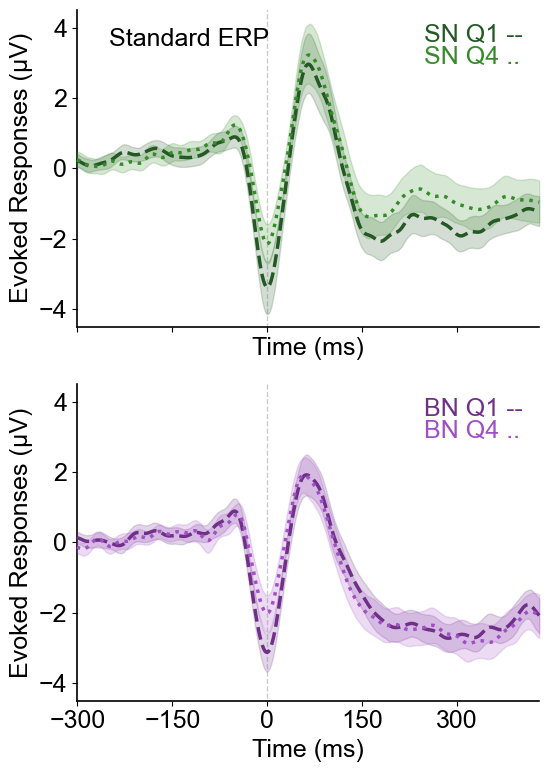

In [136]:
SN_std_quar_evoke_dict

mmn_subject = list(mmn_filtered_df.sub_id.unique())


stylesdict ={
             'SN Q1': {"linewidth": 2.5,"linestyle":'--','color': "#245824"},
             "SN Q4": {"linewidth": 2.5,"linestyle":':','color': "#358B29"},
             }
text_labels = [
            (0.90, "SN Q1 --", "#245824"),
            (0.83, f"SN Q4 ..", "#358B29"),
            ] 
time_range=(-.300,.4300)
print('N1 (N1 STD time align)')
fig, axs = plt.subplots(2,1, figsize=(6,8), dpi=100,sharey=True,sharex=True)

sn_q1_q4 = { 
           'SN Q1':[SN_std_quar_evoke_dict[sub]["Q1"] for sub in  SN_std_quar_evoke_dict if sub in mmn_subject] ,
           'SN Q4':[SN_std_quar_evoke_dict[sub]["Q4"] for sub in  SN_std_quar_evoke_dict if sub in mmn_subject] ,
                      }


plot_erps(sn_q1_q4, picks=['Fz',"Cz",'FCz'],
       stylesdict=stylesdict,axs = axs[0],
                                   text_labels=text_labels,title=f"",time_range=time_range)
vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
#axs[0].axvspan(0 , vline_time, color='gray', alpha=0.2)
# Add label under the vline
# axs[0].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
#     f"t = {vline_time:.0f} ms",  # convert seconds to ms
#     ha='left', va='top', fontsize=18, color='black'
#)
axs[0].text(-250,4,"Standard ERP", ha='left', va='top', fontsize=18, color='black')

stylesdict ={
             'BN Q1': {"linewidth": 2.5,"linestyle":'--','color': "#70308A"},
             "BN Q4": {"linewidth": 2.5,"linestyle":':','color': "#A14FC7"},
             }
text_labels = [
            (0.90, f"BN Q1 --","#70308A"),
            (0.83, "BN Q4 ..", "#A14FC7"),
            ] 
bn_q1_q4 = { 
           'BN Q1':[ BN_std_quar_evoke_dict[sub]["Q1"] for sub in  BN_std_quar_evoke_dict if sub in mmn_subject] ,
           'BN Q4':[BN_std_quar_evoke_dict[sub]["Q4"] for sub in  BN_std_quar_evoke_dict if sub in mmn_subject] ,
                      }
# evokeds_subset = {}
# for cond in bn_q1_q4:
#         evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in bn_q1_q4[cond]]
#         evokeds_subset[cond]  =evoked_crop 
plot_erps(bn_q1_q4, picks=['Fz',"Cz",'FCz'],ylim=(-4.5,4.5),
       stylesdict=stylesdict,axs = axs[1],
                                   text_labels=text_labels,title=f"",time_range=time_range)
# vline_time =score_df[score_df['measure']=='n1stdp2']['SN_PL_mean'].mean()*1000
# # Add label under the vline
# axs[1].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
#     f"t = {vline_time:.0f} ms",  # convert seconds to ms
#     ha='left', va='top', fontsize=18, color='black'
# )

# axs[1].axvspan(0 , vline_time, color='gray', alpha=0.2)

fig.patch.set_alpha(0)     
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))

Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


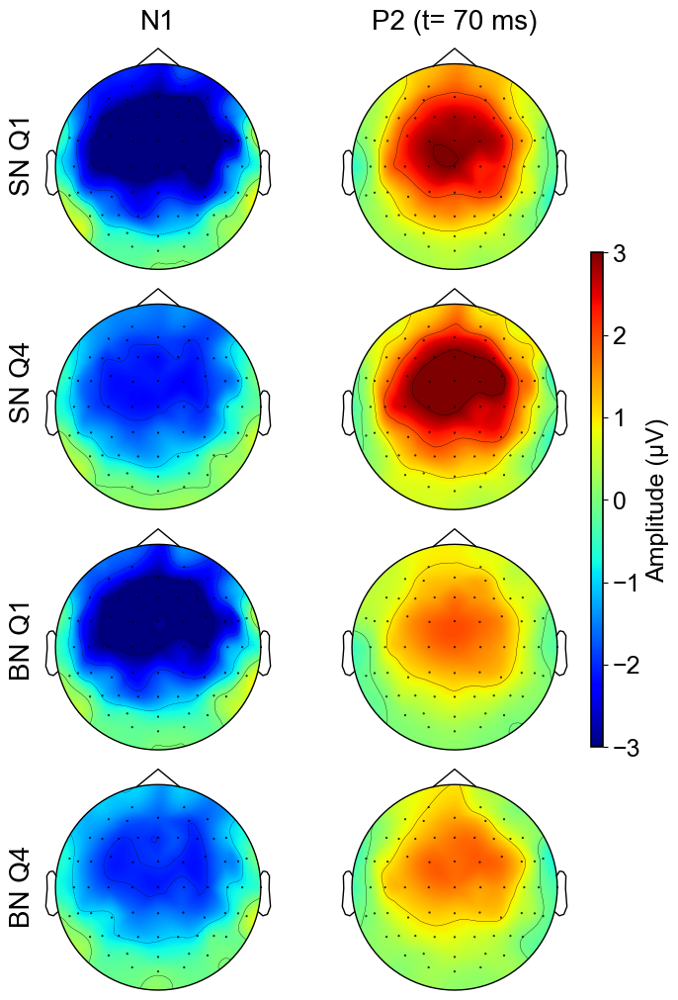

In [137]:

# TOPO MAP with all electrodes 
import matplotlib.pyplot as plt
import matplotlib as mpl
# Define time points
time_points = [0, 0.070]
erps = ["N1", "P2 (t= 70 ms)"]
# Set the color scale range
vlim = (-3,3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(4, len(time_points), figsize=(6, 10), constrained_layout=True)



evk_subset_sn_q1_q4 = {}
for cond in sn_q1_q4:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in sn_q1_q4[cond]]
        evk_subset_sn_q1_q4[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evk_subset_sn_q1_q4["SN Q1"]).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False,cmap='jet', vlim=vlim, show=False)
    axes[0, i].set_title(f"{erps[i]}",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evk_subset_sn_q1_q4["SN Q4"]).copy().plot_topomap(cmap='jet',
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False)
    axes[1, i].set_title(f"",fontsize=20)



evk_subset_bn_q1_q4 = {}
for cond in bn_q1_q4:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in bn_q1_q4[cond]]
        evk_subset_bn_q1_q4[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evk_subset_bn_q1_q4["BN Q1"]).copy().plot_topomap(
        times=[time], axes=axes[2, i], colorbar=False,cmap='jet', vlim=vlim, show=False)
    axes[2, i].set_title(f"",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evk_subset_bn_q1_q4["BN Q4"]).copy().plot_topomap(cmap='jet',
        times=[time], axes=axes[3, i], colorbar=False, vlim=vlim, show=False)
    axes[3, i].set_title(f"",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.25, 0.02, 0.5])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['jet']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.00001, 0.85, 'SN Q1', fontsize=20, rotation=90, va='center')
fig.text(0.00001, 0.62, 'SN Q4', fontsize=20, rotation=90, va='center')
fig.text(0.00001, 0.36, 'BN Q1', fontsize=20, rotation=90, va='center')
fig.text(0.0001, 0.11, 'BN Q4', fontsize=20, rotation=90, va='center')

plt.show()



combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


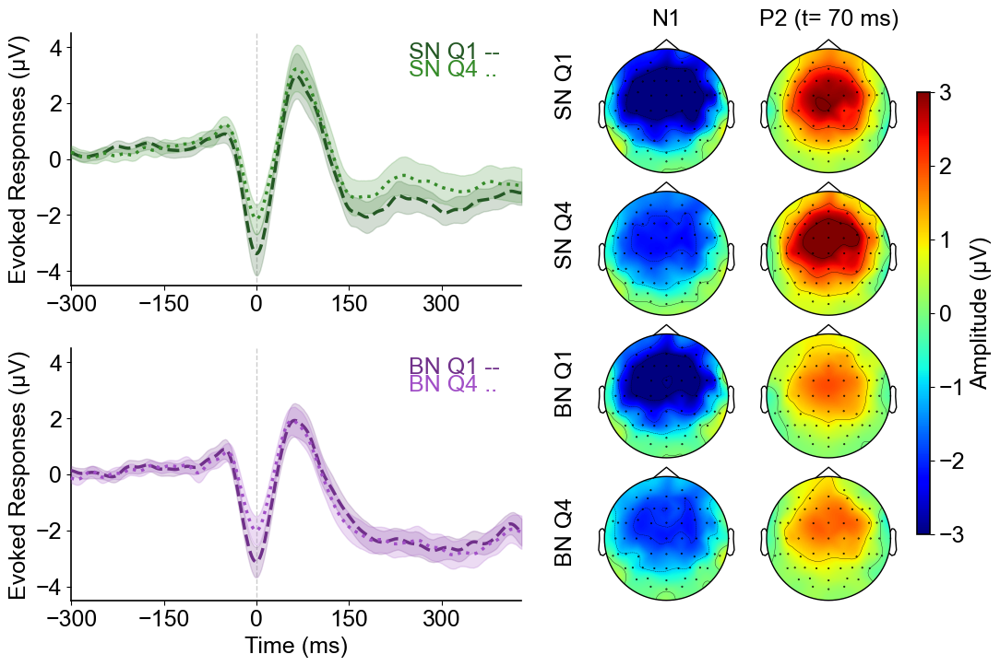

In [138]:
import numpy as np
import mne
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import matplotlib.ticker as ticker

# ---------------------------------------
# PREP DATA
# ---------------------------------------
mmn_subject = list(mmn_filtered_df.sub_id.unique())
time_range = (-0.300, 0.430)
erps = ["N1", "P2 (t= 70 ms)"]
sn_q1_q4 = {
    'SN Q1': [SN_std_quar_evoke_dict[sub]["Q1"] for sub in SN_std_quar_evoke_dict if sub in mmn_subject],
    'SN Q4': [SN_std_quar_evoke_dict[sub]["Q4"] for sub in SN_std_quar_evoke_dict if sub in mmn_subject],
}

bn_q1_q4 = {
    'BN Q1': [BN_std_quar_evoke_dict[sub]["Q1"] for sub in BN_std_quar_evoke_dict if sub in mmn_subject],
    'BN Q4': [BN_std_quar_evoke_dict[sub]["Q4"] for sub in BN_std_quar_evoke_dict if sub in mmn_subject],
}

# ---------------------------------------
# MASTER FIGURE LAYOUT
# ---------------------------------------
fig = plt.figure(figsize=(14, 8), dpi=100)

gs = gridspec.GridSpec( 2, 2, width_ratios=[1, 1.2],height_ratios=[1, 1],wspace=0.02,hspace=0.25 )

# LEFT COLUMN (ERPs)
ax_sn = fig.add_subplot(gs[0, 0])
ax_bn = fig.add_subplot(gs[1, 0])

# RIGHT COLUMN (Topos)
gs_topo = gridspec.GridSpecFromSubplotSpec(4, 2, subplot_spec=gs[:, 1], wspace=0, hspace=0.02 )

axes_topo = np.empty((4, 2), dtype=object)
for r in range(4):
    for c in range(2):
        axes_topo[r, c] = fig.add_subplot(gs_topo[r, c])

# ---------------------------------------
# ERP STYLES
# ---------------------------------------
styles_sn = {
    'SN Q1': dict(linewidth=2.5, linestyle='--', color="#245824"),
    'SN Q4': dict(linewidth=2.5, linestyle=':',  color="#358B29"),}

styles_bn = {
    'BN Q1': dict(linewidth=2.5, linestyle='--', color="#70308A"),
    'BN Q4': dict(linewidth=2.5, linestyle=':',  color="#A14FC7"),}

# ---------------------------------------
# PLOT ERPs (LEFT)
# ---------------------------------------
plot_erps( sn_q1_q4,picks=['Fz', 'Cz', 'FCz'],stylesdict=styles_sn,axs=ax_sn,ylim=(-4.5, 4.5),
    text_labels=[(0.90, "SN Q1 --", "#245824"), (0.83, "SN Q4 ..", "#358B29")],time_range=time_range)
ax_sn.set_xlabel("")

plot_erps( bn_q1_q4, picks=['Fz', 'Cz', 'FCz'],stylesdict=styles_bn, axs=ax_bn,ylim=(-4.5, 4.5),
    text_labels=[(0.90, "BN Q1 --", "#70308A"), (0.83, "BN Q4 ..", "#A14FC7")],time_range=time_range)

for ax in [ax_sn, ax_bn]:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    #ax.axvline(0, color='k', linestyle='--')

# ---------------------------------------
# TOPO MAPS (RIGHT)
# ---------------------------------------
time_points = [0.0, 0.070]
vlim = (-3, 3)

def crop_evokeds(evokeds):
    return [e.copy().crop(*time_range) for e in evokeds]

sn_crop = {k: crop_evokeds(v) for k, v in sn_q1_q4.items()}
bn_crop = {k: crop_evokeds(v) for k, v in bn_q1_q4.items()}

rows = [
    ("SN Q1", sn_crop),
    ("SN Q4", sn_crop),
    ("BN Q1", bn_crop),
    ("BN Q4", bn_crop),
]

for r, (label, src) in enumerate(rows):
    evk = mne.grand_average(src[label])
    for c, t in enumerate(time_points):
        evk.plot_topomap(
            times=[t],
            axes=axes_topo[r, c],
            cmap='jet',          # you asked for jet
            vlim=vlim,
            colorbar=False,
            show=False,
        )
        if r == 0:
            axes_topo[r, c].set_title(f"{erps[c]}", fontsize=18)
        else:
             axes_topo[r, c].set_title(f"", fontsize=14)

    fig.text(0.50, 0.81 - r*0.202, label, fontsize=18, rotation=90, va='center')
for r in range(4):
    left_ax  = axes_topo[r, 0].get_position()
    right_ax = axes_topo[r, 1].get_position()
    axes_topo[r, 1].set_position([
        left_ax.x1 + 0.01,
        right_ax.y0,
        right_ax.width,
        right_ax.height
    ])

# ---------------------------------------
# SHARED COLORBAR
# ---------------------------------------
cax = fig.add_axes([0.78, 0.2, 0.010, 0.6])
norm = mpl.colors.Normalize(*vlim)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='jet')
sm.set_array([])
fig.colorbar(sm, cax=cax, label='Amplitude (µV)')
fig.patch.set_alpha(0)
for ax in fig.get_axes():
    ax.set_facecolor('none')

plt.show()


## Adaptation Clustering test 

Shapes: (42, 360) (42, 360)
stat_fun(H1): min=2.905035602815196e-05 max=12.785546545846353
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/9999 [00:00<?,       ?it/s]

[(slice(23, 47, None),), (slice(52, 78, None),), (slice(103, 114, None),), (slice(137, 143, None),), (slice(177, 217, None),), (slice(251, 360, None),)] [0.3666 0.8578 0.9947 0.9997 0.432  0.0058]


(<Figure size 1000x800 with 3 Axes>,
 (<Axes: ylabel='uV'>,
  <Axes: ylabel='Difference'>,
  <Axes: title={'center': 'Cluster Permutation Test'}, xlabel='time (s)', ylabel='t-values'>))

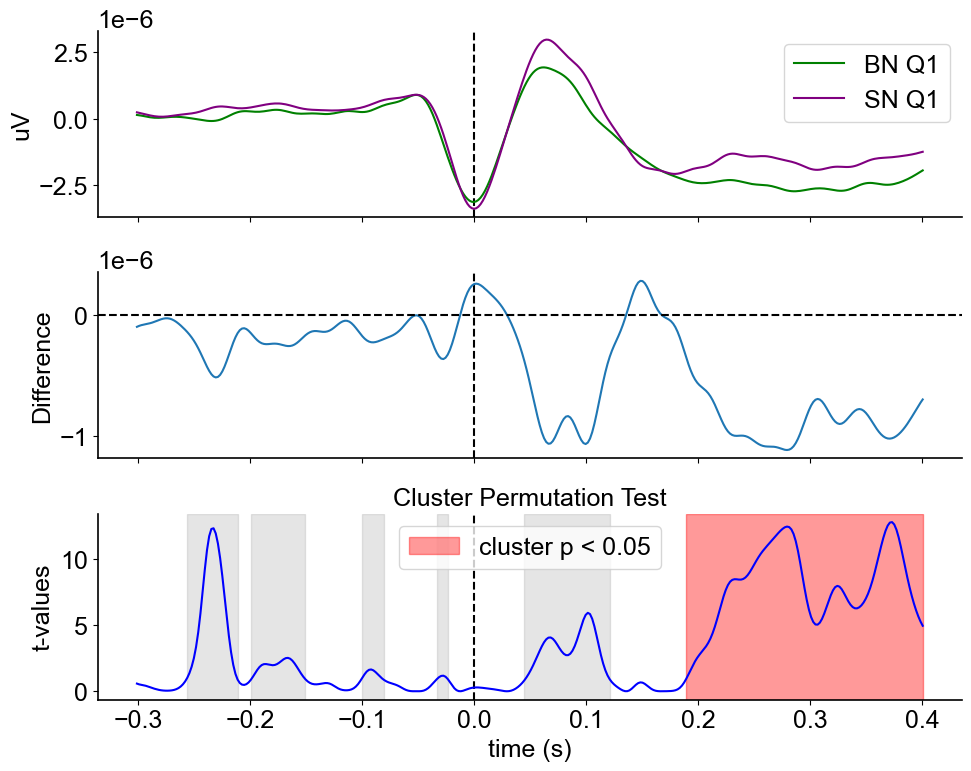

In [139]:
time_range= (-.300, .400)
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q1:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q1[cond]]
        evokeds_subset[cond]  =evoked_crop 
plot_mmn_cluster(
    evokeds_subset['BN Q1'],
    evokeds_subset['SN Q1'],
    picks=['Cz','Fz','FCz'],tail=1,thres=.8,labelc1="BN Q1", labelc2="SN Q1"
)

Shapes: (42, 360) (42, 360)
stat_fun(H1): min=0.0006567147067380013 max=13.958170587984426
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/9999 [00:00<?,       ?it/s]

[(slice(0, 10, None),), (slice(23, 34, None),), (slice(37, 48, None),), (slice(53, 66, None),), (slice(74, 145, None),), (slice(177, 360, None),)] [0.9374 0.9648 0.9774 0.8979 0.1677 0.001 ]


(<Figure size 1000x800 with 3 Axes>,
 (<Axes: ylabel='uV'>,
  <Axes: ylabel='Difference'>,
  <Axes: title={'center': 'Cluster Permutation Test'}, xlabel='time (s)', ylabel='t-values'>))

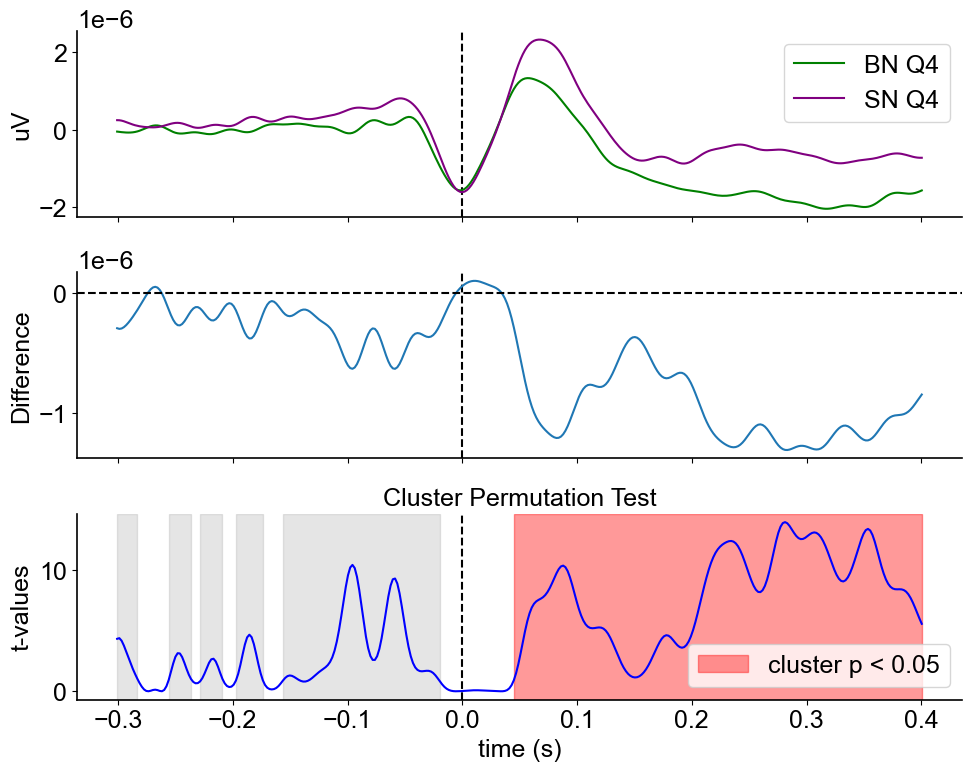

In [140]:
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q4:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q4[cond]]
        evokeds_subset[cond]  =evoked_crop 
plot_mmn_cluster(
    evokeds_subset['BN Q4'],
    evokeds_subset['SN Q4'],
    picks=['Cz','Pz','CPz'],tail=1,thres=.8,labelc1="BN Q4", labelc2="SN Q4"
)

## P2 (Cz, Fz, FCz) ;BN TWMA vs SN TWMA 

BN stats (TWMA)
 mean : 1.5117241168922984 std : 0.7989036425142868
SN stats(TWMA) 
 mean : 1.9871306653064036 std : 1.5557561565163296;std sum 0.04120354142116526
sub_id                                                         sub-sd011
measure                                                          n1stdp2
BN_PA_mean                                                       1.25774
BN_PA_std                                                       0.483493
SN_PA_mean                                                     -0.185699
SN_PA_std                                                        0.32907
BN_PL_mean                                                      0.108994
BN_PL_std                                                       0.011337
SN_PL_mean                                                      0.074808
SN_PL_std                                                       0.006901
BN_TWMA_mean                                                    0.169015
BN_TWMA_std                      

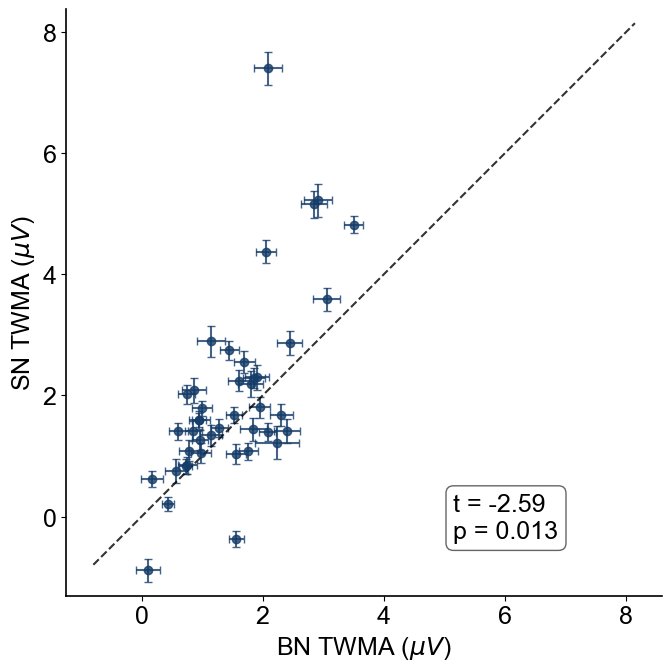

In [141]:
fig, axes = plt.subplots(1, 1, figsize=(7, 7))

plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })
# Filter P2
n1stdp2_filtered_df = filtered_df[(filtered_df['measure'] == 'n1stdp2') ] # remove the subject with vibration & (filtered_df['SN_PL_mean'] <0.4 )

n1stdp2_filtered_df.head()

plot_bn_vs_sn(n1stdp2_filtered_df, metric="TWMA", ax=axes,title="",stat_test ="t-test" ,col_id=None,default_color="#163D69",highlight_sig=True,
              highlight_sig_col="TWMA_significant",box_location=(.65,0.09))
#plot_bn_vs_sn(n1stdp2_filtered_df, metric="TWMA",  ax=axes[1],stat_test ="t-test" )

axes.xaxis.set_major_formatter('{x:.0f}')
axes.xaxis.set_major_locator(ticker.MaxNLocator(5))
axes.yaxis.set_major_locator(ticker.MaxNLocator(5))
axes.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

In [142]:
n1stdp2_filtered_df ["BN_PA_mean"].mean()
n1stdp2_filtered_df ["SN_PA_mean"].mean()

np.float64(3.584717622610743)

## N1 in Q1 vs Q4

In [143]:
import pandas as pd
#q1_q4_n1 = pd.read_csv("adaptation_scores_N1.csv", index_col=[0, 1, 2, 3])

q1_q4_n1 = pd.read_csv("adaptation_scores_N1_updated.csv", index_col=[0, 1, 2, 3])
q1_q4_n1.head()

PL        PA      TWMA  \
kind quarter subject           iteration                                 
sn   Q1      sub-sd011-epo.fif 0         -0.001973 -4.128150 -1.327712   
                               1         -0.001973 -5.117289 -0.999023   
                               2          0.005840 -5.326657 -1.533022   
                               3          0.001934 -4.075827 -1.443987   
                               4         -0.000020 -4.647843 -1.137492   

                                          FAL_0.25  
kind quarter subject           iteration            
sn   Q1      sub-sd011-epo.fif 0         -0.009785  
                               1         -0.009785  
                               2         -0.007832  
                               3         -0.007832  
                               4         -0.009785

In [144]:

q1_q4_n1 = q1_q4_n1.rename(
    index=lambda x: x.split('-epo')[0],
    level='subject'
)
q1_q4_n1.index.get_level_values('subject')

Index(['sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011',
       'sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011',
       ...
       'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067',
       'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067'],
      dtype='object', name='subject', length=220000)

In [145]:
mmn_subject
mask = q1_q4_n1.index.get_level_values('subject').isin(mmn_subject)
filtered_q1_q4_n1 = q1_q4_n1[mask]


In [146]:
mean_scores = filtered_q1_q4_n1.groupby(['kind', 'quarter','subject']).mean()
sem_scores = filtered_q1_q4_n1.groupby(['kind','quarter','subject']).std()
sn_mean_scores_q1 = mean_scores.loc[("sn", "Q1"), :]
sn_mean_scores_q4 = mean_scores.loc[("sn", "Q4"), :]
print('mean', sn_mean_scores_q1['TWMA'].mean(), sn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(sn_mean_scores_q1['TWMA'], sn_mean_scores_q4['TWMA']))
bn_mean_scores_q1 = mean_scores.loc[("bn", "Q1"), :]
bn_mean_scores_q4 = mean_scores.loc[("bn", "Q4"), :]
print("mean",bn_mean_scores_q1['TWMA'].mean(), bn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(bn_mean_scores_q1['TWMA'], bn_mean_scores_q4['TWMA']))
"""mean -2.0404498999864136 -1.6428738327115096
TtestResult(statistic=-4.7892838885795035, pvalue=2.20332722482024e-05, df=41)
mean -2.099446603077699 -1.4845659250575107
TtestResult(statistic=-5.9522841651642135, pvalue=5.058521826277821e-07, df=41)"""


mean -1.3556556018160275 -1.0496516188446907
TtestResult(statistic=np.float64(-4.534453097846831), pvalue=np.float64(4.94316157277553e-05), df=np.int64(41))
mean -1.1202813400342404 -0.8994029436533113
TtestResult(statistic=np.float64(-3.2866871548414154), pvalue=np.float64(0.00208354674728686), df=np.int64(41))


'mean -2.0404498999864136 -1.6428738327115096\nTtestResult(statistic=-4.7892838885795035, pvalue=2.20332722482024e-05, df=41)\nmean -2.099446603077699 -1.4845659250575107\nTtestResult(statistic=-5.9522841651642135, pvalue=5.058521826277821e-07, df=41)'

## P2 in Q1 vs Q4

In [147]:
import pandas as pd
q1_q4_p2 = pd.read_csv("adaptation_scores_p2.csv", index_col=[0, 1, 2, 3])
q1_q4_p2.head()

PL        PA      TWMA  \
kind quarter subject           iteration                                 
sn   Q1      sub-sd011-epo.fif 0          0.089824 -0.537251  0.973623   
                               1          0.097637 -0.586258  0.848374   
                               2          0.074199  0.254024  1.080277   
                               3          0.070293 -0.240770  1.007428   
                               4          0.066387 -0.105300  0.771616   

                                          FAL_0.25  
kind quarter subject           iteration            
sn   Q1      sub-sd011-epo.fif 0          0.046855  
                               1          0.046855  
                               2          0.050762  
                               3          0.056621  
                               4          0.044902

In [148]:

q1_q4_p2 = q1_q4_p2.rename(
    index=lambda x: x.split('-epo')[0],
    level='subject'
)
q1_q4_p2.index.get_level_values('subject')

Index(['sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011',
       'sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011', 'sub-sd011',
       ...
       'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067',
       'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067', 'sub-sd067'],
      dtype='object', name='subject', length=220000)

### Subject level significance 

In [149]:
mmn_subject
mask = q1_q4_p2.index.get_level_values('subject').isin(mmn_subject)
filtered_q1_q4_p2 = q1_q4_p2[mask]

In [150]:
bn_signi = dict()
for sub in filtered_q1_q4_p2.index.get_level_values('subject').unique():
    twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["TWMA"],
                               filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["TWMA"]) 
    twma_significance = True if twma_p_value < 0.05 else False
    #print(significance)
    bn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance}

    PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["PA"],
                               filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["PA"]) 
    PA_significance = True if PA_p_value < 0.05 else False
    #print(significance)
    bn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance, 
                     'PA_test':(PA_tstat,PA_p_value), "PA_significance": PA_significance}
bn_signi 

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4075000117.py:3: PerformanceWarning: indexing past lexsort depth may impact performance.
  twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["TWMA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4075000117.py:4: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["TWMA"])
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4075000117.py:9: PerformanceWarning: indexing past lexsort depth may impact performance.
  PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["PA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4075000117.py:10: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["PA"])


{'sub-sd011': {'twma_test': (np.float64(5.733521051518243),
   np.float64(1.7053621233299744e-08)),
  'twma_significance': True,
  'PA_test': (np.float64(53.09475631857503),
   np.float64(2.0118804562108743e-207)),
  'PA_significance': True},
 'sub-sd015': {'twma_test': (np.float64(31.004939431127887),
   np.float64(1.951349995336355e-118)),
  'twma_significance': True,
  'PA_test': (np.float64(25.565570004471038),
   np.float64(9.175321744919377e-93)),
  'PA_significance': True},
 'sub-sd016': {'twma_test': (np.float64(-35.08022701259101),
   np.float64(8.579771545520277e-137)),
  'twma_significance': True,
  'PA_test': (np.float64(-2.833695581668693),
   np.float64(0.004787685209608114)),
  'PA_significance': True},
 'sub-sd017': {'twma_test': (np.float64(-1.373025370636733),
   np.float64(0.170361128083824)),
  'twma_significance': False,
  'PA_test': (np.float64(-1.9907758607636705),
   np.float64(0.04705048672364992)),
  'PA_significance': True},
 'sub-sd021': {'twma_test': (np.fl

In [151]:

sn_signi = dict()
for sub in filtered_q1_q4_p2.index.get_level_values('subject').unique():
    twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_p2.loc[('sn',"Q4",f"{sub}"),:]["TWMA"],
                               filtered_q1_q4_p2.loc[('sn',"Q1",f"{sub}"),:]["TWMA"],) 
    twma_significance = True if twma_p_value < 0.05 else False
    #print(significance)
    sn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance}

    PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_p2.loc[('sn',"Q4",f"{sub}"),:]["PA"],
                               filtered_q1_q4_p2.loc[('sn',"Q1",f"{sub}"),:]["PA"],) 
    PA_significance = True if PA_p_value < 0.05 else False
    #print(significance)
    sn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance, 
                     'PA_test':(PA_tstat,PA_p_value), "PA_significance": PA_significance}
sn_signi    
     

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1589188090.py:3: PerformanceWarning: indexing past lexsort depth may impact performance.
  twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_p2.loc[('sn',"Q4",f"{sub}"),:]["TWMA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1589188090.py:4: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_p2.loc[('sn',"Q1",f"{sub}"),:]["TWMA"],)
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1589188090.py:9: PerformanceWarning: indexing past lexsort depth may impact performance.
  PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_p2.loc[('sn',"Q4",f"{sub}"),:]["PA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1589188090.py:10: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_p2.loc[('sn',"Q1",f"{sub}"),:]["PA"],)


{'sub-sd011': {'twma_test': (np.float64(-20.735507686458),
   np.float64(2.3968339178659556e-69)),
  'twma_significance': True,
  'PA_test': (np.float64(8.555168948822413),
   np.float64(1.455824312423176e-16)),
  'PA_significance': True},
 'sub-sd015': {'twma_test': (np.float64(22.676072172402105),
   np.float64(8.990827974572799e-79)),
  'twma_significance': True,
  'PA_test': (np.float64(32.65998090652889), np.float64(5.4160154285373e-126)),
  'PA_significance': True},
 'sub-sd016': {'twma_test': (np.float64(-14.230554470401588),
   np.float64(8.15073431985918e-39)),
  'twma_significance': True,
  'PA_test': (np.float64(-8.573118629791152),
   np.float64(1.2709619414522827e-16)),
  'PA_significance': True},
 'sub-sd017': {'twma_test': (np.float64(11.835960439714713),
   np.float64(1.1683776968935916e-28)),
  'twma_significance': True,
  'PA_test': (np.float64(0.6503230936715151), np.float64(0.5157828359047364)),
  'PA_significance': False},
 'sub-sd021': {'twma_test': (np.float64(-2

In [152]:

mean_scores = filtered_q1_q4_p2.groupby(['kind', 'quarter','subject']).mean()
sem_scores = filtered_q1_q4_p2.groupby(['kind','quarter','subject']).std()
sem_scores

PL        PA      TWMA  FAL_0.25
kind quarter subject                                          
bn   Q1      sub-sd011  0.015332  0.756062  0.358578  0.028976
             sub-sd015  0.006478  0.849895  0.182452  0.027346
             sub-sd016  0.012392  0.641274  0.253903  0.002302
             sub-sd017  0.012249  0.876680  0.340703  0.005034
             sub-sd021  0.006794  0.546052  0.202739  0.003895
...                          ...       ...       ...       ...
sn   Q4      sub-sd060  0.003135  0.733093  0.295054  0.002682
             sub-sd062  0.001713  0.716082  0.246428  0.001724
             sub-sd063  0.005599  0.895517  0.328858  0.002144
             sub-sd064  0.009561  0.710291  0.327770  0.002230
             sub-sd067  0.015228  0.981881  0.423427  0.002557

[336 rows x 4 columns]

In [153]:

sn_mean_scores_q1 = mean_scores.loc[("sn", "Q1"), :].reset_index()
sn_mean_scores_q4 = mean_scores.loc[("sn", "Q4"), :].reset_index()
sn_sem_scores_q1 = sem_scores.loc[("sn", "Q1"), :]
sn_sem_scores_q4 = sem_scores.loc[("sn", "Q4"), :]
print('mean', sn_mean_scores_q1['TWMA'].mean(), sn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(sn_mean_scores_q1['TWMA'], sn_mean_scores_q4['TWMA']))

mean 2.155632904937563 1.9352102267414697
TtestResult(statistic=np.float64(2.530349722291526), pvalue=np.float64(0.015330033609993217), df=np.int64(41))


In [154]:
bn_mean_scores_q1 = mean_scores.loc[("bn", "Q1"), :].reset_index()
bn_mean_scores_q4 = mean_scores.loc[("bn", "Q4"), :].reset_index()
bn_sem_scores_q1 = sem_scores.loc[("bn", "Q1"), :]
bn_sem_scores_q4 = sem_scores.loc[("bn", "Q4"), :]
print("mean",bn_mean_scores_q1['TWMA'].mean(), bn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(bn_mean_scores_q1['TWMA'], bn_mean_scores_q4['TWMA']))

mean 1.580905267882766 1.4290904922553744
TtestResult(statistic=np.float64(1.5497373928261189), pvalue=np.float64(0.12889003157603945), df=np.int64(41))


In [155]:


bn_mean_scores_q1["twma_significance"] = bn_mean_scores_q1["subject"].map(
    lambda x: bn_signi.get(x, {}).get("twma_significance", None)
)

sn_mean_scores_q1["twma_significance"] = sn_mean_scores_q1["subject"].map(
    lambda x: sn_signi.get(x, {}).get("twma_significance", None)
)

bn_mean_scores_q1["PA_significance"] = bn_mean_scores_q1["subject"].map(
    lambda x: bn_signi.get(x, {}).get("PA_significance", None)
)

sn_mean_scores_q1["PA_significance"] = sn_mean_scores_q1["subject"].map(
    lambda x: sn_signi.get(x, {}).get("PA_significance", None)
)


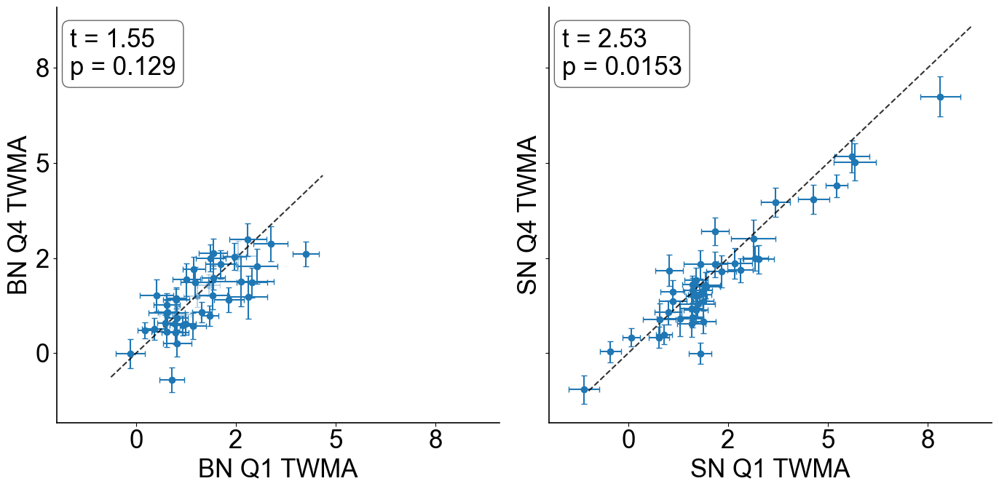

In [156]:

plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })

fig, ax = plt.subplots(1,2, figsize=( 14,7),sharey=True,sharex=True)

for x, y, xe, ye, sig in zip( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"],
                             bn_sem_scores_q1["TWMA"],bn_sem_scores_q4["TWMA"],
                             bn_mean_scores_q1["twma_significance"]):
    ax[0].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"])
#n_signi = len(bn_mean_scores_q1[bn_mean_scores_q1["twma_significance"]==True]["twma_significance"]),len(bn_mean_scores_q1["twma_significance"]) 
#bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}\nsign.={n_signi[0]}/{n_signi[1]}"

bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax[0].text(
        0.03, 0.95,bn_test_label,transform=ax[0].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )
lims = [min(bn_mean_scores_q1['TWMA'].min(),bn_mean_scores_q4['TWMA'].min())*0.9, max(bn_mean_scores_q1['TWMA'].max(), bn_mean_scores_q4['TWMA'].max())*1.1]
ax[0].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[0].set_xlabel(f"BN Q1 TWMA")
ax[0].set_ylabel(f"BN Q4 TWMA")

for x, y, xe, ye, sig in zip( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"],
                             sn_sem_scores_q1["TWMA"],sn_sem_scores_q4["TWMA"],
                             sn_mean_scores_q1["twma_significance"]):
    ax[1].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"])

sn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax[1].text(
        0.03, 0.95,sn_test_label,transform=ax[1].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )

lims = [min(sn_mean_scores_q1['TWMA'].min(),sn_mean_scores_q4['TWMA'].min())*0.9, max(sn_mean_scores_q1['TWMA'].max(), sn_mean_scores_q4['TWMA'].max())*1.1]
ax[1].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[1].set_xlabel(f"SN Q1 TWMA")
ax[1].set_ylabel(f"SN Q4 TWMA")
for axis in ax:
    axis.xaxis.set_major_formatter('{x:.0f}')
    axis.yaxis.set_major_formatter('{x:.0f}')
    axis.xaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.yaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

In [157]:
import numpy as np
sig_q1 = sn_mean_scores_q1["twma_significance"].to_numpy().astype(bool)
x = sn_mean_scores_q1["TWMA"].to_numpy()
y = sn_mean_scores_q4["TWMA"].to_numpy()

above_sig_q1 = np.sum((y > x) & sig_q1)
below_sig_q1 = np.sum((y < x) & sig_q1)
on_line_sig_q1 = np.sum(np.isclose(y, x) & sig_q1)

print(f"SN above x=y: {above_sig_q1}")
print(f"SN below x=y: {below_sig_q1}")
print(f"SN on x=y:    {on_line_sig_q1}")

sig_q1 = bn_mean_scores_q1["twma_significance"].to_numpy().astype(bool)
x = bn_mean_scores_q1["TWMA"].to_numpy()
y = bn_mean_scores_q4["TWMA"].to_numpy()

above_sig_q1 = np.sum((y > x) & sig_q1)
below_sig_q1 = np.sum((y < x) & sig_q1)
on_line_sig_q1 = np.sum(np.isclose(y, x) & sig_q1)

print(f"BN above x=y: {above_sig_q1}")
print(f"BN below x=y: {below_sig_q1}")
print(f"BN on x=y:    {on_line_sig_q1}")


SN above x=y: 15
SN below x=y: 27
SN on x=y:    0
BN above x=y: 19
BN below x=y: 19
BN on x=y:    0


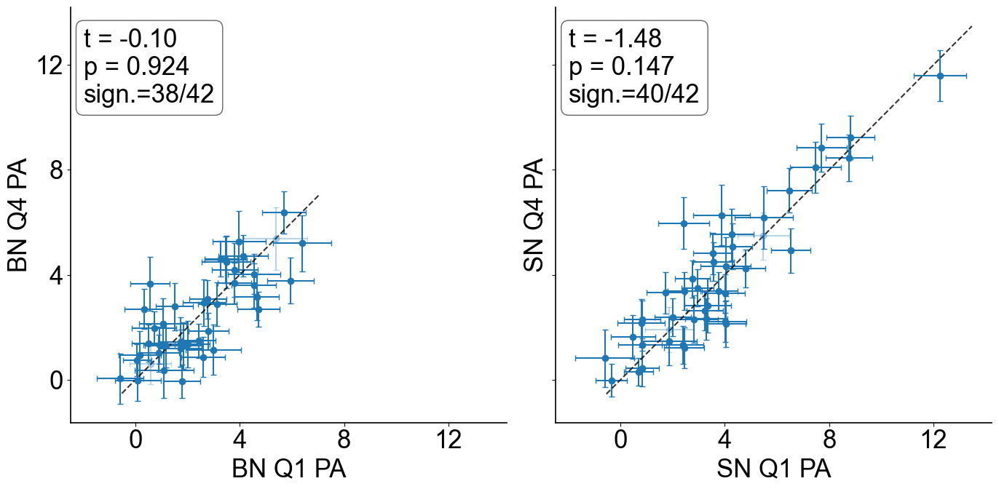

In [158]:


fig, ax = plt.subplots(1,2, figsize=( 14,7),sharey=True,sharex=True)

for x, y, xe, ye, sig in zip( bn_mean_scores_q1["PA"],bn_mean_scores_q4["PA"],
                             bn_sem_scores_q1["PA"],bn_sem_scores_q4["PA"],
                             bn_mean_scores_q1["PA_significance"]):
    ax[0].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( bn_mean_scores_q1["PA"],bn_mean_scores_q4["PA"])
n_signi = len(bn_mean_scores_q1[bn_mean_scores_q1["twma_significance"]==True]["twma_significance"]),len(bn_mean_scores_q1["twma_significance"]) 

bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}\nsign.={n_signi[0]}/{n_signi[1]}"
ax[0].text(
        0.03, 0.95,bn_test_label,transform=ax[0].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )
lims = [min(bn_mean_scores_q1['PA'].min(),bn_mean_scores_q4['PA'].min())*0.9, max(bn_mean_scores_q1['PA'].max(), bn_mean_scores_q4['PA'].max())*1.1]
ax[0].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[0].set_xlabel(f"BN Q1 PA")
ax[0].set_ylabel(f"BN Q4 PA")

for x, y, xe, ye, sig in zip( sn_mean_scores_q1["PA"],sn_mean_scores_q4["PA"],
                             sn_sem_scores_q1["PA"],sn_sem_scores_q4["PA"],
                             sn_mean_scores_q1["PA_significance"]):
    ax[1].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( sn_mean_scores_q1["PA"],sn_mean_scores_q4["PA"])
n_signi = len(sn_mean_scores_q1[sn_mean_scores_q1["PA_significance"]==True]["PA_significance"]),len(sn_mean_scores_q1["PA_significance"])

sn_test_label = f"t = {stat:.2f}\np = {pval:.3g}\nsign.={n_signi[0]}/{n_signi[1]}"

ax[1].text(
        0.03, 0.95,sn_test_label,transform=ax[1].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )
lims = [min(sn_mean_scores_q1['PA'].min(),sn_mean_scores_q4['PA'].min())*0.9, max(sn_mean_scores_q1['PA'].max(), sn_mean_scores_q4['PA'].max())*1.1]
ax[1].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[1].set_xlabel(f"SN Q1 PA")
ax[1].set_ylabel(f"SN Q4 PA")
for axis in ax:
    axis.xaxis.set_major_formatter('{x:.0f}')
    axis.yaxis.set_major_formatter('{x:.0f}')
    axis.xaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.yaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()


In [159]:
import numpy as np
sig_q1 = sn_mean_scores_q1["PA_significance"].to_numpy().astype(bool)
x = sn_mean_scores_q1["PA"].to_numpy()
y = sn_mean_scores_q4["PA"].to_numpy()

above_sig_q1 = np.sum((y > x) & sig_q1)
below_sig_q1 = np.sum((y < x) & sig_q1)
on_line_sig_q1 = np.sum(np.isclose(y, x) & sig_q1)

print(f"SN above x=y: {above_sig_q1}")
print(f"SN below x=y: {below_sig_q1}")
print(f"SN on x=y:    {on_line_sig_q1}")

sig_q1 = bn_mean_scores_q1["PA_significance"].to_numpy().astype(bool)
x = bn_mean_scores_q1["PA"].to_numpy()
y = bn_mean_scores_q4["PA"].to_numpy()

above_sig_q1 = np.sum((y > x) & sig_q1)
below_sig_q1 = np.sum((y < x) & sig_q1)
on_line_sig_q1 = np.sum(np.isclose(y, x) & sig_q1)

print(f"BN above x=y: {above_sig_q1}")
print(f"BN below x=y: {below_sig_q1}")
print(f"BN on x=y:    {on_line_sig_q1}")


SN above x=y: 23
SN below x=y: 17
SN on x=y:    0
BN above x=y: 21
BN below x=y: 19
BN on x=y:    0


### normalizeds Q1 and Q4 for BN vs SN

In [160]:

# extract values
q1_sn = sn_mean_scores_q1["TWMA"]
q4_sn = sn_mean_scores_q4["TWMA"]

# significance mask (Q1 only)
sig_sn = sn_mean_scores_q1["twma_significance"].astype(bool)

# normalized difference
sn_norm = (q4_sn - q1_sn) 

# keep only significant
sn_norm_sig = sn_norm[sig_sn]
q1_bn = bn_mean_scores_q1["TWMA"]
q4_bn = bn_mean_scores_q4["TWMA"]

sig_bn = bn_mean_scores_q1["twma_significance"].astype(bool)

bn_norm = (q4_bn - q1_bn) 
bn_norm_sig = bn_norm[sig_bn]

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\3142930752.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


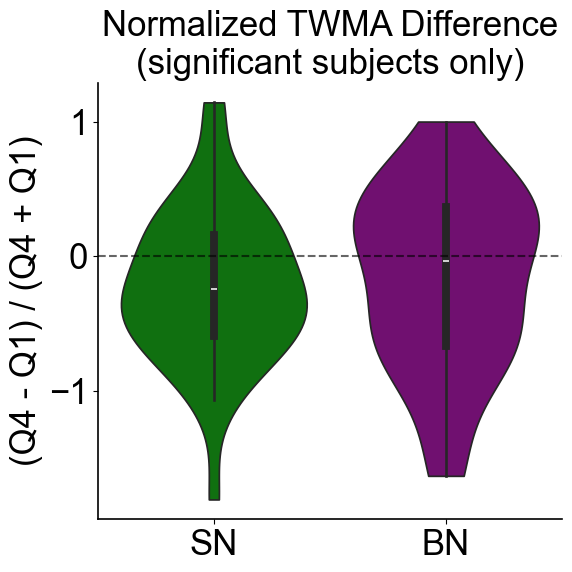

In [161]:

df_plot = pd.DataFrame({
    "value": np.concatenate([sn_norm_sig, bn_norm_sig]),
    "group": (["SN"] * len(sn_norm_sig)) + (["BN"] * len(bn_norm_sig))
})
plt.figure(figsize=(6, 6))

sns.violinplot(
    data=df_plot,
    x="group",
    y="value",
    order=["SN", "BN"],
    palette={"SN": "green", "BN": "purple"},
    inner="box",
    cut=0
)

plt.axhline(0, color="k", linestyle="--", alpha=0.6)
plt.ylabel(r"(Q4 - Q1) / (Q4 + Q1)")
plt.xlabel("")
plt.title("Normalized TWMA Difference\n(significant subjects only)")

plt.tight_layout()
plt.show()


C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2479065225.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


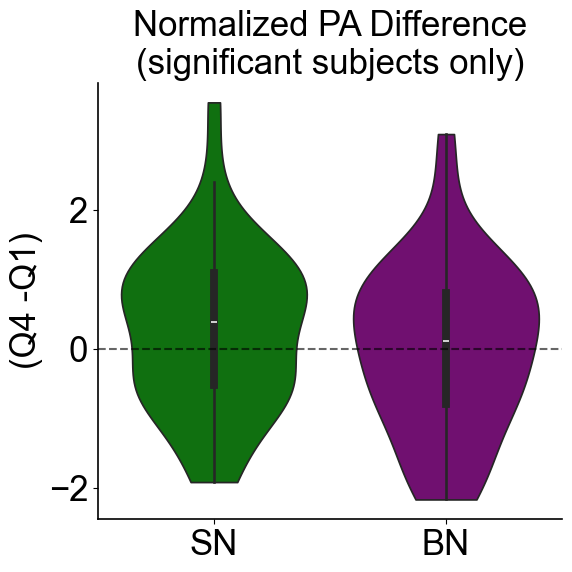

In [162]:

# extract values
q1_sn = sn_mean_scores_q1["PA"]
q4_sn = sn_mean_scores_q4["PA"]

# significance mask (Q1 only)
sig_sn = sn_mean_scores_q1["PA_significance"].astype(bool)

# normalized difference
sn_norm = (q4_sn - q1_sn) 

# keep only significant
sn_norm_sig = sn_norm[sig_sn]
q1_bn = bn_mean_scores_q1["PA"]
q4_bn = bn_mean_scores_q4["PA"]

sig_bn = bn_mean_scores_q1["PA_significance"].astype(bool)

bn_norm = (q4_bn - q1_bn) 
bn_norm_sig = bn_norm[sig_bn]
df_plot = pd.DataFrame({
    "value": np.concatenate([sn_norm_sig, bn_norm_sig]),
    "group": (["SN"] * len(sn_norm_sig)) + (["BN"] * len(bn_norm_sig))
})
plt.figure(figsize=(6, 6))

sns.violinplot(
    data=df_plot,
    x="group",
    y="value",
    order=["SN", "BN"],
    palette={"SN": "green", "BN": "purple"},
    inner="box",
    cut=0
)

plt.axhline(0, color="k", linestyle="--", alpha=0.6)
plt.ylabel(r"(Q4 -Q1)")
plt.xlabel("")
plt.title("Normalized PA Difference\n(significant subjects only)")

plt.tight_layout()
plt.show()


## DEV  Adaptation

In [163]:

BN_dev_quar_evoke_dict  = {}

SN_dev_quar_evoke_dict = {}
time_len ={}
epoch_folder = r"E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched"
for sub in os.listdir(epoch_folder ):
    if (sub=="CAR"):
        continue
    print(sub)
    epochs = mne.read_epochs(os.path.join(epoch_folder,sub), preload=True)
    print("BN dev : ", len(epochs['S14']),"SN dev : ", len(epochs['S24']) )
    sn_N1_time= score_df[(score_df['sub_id']==sub[:-8])& (score_df['measure']=='n1')]['SN_PL_mean'].iloc[0]
    bn_N1_time = score_df[(score_df['sub_id']==sub[:-8])& (score_df['measure']=='n1')]['BN_PL_mean'].iloc[0]

    print(sn_N1_time,bn_N1_time)
    epochs_times = epochs.times
    # find nearest index
    nearest_bn_N1_time= epochs_times[np.argmin(np.abs(epochs_times - bn_N1_time))]
    nearest_sn_N1_time= epochs_times[np.argmin(np.abs(epochs_times - sn_N1_time))]

    sn_epochs = epochs['S15'].copy().shift_time(-nearest_sn_N1_time)  # shift time backward by 100 ms
    bn_epochs = epochs['S25'].copy().shift_time(-nearest_bn_N1_time)
    n_bn_epochs = len(bn_epochs)
    q_bn = n_bn_epochs // 4
    n_sn_epochs = len(sn_epochs)
    q_sn = n_sn_epochs // 4
    SN_dev_quar_evoke_dict[sub[:-8]] = {}
    BN_dev_quar_evoke_dict[sub[:-8]] = {}
    for i in range(4):
        quarter_epochs_bn = bn_epochs[i*q_bn:(i+1)*q_bn]
        quarter_epochs_sn = sn_epochs[i*q_sn:(i+1)*q_sn]
        BN_dev_eps = quarter_epochs_bn['S25'].average()
        SN_dev_eps = quarter_epochs_sn['S15'].average() 
        SN_dev_quar_evoke_dict[sub[:-8]]['Q'+str(i+1)] = SN_dev_eps.copy()
        BN_dev_quar_evoke_dict[sub[:-8]]['Q'+str(i+1)] = BN_dev_eps.copy()

sub-sd011-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd011-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1291 matching events found
No baseline correction applied
0 projection items activated
BN dev :  373 SN dev :  708
0.21876953125 0.19850390625
sub-sd012-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd012-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices available
Not setting metadata
1519 matching events found
No baseline correction applied
0 projection items activated
BN dev :  667 SN dev :  606
0.27197265625 0.2384140625
sub-sd013-epo.fif
Reading E:\ecf-exp2-notif-mmn\data\Processed\preprocessed_epoched\sub-sd013-epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     900.39 ms
        0 CTF compensation matrices availabl

N1 (N1 dev time align)
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


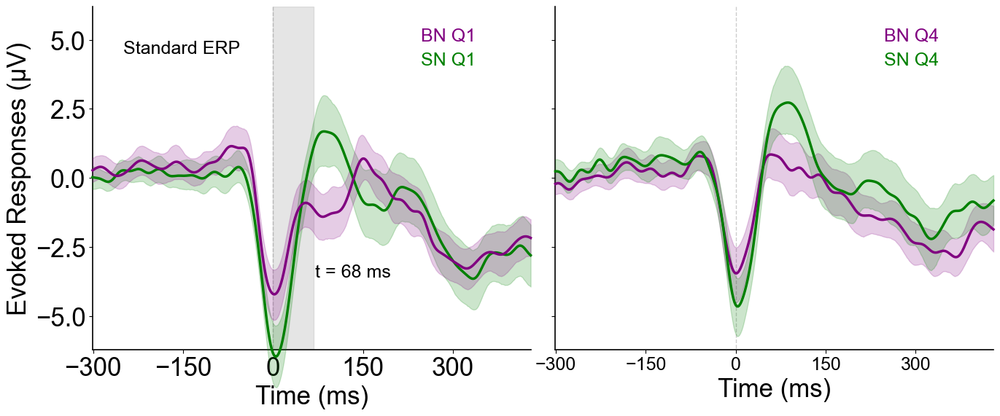

In [164]:
SN_dev_quar_evoke_dict

mmn_subject = list(mmn_filtered_df.sub_id.unique())


stylesdict ={
             'SN Q1': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN Q1": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
text_labels = [
            (0.90, "BN Q1",'purple'),
            (0.83, f"SN Q1",'green'),
            ] 
time_range=(-.300,.4300)
print('N1 (N1 dev time align)')
fig, axs = plt.subplots(1,2, figsize=(14,6), dpi=100,sharey=True,sharex=True)

N1_evokeds_sn_bn_q1 = { 
           'SN Q1':[SN_dev_quar_evoke_dict[sub]["Q1"] for sub in  SN_dev_quar_evoke_dict if sub in mmn_subject] ,
           'BN Q1':[BN_dev_quar_evoke_dict[sub]["Q1"] for sub in  BN_dev_quar_evoke_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q1:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q1[cond]]
        evokeds_subset[cond]  =evoked_crop 

plot_erps(N1_evokeds_sn_bn_q1, picks=['Fz',"Cz",'FCz'],
       stylesdict=stylesdict,axs = axs[0],
                                   text_labels=text_labels,title=f"",time_range=time_range)
vline_time =68 # score_df[score_df['measure']=='n1devp2']['SN_PL_mean'].mean()*1000
axs[0].axvspan(0 , vline_time, color='gray', alpha=0.2)
# Add label under the vline
axs[0].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)
axs[0].text(-250,5,"Standard ERP", ha='left', va='top', fontsize=18, color='black')

stylesdict ={
             'SN Q4': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             "BN Q4": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             }
text_labels = [
            (0.90, f"BN Q4",'purple'),
            (0.83, "SN Q4",'green'),
            ] 
N1_evokeds_sn_bn_q4 = { 
           'BN Q4':[ BN_dev_quar_evoke_dict[sub]["Q4"] for sub in  BN_dev_quar_evoke_dict if sub in mmn_subject] ,
           'SN Q4':[SN_dev_quar_evoke_dict[sub]["Q4"] for sub in  SN_dev_quar_evoke_dict if sub in mmn_subject] ,
                      }
evokeds_subset = {}
for cond in N1_evokeds_sn_bn_q4:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in N1_evokeds_sn_bn_q4[cond]]
        evokeds_subset[cond]  =evoked_crop 
plot_erps(N1_evokeds_sn_bn_q4, picks=['Fz',"Cz",'FCz'],
       stylesdict=stylesdict,axs = axs[1],ylabel="",
                                   text_labels=text_labels,title=f"",time_range=time_range)
vline_time =score_df[score_df['measure']=='n1devp2']['SN_PL_mean'].mean()*1000
# Add label under the vline
axs[1].text(vline_time+2, axs[0].get_ylim()[1] -0.75 * np.diff(axs[0].get_ylim()),
    f"t = {vline_time:.0f} ms",  # convert seconds to ms
    ha='left', va='top', fontsize=18, color='black'
)

axs[1].axvspan(0 , vline_time, color='gray', alpha=0.2)

fig.patch.set_alpha(0)     # Make entire figure background transparent
     # Make axes background transparent
for ax in axs:
    ax.xaxis.set_major_formatter('{x:.0f}')
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


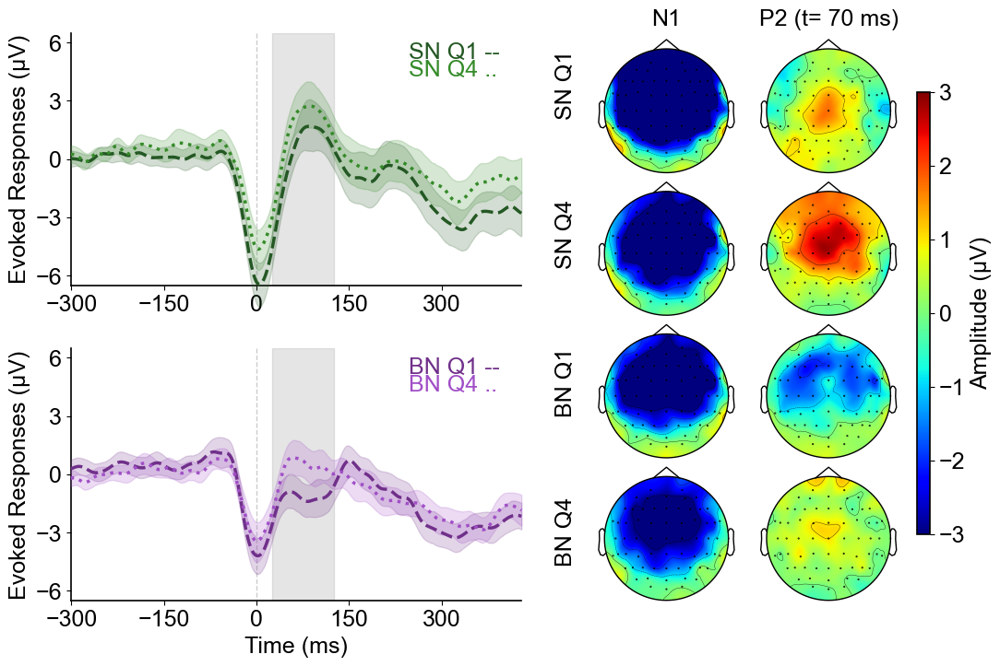

In [165]:
import numpy as np
import mne
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import matplotlib.ticker as ticker

# ---------------------------------------
# PREP DATA
# ---------------------------------------
mmn_subject = list(mmn_filtered_df.sub_id.unique())
time_range = (-0.300, 0.430)
erps = ["N1", "P2 (t= 70 ms)"]
sn_q1_q4 = {
    'SN Q1': [SN_dev_quar_evoke_dict[sub]["Q1"] for sub in SN_dev_quar_evoke_dict if sub in mmn_subject],
    'SN Q4': [SN_dev_quar_evoke_dict[sub]["Q4"] for sub in SN_dev_quar_evoke_dict if sub in mmn_subject],
}

bn_q1_q4 = {
    'BN Q1': [BN_dev_quar_evoke_dict[sub]["Q1"] for sub in BN_dev_quar_evoke_dict if sub in mmn_subject],
    'BN Q4': [BN_dev_quar_evoke_dict[sub]["Q4"] for sub in BN_dev_quar_evoke_dict if sub in mmn_subject],
}

# ---------------------------------------
# MASTER FIGURE LAYOUT
# ---------------------------------------
fig = plt.figure(figsize=(14, 8), dpi=100)

gs = gridspec.GridSpec( 2, 2, width_ratios=[1, 1.2],height_ratios=[1, 1],wspace=0.02,hspace=0.25 )

# LEFT COLUMN (ERPs)
ax_sn = fig.add_subplot(gs[0, 0])
ax_bn = fig.add_subplot(gs[1, 0])

# RIGHT COLUMN (Topos)
gs_topo = gridspec.GridSpecFromSubplotSpec(4, 2, subplot_spec=gs[:, 1], wspace=0, hspace=0.02 )

axes_topo = np.empty((4, 2), dtype=object)
for r in range(4):
    for c in range(2):
        axes_topo[r, c] = fig.add_subplot(gs_topo[r, c])

# ---------------------------------------
# ERP STYLES
# ---------------------------------------
styles_sn = {
    'SN Q1': dict(linewidth=2.5, linestyle='--', color="#245824"),
    'SN Q4': dict(linewidth=2.5, linestyle=':',  color="#358B29"),}

styles_bn = {
    'BN Q1': dict(linewidth=2.5, linestyle='--', color="#70308A"),
    'BN Q4': dict(linewidth=2.5, linestyle=':',  color="#A14FC7"),}

# ---------------------------------------
# PLOT ERPs (LEFT)
# ---------------------------------------
plot_erps( sn_q1_q4,picks=['Fz', 'Cz', 'FCz'],stylesdict=styles_sn,axs=ax_sn,ylim=(-6.5, 6.5),
    text_labels=[(0.90, "SN Q1 --", "#245824"), (0.83, "SN Q4 ..", "#358B29")],time_range=time_range)
ax_sn.set_xlabel("")

plot_erps( bn_q1_q4, picks=['Fz', 'Cz', 'FCz'],stylesdict=styles_bn, axs=ax_bn,ylim=(-6.5, 6.5),
    text_labels=[(0.90, "BN Q1 --", "#70308A"), (0.83, "BN Q4 ..", "#A14FC7")],time_range=time_range)

vline_time =125 
ax_sn.axvspan(25 , vline_time, color='gray', alpha=0.2)
ax_bn.axvspan(25 , vline_time, color='gray', alpha=0.2)
for ax in [ax_sn, ax_bn]:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    #ax.axvline(0, color='k', linestyle='--')

# ---------------------------------------
# TOPO MAPS (RIGHT)
# ---------------------------------------
time_points = [0.0, 0.070]
vlim = (-3, 3)

def crop_evokeds(evokeds):
    return [e.copy().crop(*time_range) for e in evokeds]

sn_crop = {k: crop_evokeds(v) for k, v in sn_q1_q4.items()}
bn_crop = {k: crop_evokeds(v) for k, v in bn_q1_q4.items()}

rows = [
    ("SN Q1", sn_crop),
    ("SN Q4", sn_crop),
    ("BN Q1", bn_crop),
    ("BN Q4", bn_crop),
]

for r, (label, src) in enumerate(rows):
    evk = mne.grand_average(src[label])
    for c, t in enumerate(time_points):
        evk.plot_topomap(
            times=[t],
            axes=axes_topo[r, c],
            cmap='jet',          # you asked for jet
            vlim=vlim,
            colorbar=False,
            show=False,
        )
        if r == 0:
            axes_topo[r, c].set_title(f"{erps[c]}", fontsize=18)
        else:
             axes_topo[r, c].set_title(f"", fontsize=14)

    fig.text(0.50, 0.81 - r*0.202, label, fontsize=18, rotation=90, va='center')
for r in range(4):
    left_ax  = axes_topo[r, 0].get_position()
    right_ax = axes_topo[r, 1].get_position()
    axes_topo[r, 1].set_position([
        left_ax.x1 + 0.01,
        right_ax.y0,
        right_ax.width,
        right_ax.height
    ])

# ---------------------------------------
# SHARED COLORBAR
# ---------------------------------------
cax = fig.add_axes([0.78, 0.2, 0.010, 0.6])
norm = mpl.colors.Normalize(*vlim)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='jet')
sm.set_array([])
fig.colorbar(sm, cax=cax, label='Amplitude (µV)')
fig.patch.set_alpha(0)
for ax in fig.get_axes():
    ax.set_facecolor('none')

plt.show()


### N1 Adotation in DEV 

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4291625109.py:13: PerformanceWarning: indexing past lexsort depth may impact performance.
  twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_n1_dev.loc[('bn',"Q4",f"{sub}"),:]["TWMA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4291625109.py:14: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_n1_dev.loc[('bn',"Q1",f"{sub}"),:]["TWMA"])
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4291625109.py:19: PerformanceWarning: indexing past lexsort depth may impact performance.
  PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_n1_dev.loc[('bn',"Q4",f"{sub}"),:]["PA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4291625109.py:20: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_n1_dev.loc[('bn',"Q1",f"{sub}"),:]["PA"])
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\4291625109.py:28: PerformanceWarning: indexing past lexsort depth may 

mean -2.905376878799161 -2.651475224645128
TtestResult(statistic=np.float64(-1.3073588388107469), pvalue=np.float64(0.19837524132889575), df=np.int64(41))
mean -2.1823973039939024 -2.1698597342775203
TtestResult(statistic=np.float64(-0.06694576123568387), pvalue=np.float64(0.9469502828531449), df=np.int64(41))


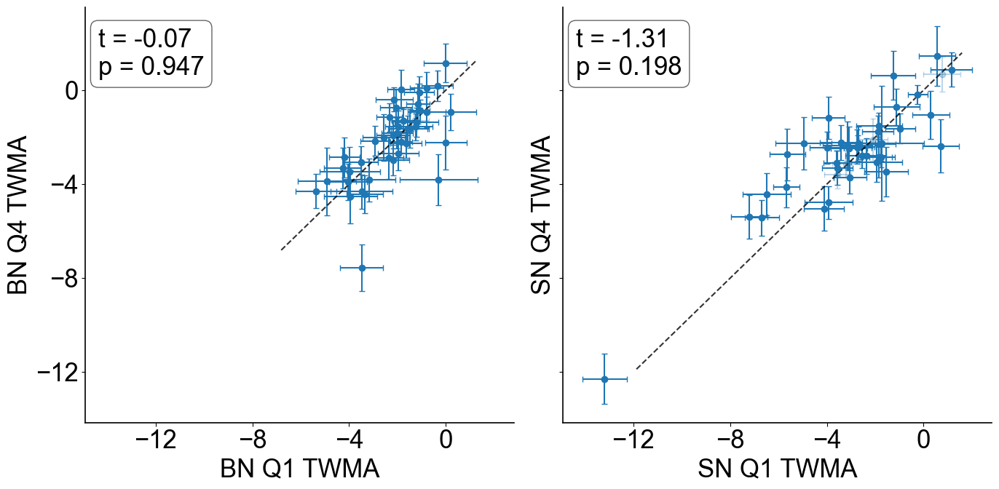

In [166]:

import pandas as pd
q1_q4_n1_dev = pd.read_csv("adaptation_scores_N1_dev.csv", index_col=[0, 1, 2, 3])
q1_q4_n1_dev.head()
q1_q4_n1_dev = q1_q4_n1_dev.rename(
    index=lambda x: x.split('-epo')[0],
    level='subject'
)
q1_q4_n1_dev.index.get_level_values('subject')
mask = q1_q4_n1_dev.index.get_level_values('subject').isin(mmn_subject)
filtered_q1_q4_n1_dev = q1_q4_n1_dev[mask]
bn_signi = dict()
for sub in filtered_q1_q4_n1_dev.index.get_level_values('subject').unique():
    twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_n1_dev.loc[('bn',"Q4",f"{sub}"),:]["TWMA"],
                               filtered_q1_q4_n1_dev.loc[('bn',"Q1",f"{sub}"),:]["TWMA"]) 
    twma_significance = True if twma_p_value < 0.05 else False
    #print(significance)
    bn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance}

    PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_n1_dev.loc[('bn',"Q4",f"{sub}"),:]["PA"],
                               filtered_q1_q4_n1_dev.loc[('bn',"Q1",f"{sub}"),:]["PA"]) 
    PA_significance = True if PA_p_value < 0.05 else False
    #print(significance)
    bn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance, 
                     'PA_test':(PA_tstat,PA_p_value), "PA_significance": PA_significance}
bn_signi 
sn_signi = dict()
for sub in filtered_q1_q4_n1_dev.index.get_level_values('subject').unique():
    twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_n1_dev.loc[('sn',"Q4",f"{sub}"),:]["TWMA"],
                               filtered_q1_q4_n1_dev.loc[('sn',"Q1",f"{sub}"),:]["TWMA"],) 
    twma_significance = True if twma_p_value < 0.05 else False
    #print(significance)
    sn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance}

    PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_n1_dev.loc[('sn',"Q4",f"{sub}"),:]["PA"],
                               filtered_q1_q4_n1_dev.loc[('sn',"Q1",f"{sub}"),:]["PA"],) 
    PA_significance = True if PA_p_value < 0.05 else False
    #print(significance)
    sn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance, 
                     'PA_test':(PA_tstat,PA_p_value), "PA_significance": PA_significance}
sn_signi    
     
mean_scores = filtered_q1_q4_n1_dev.groupby(['kind', 'quarter','subject']).mean()
sem_scores = filtered_q1_q4_n1_dev.groupby(['kind','quarter','subject']).std()
sem_scores
sn_mean_scores_q1 = mean_scores.loc[("sn", "Q1"), :].reset_index()
sn_mean_scores_q4 = mean_scores.loc[("sn", "Q4"), :]
sn_sem_scores_q1 = sem_scores.loc[("sn", "Q1"), :]
sn_sem_scores_q4 = sem_scores.loc[("sn", "Q4"), :]
print('mean', sn_mean_scores_q1['TWMA'].mean(), sn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(sn_mean_scores_q1['TWMA'], sn_mean_scores_q4['TWMA']))
bn_mean_scores_q1 = mean_scores.loc[("bn", "Q1"), :].reset_index()
bn_mean_scores_q4 = mean_scores.loc[("bn", "Q4"), :].reset_index()
bn_sem_scores_q1 = sem_scores.loc[("bn", "Q1"), :]
bn_sem_scores_q4 = sem_scores.loc[("bn", "Q4"), :]
print("mean",bn_mean_scores_q1['TWMA'].mean(), bn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(bn_mean_scores_q1['TWMA'], bn_mean_scores_q4['TWMA']))
bn_mean_scores_q1["twma_significance"] = bn_mean_scores_q1["subject"].map(
    lambda x: bn_signi.get(x, {}).get("twma_significance", None)
)

sn_mean_scores_q1["twma_significance"] = sn_mean_scores_q1["subject"].map(
    lambda x: sn_signi.get(x, {}).get("twma_significance", None)
)

bn_mean_scores_q1["PA_significance"] = bn_mean_scores_q1["subject"].map(
    lambda x: bn_signi.get(x, {}).get("PA_significance", None)
)

sn_mean_scores_q1["PA_significance"] = sn_mean_scores_q1["subject"].map(
    lambda x: sn_signi.get(x, {}).get("PA_significance", None)
)

plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })

fig, ax = plt.subplots(1,2, figsize=( 14,7),sharey=True,sharex=True)

for x, y, xe, ye, sig in zip( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"],
                             bn_sem_scores_q1["TWMA"],bn_sem_scores_q4["TWMA"],
                             bn_mean_scores_q1["twma_significance"]):
    ax[0].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"])
#n_signi = len(bn_mean_scores_q1[bn_mean_scores_q1["twma_significance"]==True]["twma_significance"]),len(bn_mean_scores_q1["twma_significance"]) 
#bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}\nsign.={n_signi[0]}/{n_signi[1]}"

bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax[0].text(
        0.03, 0.95,bn_test_label,transform=ax[0].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )
lims = [min(bn_mean_scores_q1['TWMA'].min(),bn_mean_scores_q4['TWMA'].min())*0.9, max(bn_mean_scores_q1['TWMA'].max(), bn_mean_scores_q4['TWMA'].max())*1.1]
ax[0].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[0].set_xlabel(f"BN Q1 TWMA")
ax[0].set_ylabel(f"BN Q4 TWMA")

for x, y, xe, ye, sig in zip( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"],
                             sn_sem_scores_q1["TWMA"],sn_sem_scores_q4["TWMA"],
                             sn_mean_scores_q1["twma_significance"]):
    ax[1].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"])

sn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax[1].text(
        0.03, 0.95,sn_test_label,transform=ax[1].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )

lims = [min(sn_mean_scores_q1['TWMA'].min(),sn_mean_scores_q4['TWMA'].min())*0.9, max(sn_mean_scores_q1['TWMA'].max(), sn_mean_scores_q4['TWMA'].max())*1.1]
ax[1].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[1].set_xlabel(f"SN Q1 TWMA")
ax[1].set_ylabel(f"SN Q4 TWMA")
for axis in ax:
    axis.xaxis.set_major_formatter('{x:.0f}')
    axis.yaxis.set_major_formatter('{x:.0f}')
    axis.xaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.yaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

### P2 Adotation in DEV

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2281264742.py:13: PerformanceWarning: indexing past lexsort depth may impact performance.
  twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["TWMA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2281264742.py:14: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["TWMA"])
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2281264742.py:19: PerformanceWarning: indexing past lexsort depth may impact performance.
  PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["PA"],
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2281264742.py:20: PerformanceWarning: indexing past lexsort depth may impact performance.
  filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["PA"])
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\2281264742.py:28: PerformanceWarning: indexing past lexsort depth may impact performan

mean 2.2817439989972153 2.356049726167481
TtestResult(statistic=np.float64(-0.33838664433720633), pvalue=np.float64(0.736798624115351), df=np.int64(41))
mean 0.3824779102981432 1.1751924533304323
TtestResult(statistic=np.float64(-4.491850347608618), pvalue=np.float64(5.652143486883489e-05), df=np.int64(41))


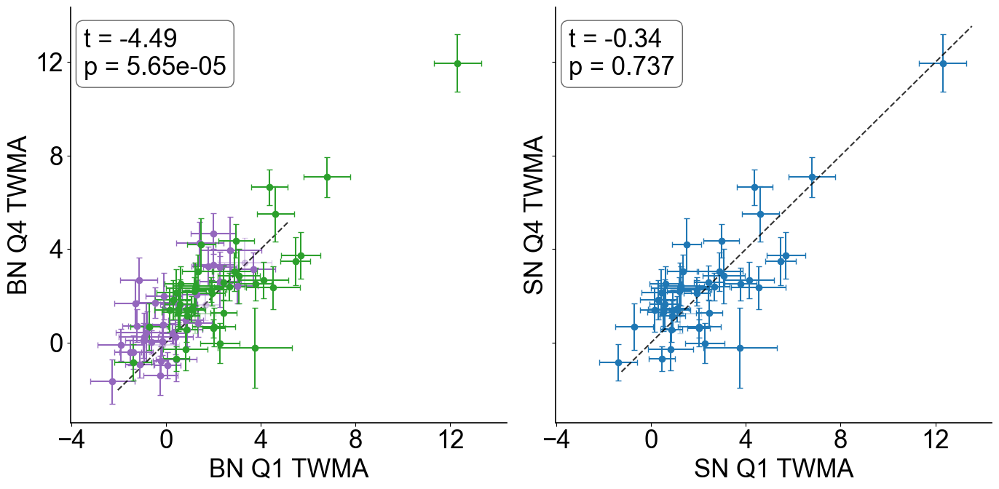

In [167]:

import pandas as pd
q1_q4_p2 = pd.read_csv("adaptation_scores_p2_dev.csv", index_col=[0, 1, 2, 3])
q1_q4_p2.head()
q1_q4_p2 = q1_q4_p2.rename(
    index=lambda x: x.split('-epo')[0],
    level='subject'
)
q1_q4_p2.index.get_level_values('subject')
mask = q1_q4_p2.index.get_level_values('subject').isin(mmn_subject)
filtered_q1_q4_p2 = q1_q4_p2[mask]
bn_signi = dict()
for sub in filtered_q1_q4_p2.index.get_level_values('subject').unique():
    twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["TWMA"],
                               filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["TWMA"]) 
    twma_significance = True if twma_p_value < 0.05 else False
    #print(significance)
    bn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance}

    PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_p2.loc[('bn',"Q4",f"{sub}"),:]["PA"],
                               filtered_q1_q4_p2.loc[('bn',"Q1",f"{sub}"),:]["PA"]) 
    PA_significance = True if PA_p_value < 0.05 else False
    #print(significance)
    bn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance, 
                     'PA_test':(PA_tstat,PA_p_value), "PA_significance": PA_significance}
bn_signi 
sn_signi = dict()
for sub in filtered_q1_q4_p2.index.get_level_values('subject').unique():
    twma_tstat, twma_p_value = ttest_rel(filtered_q1_q4_p2.loc[('sn',"Q4",f"{sub}"),:]["TWMA"],
                               filtered_q1_q4_p2.loc[('sn',"Q1",f"{sub}"),:]["TWMA"],) 
    twma_significance = True if twma_p_value < 0.05 else False
    #print(significance)
    sn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance}

    PA_tstat, PA_p_value = ttest_rel(filtered_q1_q4_p2.loc[('sn',"Q4",f"{sub}"),:]["PA"],
                               filtered_q1_q4_p2.loc[('sn',"Q1",f"{sub}"),:]["PA"],) 
    PA_significance = True if PA_p_value < 0.05 else False
    #print(significance)
    sn_signi[sub] = {'twma_test':(twma_tstat,twma_p_value), "twma_significance": twma_significance, 
                     'PA_test':(PA_tstat,PA_p_value), "PA_significance": PA_significance}
sn_signi    
     
mean_scores = filtered_q1_q4_p2.groupby(['kind', 'quarter','subject']).mean()
sem_scores = filtered_q1_q4_p2.groupby(['kind','quarter','subject']).std()
sem_scores
sn_mean_scores_q1 = mean_scores.loc[("sn", "Q1"), :].reset_index()
sn_mean_scores_q4 = mean_scores.loc[("sn", "Q4"), :]
sn_sem_scores_q1 = sem_scores.loc[("sn", "Q1"), :]
sn_sem_scores_q4 = sem_scores.loc[("sn", "Q4"), :]
print('mean', sn_mean_scores_q1['TWMA'].mean(), sn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(sn_mean_scores_q1['TWMA'], sn_mean_scores_q4['TWMA']))
bn_mean_scores_q1 = mean_scores.loc[("bn", "Q1"), :].reset_index()
bn_mean_scores_q4 = mean_scores.loc[("bn", "Q4"), :].reset_index()
bn_sem_scores_q1 = sem_scores.loc[("bn", "Q1"), :]
bn_sem_scores_q4 = sem_scores.loc[("bn", "Q4"), :]
print("mean",bn_mean_scores_q1['TWMA'].mean(), bn_mean_scores_q4['TWMA'].mean())
print(ttest_rel(bn_mean_scores_q1['TWMA'], bn_mean_scores_q4['TWMA']))
bn_mean_scores_q1["twma_significance"] = bn_mean_scores_q1["subject"].map(
    lambda x: bn_signi.get(x, {}).get("twma_significance", None)
)

sn_mean_scores_q1["twma_significance"] = sn_mean_scores_q1["subject"].map(
    lambda x: sn_signi.get(x, {}).get("twma_significance", None)
)

bn_mean_scores_q1["PA_significance"] = bn_mean_scores_q1["subject"].map(
    lambda x: bn_signi.get(x, {}).get("PA_significance", None)
)

sn_mean_scores_q1["PA_significance"] = sn_mean_scores_q1["subject"].map(
    lambda x: sn_signi.get(x, {}).get("PA_significance", None)
)

plt.rcParams.update({
        'xtick.labelsize': 25,
        'ytick.labelsize': 25,
        'axes.labelsize': 25,
        'axes.titlesize': 25,
        'legend.fontsize': 25,
    })

fig, ax = plt.subplots(1,2, figsize=( 14,7),sharey=True,sharex=True)

for x, y, xe, ye, sig in zip( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"],
                             bn_sem_scores_q1["TWMA"],bn_sem_scores_q4["TWMA"],
                             bn_mean_scores_q1["twma_significance"]):
    ax[0].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:purple",
        ecolor="tab:purple",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"])
#n_signi = len(bn_mean_scores_q1[bn_mean_scores_q1["twma_significance"]==True]["twma_significance"]),len(bn_mean_scores_q1["twma_significance"]) 
#bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}\nsign.={n_signi[0]}/{n_signi[1]}"

bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax[0].text(
        0.03, 0.95,bn_test_label,transform=ax[0].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )
lims = [min(bn_mean_scores_q1['TWMA'].min(),bn_mean_scores_q4['TWMA'].min())*0.9, max(bn_mean_scores_q1['TWMA'].max(), bn_mean_scores_q4['TWMA'].max())*1.1]
ax[0].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[0].set_xlabel(f"BN Q1 TWMA")
ax[0].set_ylabel(f"BN Q4 TWMA")

for x, y, xe, ye, sig in zip( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"],
                             sn_sem_scores_q1["TWMA"],sn_sem_scores_q4["TWMA"],
                             sn_mean_scores_q1["twma_significance"]):
    ax[0].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:green",
        ecolor="tab:green",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"])


for x, y, xe, ye, sig in zip( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"],
                             sn_sem_scores_q1["TWMA"],sn_sem_scores_q4["TWMA"],
                             sn_mean_scores_q1["twma_significance"]):
    ax[1].errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"])

sn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax[1].text(
        0.03, 0.95,sn_test_label,transform=ax[1].transAxes,
        ha="left", va="top",fontsize=25, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )

lims = [min(sn_mean_scores_q1['TWMA'].min(),sn_mean_scores_q4['TWMA'].min())*0.9, max(sn_mean_scores_q1['TWMA'].max(), sn_mean_scores_q4['TWMA'].max())*1.1]
ax[1].plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax[1].set_xlabel(f"SN Q1 TWMA")
ax[1].set_ylabel(f"SN Q4 TWMA")
for axis in ax:
    axis.xaxis.set_major_formatter('{x:.0f}')
    axis.yaxis.set_major_formatter('{x:.0f}')
    axis.xaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.yaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.patch.set_alpha(0)
fig.patch.set_alpha(0)
plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1298394909.py:193: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


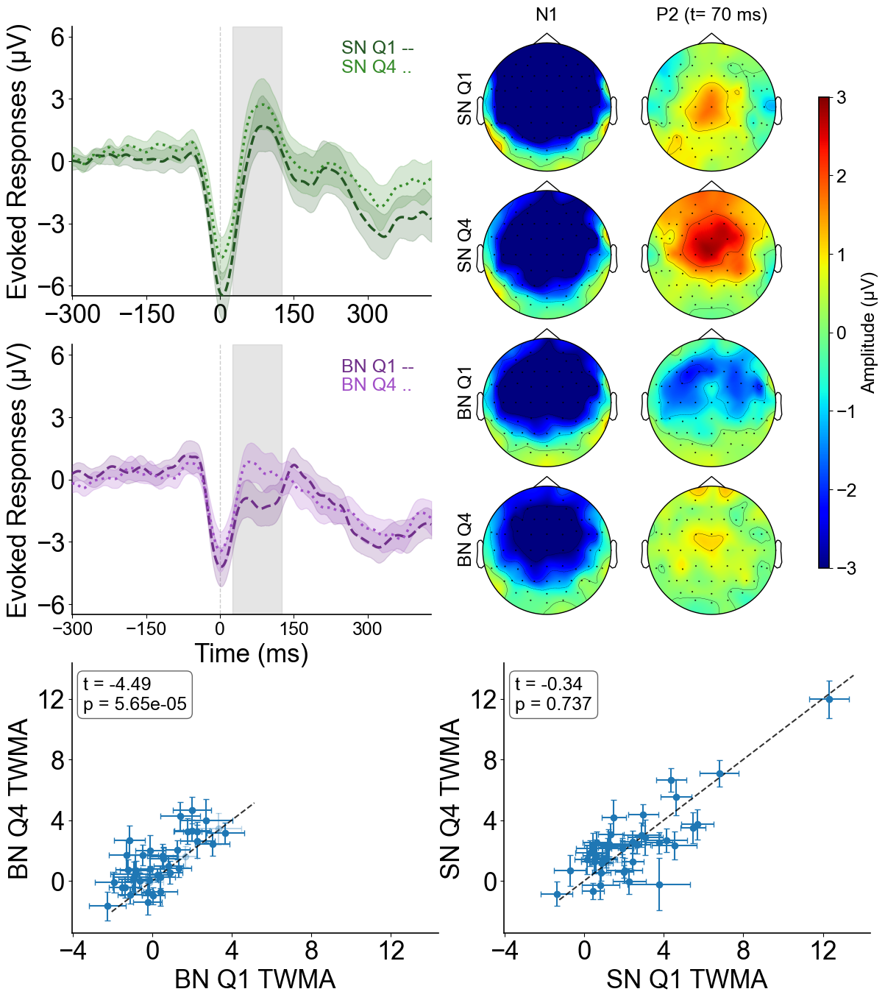

In [168]:
import numpy as np
import mne
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import matplotlib.ticker as ticker

# ---------------------------------------
# PREP DATA
# ---------------------------------------
mmn_subject = list(mmn_filtered_df.sub_id.unique())
time_range = (-0.300, 0.430)
erps = ["N1", "P2 (t= 70 ms)"]
sn_q1_q4 = {
    'SN Q1': [SN_dev_quar_evoke_dict[sub]["Q1"] for sub in SN_dev_quar_evoke_dict if sub in mmn_subject],
    'SN Q4': [SN_dev_quar_evoke_dict[sub]["Q4"] for sub in SN_dev_quar_evoke_dict if sub in mmn_subject],
}

bn_q1_q4 = {
    'BN Q1': [BN_dev_quar_evoke_dict[sub]["Q1"] for sub in BN_dev_quar_evoke_dict if sub in mmn_subject],
    'BN Q4': [BN_dev_quar_evoke_dict[sub]["Q4"] for sub in BN_dev_quar_evoke_dict if sub in mmn_subject],
}

# ---------------------------------------
# MASTER FIGURE LAYOUT
# ---------------------------------------
fig = plt.figure(figsize=(14, 16), dpi=100)
gs = gridspec.GridSpec(3, 2,width_ratios=[1, 1.2],height_ratios=[1.4, 1.4, 1.4],  # bottom row for scatter
    wspace=0.02,hspace=0.18)
# LEFT COLUMN (ERPs)
ax_sn = fig.add_subplot(gs[0, 0])
ax_bn = fig.add_subplot(gs[1, 0],)

# RIGHT COLUMN (Topos)
gs_topo = gridspec.GridSpecFromSubplotSpec(4, 2, subplot_spec=gs[:2, 1], wspace=0, hspace=0.02 )

# ---------------------------------------
# BOTTOM ROW (SCATTER PLOTS)
# ---------------------------------------
gs_scatter = gridspec.GridSpecFromSubplotSpec(
    1, 2,
    subplot_spec=gs[2, :],  # span both columns
    wspace=0.18
)
 
ax_scatter_bn = fig.add_subplot(gs_scatter[0, 0])
ax_scatter_sn = fig.add_subplot(gs_scatter[0, 1],sharex=ax_scatter_bn,sharey=ax_scatter_bn)
axes_topo = np.empty((4, 2), dtype=object)
for r in range(4):
    for c in range(2):
        axes_topo[r, c] = fig.add_subplot(gs_topo[r, c])

# ---------------------------------------
# ERP STYLES
# ---------------------------------------
styles_sn = {
    'SN Q1': dict(linewidth=2.5, linestyle='--', color="#245824"),
    'SN Q4': dict(linewidth=2.5, linestyle=':',  color="#358B29"),}

styles_bn = {
    'BN Q1': dict(linewidth=2.5, linestyle='--', color="#70308A"),
    'BN Q4': dict(linewidth=2.5, linestyle=':',  color="#A14FC7"),}

# ---------------------------------------
# PLOT ERPs (LEFT)
# ---------------------------------------
plot_erps( sn_q1_q4,picks=['Fz', 'Cz', 'FCz'],stylesdict=styles_sn,axs=ax_sn,ylim=(-6.5, 6.5),
    text_labels=[(0.90, "SN Q1 --", "#245824"), (0.83, "SN Q4 ..", "#358B29")],time_range=time_range)
ax_sn.set_xlabel("")

plot_erps( bn_q1_q4, picks=['Fz', 'Cz', 'FCz'],stylesdict=styles_bn, axs=ax_bn,ylim=(-6.5, 6.5),
    text_labels=[(0.90, "BN Q1 --", "#70308A"), (0.83, "BN Q4 ..", "#A14FC7")],time_range=time_range)

vline_time = 125 
ax_sn.axvspan(25 , vline_time, color='gray', alpha=0.2)
ax_bn.axvspan(25 , vline_time, color='gray', alpha=0.2)
for ax in [ax_sn, ax_bn]:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(5))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(5))
    #ax.axvline(0, color='k', linestyle='--')

# ---------------------------------------
# TOPO MAPS (RIGHT)
# ---------------------------------------
time_points = [0.0, 0.070]
vlim = (-3, 3)

def crop_evokeds(evokeds):
    return [e.copy().crop(*time_range) for e in evokeds]

sn_crop = {k: crop_evokeds(v) for k, v in sn_q1_q4.items()}
bn_crop = {k: crop_evokeds(v) for k, v in bn_q1_q4.items()}

rows = [
    ("SN Q1", sn_crop),
    ("SN Q4", sn_crop),
    ("BN Q1", bn_crop),
    ("BN Q4", bn_crop),
]

for r, (label, src) in enumerate(rows):
    evk = mne.grand_average(src[label])
    for c, t in enumerate(time_points):
        evk.plot_topomap(
            times=[t],
            axes=axes_topo[r, c],
            cmap='jet',          # you asked for jet
            vlim=vlim,
            colorbar=False,
            show=False,
        )
        if r == 0:
            axes_topo[r, c].set_title(f"{erps[c]}", fontsize=18)
        else:
             axes_topo[r, c].set_title(f"", fontsize=14)

    fig.text(0.50, 0.82 - r*0.125, label, fontsize=18, rotation=90, va='center')
for r in range(4):
    left_ax  = axes_topo[r, 0].get_position()
    right_ax = axes_topo[r, 1].get_position()
    axes_topo[r, 1].set_position([
        left_ax.x1 + 0.01,
        right_ax.y0,
        right_ax.width,
        right_ax.height
    ])

# ---------------------------------------
# SHARED COLORBAR
# ---------------------------------------
cax = fig.add_axes([0.85, 0.42, 0.010, 0.4])
norm = mpl.colors.Normalize(*vlim)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='jet')
sm.set_array([])
fig.colorbar(sm, cax=cax, label='Amplitude (µV)')
for x, y, xe, ye, sig in zip( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"],
                             bn_sem_scores_q1["TWMA"],bn_sem_scores_q4["TWMA"],
                             bn_mean_scores_q1["twma_significance"]):
    ax_scatter_bn.errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( bn_mean_scores_q1["TWMA"],bn_mean_scores_q4["TWMA"])
#n_signi = len(bn_mean_scores_q1[bn_mean_scores_q1["twma_significance"]==True]["twma_significance"]),len(bn_mean_scores_q1["twma_significance"]) 
#bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}\nsign.={n_signi[0]}/{n_signi[1]}"

bn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax_scatter_bn.text(
         0.03, 0.95,bn_test_label,transform=ax_scatter_bn.transAxes,
        ha="left", va="top",fontsize=18, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )
lims = [min(bn_mean_scores_q1['TWMA'].min(),bn_mean_scores_q4['TWMA'].min())*0.9, max(bn_mean_scores_q1['TWMA'].max(), bn_mean_scores_q4['TWMA'].max())*1.1]
ax_scatter_bn.plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax_scatter_bn.set_xlabel(f"BN Q1 TWMA")
ax_scatter_bn.set_ylabel(f"BN Q4 TWMA")

for x, y, xe, ye, sig in zip( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"],
                             sn_sem_scores_q1["TWMA"],sn_sem_scores_q4["TWMA"],
                             sn_mean_scores_q1["twma_significance"]):
    ax_scatter_sn.errorbar(
        x, y,xerr=xe, yerr=ye,
        fmt="o",
        color="tab:blue",
        ecolor="tab:blue",
        alpha=1.0 if sig else 0.3,   # dark if significant, light if not
        elinewidth=1.5,capsize=3)
stat, pval = ttest_rel( sn_mean_scores_q1["TWMA"],sn_mean_scores_q4["TWMA"])

sn_test_label = f"t = {stat:.2f}\np = {pval:.3g}"
ax_scatter_sn.text(
         0.03, 0.95,sn_test_label,transform=ax_scatter_sn.transAxes,
        ha="left", va="top",fontsize=18, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6)
    )

lims = [min(sn_mean_scores_q1['TWMA'].min(),sn_mean_scores_q4['TWMA'].min())*0.9, max(sn_mean_scores_q1['TWMA'].max(), sn_mean_scores_q4['TWMA'].max())*1.1]
ax_scatter_sn.plot(lims, lims, "k--", alpha=0.8, label="x = y")
ax_scatter_sn.set_xlabel(f"SN Q1 TWMA")
ax_scatter_sn.set_ylabel(f"SN Q4 TWMA")

fig.patch.set_alpha(0)
for ax in fig.get_axes():
    ax.set_facecolor('none')
for axis in [ax_scatter_sn,ax_scatter_bn]:
    axis.xaxis.set_major_formatter('{x:.0f}')
    axis.yaxis.set_major_formatter('{x:.0f}')
    axis.xaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.yaxis.set_major_locator(ticker.MaxNLocator(5))
    axis.patch.set_alpha(0)

plt.tight_layout()
plt.show()

In [169]:
##

# Adatation final combined figure

C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1833812710.py:53: PerformanceWarning: indexing past lexsort depth may impact performance.
  q4 = df.loc[(kind, "Q4", sub), metric]
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1833812710.py:54: PerformanceWarning: indexing past lexsort depth may impact performance.
  q1 = df.loc[(kind, "Q1", sub), metric]
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1833812710.py:53: PerformanceWarning: indexing past lexsort depth may impact performance.
  q4 = df.loc[(kind, "Q4", sub), metric]
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1833812710.py:54: PerformanceWarning: indexing past lexsort depth may impact performance.
  q1 = df.loc[(kind, "Q1", sub), metric]
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1833812710.py:53: PerformanceWarning: indexing past lexsort depth may impact performance.
  q4 = df.loc[(kind, "Q4", sub), metric]
C:\Users\Prakash\AppData\Local\Temp\ipykernel_38712\1833812710.py:54: PerformanceWarn

[np.float64(-1.2474383898018184), np.float64(13.541382662777597)]
total sample 42
Count Q4 > Q1 (above identity line)  26
[np.float64(-2.0323065893185155), np.float64(5.137803580294909)]
total sample 42
Count Q4 > Q1 (above identity line)  32
[np.float64(-3.6102501888938487), np.float64(-0.11053154055522636)]
total sample 42
Count Q4 > Q1 (above identity line)  32
[np.float64(-2.7562614672048484), np.float64(-0.011616529638910534)]
total sample 42
Count Q4 > Q1 (above identity line)  31


<Axes: xlabel=' Q1 TWMA', ylabel=' Q4 TWMA'>

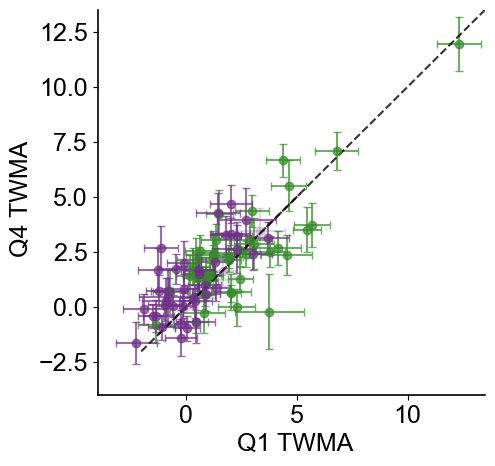

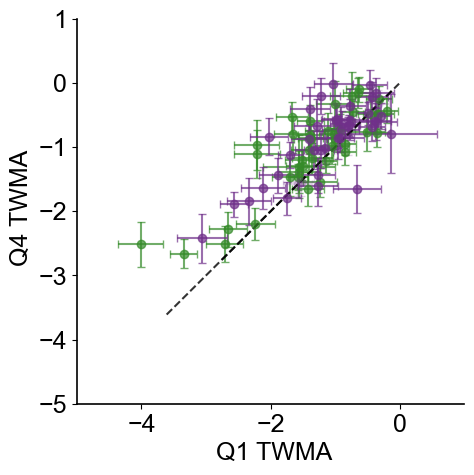

In [170]:
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel


def compute_q1_q4_stats(df,mmn_subjects,metrics=("TWMA", "PA"), alpha=0.05):
    """
    Compute Q1 vs Q4 paired statistics, means, SEMs, and significance flags.

    Parameters
    ----------
    df : pd.DataFrame
        MultiIndex DataFrame with index:
        ['kind', 'quarter', 'subject', ...]
    mmn_subjects : list
        List of subject IDs to keep
    metrics : tuple
        Metrics to analyze (e.g. ('TWMA', 'PA'))
    alpha : float
        Significance threshold

    Returns
    -------
    results : dict
        results[kind][metric] -> dict with:
            mean_q1, mean_q4,
            sem_q1, sem_q4,
            subject_tests,
            group_test
    """

    # ---- Clean subject names ----
    df = df.copy()
    df = df.rename(index=lambda x: x.split("-epo")[0], level="subject")

    # ---- Filter subjects ----
    mask = df.index.get_level_values("subject").isin(mmn_subjects)
    df = df[mask]

    results = {}

    # ---- Group means & SEM ----
    mean_scores = df.groupby(["kind", "quarter", "subject"]).mean()
    sem_scores  = df.groupby(["kind", "quarter", "subject"]).std()

    for kind in df.index.get_level_values("kind").unique():
        results[kind] = {}
        for metric in metrics:
            # ---- Subject-wise paired tests ----
            subject_tests = {}
            for sub in mean_scores.loc[kind].index.get_level_values("subject").unique():

                q4 = df.loc[(kind, "Q4", sub), metric]
                q1 = df.loc[(kind, "Q1", sub), metric]
                tval, pval = ttest_rel(q4, q1)

                subject_tests[sub] = {"t": tval,"p": pval,"significant": pval < alpha}

            # ---- Mean & SEM tables ----
            mean_q1 = mean_scores.loc[(kind, "Q1"), metric].reset_index()
            mean_q4 = mean_scores.loc[(kind, "Q4"), metric].reset_index()
            sem_q1  = sem_scores.loc[(kind, "Q1"), metric]
            sem_q4  = sem_scores.loc[(kind, "Q4"), metric]

            # ---- Attach significance flags ----
            mean_q1[f"{metric}_significance"] = mean_q1["subject"].map(lambda s: subject_tests[s]["significant"])

            # ---- Group-level paired test ----
            group_t, group_p = ttest_rel(mean_q4[metric],mean_q1[metric])

            results[kind][metric] = {"mean_q1": mean_q1,"mean_q4": mean_q4,"sem_q1": sem_q1,
                "sem_q4": sem_q4,"subject_tests": subject_tests,"group_test": (group_t, group_p)}

    return results



def plot_q1_q4_scatter(ax,mean_q1,mean_q4,sem_q1,sem_q4,significance,metric="TWMA",label_prefix="",color="tab:blue",
                       alpha_sig=.7,alpha_nonsig=0.2,show_identity=True,show_stats=True,fontsize=18,axlim = [-2.5,12.5]):
    """
    Plot Q1 vs Q4 scatter with error bars and paired t-test.

    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Axis to plot on.
    mean_q1, mean_q4 : pd.Series
        Mean values per subject for Q1 and Q4.
    sem_q1, sem_q4 : pd.Series
        SEM values per subject for Q1 and Q4.
    significance : pd.Series or list of bool
        Per-subject significance (True/False).
    metric : str
        Metric name (e.g. 'TWMA', 'PA').
    label_prefix : str
        Label prefix (e.g. 'SN', 'BN').
    color : str
        Color for points and error bars.
    """

    # ---- Scatter with error bars ----
    for x, y, xe, ye, sig in zip(
        mean_q1, mean_q4, sem_q1, sem_q4, significance):
        ax.errorbar(x, y,xerr=xe, yerr=ye,
            fmt="o",color=color,ecolor=color,
            alpha=alpha_sig if sig else alpha_nonsig,
            elinewidth=1.5,capsize=3)

    # ---- Identity line ----
    if show_identity:
        lims = [ min(mean_q1.min(), mean_q4.min()) * 0.9,max(mean_q1.max(), mean_q4.max()) * 1.1,]
        ax.plot(lims, lims, "k--", alpha=0.8)
        print(lims)
        ax.set_xlim(axlim)
        ax.set_ylim(axlim)

    # ---- Paired t-test ----
    if show_stats:
        stat, pval = ttest_rel(mean_q1, mean_q4)
        stat_text = f"t = {stat:.2f}\np = {pval:.3g}"
        ax.text(
            0.03, 0.95,
            stat_text,
            transform=ax.transAxes,
            ha="left", va="top",
            fontsize=fontsize,
            bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.6))

    # ---- Labels ----
    ax.set_xlabel(f"{label_prefix} Q1 {metric}", fontsize=fontsize)
    ax.set_ylabel(f"{label_prefix} Q4 {metric}", fontsize=fontsize)
    n_total = len(mean_q1)
    n_q4_gt_q1 = (mean_q4 > mean_q1).sum()
    print("total sample", n_total)
    print( "Count Q4 > Q1 (above identity line) ", n_q4_gt_q1)

    return ax

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib as mpl

def add_topo_colorbar_close(ax_topo, cmap, vlim, ticks=None, label="µV"):
    cax = inset_axes(
        ax_topo,
        width="6%",
        height="80%",
        loc="center right",
        bbox_to_anchor=(.02, 0, 1, 1),  # ⬅ SMALL value = closer
        bbox_transform=ax_topo.transAxes,
        borderpad=0
    )

    norm = mpl.colors.Normalize(*vlim)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

    cb = ax_topo.figure.colorbar(sm, cax=cax)
    cb.set_label(label, fontsize=10,labelpad= -15)
    cb.ax.tick_params(labelsize=9)

    if ticks is not None:
        cb.set_ticks(ticks)

    cax.set_facecolor("none")
    return cb


q1_q4_p2_dev = pd.read_csv("adaptation_scores_p2_dev.csv", index_col=[0, 1, 2, 3])
results_p2_dev = compute_q1_q4_stats(q1_q4_p2_dev,mmn_subjects=mmn_subject,metrics=("TWMA", "PA"))
sn_twma_p2_dev = results_p2_dev["sn"]["TWMA"]


q1_q4_n1_std = pd.read_csv("adaptation_scores_N1_updated.csv", index_col=[0, 1, 2, 3])
results_n1_std = compute_q1_q4_stats(q1_q4_n1_std,mmn_subjects=mmn_subject,metrics=("TWMA", "PA"))
sn_twma_n1_std = results_n1_std["sn"]["TWMA"]
fig, dev_ax = plt.subplots(figsize=(5, 5))

plot_q1_q4_scatter(ax=dev_ax,mean_q1=sn_twma_p2_dev["mean_q1"]["TWMA"],mean_q4=sn_twma_p2_dev["mean_q4"]["TWMA"],
    sem_q1=sn_twma_p2_dev["sem_q1"],sem_q4=sn_twma_p2_dev["sem_q4"],
    significance=sn_twma_p2_dev["mean_q1"]["TWMA_significance"],
    metric="TWMA",label_prefix="",color="#358B29",axlim=[-4, 13.5],show_stats=False)   # your SN green
bn_twma_p2_dev = results_p2_dev["bn"]["TWMA"]

plot_q1_q4_scatter(
    ax=dev_ax, mean_q1=bn_twma_p2_dev["mean_q1"]["TWMA"],mean_q4=bn_twma_p2_dev["mean_q4"]["TWMA"],
    sem_q1=bn_twma_p2_dev["sem_q1"],sem_q4=bn_twma_p2_dev["sem_q4"],
    significance=bn_twma_p2_dev["mean_q1"]["TWMA_significance"],
    metric="TWMA",label_prefix="",color="#70308A",   # your BN purple
    show_stats=False,axlim=[-4, 13.5]  # avoid duplicate stats box
)


fig, std_ax = plt.subplots(figsize=(5, 5))

plot_q1_q4_scatter(ax=std_ax,mean_q1=sn_twma_n1_std["mean_q1"]["TWMA"],mean_q4=sn_twma_n1_std["mean_q4"]["TWMA"],
    sem_q1=sn_twma_n1_std["sem_q1"],sem_q4=sn_twma_n1_std["sem_q4"],
    significance=sn_twma_n1_std["mean_q1"]["TWMA_significance"],
    metric="TWMA",label_prefix="",color="#358B29",axlim=[-5, 1],show_stats=False)   # your SN green
bn_twma_n1_std = results_n1_std["bn"]["TWMA"]

plot_q1_q4_scatter(
    ax=std_ax, mean_q1=bn_twma_n1_std["mean_q1"]["TWMA"],mean_q4=bn_twma_n1_std["mean_q4"]["TWMA"],
    sem_q1=bn_twma_n1_std["sem_q1"],sem_q4=bn_twma_n1_std["sem_q4"],
    significance=bn_twma_n1_std["mean_q1"]["TWMA_significance"],
    metric="TWMA",label_prefix="",color="#70308A",   # your BN purple
    show_stats=False,axlim=[-5, 1]  # avoid duplicate stats box
)



In [171]:
results_p2_dev

{'sn': {'TWMA': {'mean_q1':       subject       TWMA  TWMA_significance
   0   sub-sd011   0.574452               True
   1   sub-sd015   0.864783               True
   2   sub-sd016   2.677963               True
   3   sub-sd017   0.903944               True
   4   sub-sd021   2.011294               True
   5   sub-sd023  -1.386043               True
   6   sub-sd024  -0.715452               True
   7   sub-sd025   1.918484               True
   8   sub-sd026   1.257327               True
   9   sub-sd027   0.519133               True
   10  sub-sd029   2.435422               True
   11  sub-sd030   0.901344               True
   12  sub-sd031   2.270614               True
   13  sub-sd032  12.310348               True
   14  sub-sd033   4.373230               True
   15  sub-sd034   2.965699               True
   16  sub-sd035   2.889757               True
   17  sub-sd036   1.492377               True
   18  sub-sd037   0.520012               True
   19  sub-sd038   3.064788        

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


e:\ecf-exp2-notif-mmn\analysis\visualization.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
[np.float64(-3.6102501888938487), np.float64(-0.11053154055522636)]
total sample 42
Count Q4 > Q1 (above identity line)  32
[np.float64(-2.7562614672048484), np.float64(-0.011616529638910534)]
total sample 42
Count Q4 > Q1 (above identity line)  31
[np.float64(-1.2474383898018184), np.float64(13.541382662777597)]
total sample 42
Count Q4 > Q1 (above identity line)  26
[np.float64(-2.0323065893185155), np.float64(5.137803580294909)]
total sample 42
Count Q4 > Q1 (above identity line)  32
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...
Identifying common channels ...


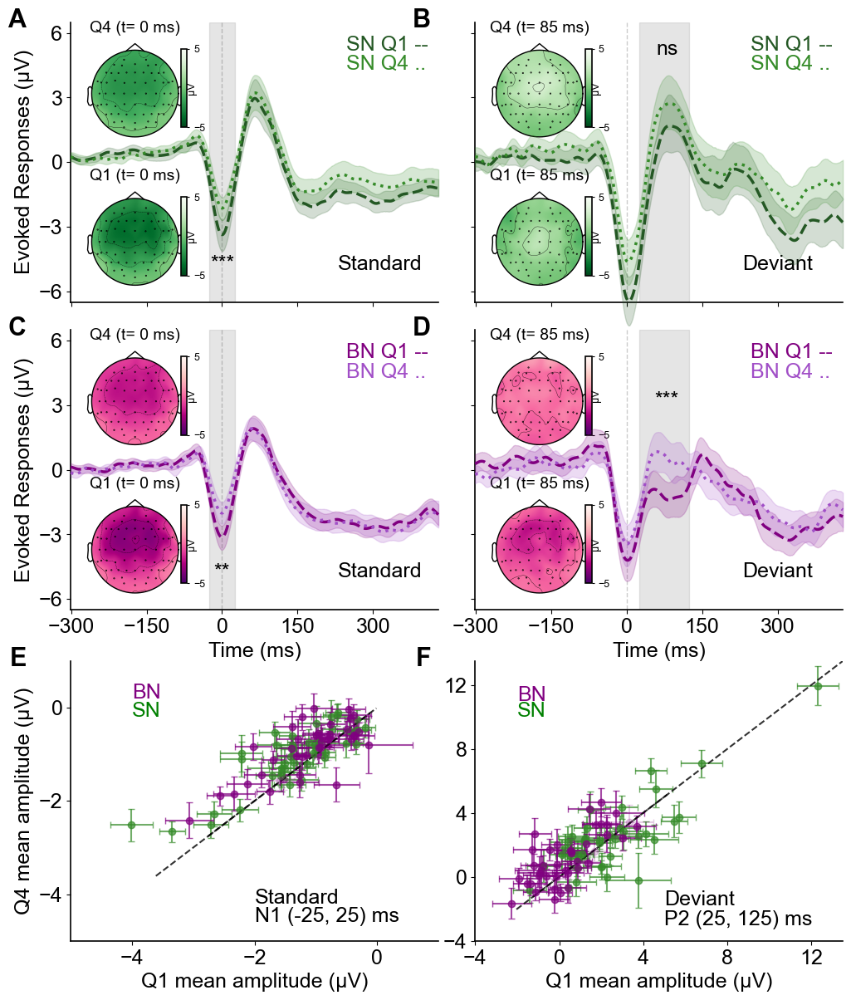

In [172]:
"""
FIGURE 2 — Q1 vs Q4 ERPs (SN/BN, standard/deviant) + topomaps + scatters.
PDF-safe version: every topomap inset AND its colorbar use the native
ax.inset_axes([x, y, w, h]) instead of mpl_toolkits.axes_grid1.inset_axes,
which mis-positioned in the vector (PDF) backend and dropped/scattered the
colorbars. Inset rectangles reproduce the original upper-left / lower-left
placement.

DEPENDENCIES (used verbatim): plot_erps, plot_q1_q4_scatter, mmn_filtered_df,
  SN_dev_quar_evoke_dict, BN_dev_quar_evoke_dict, SN_std_quar_evoke_dict,
  BN_std_quar_evoke_dict, results_n1_std, results_p2_dev.
"""

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import mne


# =========================================================================
# PDF-safe colorbar (native inset — tracks the head in PNG and PDF)
# =========================================================================
def add_topo_colorbar_close(ax_topo, cmap, vlim, ticks=None, label="µV"):
    cax = ax_topo.inset_axes([0.94, 0.10, 0.06, 0.80])   # [x, y, w, h]
    norm = mpl.colors.Normalize(*vlim)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cb = ax_topo.figure.colorbar(sm, cax=cax)
    cb.set_label(label, fontsize=9, labelpad=-16)
    cb.ax.tick_params(labelsize=9, length=2)
    if ticks is not None:
        cb.set_ticks(ticks)
    cax.set_facecolor("none")
    return cb


# native inset rectangles [x, y, w, h] reproducing the old loc placements
TOPO_TOP = [0.0, 0.59, 0.35, 0.35]   # was loc="upper left", bbox y -0.06
TOPO_BOT = [0.0, 0.06, 0.35, 0.35]   # was loc="lower left", bbox y +0.06


# =========================================================================
# DATA
# =========================================================================
time_range = (-0.300, 0.430)
mmn_subject = list(mmn_filtered_df.sub_id.unique())

sn_dev_q1_q4 = {
    'SN Q1': [SN_dev_quar_evoke_dict[s]["Q1"] for s in SN_dev_quar_evoke_dict if s in mmn_subject],
    'SN Q4': [SN_dev_quar_evoke_dict[s]["Q4"] for s in SN_dev_quar_evoke_dict if s in mmn_subject],
}
bn_dev_q1_q4 = {
    'BN Q1': [BN_dev_quar_evoke_dict[s]["Q1"] for s in BN_dev_quar_evoke_dict if s in mmn_subject],
    'BN Q4': [BN_dev_quar_evoke_dict[s]["Q4"] for s in BN_dev_quar_evoke_dict if s in mmn_subject],
}
sn_std_q1_q4 = {
    'SN Q1': [SN_std_quar_evoke_dict[s]["Q1"] for s in SN_std_quar_evoke_dict if s in mmn_subject],
    'SN Q4': [SN_std_quar_evoke_dict[s]["Q4"] for s in SN_std_quar_evoke_dict if s in mmn_subject],
}
bn_std_q1_q4 = {
    'BN Q1': [BN_std_quar_evoke_dict[s]["Q1"] for s in BN_std_quar_evoke_dict if s in mmn_subject],
    'BN Q4': [BN_std_quar_evoke_dict[s]["Q4"] for s in BN_std_quar_evoke_dict if s in mmn_subject],
}

# =========================================================================
# FIGURE & GRID
# =========================================================================
fig = plt.figure(figsize=(12, 14), dpi=100)
gs = gridspec.GridSpec(3, 2, height_ratios=[1, 1, 1], wspace=0.1, hspace=0.10)

ax_std_sn = fig.add_subplot(gs[0, 0])
ax_dev_sn = fig.add_subplot(gs[0, 1], sharey=ax_std_sn)
ax_std_bn = fig.add_subplot(gs[1, 0], sharex=ax_std_sn)
ax_dev_bn = fig.add_subplot(gs[1, 1], sharex=ax_dev_sn, sharey=ax_std_bn)
ax_std_scatter = fig.add_subplot(gs[2, 0])
ax_dev_scatter = fig.add_subplot(gs[2, 1])

styles_sn = {'SN Q1': dict(linewidth=2.5, linestyle='--', color="#245824"),
             'SN Q4': dict(linewidth=2.5, linestyle=':',  color="#358B29")}
styles_bn = {'BN Q1': dict(linewidth=2.5, linestyle='--', color="purple"),
             'BN Q4': dict(linewidth=2.5, linestyle=':',  color="#A14FC7")}

# =========================================================================
# ERP PANELS
# =========================================================================
# SN deviant (B)
plot_erps(sn_dev_q1_q4, picks=['Fz', 'Cz', 'FCz'], stylesdict=styles_sn,
          axs=ax_dev_sn, ylim=(-6.5, 6.5),
          text_labels=[(0.90, "SN Q1 --", "#245824"), (0.83, "SN Q4 ..", "#358B29")],
          time_range=time_range, ylabel="")
ax_dev_sn.text(230, -5, "Deviant", fontsize=18)
ax_dev_sn.text(80, 5, "ns", fontsize=18, ha="center")
ax_dev_sn.set_xlabel("")

vline_time = 125
ax_dev_sn.axvspan(25, vline_time, color='gray', alpha=0.2)
ax_dev_bn.axvspan(25, vline_time, color='gray', alpha=0.2)
ax_std_sn.axvspan(-25, 25, color='gray', alpha=0.2)
ax_std_bn.axvspan(-25, 25, color='gray', alpha=0.2)

# SN standard (A)
plot_erps(sn_std_q1_q4, picks=['Fz', 'Cz', 'FCz'], stylesdict=styles_sn, axs=ax_std_sn,
          ylim=(-6.5, 6.5),
          text_labels=[(0.90, "SN Q1 --", "#245824"), (0.83, "SN Q4 ..", "#358B29")],
          time_range=time_range)
ax_std_sn.text(230, -5, "Standard", fontsize=18)
ax_std_sn.text(0, -5, "***", fontsize=18, ha="center")
ax_std_sn.set_xlabel("")

# BN deviant (D)
plot_erps(bn_dev_q1_q4, picks=['Fz', 'Cz', 'FCz'], stylesdict=styles_bn, axs=ax_dev_bn,
          ylim=(-6.5, 6.5),
          text_labels=[(0.90, "BN Q1 --", "purple"), (0.83, "BN Q4 ..", "#A14FC7")],
          time_range=time_range, ylabel="")
ax_dev_bn.text(230, -5, "Deviant", fontsize=18)
ax_dev_bn.text(80, 3, "***", fontsize=18, ha="center")

# BN standard (C)
plot_erps(bn_std_q1_q4, picks=['Fz', 'Cz', 'FCz'], stylesdict=styles_bn, axs=ax_std_bn,
          ylim=(-6.5, 6.5),
          text_labels=[(0.90, "BN Q1 --", "purple"), (0.83, "BN Q4 ..", "#A14FC7")],
          time_range=time_range)
ax_std_bn.text(230, -5, "Standard", fontsize=18)
ax_std_bn.text(0, -5, "**", fontsize=18, ha="center")

# =========================================================================
# SCATTERS
# =========================================================================
sn_twma_std = results_n1_std["sn"]["TWMA"]
bn_twma_std = results_n1_std["bn"]["TWMA"]

plot_q1_q4_scatter(ax=ax_std_scatter, mean_q1=sn_twma_std["mean_q1"]["TWMA"],
                   mean_q4=sn_twma_std["mean_q4"]["TWMA"],
                   sem_q1=sn_twma_std["sem_q1"], sem_q4=sn_twma_std["sem_q4"],
                   significance=sn_twma_std["mean_q1"]["TWMA_significance"],
                   color="#358B29", metric="TWMA", axlim=[-5, 1], show_stats=False)
plot_q1_q4_scatter(ax=ax_std_scatter, mean_q1=bn_twma_std["mean_q1"]["TWMA"],
                   mean_q4=bn_twma_std["mean_q4"]["TWMA"],
                   sem_q1=bn_twma_std["sem_q1"], sem_q4=bn_twma_std["sem_q4"],
                   significance=bn_twma_std["mean_q1"]["TWMA_significance"], axlim=[-5, 1],
                   color="purple", show_stats=False)
ax_std_scatter.text(-2., -4.2, "Standard", fontsize=18)
ax_std_scatter.text(-2., -4.6, "N1 (-25, 25) ms", fontsize=18)
ax_std_scatter.text(-4, -.200, "SN", fontsize=18, c='green')
ax_std_scatter.text(-4, .20, "BN", fontsize=18, c='purple')
ax_std_scatter.set_ylabel("Q4 mean amplitude (µV)")
ax_std_scatter.set_xlabel("Q1 mean amplitude (µV)")

sn_twma_dev = results_p2_dev["sn"]["TWMA"]
bn_twma_dev = results_p2_dev["bn"]["TWMA"]

plot_q1_q4_scatter(ax=ax_dev_scatter, mean_q1=sn_twma_dev["mean_q1"]["TWMA"],
                   mean_q4=sn_twma_dev["mean_q4"]["TWMA"],
                   sem_q1=sn_twma_dev["sem_q1"], sem_q4=sn_twma_dev["sem_q4"],
                   significance=sn_twma_dev["mean_q1"]["TWMA_significance"],
                   color="#358B29", metric="TWMA", axlim=[-4, 13.5], show_stats=False)
plot_q1_q4_scatter(ax=ax_dev_scatter, mean_q1=bn_twma_dev["mean_q1"]["TWMA"],
                   mean_q4=bn_twma_dev["mean_q4"]["TWMA"],
                   sem_q1=bn_twma_dev["sem_q1"], sem_q4=bn_twma_dev["sem_q4"],
                   significance=bn_twma_dev["mean_q1"]["TWMA_significance"], axlim=[-4, 13.5],
                   color="purple", show_stats=False)
ax_dev_scatter.text(5.0, -1.8, "Deviant", fontsize=18)
ax_dev_scatter.text(5.0, -3.0, 'P2 (25, 125) ms', fontsize=18)
ax_dev_scatter.text(-2, 10, "SN", fontsize=18, c='green')
ax_dev_scatter.text(-2, 11, "BN", fontsize=18, c='purple')

for ax in [ax_dev_sn, ax_std_sn, ax_dev_bn, ax_std_bn, ax_dev_scatter, ax_std_scatter]:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=5, integer=True))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(nbins=5, integer=True))

ax_dev_scatter.set_ylabel("")
ax_dev_scatter.set_xlabel("Q1 mean amplitude (µV)")

# =========================================================================
# TOPOMAP INSETS  (native ax.inset_axes — PDF-safe)
# =========================================================================
topo_tr = (-0.200, 0.350)
vlim = (-5, 5)
sn_cmap, bn_cmap = "Greens_r", "RdPu_r"


def add_topo_pair(parent_ax, q1q4_dict, t, cmap, ttl):
    """Q4 (top-left) and Q1 (bottom-left) topomaps inside parent_ax."""
    sub = {c: [e.copy().crop(*topo_tr) for e in q1q4_dict[c]] for c in q1q4_dict}
    q4_key = [k for k in q1q4_dict if "Q4" in k][0]
    q1_key = [k for k in q1q4_dict if "Q1" in k][0]

    ax_q4 = parent_ax.inset_axes(TOPO_TOP)
    mne.grand_average(sub[q4_key]).plot_topomap(
        times=[t], axes=ax_q4, vlim=vlim, cmap=cmap, colorbar=False, show=False)
    ax_q4.set_title(f"Q4 (t= {t*1000:.0f} ms)", fontsize=14)
    ax_q4.patch.set_alpha(0); ax_q4.set_facecolor("none")
    add_topo_colorbar_close(ax_q4, cmap=cmap, vlim=vlim, ticks=vlim)

    ax_q1 = parent_ax.inset_axes(TOPO_BOT)
    mne.grand_average(sub[q1_key]).plot_topomap(
        times=[t], axes=ax_q1, vlim=vlim, cmap=cmap, colorbar=False, show=False)
    ax_q1.set_title(f"Q1 (t= {t*1000:.0f} ms)", fontsize=14)
    ax_q1.patch.set_alpha(0); ax_q1.set_facecolor("none")
    add_topo_colorbar_close(ax_q1, cmap=cmap, vlim=vlim, ticks=vlim)


add_topo_pair(ax_std_sn, sn_std_q1_q4, 0.000, sn_cmap, "SN std")   # t = 0 ms
add_topo_pair(ax_std_bn, bn_std_q1_q4, 0.000, bn_cmap, "BN std")
add_topo_pair(ax_dev_sn, sn_dev_q1_q4, 0.085, sn_cmap, "SN dev")   # t = 85 ms
add_topo_pair(ax_dev_bn, bn_dev_q1_q4, 0.085, bn_cmap, "BN dev")

# =========================================================================
# LAYOUT TWEAKS
# =========================================================================
# nudge the scatter row down slightly (explicit positioning -> PDF-stable)
for ax in [ax_std_scatter, ax_dev_scatter]:
    pos = ax.get_position()
    ax.set_position([pos.x0, pos.y0 - 0.02, pos.width, pos.height])

for ax in [ax_std_sn, ax_dev_sn]:       # hide x labels on top ERP row
    ax.tick_params(labelbottom=False)
for ax in [ax_dev_sn, ax_dev_bn]:       # hide y labels on deviant column
    ax.tick_params(labelleft=False)

fig.patch.set_alpha(0)
for ax in fig.get_axes():
    ax.set_facecolor('none')

# =========================================================================
# PANEL LETTERS A–F
# =========================================================================
panel_axes = [(ax_std_sn, 'A'), (ax_dev_sn, 'B'),
              (ax_std_bn, 'C'), (ax_dev_bn, 'D'),
              (ax_std_scatter, 'E'), (ax_dev_scatter, 'F')]
for ax, letter in panel_axes:
    ax.text(-0.12, 1.05, letter, transform=ax.transAxes,
            fontsize=22, fontweight='bold', va='top', ha='right')

# =========================================================================
# EXPORT  (no tight_layout: positions are explicit, keeps PNG == PDF)
# =========================================================================
fig.savefig("Figure_2.pdf")            # vector for submission
fig.savefig("Figure_2.png", dpi=300)   # raster preview
plt.show()

Identifying common channels ...


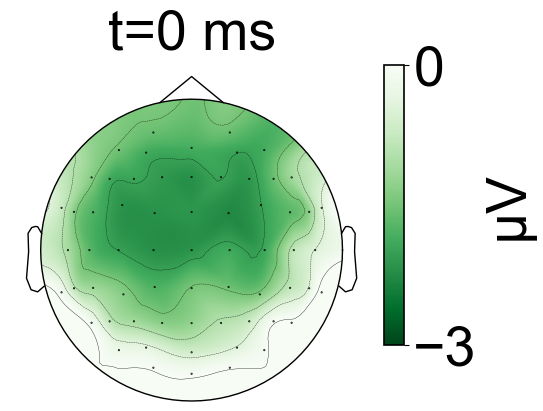

Identifying common channels ...


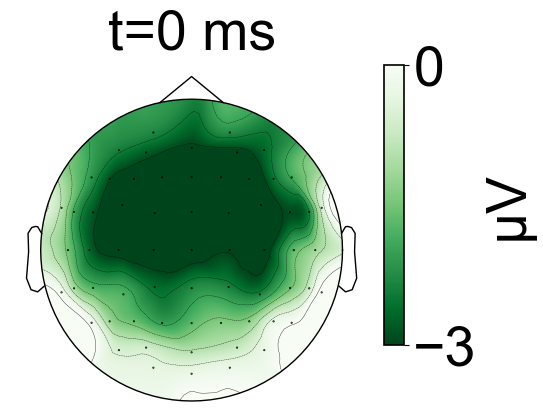

In [173]:

# TOPO MAP with all electrodes 
import matplotlib.pyplot as plt
import matplotlib as mpl
# Define time points
time_points = [0]

# Set the color scale range
vlim = (-3, 0)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None
time_range=(-.200,.350)
evokeds_subset = {}
for cond in sn_std_q1_q4:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in sn_std_q1_q4[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['SN Q4']).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='Greens_r',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15, 0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Greens_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40)  # Adjust fontsize here
cbar.set_ticks([-3, 0])
# Add row labels
#fig.text(0.0001, 0.5, 'PS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()
fig, axes = plt.subplots(1, len(time_points), figsize=(4, 4), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["SN Q1"]).copy().plot_topomap(
        times=[time], axes=axes, colorbar=False, vlim=vlim, show=False,cmap='Greens_r',
    )
    axes.set_title(f"t={time * 1000:.0f} ms",fontsize=40)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.98, 0.15,  0.05, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['Greens_r']  # Choose a colormap (like 'RdBu_r')

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='')
cbar.ax.tick_params(labelsize=40)
# Set the font size of the colorbar label
cbar.set_label('µV', fontsize=40)  # Adjust fontsize here
cbar.set_ticks([-3, 0])

# Add row labels
#fig.text(0.0001, 0.5, 'NPS MMN', fontsize=28, rotation=90, va='center')

fig.patch.set_alpha(0)     
axes.patch.set_alpha(0)    

plt.show()